<a href="https://colab.research.google.com/github/firdyannnn/Deep-Learning-Lanjut/blob/main/Tugas%20Deep%20Learning%20Lanjut_Model_DCGAN_Pertemuan%205.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Konfigurasi agar GPU digunakan secara efisien
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU Terdeteksi: ", physical_devices[0])
else:
    print("Peringatan: GPU tidak terdeteksi. Training akan lambat.")

GPU Terdeteksi:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [2]:
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
# IMPORTANT: Make sure you have uploaded kaggle.json to your Colab session's /content/ directory first.
# If you uploaded it somewhere else, adjust the source path accordingly.
!mv /content/kaggle.json ~/.kaggle/

# Set read-only permissions for the kaggle.json file for security
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API credentials set up successfully!")

Kaggle API credentials set up successfully!


In [3]:
# Install kaggle if not already installed
!pip install -q kaggle

# Make sure your Kaggle API credentials (kaggle.json) are set up in ~/.kaggle/
# If you haven't done this, please refer to the previous instructions.

# Download the dataset
!kaggle datasets download -d joosthazelzet/lego-brick-images

# Unzip the downloaded dataset to the specified directory
# The zip file will be downloaded to the current working directory (/content/)
!unzip -q /content/lego-brick-images.zip -d /content/dataset/

# Clean up the zip file after extraction
!rm /content/lego-brick-images.zip

print("Dataset downloaded and extracted to /content/dataset/")

Dataset URL: https://www.kaggle.com/datasets/joosthazelzet/lego-brick-images
License(s): GPL-2.0
 98% 0.98G/1.00G [00:06<00:00, 121MB/s]
100% 1.00G/1.00G [00:07<00:00, 153MB/s]
Dataset downloaded and extracted to /content/dataset/


In [4]:
# Parameter Konfigurasi
BATCH_SIZE = 64
IMG_HEIGHT = 64  # Menggunakan 64x64 agar detail LEGO cukup terlihat
IMG_WIDTH = 64
CHANNELS = 3     # RGB


# --- OPSI B: Membuat Dataset Loader ---
# Ganti 'path/to/images' dengan path folder dataset Anda
dataset_dir = '/content/dataset/LEGO brick images v1'

# Jika folder kosong/tidak ada, kita buat dummy data agar kode tetap jalan (untuk testing)
if not os.path.exists(dataset_dir) or not os.listdir(dataset_dir):
    print("Dataset tidak ditemukan. Membuat data dummy untuk demonstrasi struktur kode.")
    os.makedirs(dataset_dir, exist_ok=True)
    # Membuat 100 gambar random noise sebagai placeholder
    for i in range(100):
        img = np.random.randint(0, 255, (64, 64, 3), dtype=np.uint8)
        tf.keras.utils.save_img(f"{dataset_dir}/dummy_{i}.png", img)

# Memuat dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_dir,
    label_mode=None, # Kita tidak butuh label untuk GAN
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE
)

# Normalisasi ke [-1, 1]
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)

# Optimasi performa (Caching & Prefetching)
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 6379 files.


In [5]:
latent_dim = 128

def build_generator():
    model = keras.Sequential(name="generator")

    # Input: Latent Vector
    # Mulai dengan dense layer yang cukup besar untuk di-reshape
    # Kita ingin mulai dari ukuran 8x8 dengan 512 filter
    model.add(layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Reshape menjadi tensor 3D
    model.add(layers.Reshape((8, 8, 512)))

    # Upsampling 1: 8x8 -> 16x16
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 2: 16x16 -> 32x32
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 3: 32x32 -> 64x64
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Output Layer: 64x64 -> 64x64x3 (RGB)
    # Aktivasi TANH penting agar output di range [-1, 1]
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding='same', activation='tanh'))

    return model

def build_discriminator():
    model = keras.Sequential(name="discriminator")

    # Input: Gambar 64x64x3
    # Downsampling 1: 64 -> 32
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 2: 32 -> 16
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 3: 16 -> 8
    model.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # Output berupa logit (skor real/fake)

    return model

# Inisialisasi Model
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
# discriminator.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32768)          │     4,194,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 3)      │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,081,411 (27.01 MB)

 Trainable params: 7,014,979 (26.76 MB)

 Non-trainable params: 66,432 (259.50 KB)

In [6]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        # Metric trackers
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # 1. Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 2. Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # 3. Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # 4. Assemble labels discriminating real from fake images
        # Label 1 untuk fake, 0 untuk real (atau sebaliknya, teknik ini menggunakan label smoothing)
        # Di sini kita pakai standar: 1=Real, 0=Fake.
        # Namun, karena kita concat [Fake, Real], maka labelnya: [0...0, 1...1]
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Tambahkan sedikit noise pada label (Label Smoothing) untuk stabilitas
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # 5. Train the Discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)

        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # 6. Sample random points in the latent space (lagi, untuk Generator)
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 7. Assemble labels that say "all real images" (We want to fool the discriminator)
        misleading_labels = tf.ones((batch_size, 1))

        # 8. Train the Generator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [7]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 127.5
        generated_images += 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 4))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show() # Tampilkan inline di Colab

        # Opsional: Simpan ke file
        # plt.savefig(f"generated_lego_epoch_{epoch}.png")
        # plt.close()

Mulai Training...
Epoch 1/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - d_loss: 0.5007 - g_loss: 0.7091

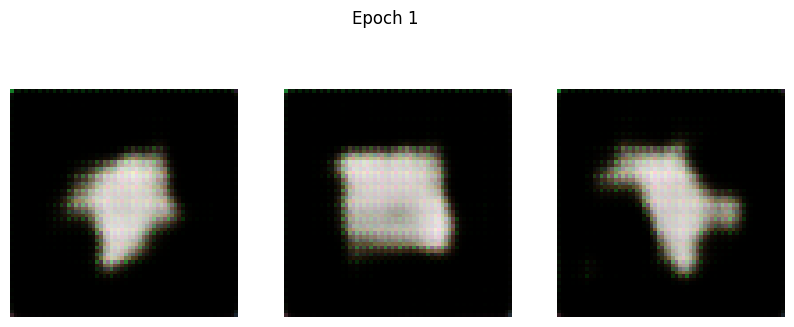

100/100 ━━━━━━━━━━━━━━━━━━━━ 47s 214ms/step - d_loss: 0.5013 - g_loss: 0.7092
Epoch 2/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6737 - g_loss: 0.7075

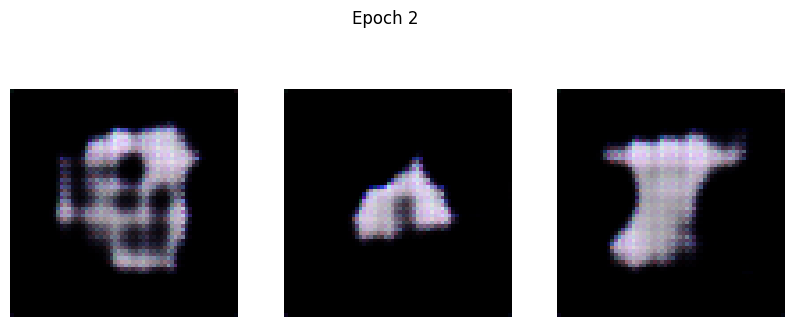

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.6737 - g_loss: 0.7075
Epoch 3/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.6795 - g_loss: 0.7154

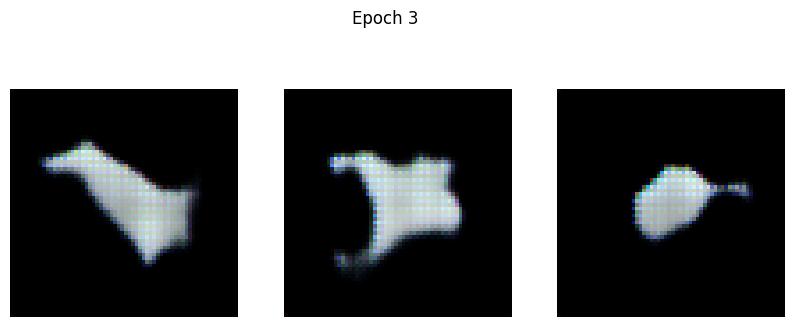

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.6795 - g_loss: 0.7154
Epoch 4/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.6633 - g_loss: 0.7439

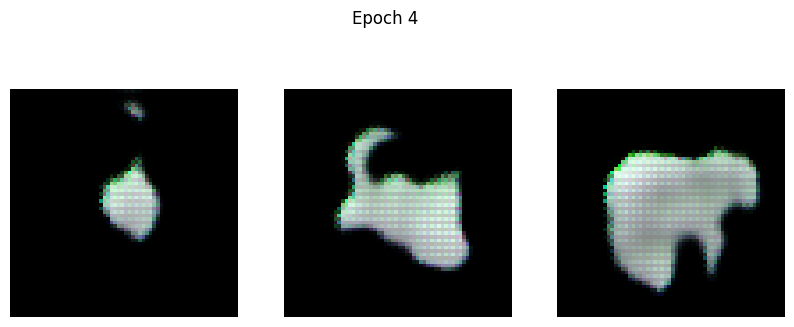

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.6633 - g_loss: 0.7439
Epoch 5/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: 0.6558 - g_loss: 0.7922

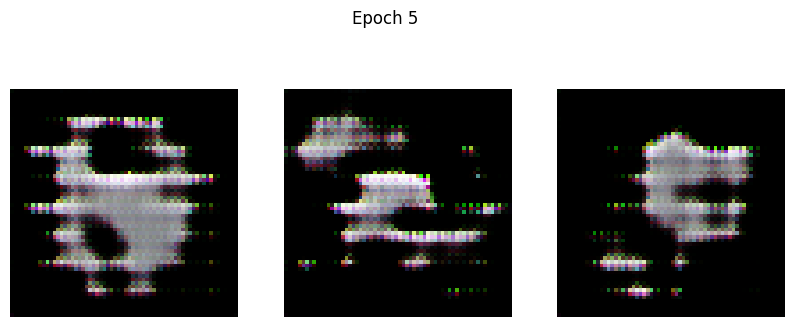

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.6558 - g_loss: 0.7923
Epoch 6/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: 0.6532 - g_loss: 0.8180

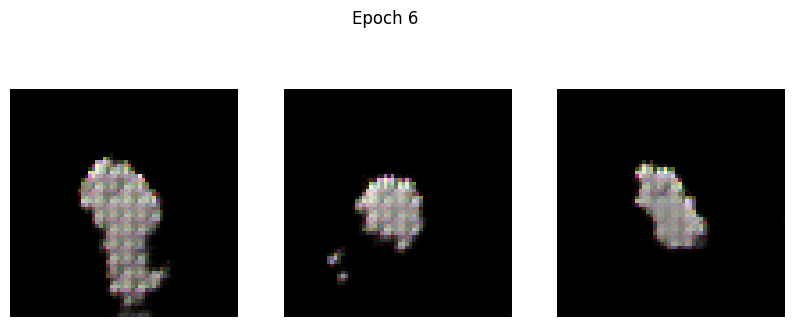

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: 0.6532 - g_loss: 0.8179
Epoch 7/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.6524 - g_loss: 0.8628

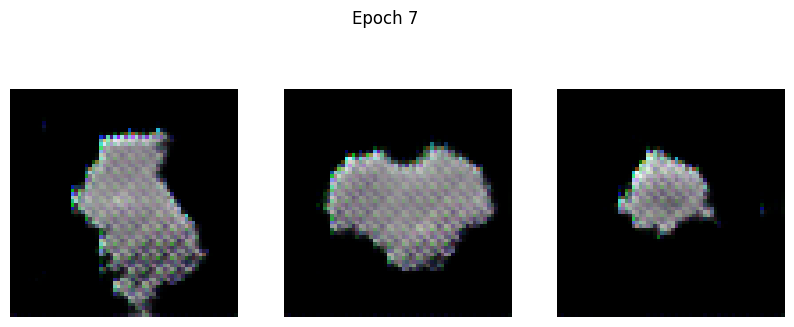

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.6523 - g_loss: 0.8628
Epoch 8/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.6646 - g_loss: 0.7774

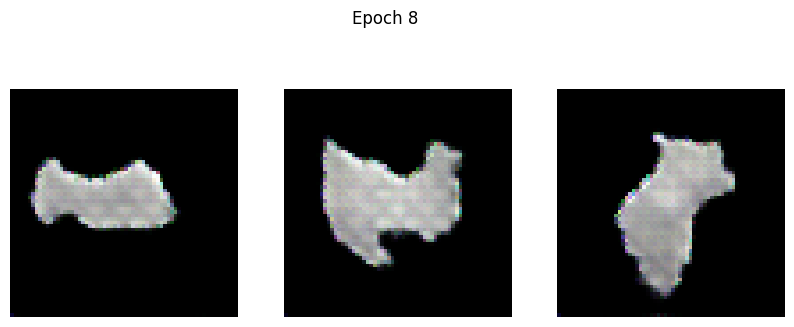

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.6646 - g_loss: 0.7773
Epoch 9/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.6590 - g_loss: 0.7413

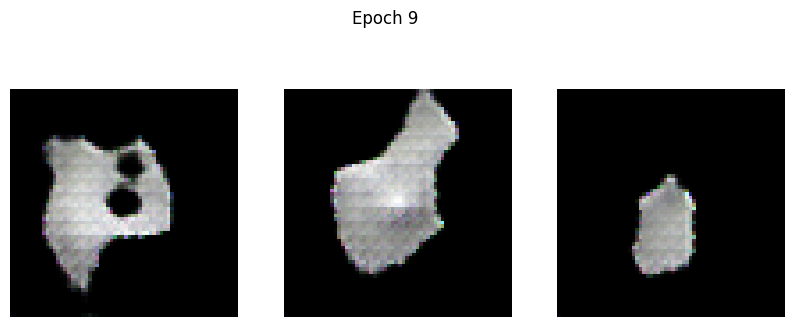

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.6590 - g_loss: 0.7412
Epoch 10/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.6611 - g_loss: 0.7550

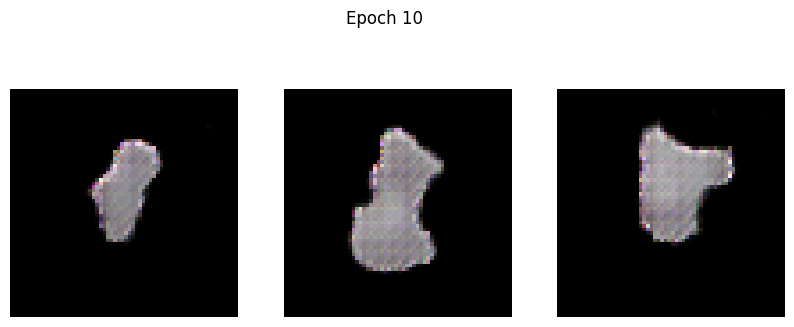

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.6611 - g_loss: 0.7549
Epoch 11/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.6581 - g_loss: 0.7473

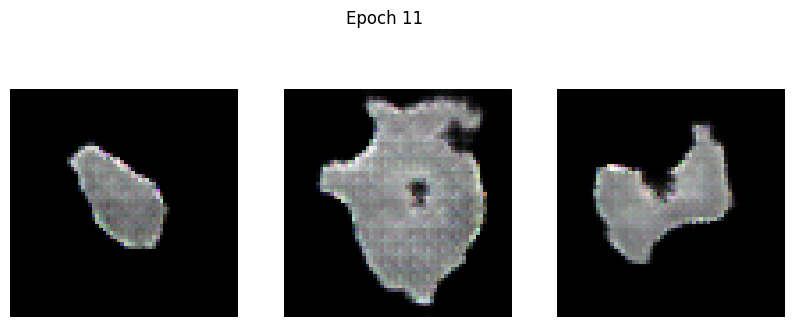

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.6581 - g_loss: 0.7472
Epoch 12/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.6540 - g_loss: 0.7675

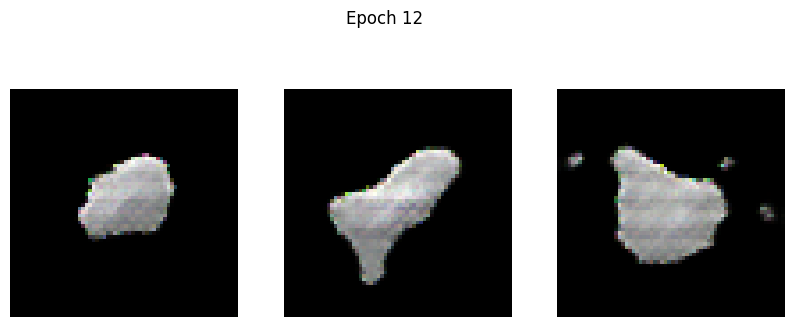

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - d_loss: 0.6540 - g_loss: 0.7676
Epoch 13/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.6418 - g_loss: 0.8069

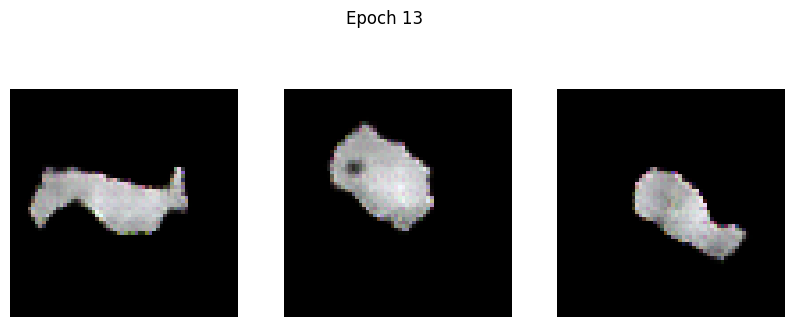

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.6418 - g_loss: 0.8071
Epoch 14/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.6324 - g_loss: 0.8160

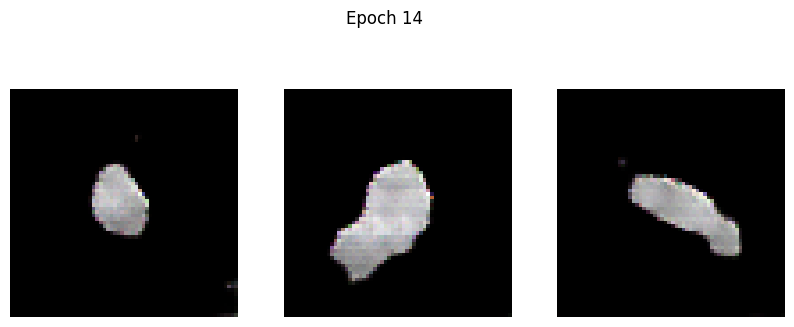

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.6324 - g_loss: 0.8161
Epoch 15/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.6228 - g_loss: 0.8465

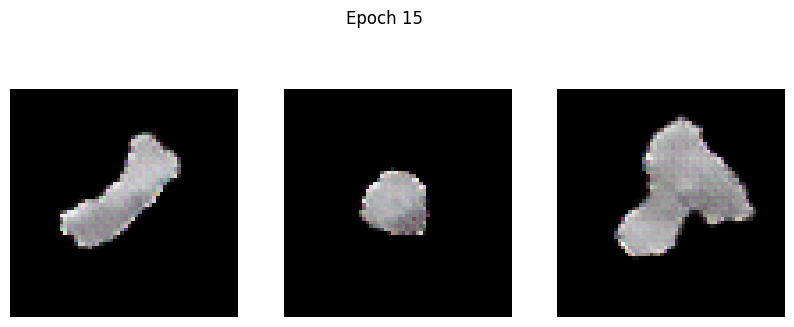

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.6228 - g_loss: 0.8465
Epoch 16/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.6110 - g_loss: 0.8581

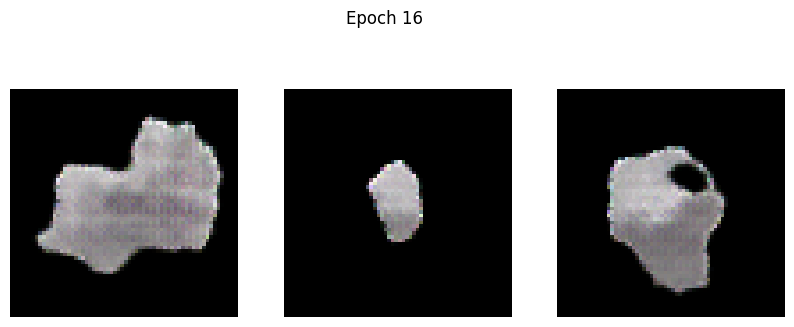

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.6109 - g_loss: 0.8581
Epoch 17/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.5910 - g_loss: 0.8996

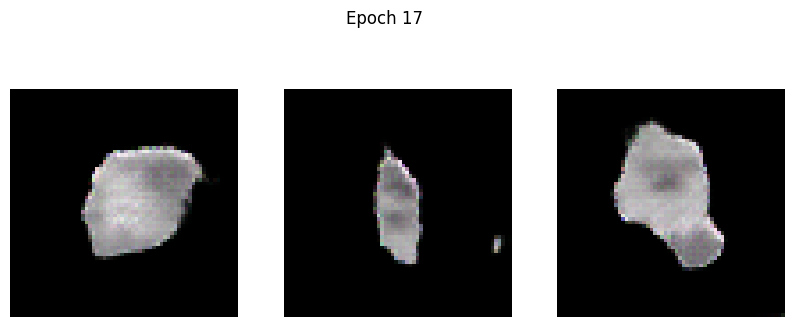

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.5910 - g_loss: 0.8998
Epoch 18/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.5814 - g_loss: 0.9202

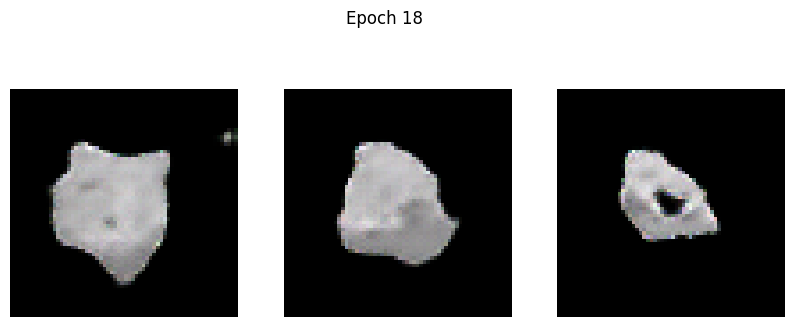

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.5814 - g_loss: 0.9201
Epoch 19/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.5697 - g_loss: 0.9812

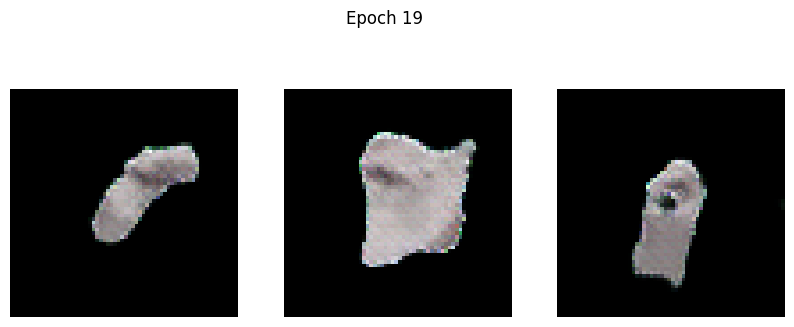

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.5697 - g_loss: 0.9812
Epoch 20/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.5590 - g_loss: 0.9791

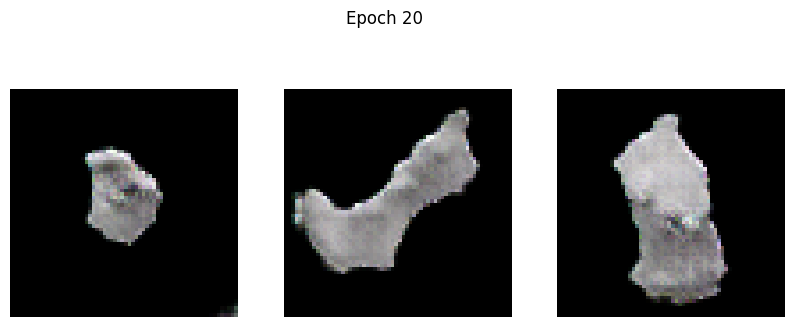

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.5590 - g_loss: 0.9796
Epoch 21/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.5376 - g_loss: 1.0237

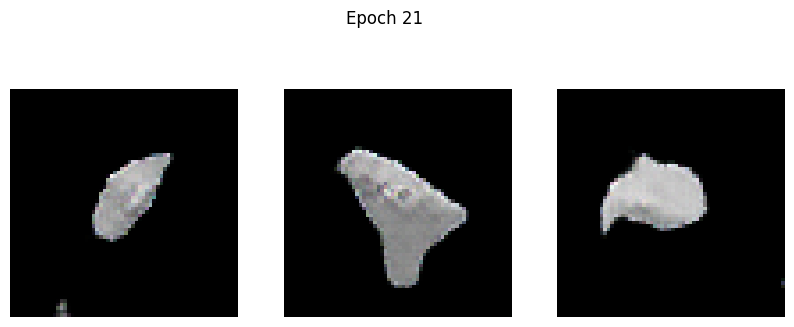

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.5376 - g_loss: 1.0239
Epoch 22/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.5310 - g_loss: 1.0786

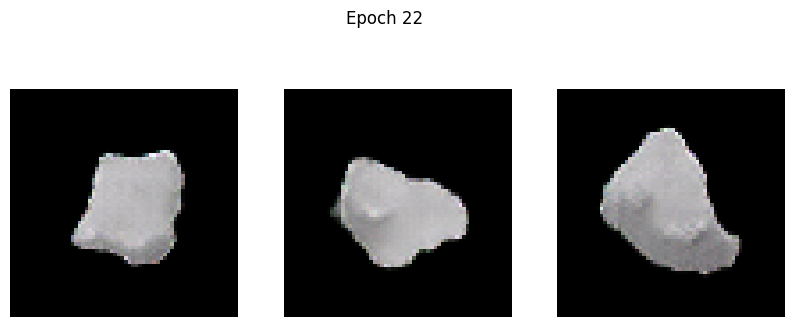

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.5310 - g_loss: 1.0786
Epoch 23/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.5095 - g_loss: 1.0972

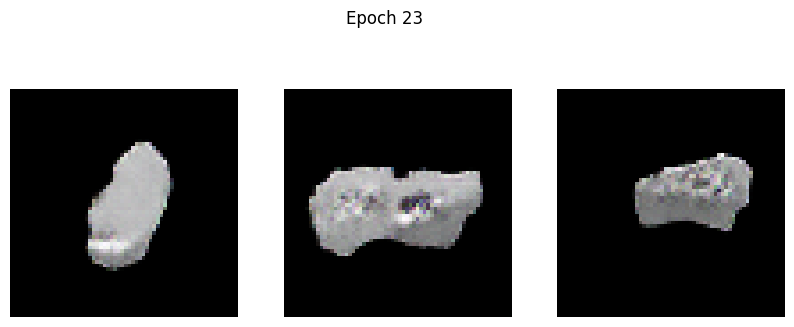

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.5096 - g_loss: 1.0973
Epoch 24/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4909 - g_loss: 1.1278

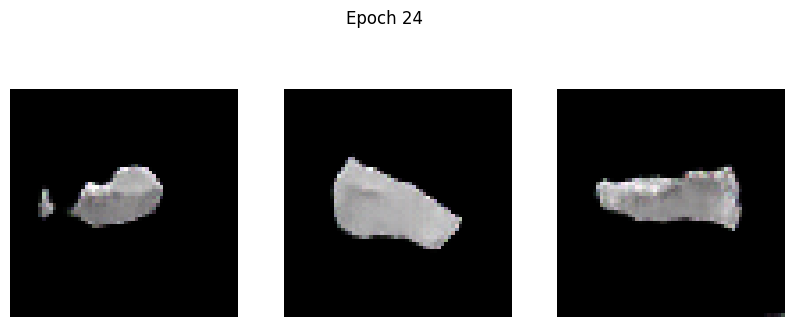

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.4910 - g_loss: 1.1281
Epoch 25/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4910 - g_loss: 1.1624

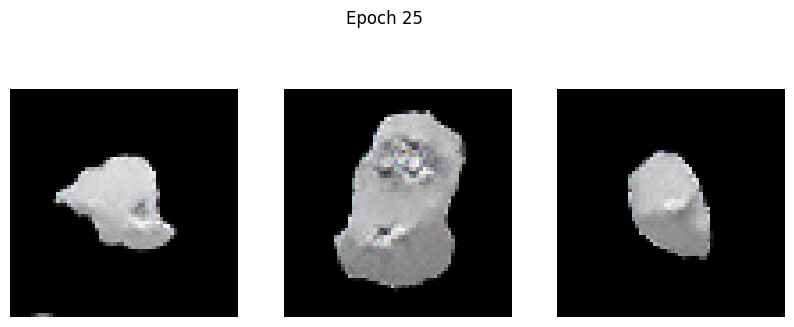

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4910 - g_loss: 1.1626
Epoch 26/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4876 - g_loss: 1.2379

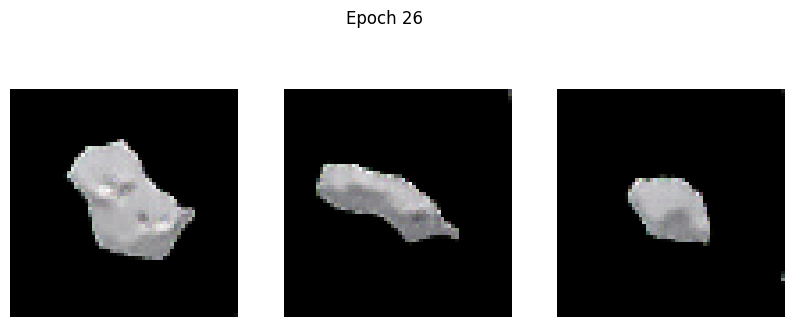

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4876 - g_loss: 1.2379
Epoch 27/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4599 - g_loss: 1.2473

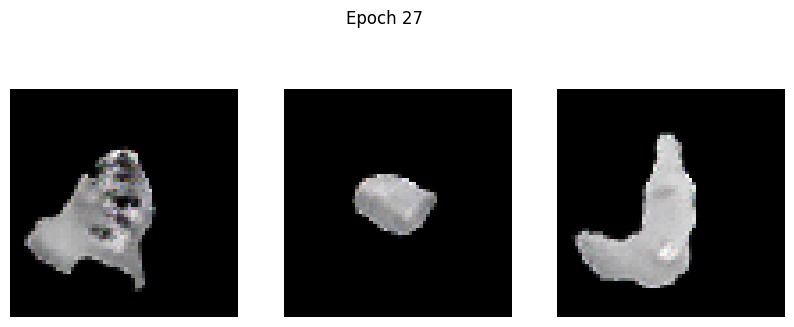

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4600 - g_loss: 1.2477
Epoch 28/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4725 - g_loss: 1.2913

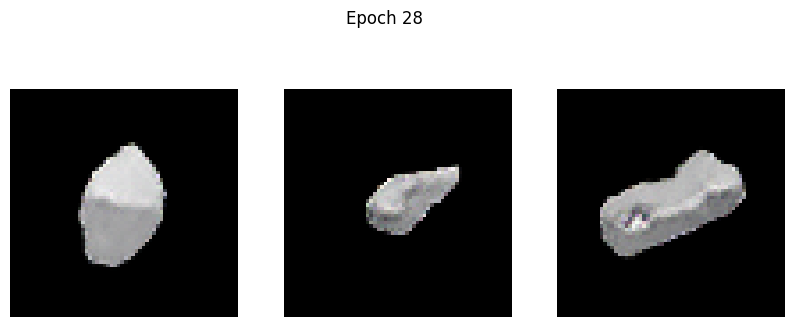

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.4725 - g_loss: 1.2912
Epoch 29/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4380 - g_loss: 1.3101

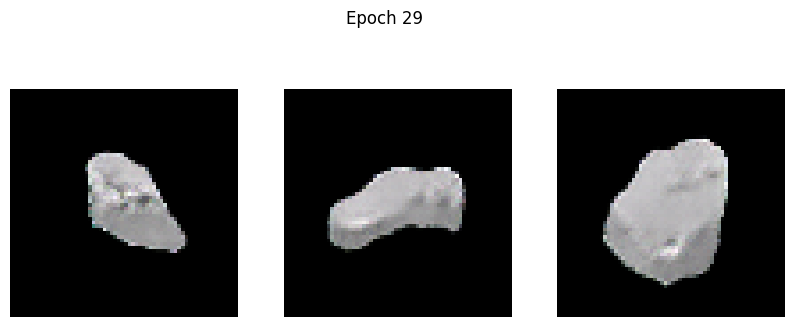

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.4379 - g_loss: 1.3105
Epoch 30/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4524 - g_loss: 1.4220

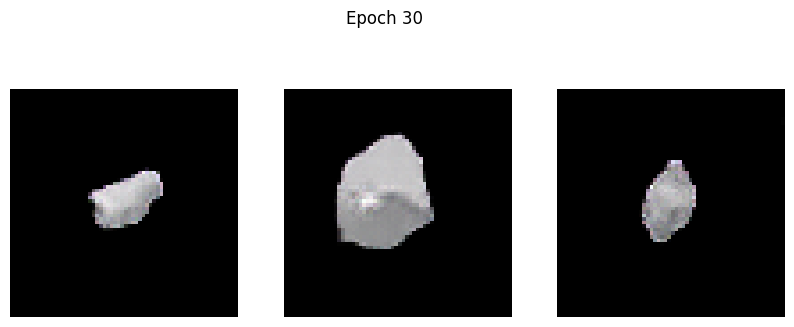

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.4522 - g_loss: 1.4224
Epoch 31/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.8121 - g_loss: 1.7114

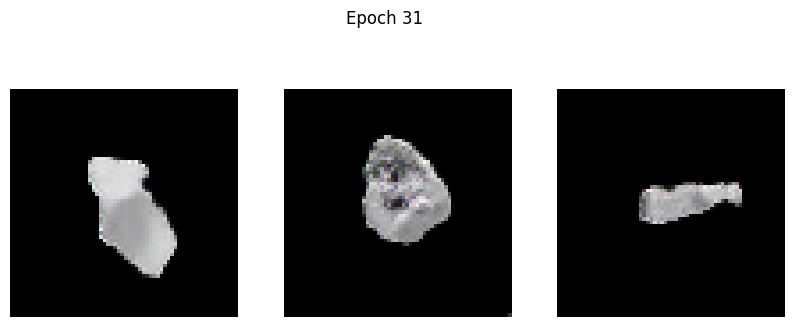

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.8095 - g_loss: 1.7084
Epoch 32/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4177 - g_loss: 1.3329

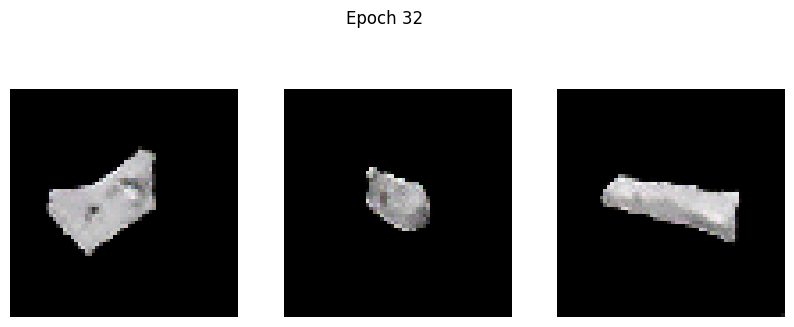

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.4177 - g_loss: 1.3332
Epoch 33/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3896 - g_loss: 1.4314

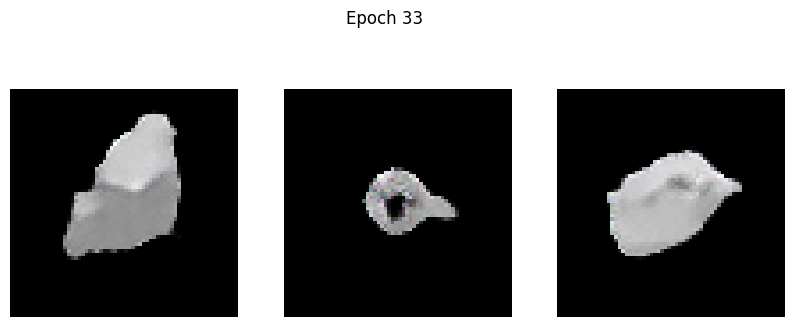

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3897 - g_loss: 1.4315
Epoch 34/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4214 - g_loss: 1.5371

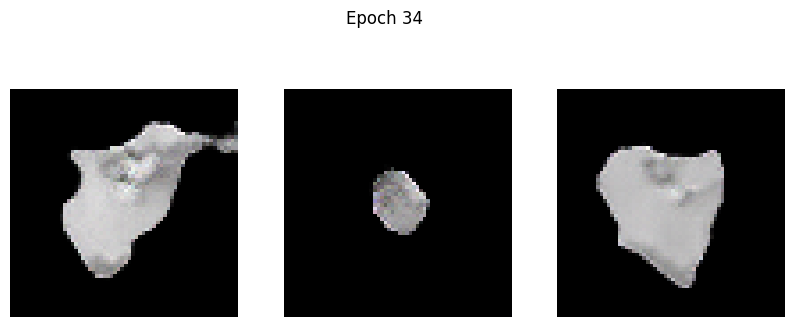

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4213 - g_loss: 1.5368
Epoch 35/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4197 - g_loss: 1.5853

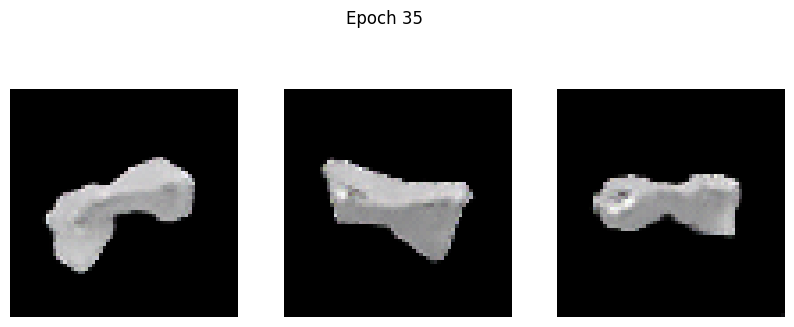

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4196 - g_loss: 1.5847
Epoch 36/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3804 - g_loss: 1.5234

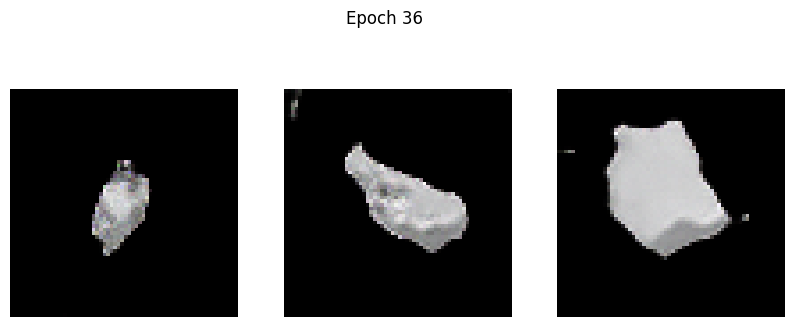

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3804 - g_loss: 1.5235
Epoch 37/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3567 - g_loss: 1.5526

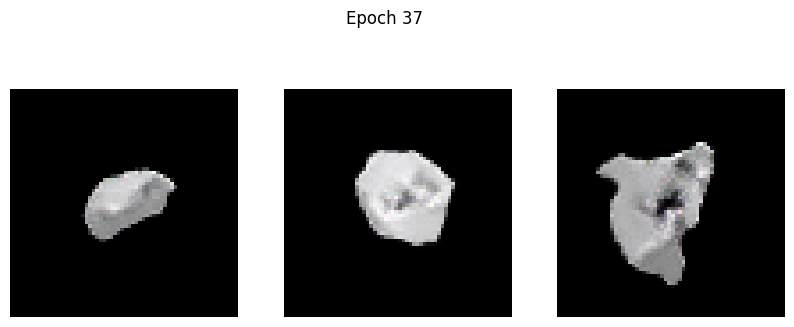

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3569 - g_loss: 1.5528
Epoch 38/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.4328 - g_loss: 1.6191

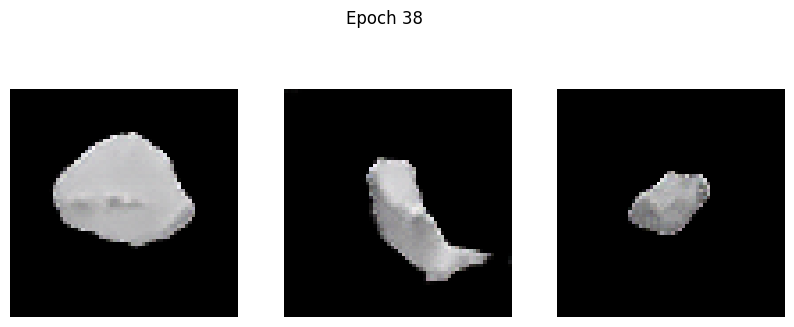

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4333 - g_loss: 1.6187
Epoch 39/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3583 - g_loss: 1.4834

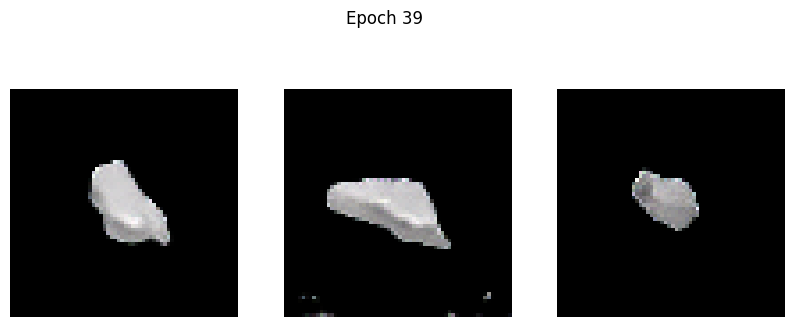

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3582 - g_loss: 1.4836
Epoch 40/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3472 - g_loss: 1.6115

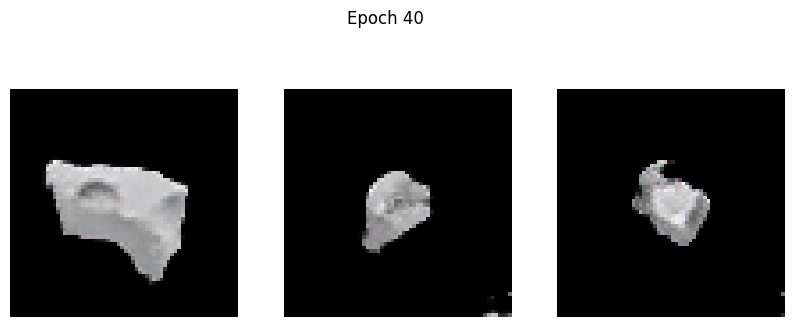

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3472 - g_loss: 1.6117
Epoch 41/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3873 - g_loss: 1.6564

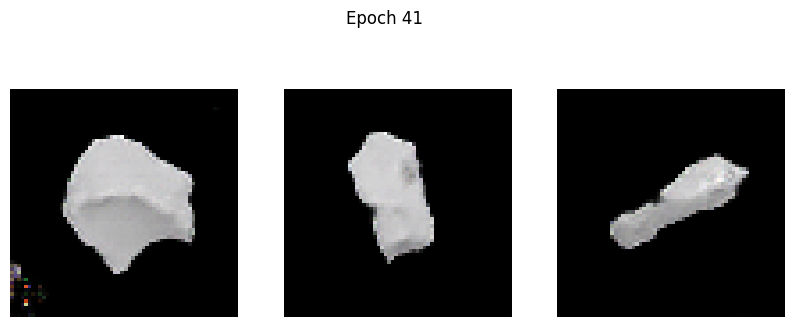

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3872 - g_loss: 1.6564
Epoch 42/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.3624 - g_loss: 1.6998

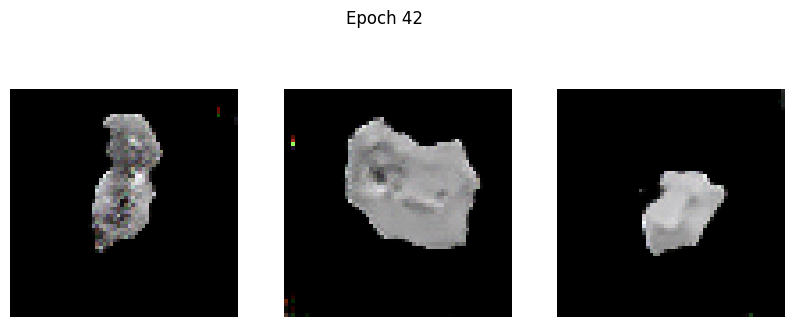

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.3625 - g_loss: 1.6997
Epoch 43/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4078 - g_loss: 1.6840

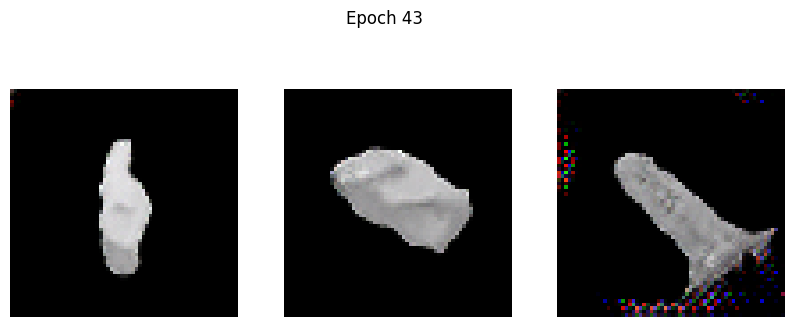

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.4078 - g_loss: 1.6838
Epoch 44/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3495 - g_loss: 1.6374

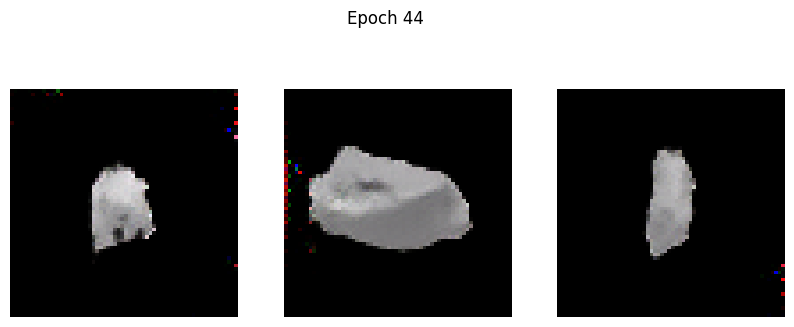

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3497 - g_loss: 1.6377
Epoch 45/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3570 - g_loss: 1.6707

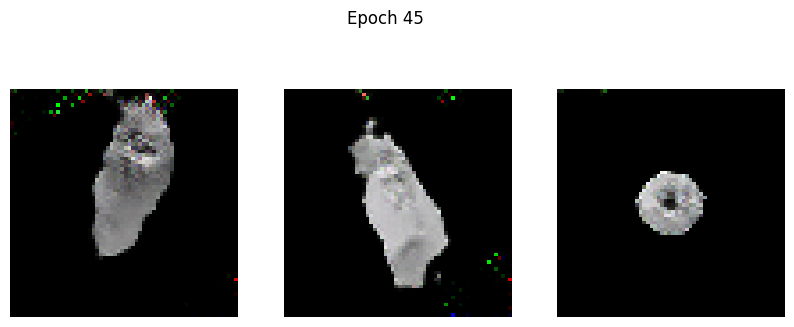

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3571 - g_loss: 1.6704
Epoch 46/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3676 - g_loss: 1.7090

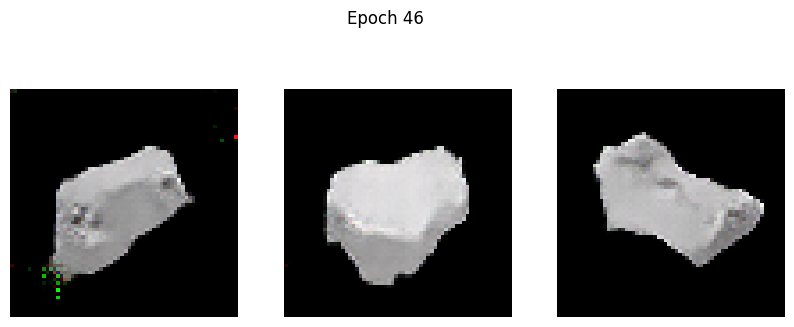

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3675 - g_loss: 1.7090
Epoch 47/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3529 - g_loss: 1.7337

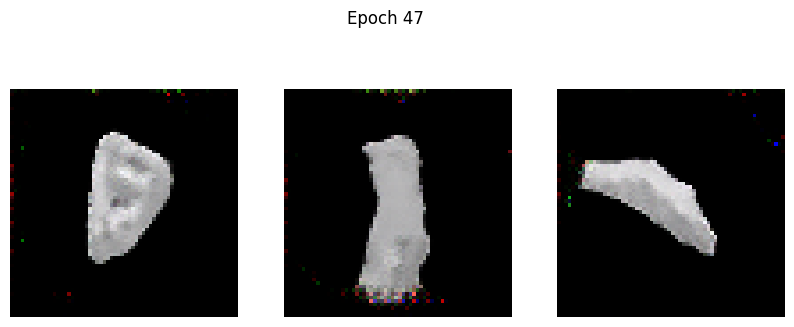

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3533 - g_loss: 1.7349
Epoch 48/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3304 - g_loss: 1.6681

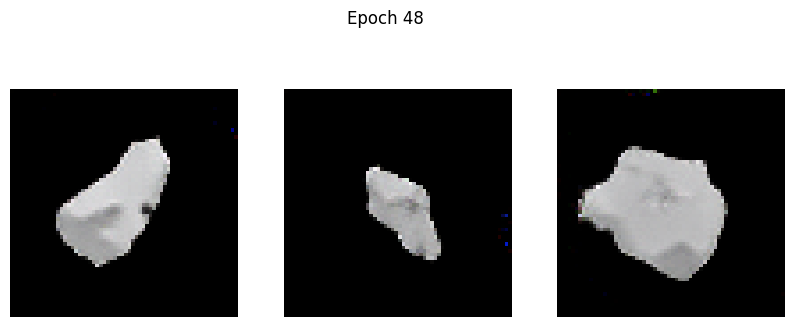

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3305 - g_loss: 1.6680
Epoch 49/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3422 - g_loss: 1.7406

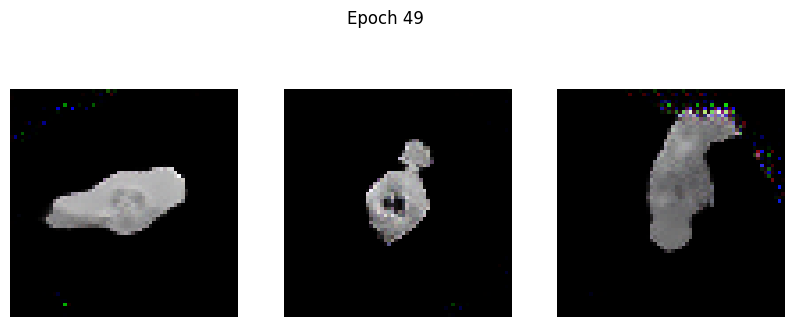

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3423 - g_loss: 1.7409
Epoch 50/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3652 - g_loss: 1.7445

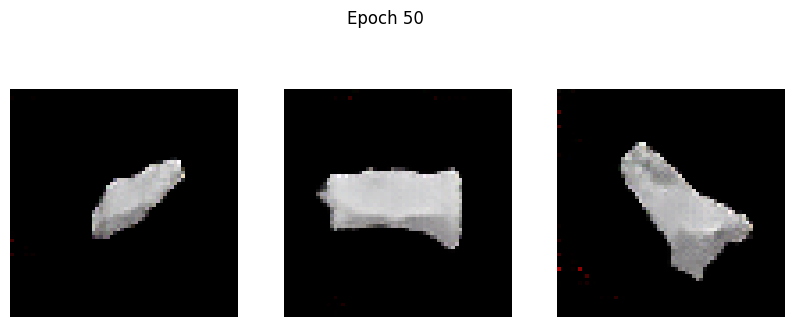

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3656 - g_loss: 1.7456
Epoch 51/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3301 - g_loss: 1.6887

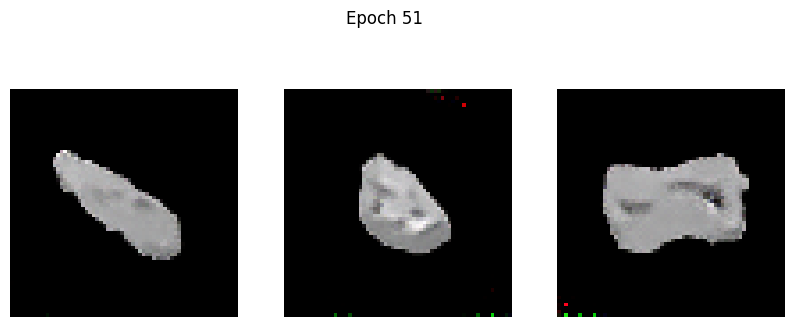

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3300 - g_loss: 1.6885
Epoch 52/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3322 - g_loss: 1.7779

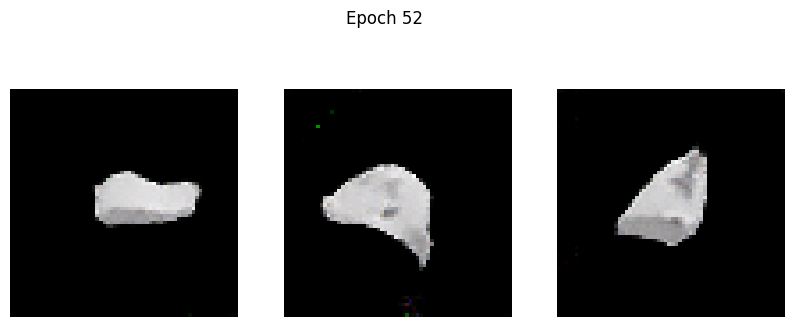

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3320 - g_loss: 1.7779
Epoch 53/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4312 - g_loss: 1.8884

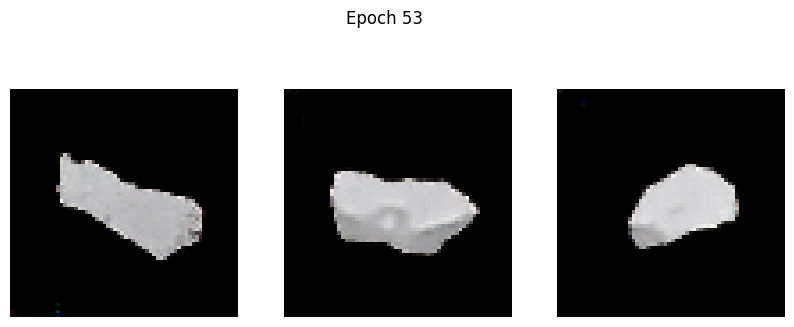

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.4304 - g_loss: 1.8878
Epoch 54/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3723 - g_loss: 1.8509

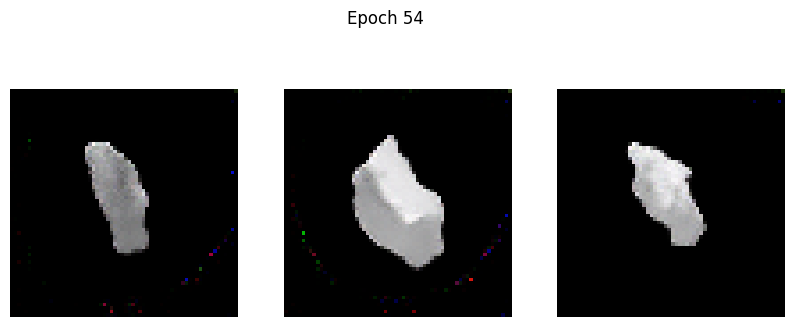

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3721 - g_loss: 1.8507
Epoch 55/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2998 - g_loss: 1.7877

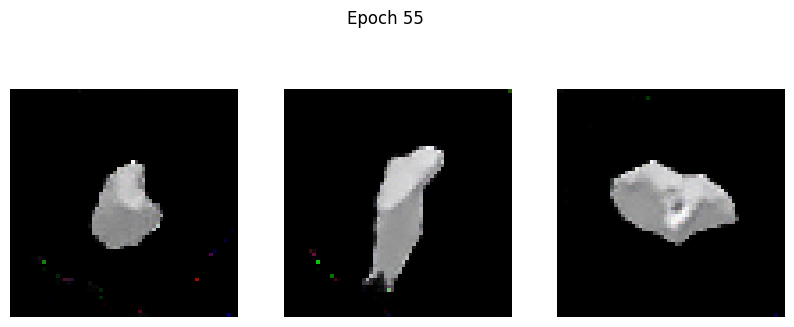

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2998 - g_loss: 1.7876
Epoch 56/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3291 - g_loss: 1.9162

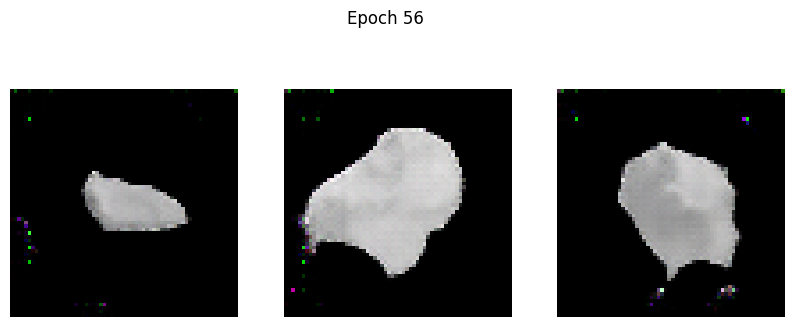

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3297 - g_loss: 1.9179
Epoch 57/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3197 - g_loss: 1.8623

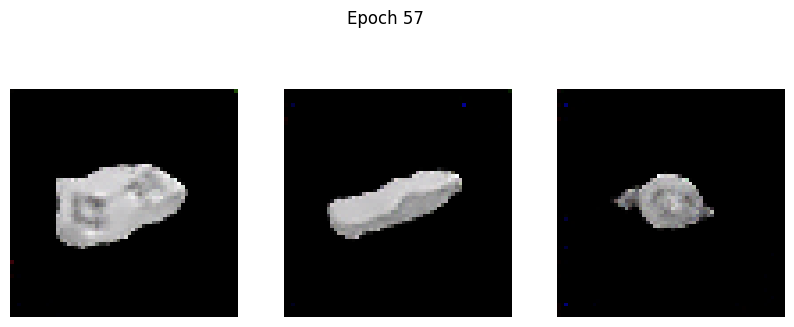

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3195 - g_loss: 1.8614
Epoch 58/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3051 - g_loss: 1.8223

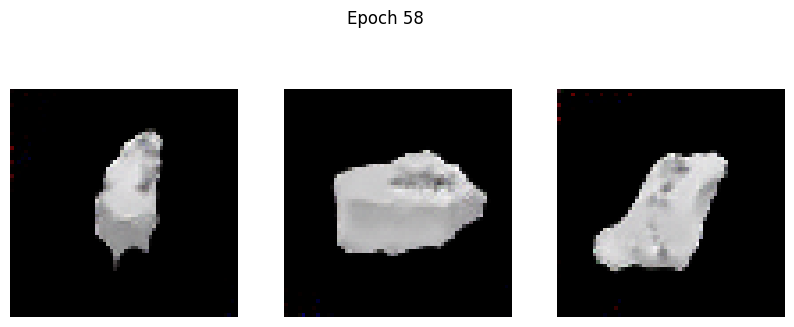

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3050 - g_loss: 1.8225
Epoch 59/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3362 - g_loss: 1.9040

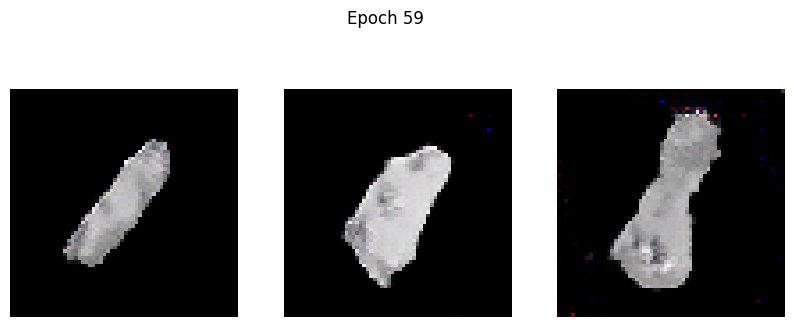

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3361 - g_loss: 1.9039
Epoch 60/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3042 - g_loss: 1.8826

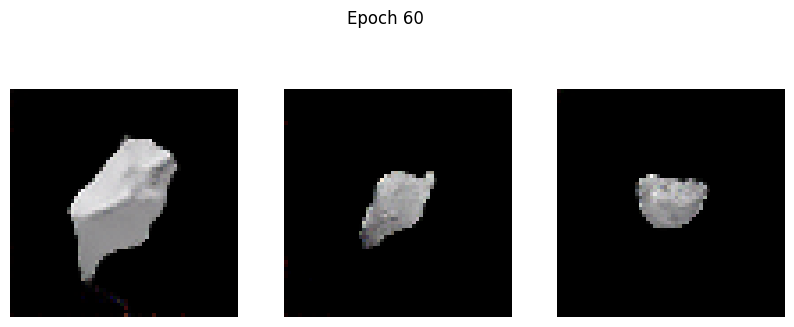

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3043 - g_loss: 1.8829
Epoch 61/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2905 - g_loss: 1.9260

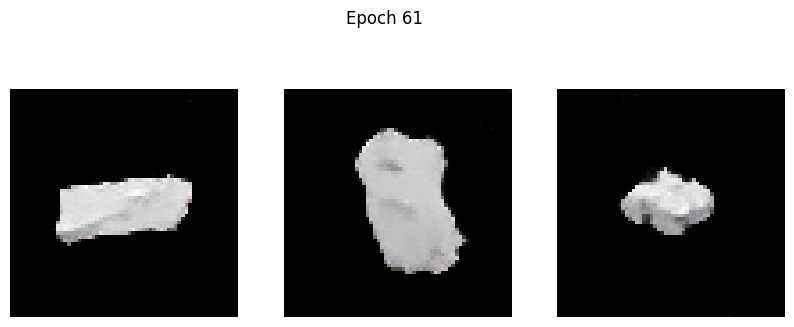

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2906 - g_loss: 1.9262
Epoch 62/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3052 - g_loss: 2.0101

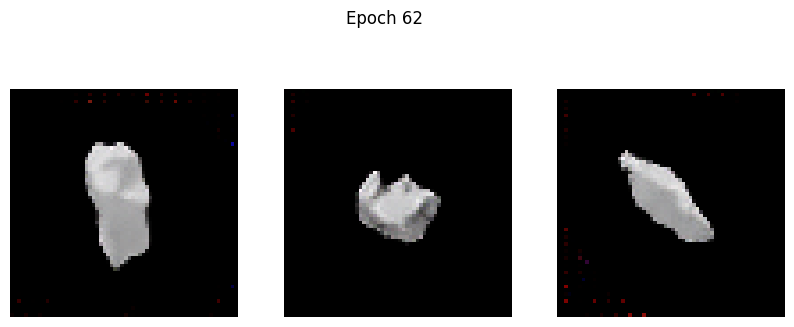

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3052 - g_loss: 2.0099
Epoch 63/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3095 - g_loss: 1.9748

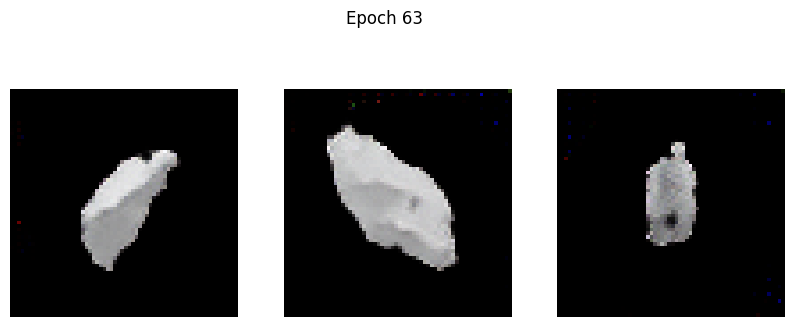

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3096 - g_loss: 1.9752
Epoch 64/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2830 - g_loss: 1.9813

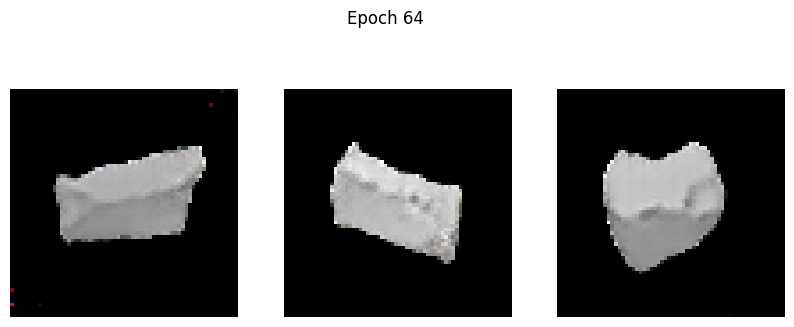

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2838 - g_loss: 1.9818
Epoch 65/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2916 - g_loss: 1.8425

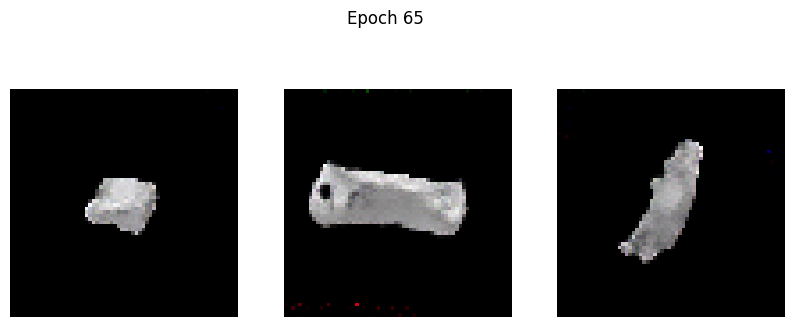

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2915 - g_loss: 1.8428
Epoch 66/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2705 - g_loss: 1.9690

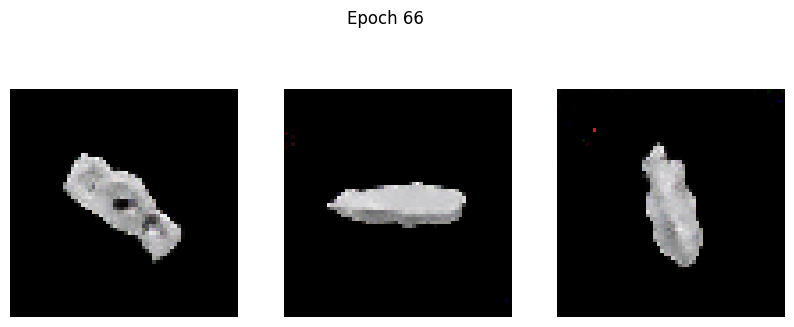

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2706 - g_loss: 1.9692
Epoch 67/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3354 - g_loss: 2.0725

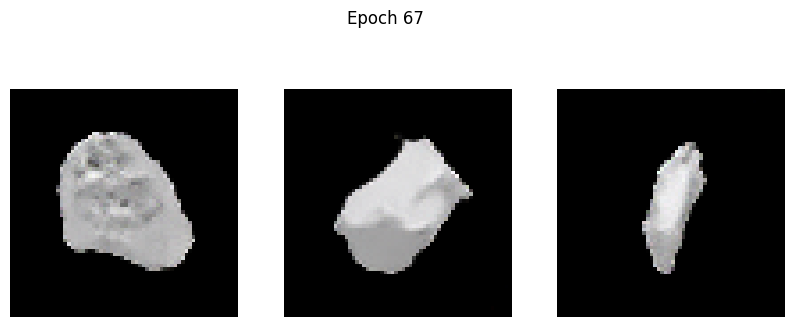

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3355 - g_loss: 2.0726
Epoch 68/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2660 - g_loss: 1.9721

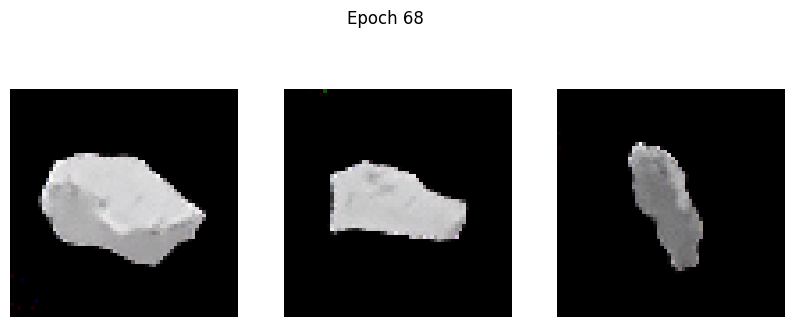

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2660 - g_loss: 1.9724
Epoch 69/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3074 - g_loss: 2.0828

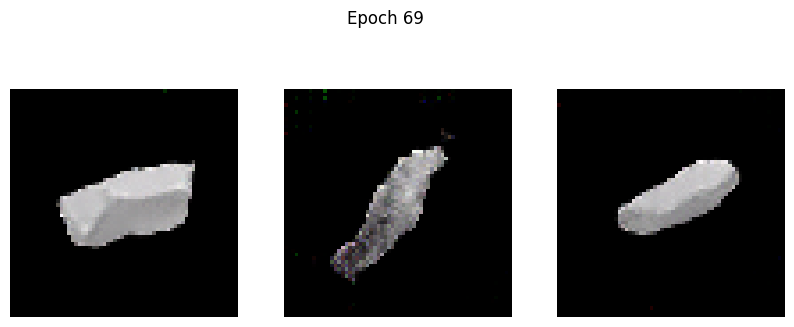

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3072 - g_loss: 2.0825
Epoch 70/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2821 - g_loss: 2.1226

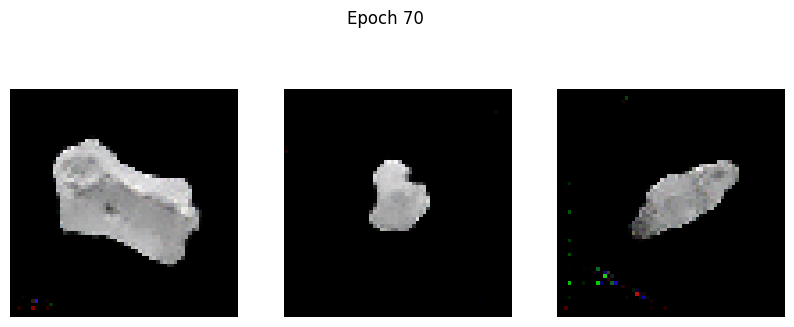

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2821 - g_loss: 2.1221
Epoch 71/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2507 - g_loss: 1.9967

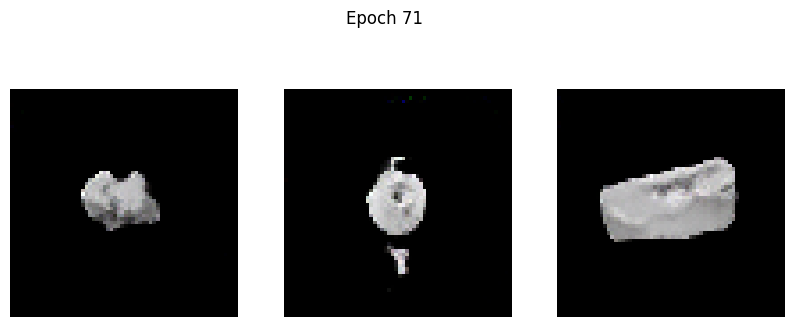

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2508 - g_loss: 1.9972
Epoch 72/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2605 - g_loss: 2.1390

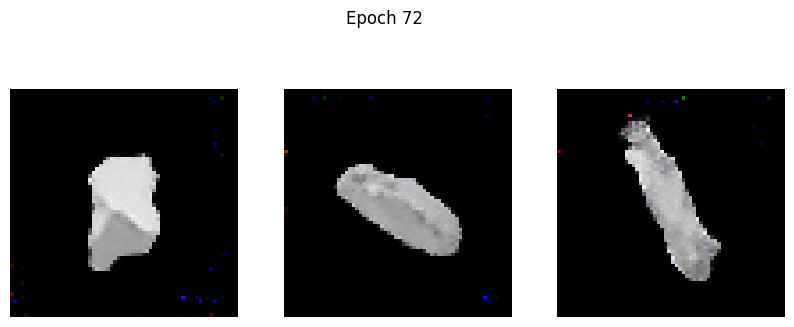

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2607 - g_loss: 2.1393
Epoch 73/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3338 - g_loss: 2.1695

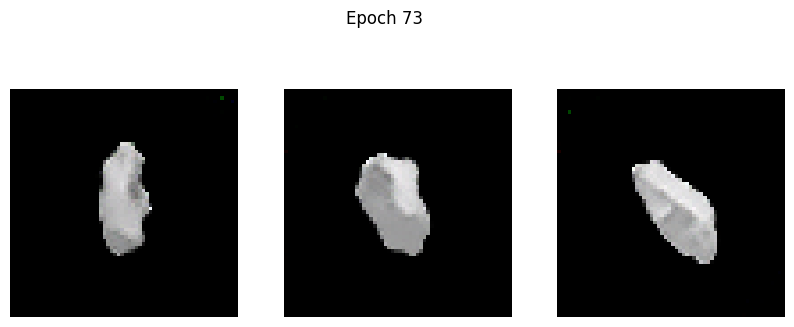

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3339 - g_loss: 2.1693
Epoch 74/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2600 - g_loss: 2.0645

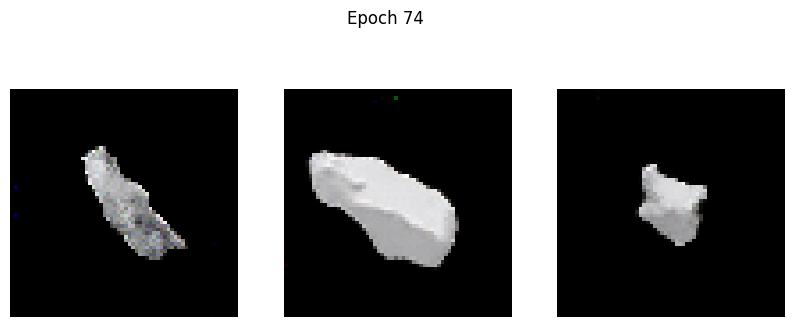

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.2603 - g_loss: 2.0650
Epoch 75/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2503 - g_loss: 2.0955

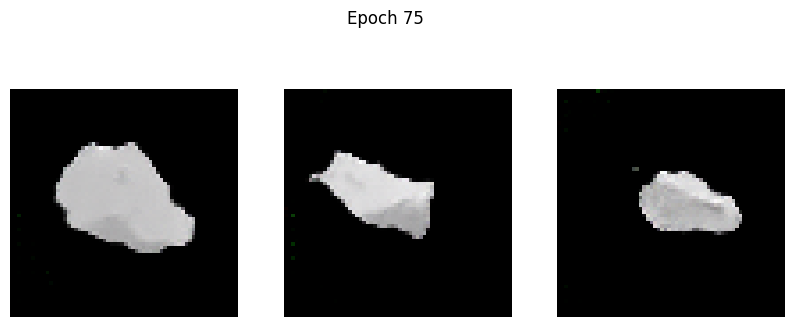

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2504 - g_loss: 2.0955
Epoch 76/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2500 - g_loss: 2.1528

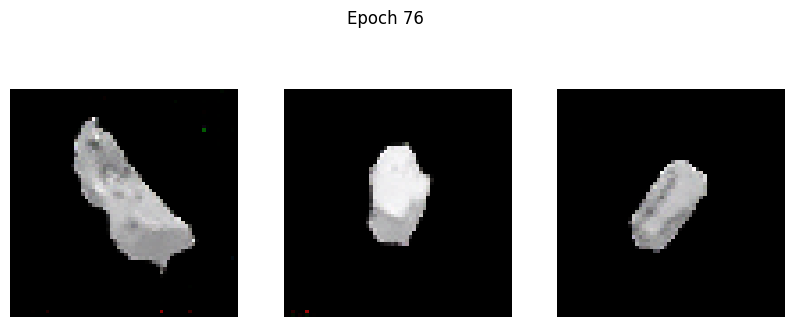

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2503 - g_loss: 2.1530
Epoch 77/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2471 - g_loss: 2.1534

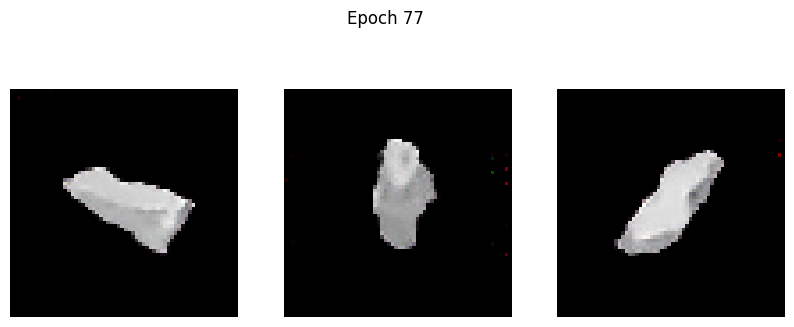

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2473 - g_loss: 2.1531
Epoch 78/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2491 - g_loss: 2.2025

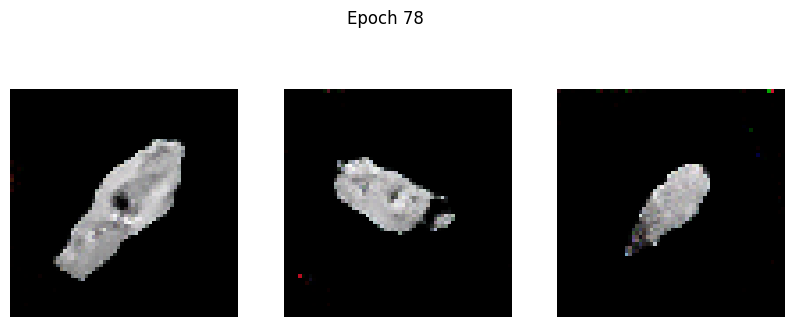

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2492 - g_loss: 2.2023
Epoch 79/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2399 - g_loss: 2.2510

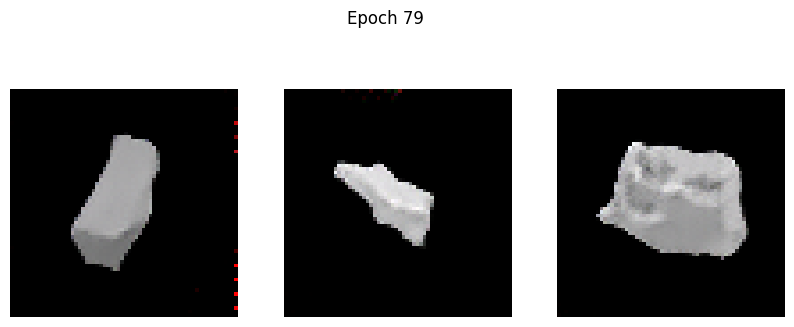

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2400 - g_loss: 2.2508
Epoch 80/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2735 - g_loss: 2.2598

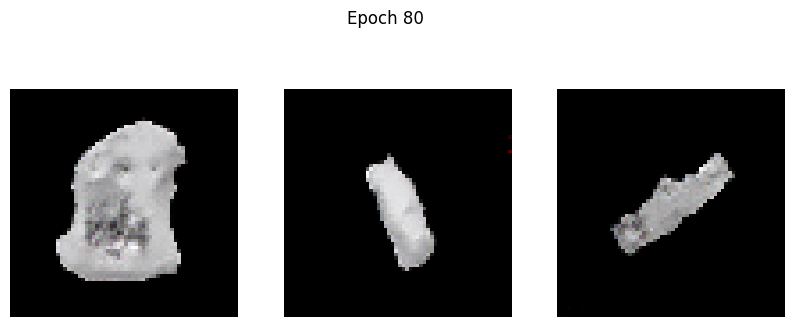

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2735 - g_loss: 2.2595
Epoch 81/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2444 - g_loss: 2.2325

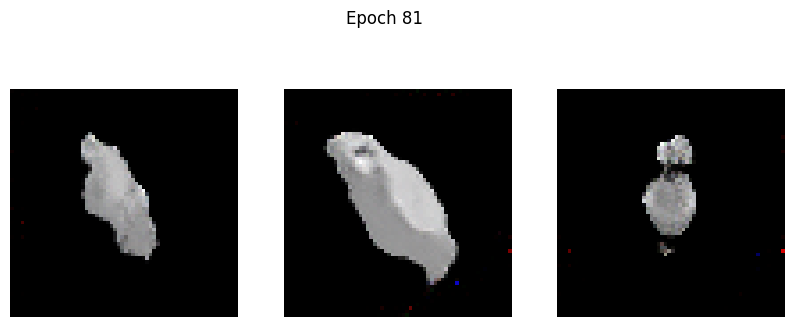

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2445 - g_loss: 2.2328
Epoch 82/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3591 - g_loss: 2.4163

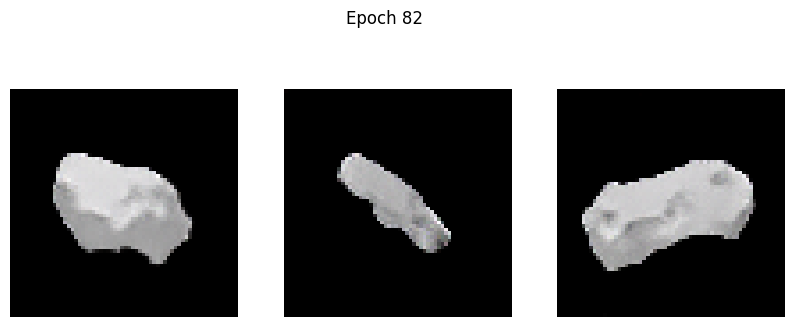

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3587 - g_loss: 2.4153
Epoch 83/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2528 - g_loss: 2.2561

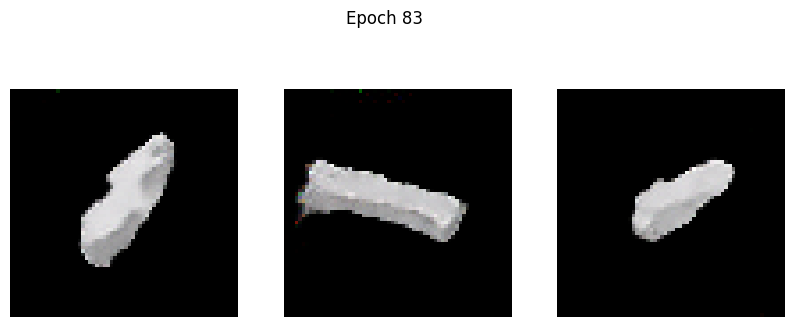

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2528 - g_loss: 2.2561
Epoch 84/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2275 - g_loss: 2.2680

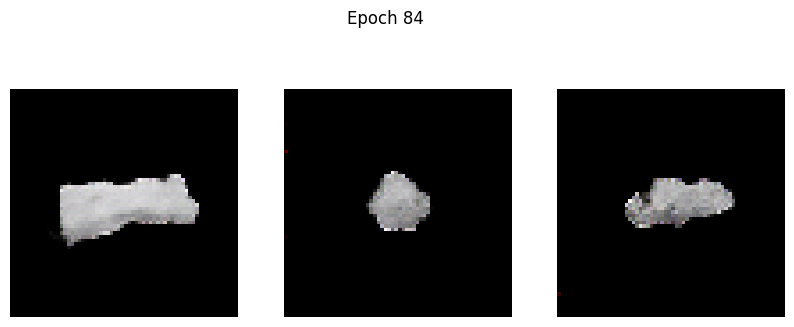

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2287 - g_loss: 2.2708
Epoch 85/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2556 - g_loss: 2.3122

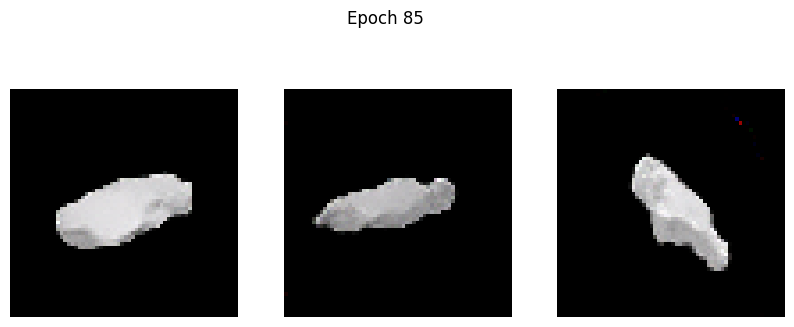

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2554 - g_loss: 2.3110
Epoch 86/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2248 - g_loss: 2.2256

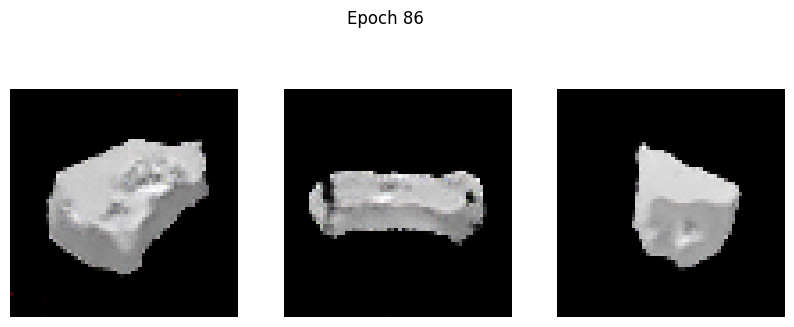

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2250 - g_loss: 2.2260
Epoch 87/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2314 - g_loss: 2.3138

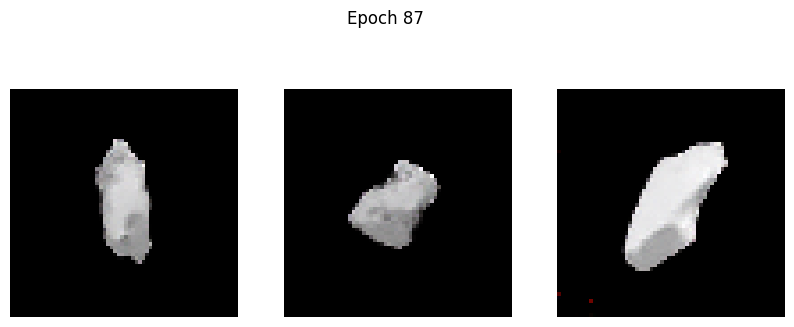

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2315 - g_loss: 2.3140
Epoch 88/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2316 - g_loss: 2.2475

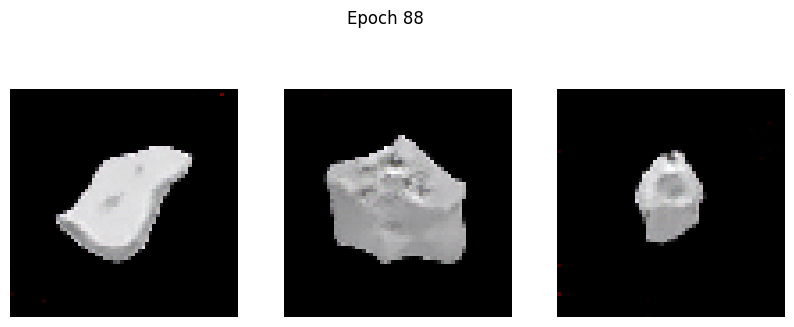

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2316 - g_loss: 2.2479
Epoch 89/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2330 - g_loss: 2.3494

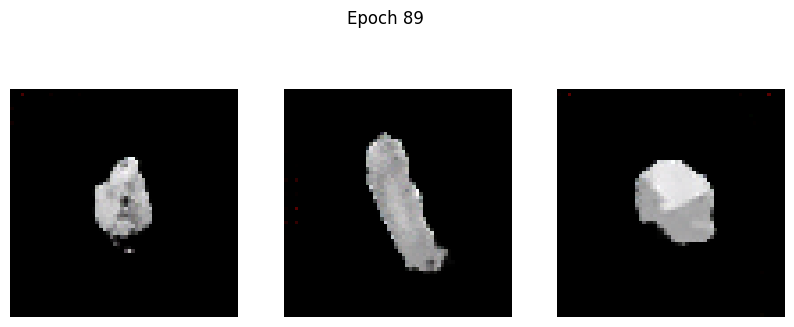

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2331 - g_loss: 2.3497
Epoch 90/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2107 - g_loss: 2.3126

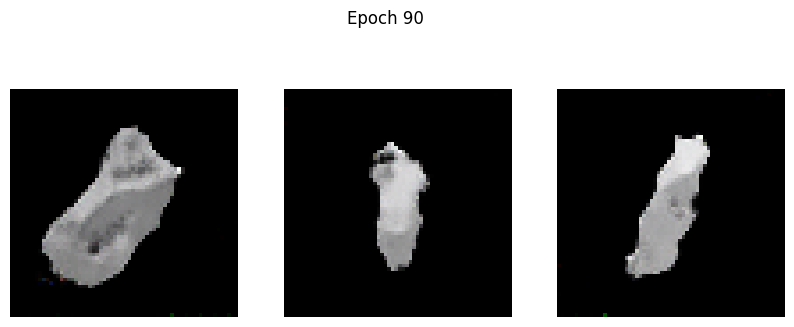

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2110 - g_loss: 2.3133
Epoch 91/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2910 - g_loss: 2.4727

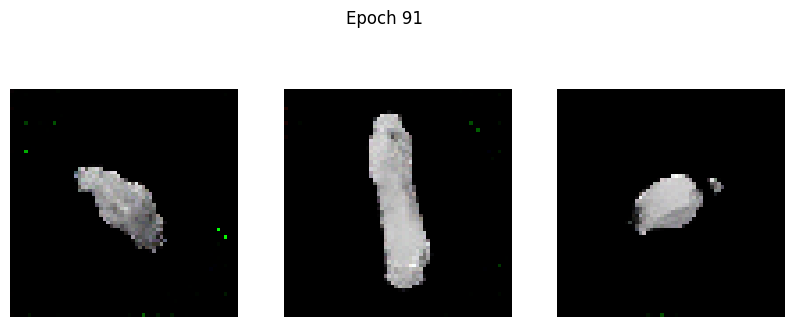

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2908 - g_loss: 2.4720
Epoch 92/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2250 - g_loss: 2.3705

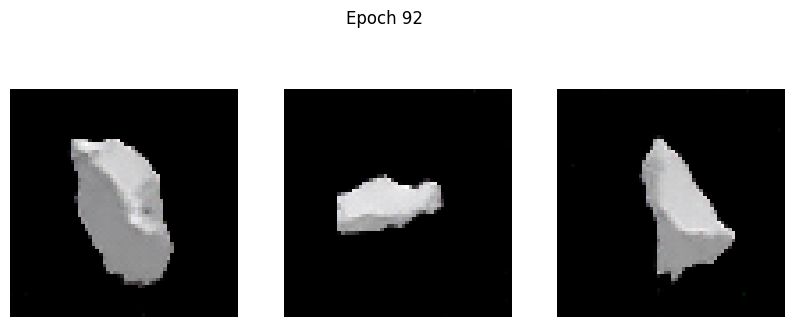

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2253 - g_loss: 2.3708
Epoch 93/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2322 - g_loss: 2.3532

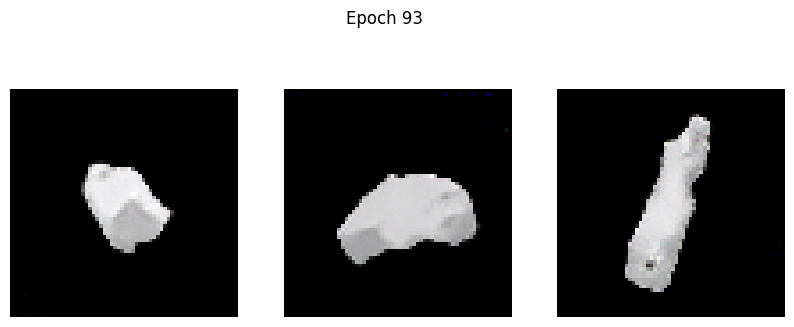

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2321 - g_loss: 2.3532
Epoch 94/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.5846 - g_loss: 2.7881

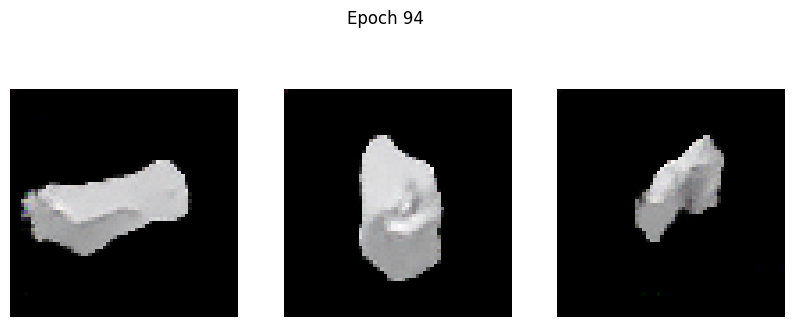

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.5831 - g_loss: 2.7856
Epoch 95/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2045 - g_loss: 2.2610

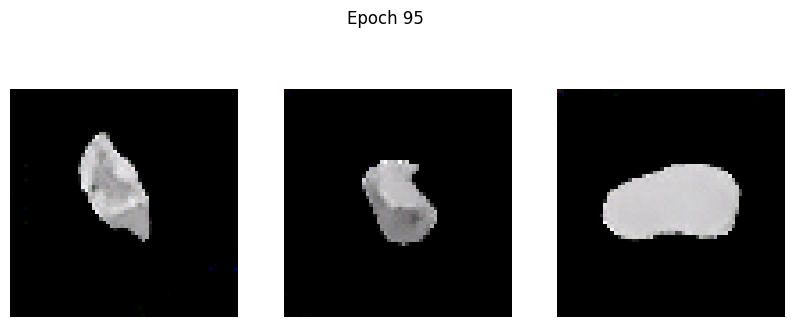

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2045 - g_loss: 2.2611
Epoch 96/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2048 - g_loss: 2.3502

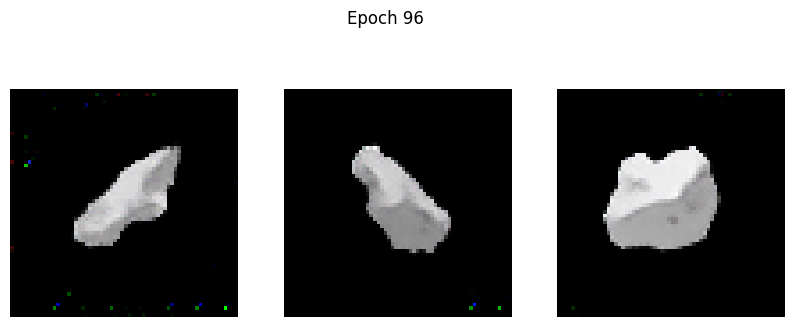

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2049 - g_loss: 2.3503
Epoch 97/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2273 - g_loss: 2.3907

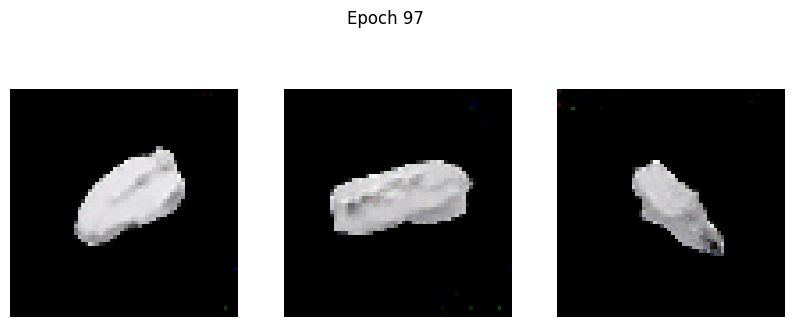

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2273 - g_loss: 2.3907
Epoch 98/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3005 - g_loss: 2.5507

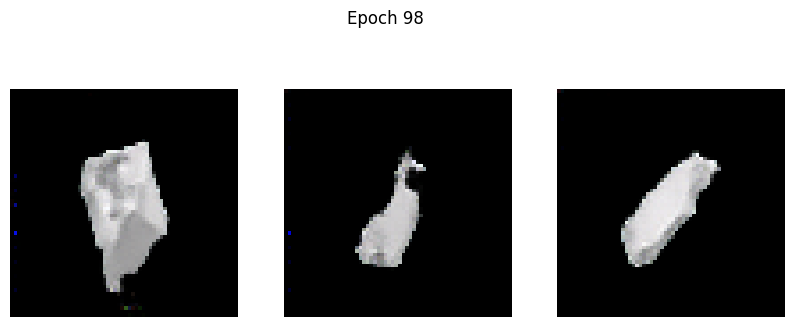

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3004 - g_loss: 2.5505
Epoch 99/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2016 - g_loss: 2.4418

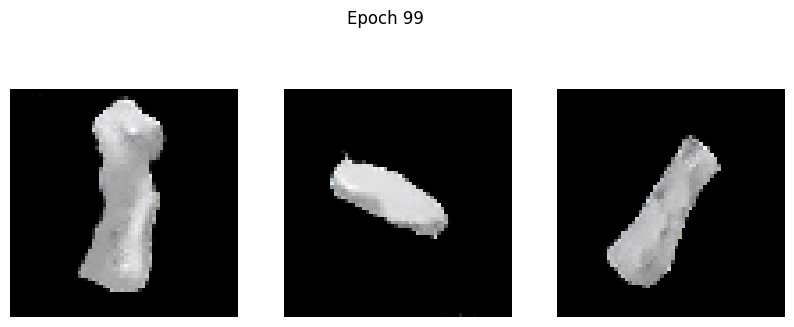

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2015 - g_loss: 2.4411
Epoch 100/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2562 - g_loss: 2.6375

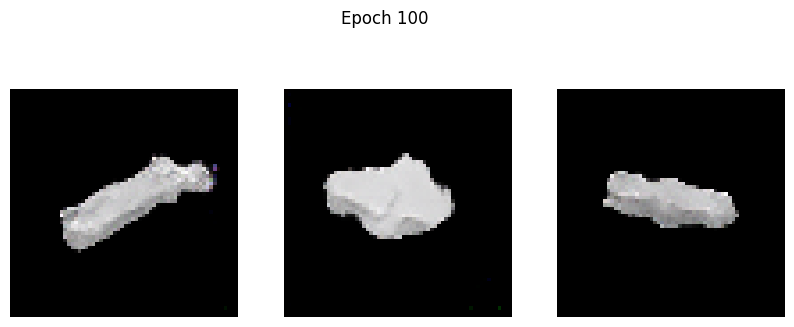

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2563 - g_loss: 2.6369
Epoch 101/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2146 - g_loss: 2.4456

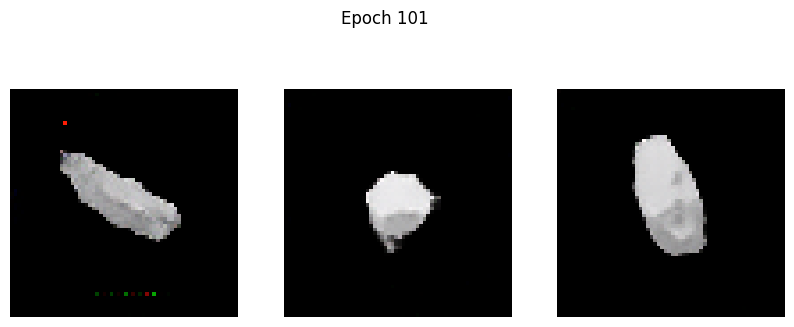

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2148 - g_loss: 2.4457
Epoch 102/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1876 - g_loss: 2.4611

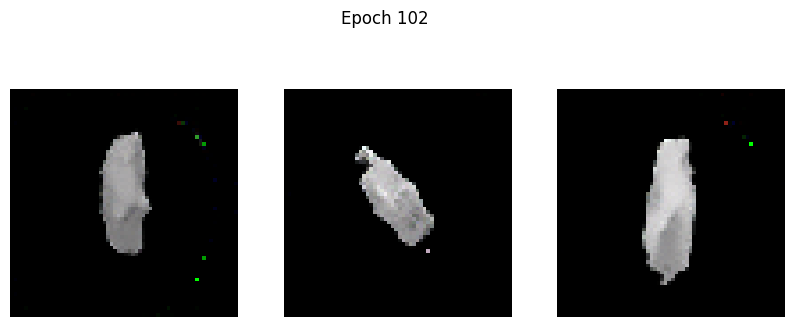

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1876 - g_loss: 2.4608
Epoch 103/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2383 - g_loss: 2.5144

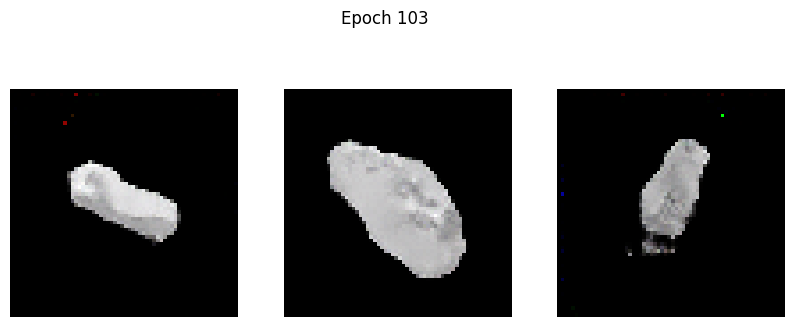

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2380 - g_loss: 2.5141
Epoch 104/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1967 - g_loss: 2.5617

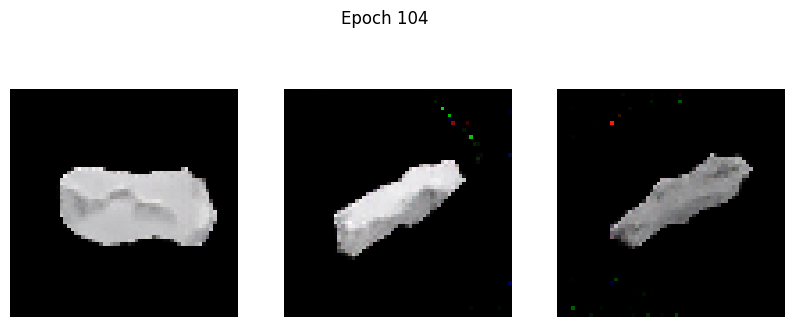

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1969 - g_loss: 2.5616
Epoch 105/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.6503 - g_loss: 3.1133

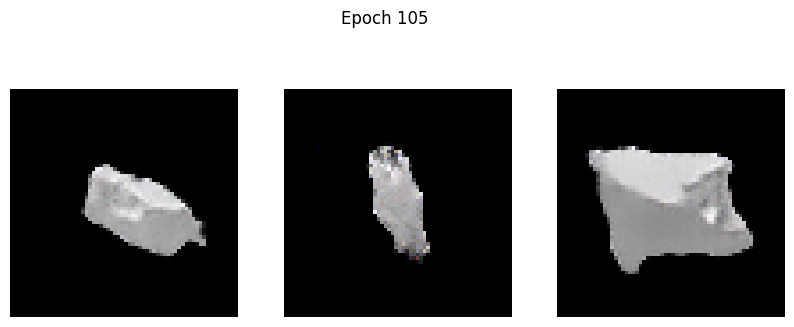

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.6486 - g_loss: 3.1101
Epoch 106/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1917 - g_loss: 2.3367

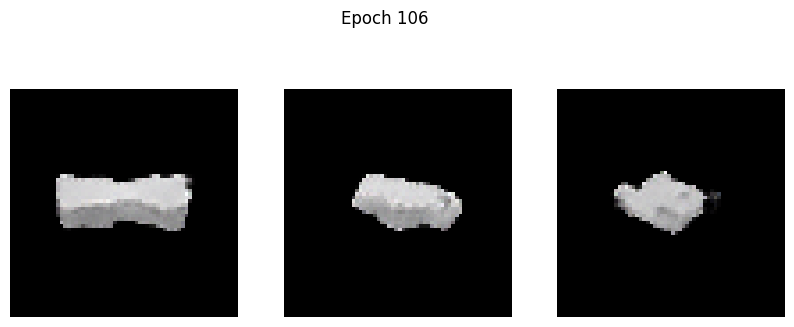

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1916 - g_loss: 2.3372
Epoch 107/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.2125 - g_loss: 2.5076

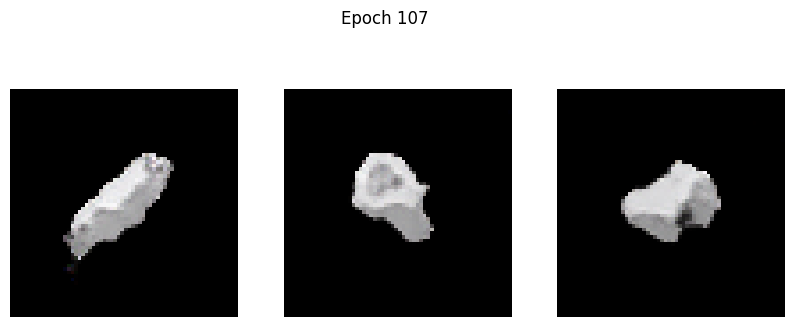

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.2125 - g_loss: 2.5073
Epoch 108/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1924 - g_loss: 2.5232

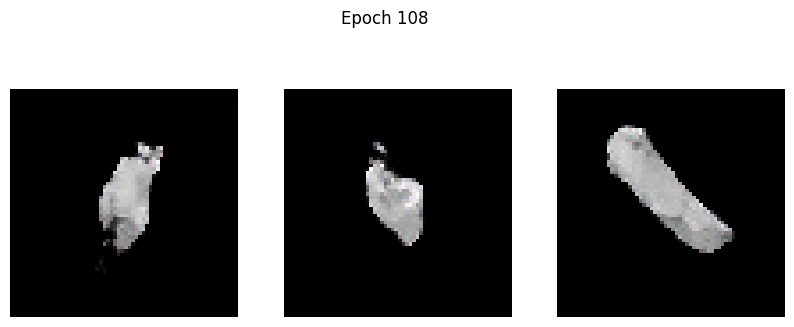

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1925 - g_loss: 2.5232
Epoch 109/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2471 - g_loss: 2.6095

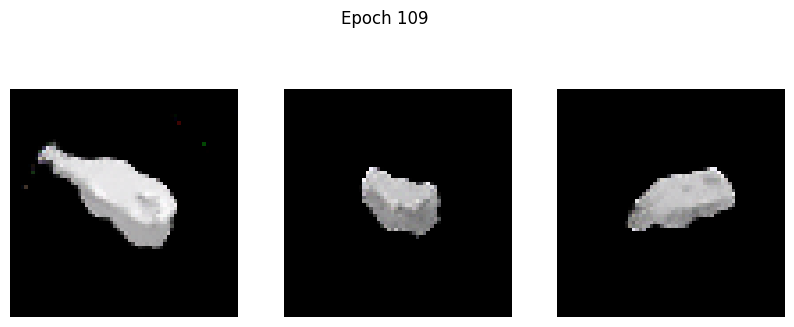

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2468 - g_loss: 2.6091
Epoch 110/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2484 - g_loss: 2.6081

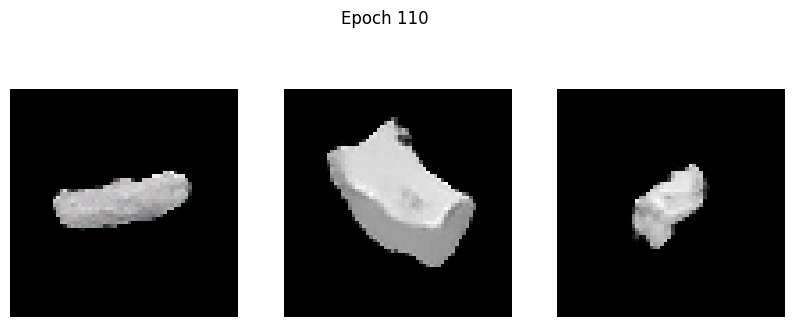

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2483 - g_loss: 2.6082
Epoch 111/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1830 - g_loss: 2.6301

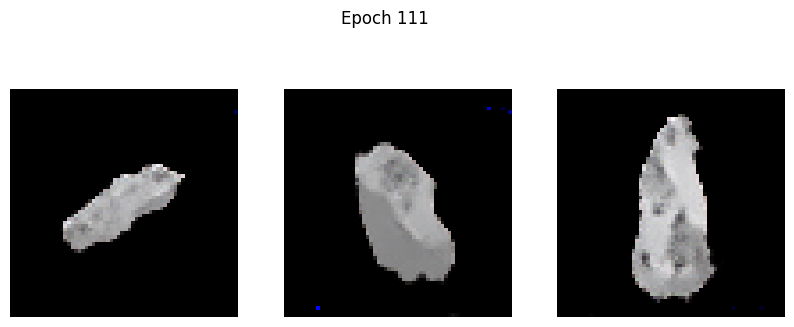

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1831 - g_loss: 2.6299
Epoch 112/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2180 - g_loss: 2.6649

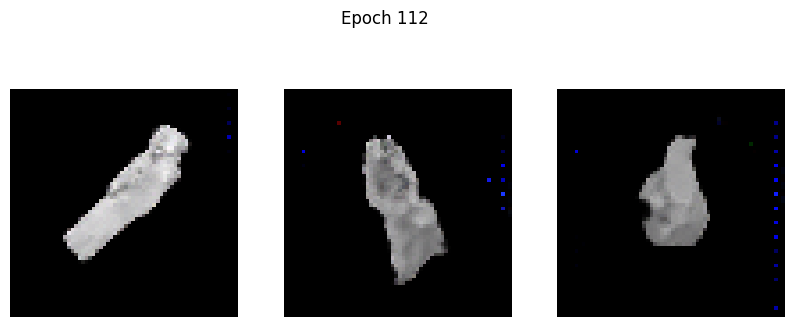

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2181 - g_loss: 2.6650
Epoch 113/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1828 - g_loss: 2.6446

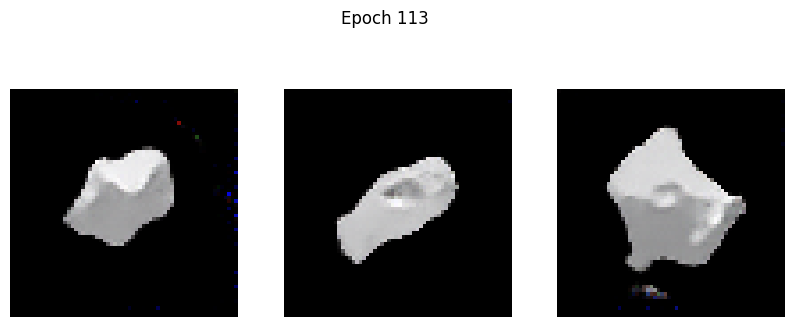

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1829 - g_loss: 2.6444
Epoch 114/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2708 - g_loss: 2.6305

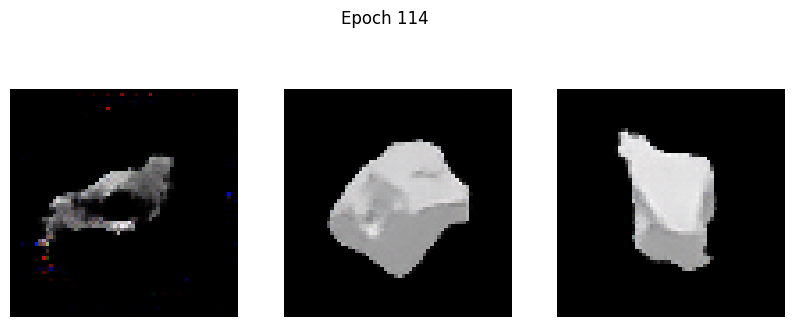

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2703 - g_loss: 2.6302
Epoch 115/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1840 - g_loss: 2.6277

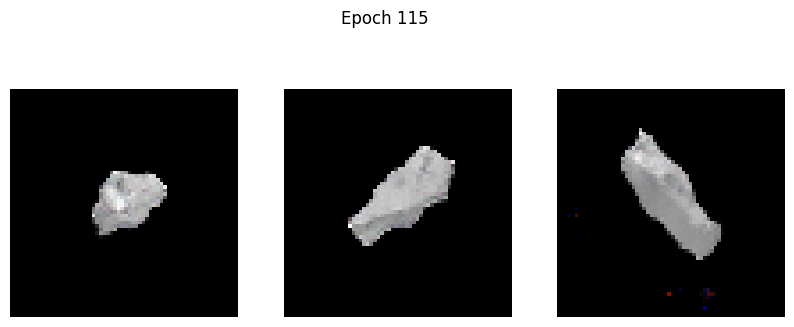

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1843 - g_loss: 2.6280
Epoch 116/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2148 - g_loss: 2.7781

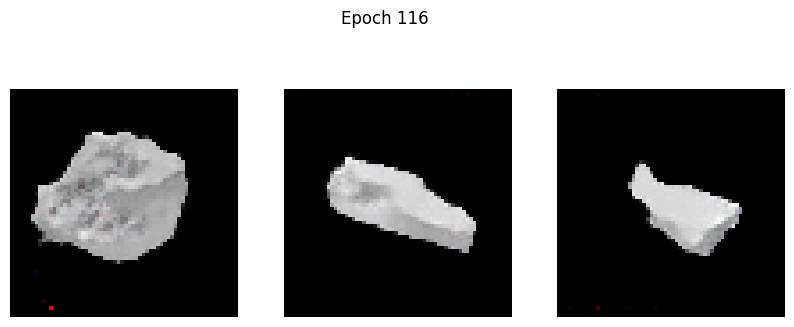

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2152 - g_loss: 2.7783
Epoch 117/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1763 - g_loss: 2.5569

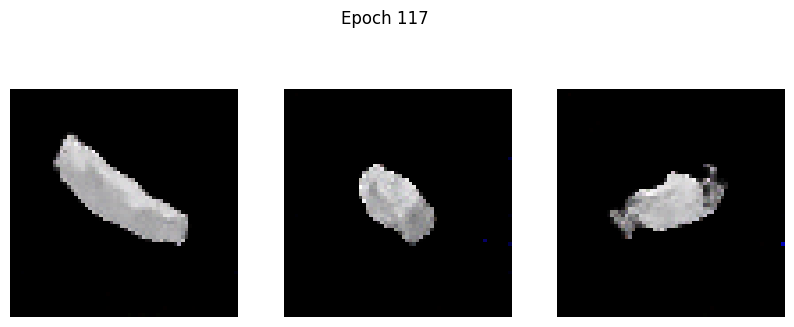

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1763 - g_loss: 2.5572
Epoch 118/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1781 - g_loss: 2.6596

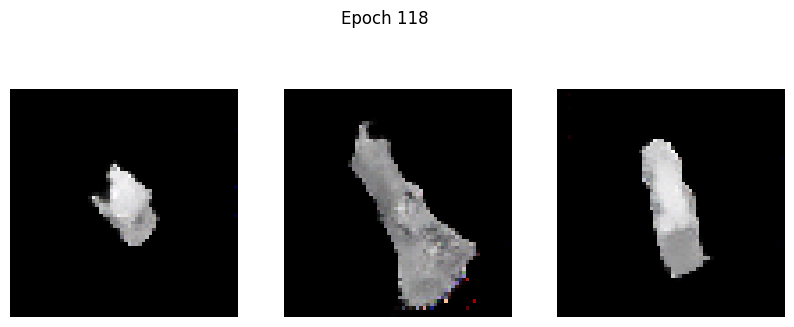

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1783 - g_loss: 2.6601
Epoch 119/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1752 - g_loss: 2.7124

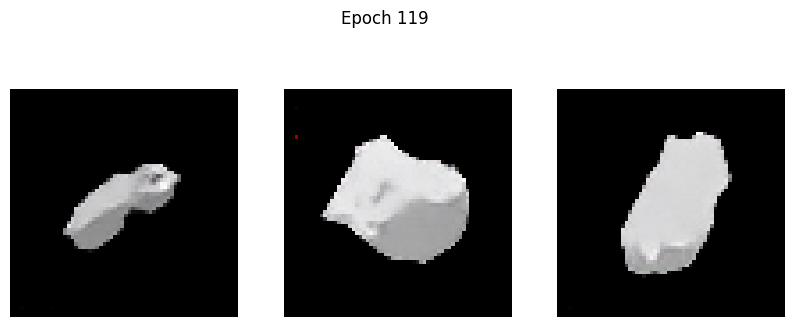

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1753 - g_loss: 2.7123
Epoch 120/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.4361 - g_loss: 2.9294

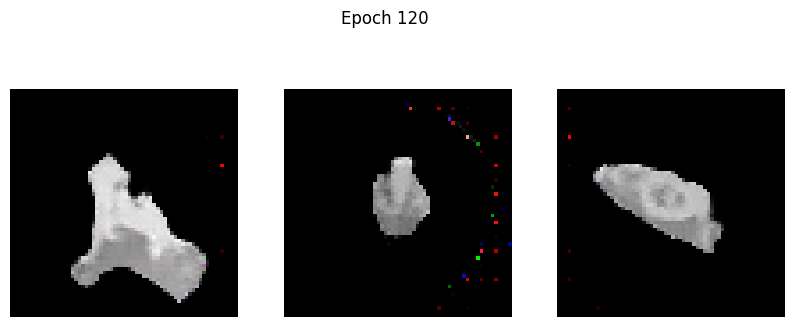

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.4385 - g_loss: 2.9301
Epoch 121/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2245 - g_loss: 2.3029

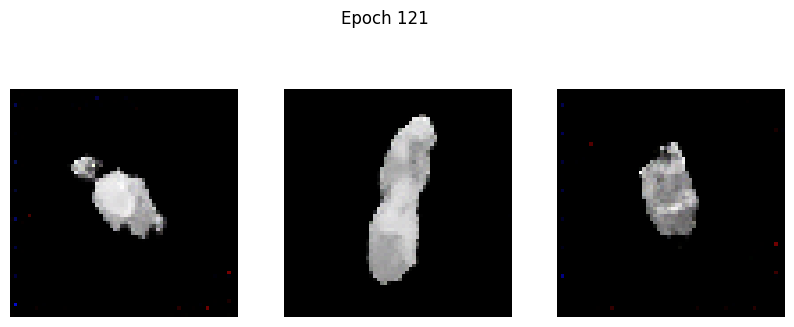

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2243 - g_loss: 2.3034
Epoch 122/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1696 - g_loss: 2.3960

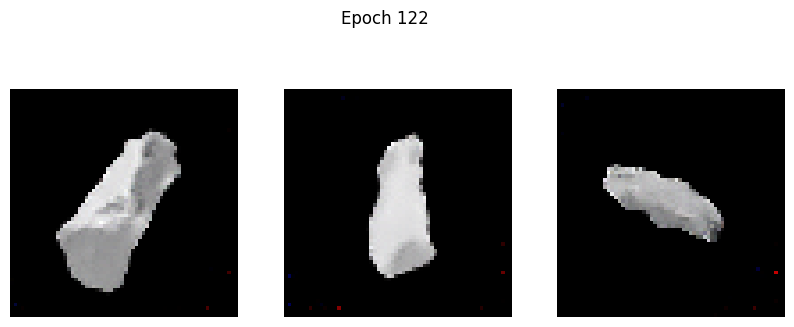

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1697 - g_loss: 2.3965
Epoch 123/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1664 - g_loss: 2.6125

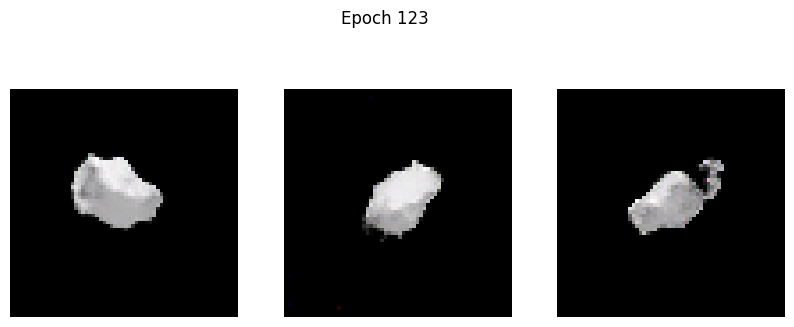

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1664 - g_loss: 2.6126
Epoch 124/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1820 - g_loss: 2.5858

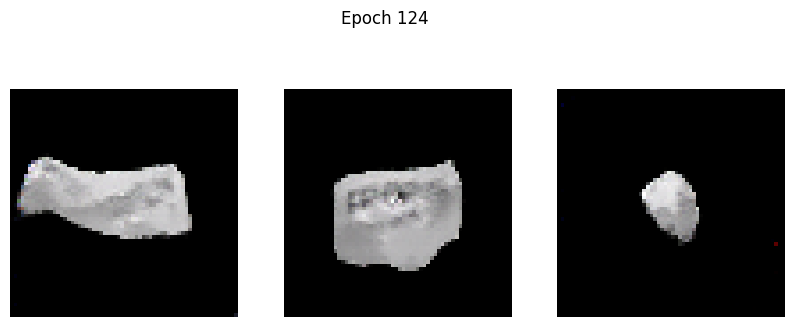

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1819 - g_loss: 2.5861
Epoch 125/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1722 - g_loss: 2.5879

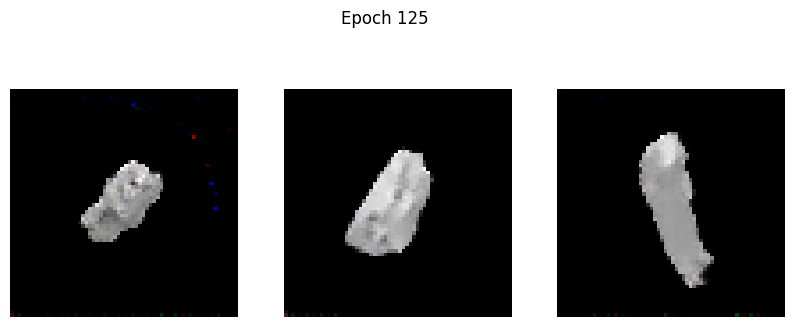

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1725 - g_loss: 2.5887
Epoch 126/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2087 - g_loss: 2.6808

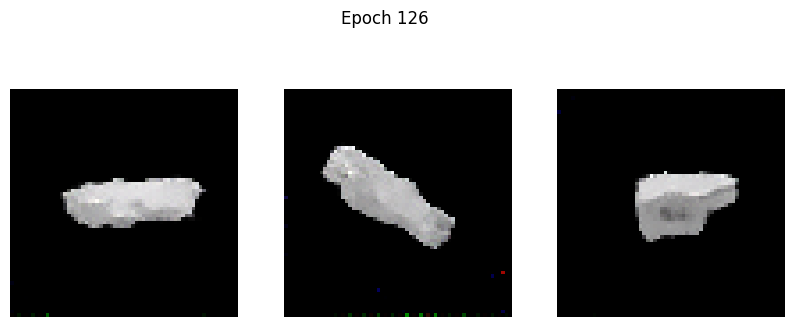

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2087 - g_loss: 2.6809
Epoch 127/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1665 - g_loss: 2.7168

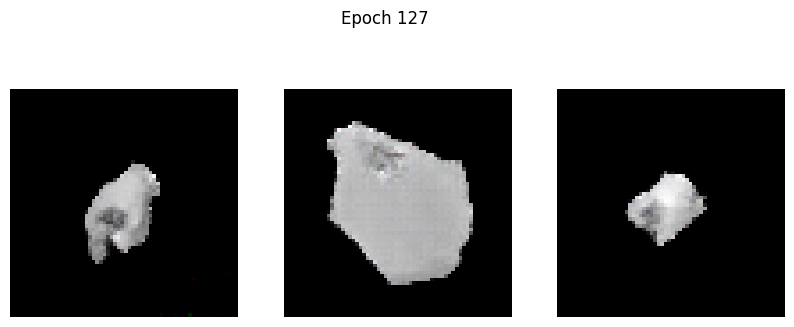

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1668 - g_loss: 2.7172
Epoch 128/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1957 - g_loss: 2.7073

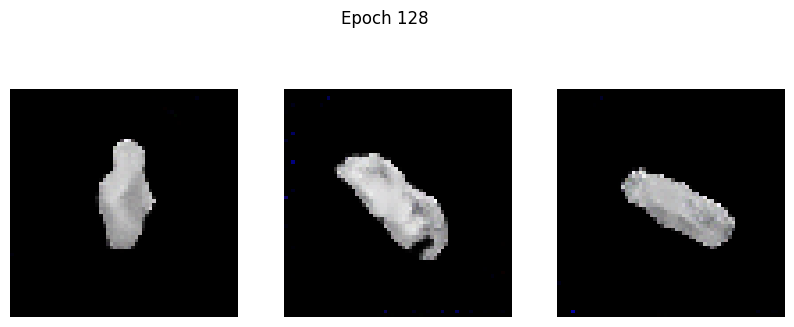

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1956 - g_loss: 2.7072
Epoch 129/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1752 - g_loss: 2.7586

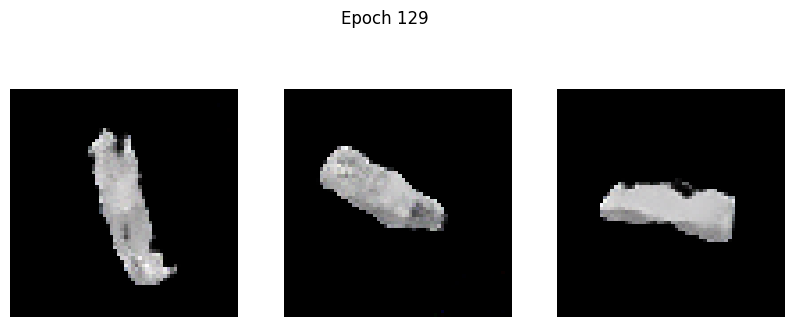

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1753 - g_loss: 2.7582
Epoch 130/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2144 - g_loss: 2.8450

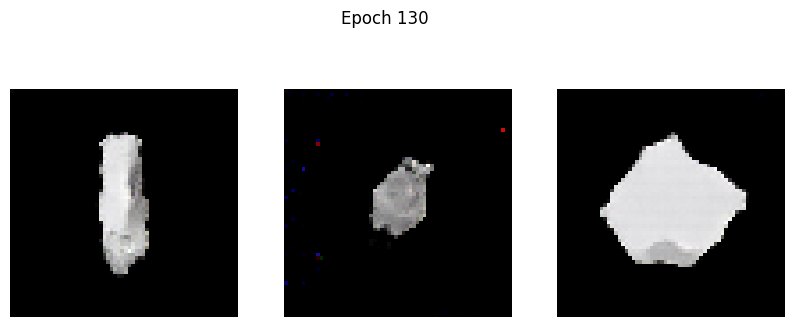

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2146 - g_loss: 2.8447
Epoch 131/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1701 - g_loss: 2.7920

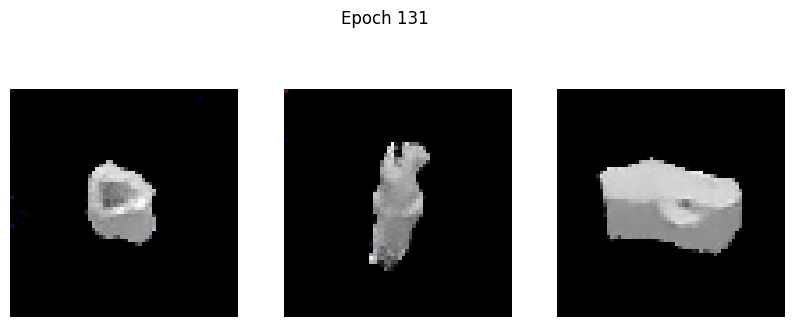

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1701 - g_loss: 2.7917
Epoch 132/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2318 - g_loss: 2.9363

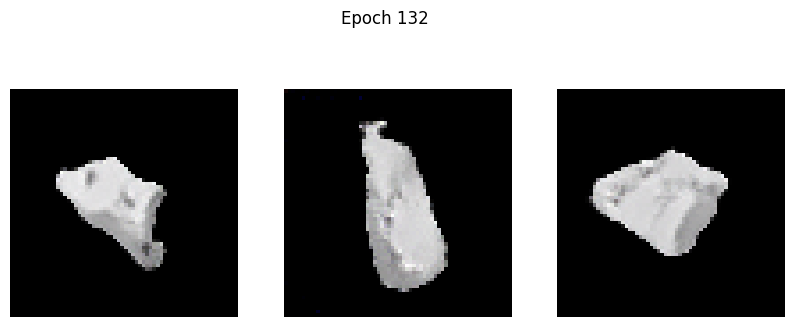

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2321 - g_loss: 2.9359
Epoch 133/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1532 - g_loss: 2.7827

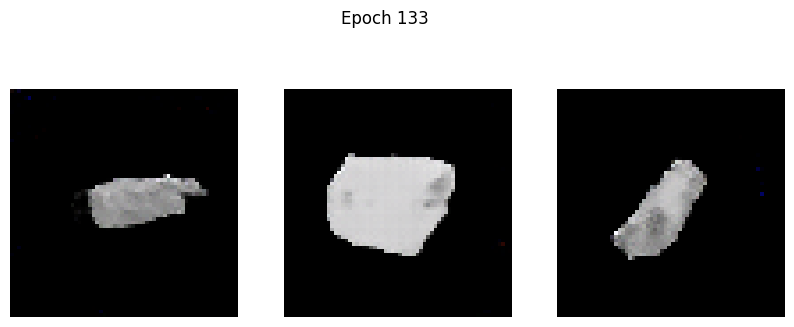

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1532 - g_loss: 2.7826
Epoch 134/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1558 - g_loss: 2.7969

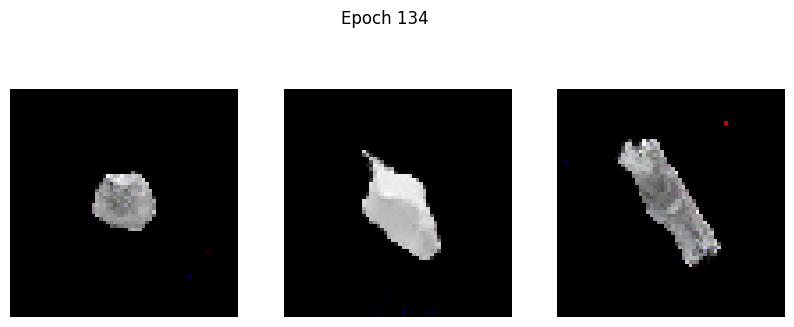

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1559 - g_loss: 2.7972
Epoch 135/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2173 - g_loss: 2.9013

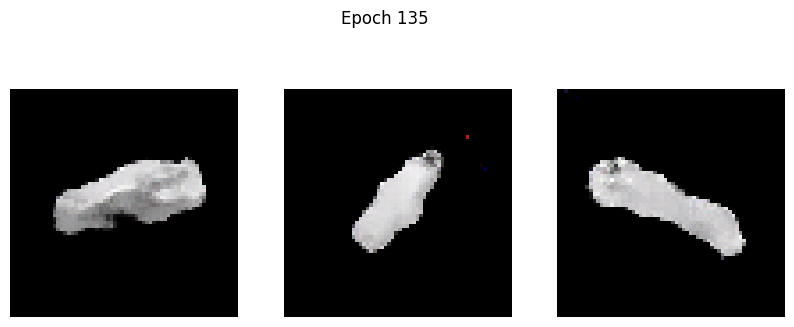

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2171 - g_loss: 2.9011
Epoch 136/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1930 - g_loss: 2.8504

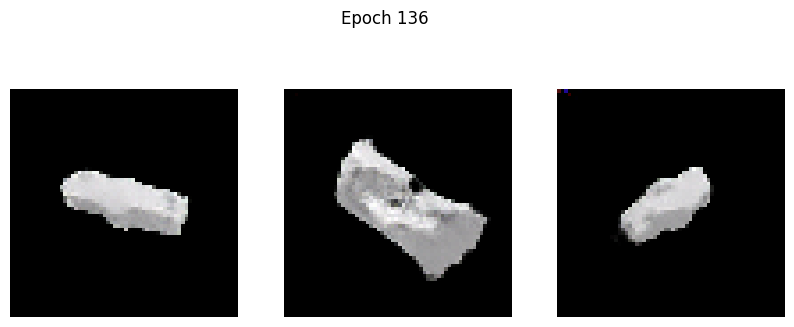

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.1929 - g_loss: 2.8505
Epoch 137/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1559 - g_loss: 2.8500

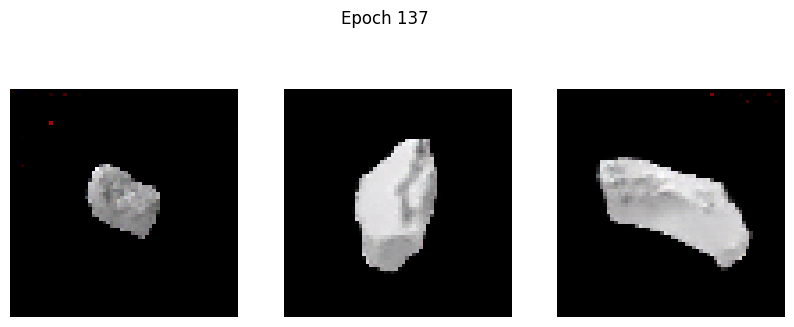

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1559 - g_loss: 2.8499
Epoch 138/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1779 - g_loss: 2.9082

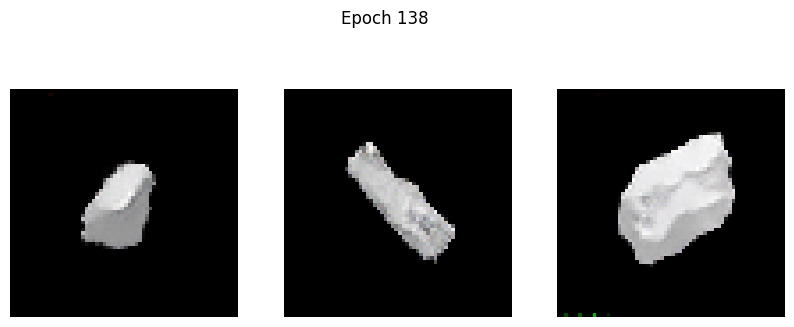

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1783 - g_loss: 2.9087
Epoch 139/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1509 - g_loss: 2.8336

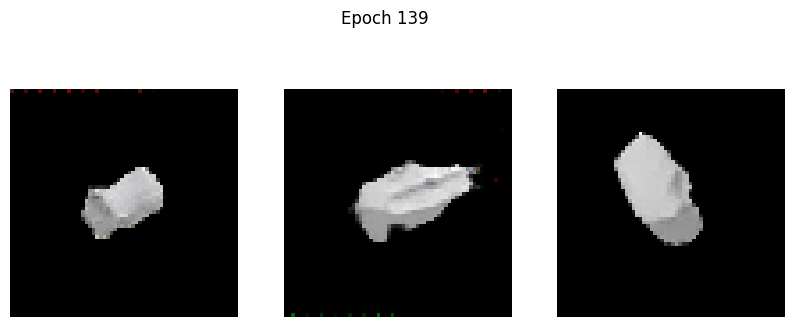

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1511 - g_loss: 2.8339
Epoch 140/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1492 - g_loss: 2.8327

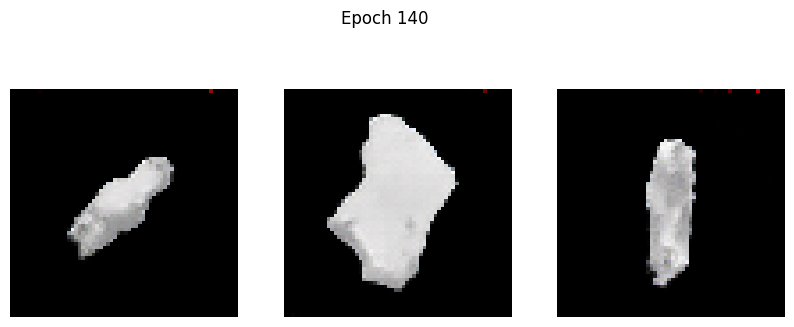

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1494 - g_loss: 2.8335
Epoch 141/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1745 - g_loss: 3.0033

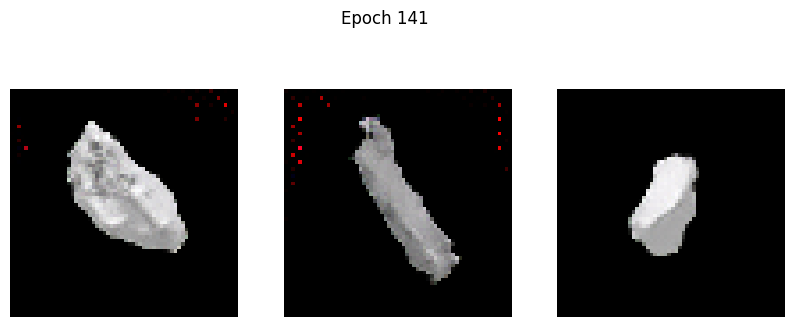

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1745 - g_loss: 3.0029
Epoch 142/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1887 - g_loss: 2.9547

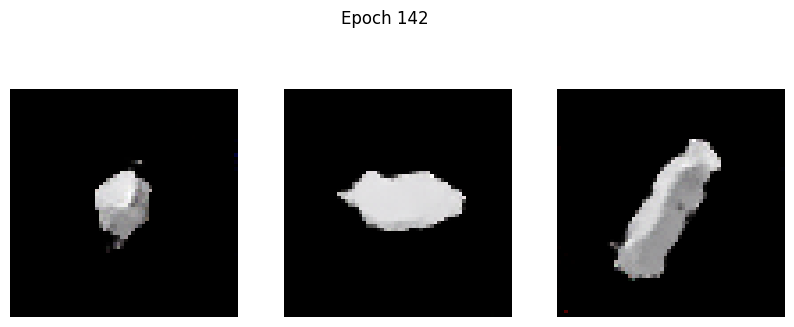

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1889 - g_loss: 2.9546
Epoch 143/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1546 - g_loss: 2.8824

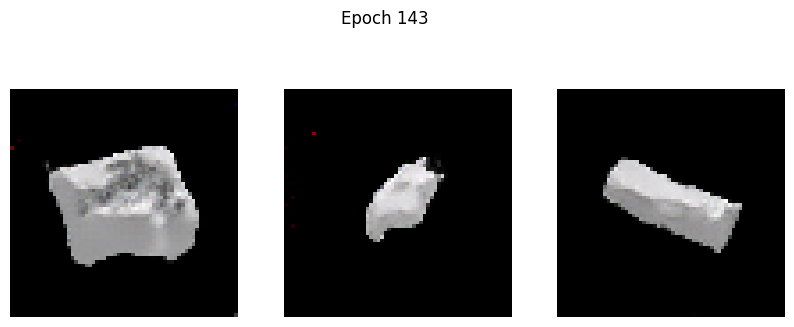

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1547 - g_loss: 2.8831
Epoch 144/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.7456 - g_loss: 3.7933

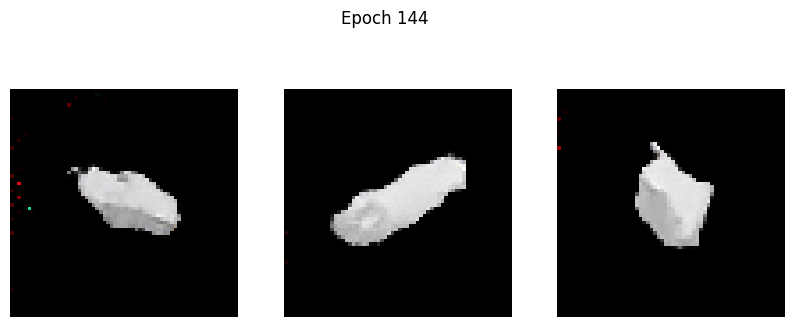

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.7448 - g_loss: 3.7897
Epoch 145/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1580 - g_loss: 2.5615

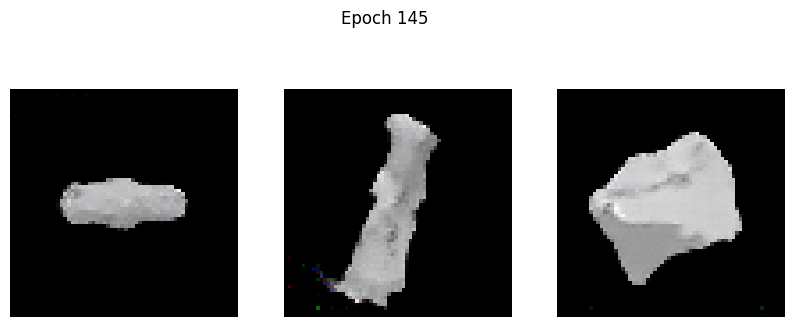

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1580 - g_loss: 2.5622
Epoch 146/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1700 - g_loss: 2.6975

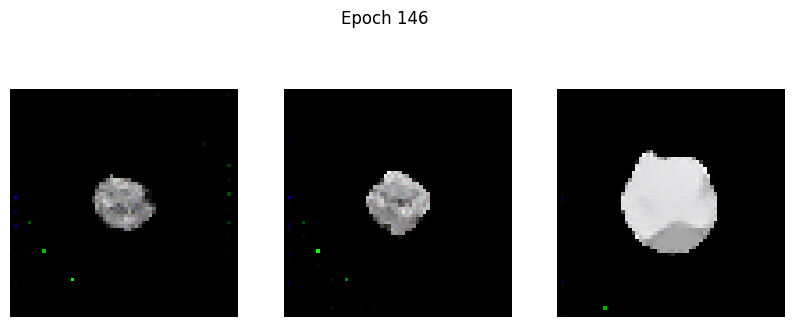

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1699 - g_loss: 2.6978
Epoch 147/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1461 - g_loss: 2.7548

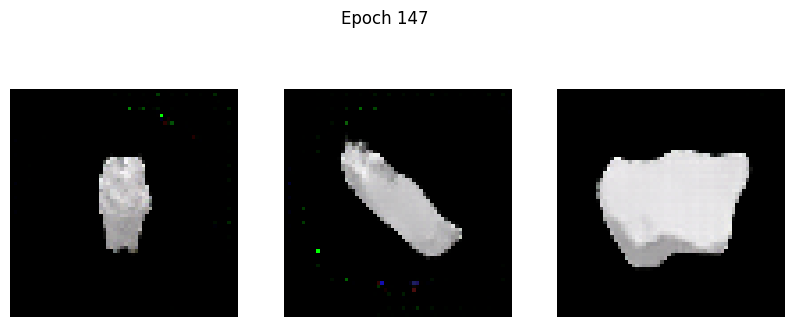

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1461 - g_loss: 2.7550
Epoch 148/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1670 - g_loss: 2.8777

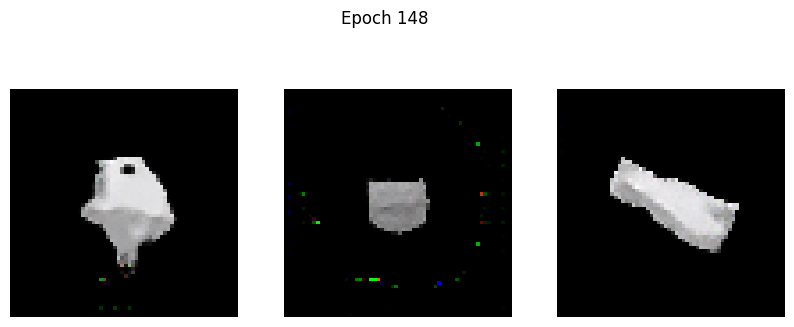

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1670 - g_loss: 2.8778
Epoch 149/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1531 - g_loss: 2.9282

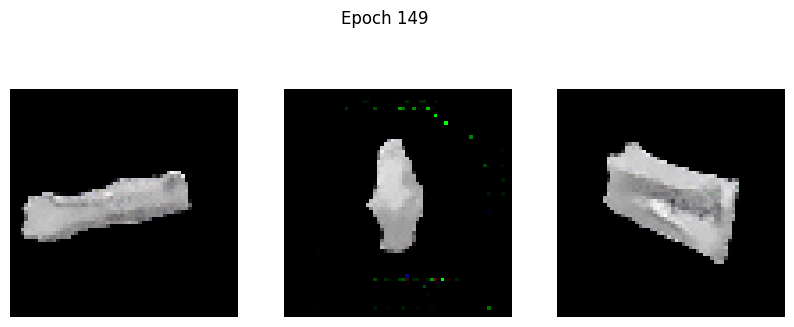

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1530 - g_loss: 2.9284
Epoch 150/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2106 - g_loss: 3.0594

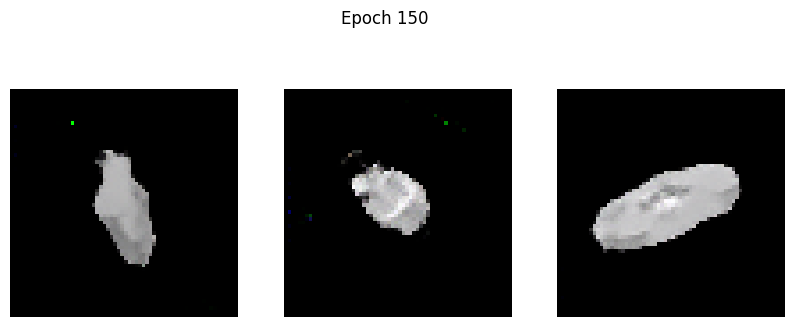

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2102 - g_loss: 3.0588
Epoch 151/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1494 - g_loss: 2.9572

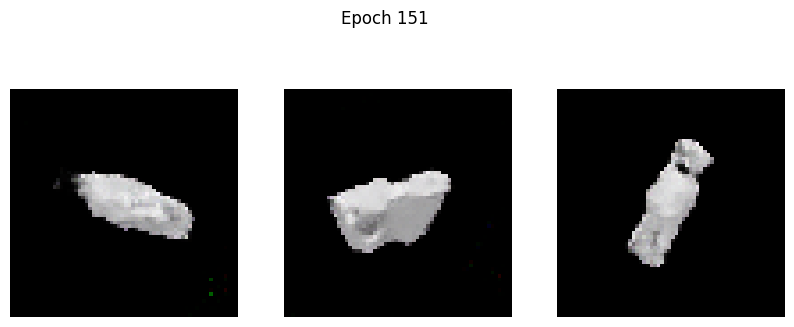

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1495 - g_loss: 2.9572
Epoch 152/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1669 - g_loss: 2.9868

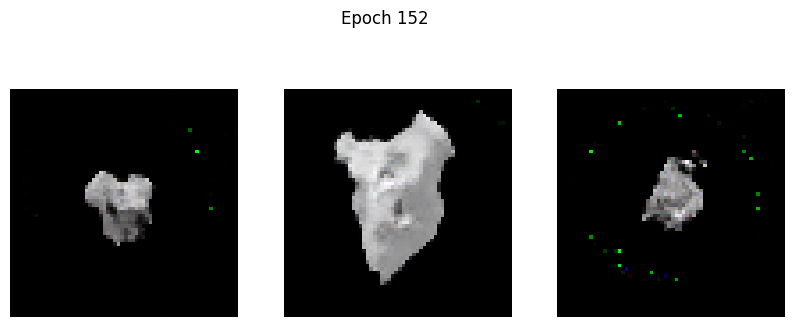

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1672 - g_loss: 2.9871
Epoch 153/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1756 - g_loss: 3.0202

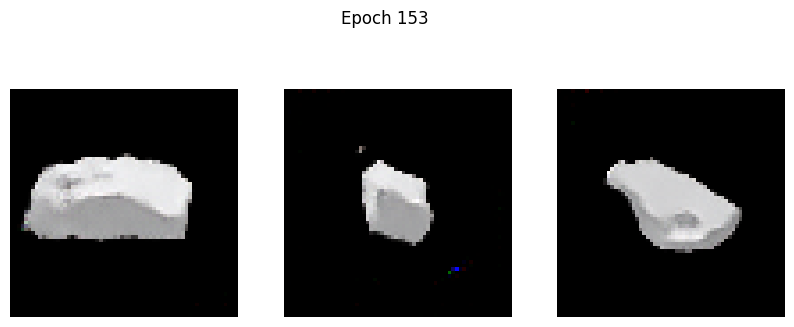

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1756 - g_loss: 3.0198
Epoch 154/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1457 - g_loss: 2.9815

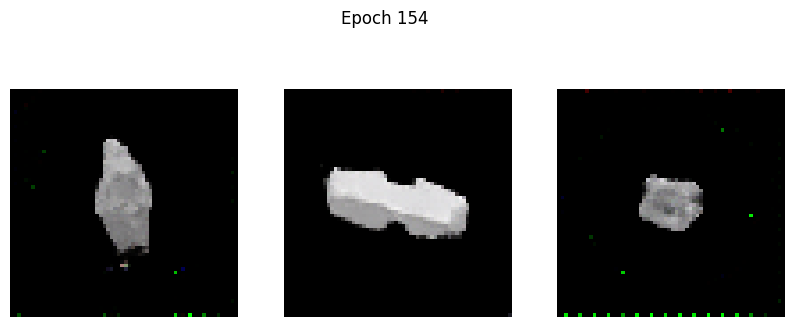

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1459 - g_loss: 2.9817
Epoch 155/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1811 - g_loss: 3.0352

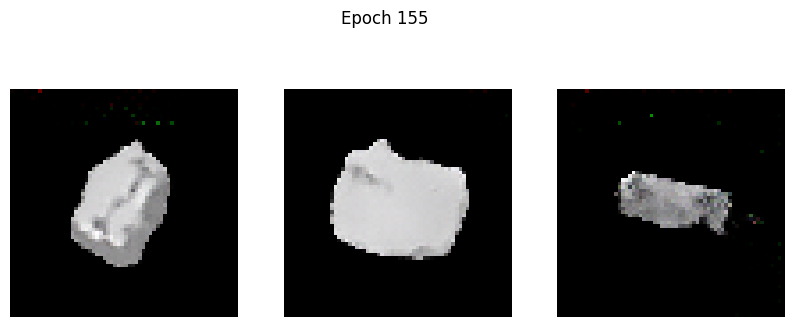

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1810 - g_loss: 3.0348
Epoch 156/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1799 - g_loss: 3.0773

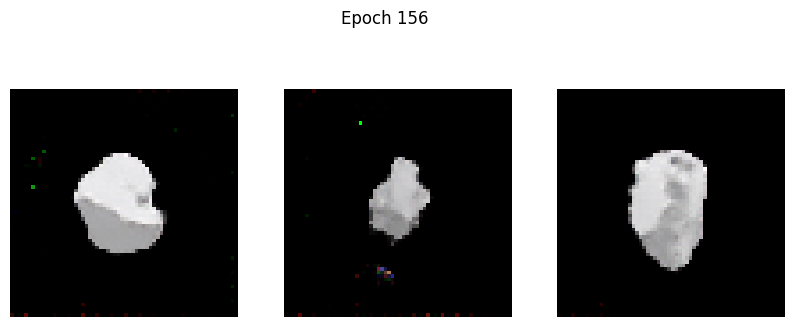

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1798 - g_loss: 3.0771
Epoch 157/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1565 - g_loss: 3.0453

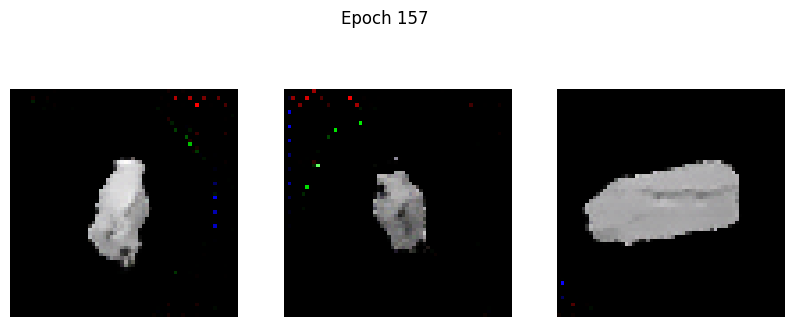

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1570 - g_loss: 3.0463
Epoch 158/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1701 - g_loss: 3.1305

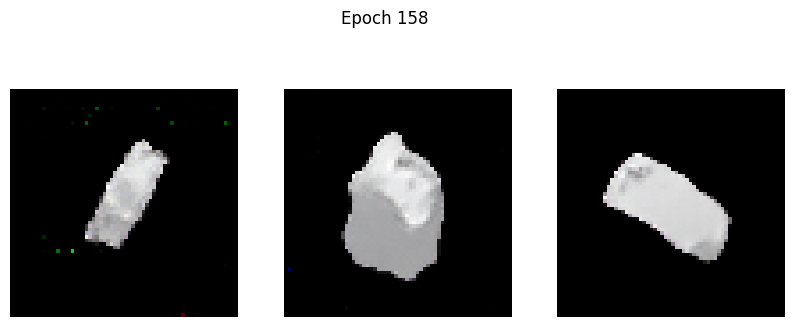

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1699 - g_loss: 3.1299
Epoch 159/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1290 - g_loss: 3.0441

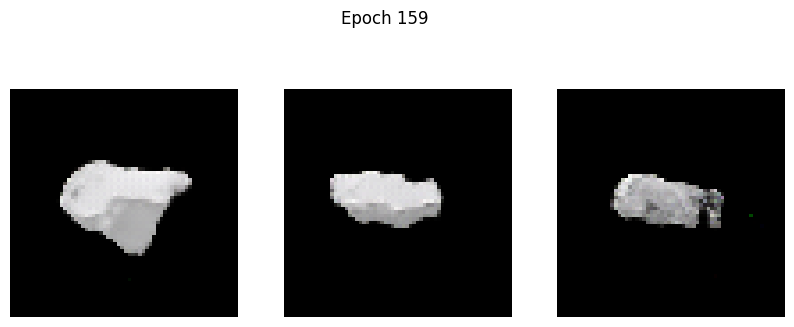

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1296 - g_loss: 3.0453
Epoch 160/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.3019 - g_loss: 3.0780

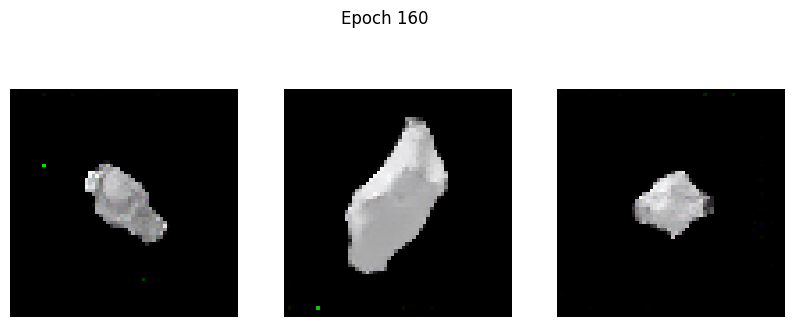

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.3008 - g_loss: 3.0772
Epoch 161/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1373 - g_loss: 2.9905

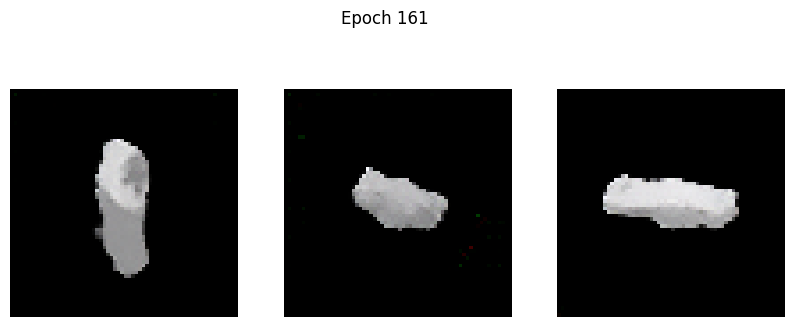

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1374 - g_loss: 2.9908
Epoch 162/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1507 - g_loss: 3.1004

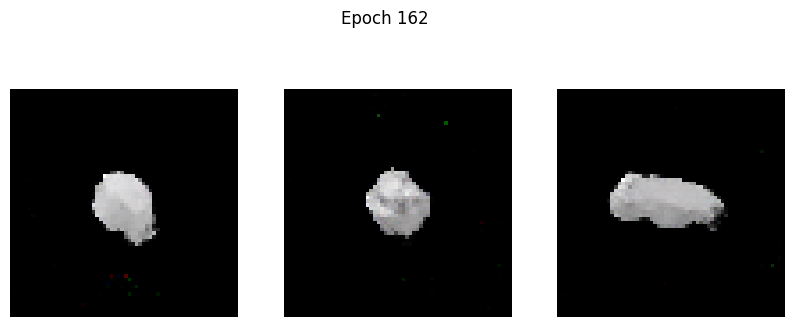

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1510 - g_loss: 3.1013
Epoch 163/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1520 - g_loss: 3.0502

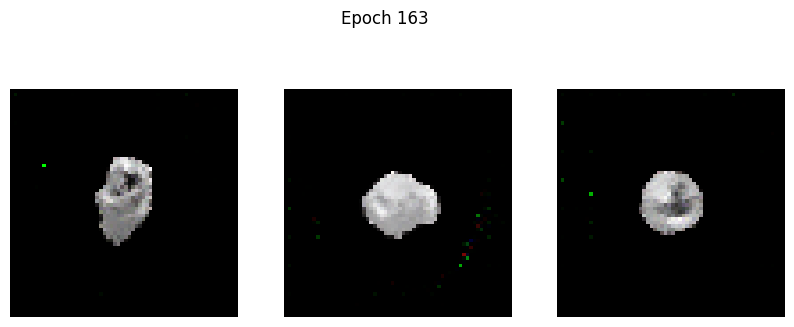

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1522 - g_loss: 3.0504
Epoch 164/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1770 - g_loss: 3.2250

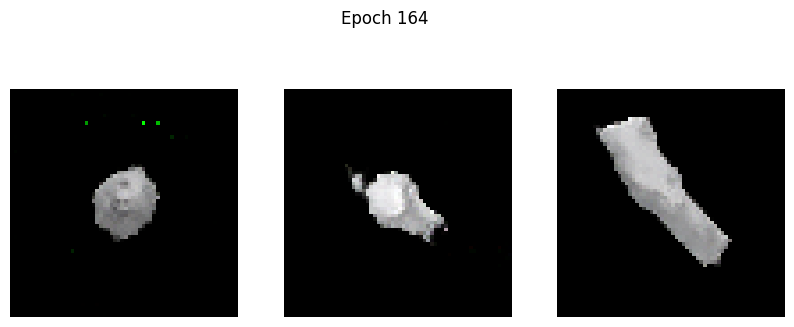

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1773 - g_loss: 3.2249
Epoch 165/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1416 - g_loss: 3.0446

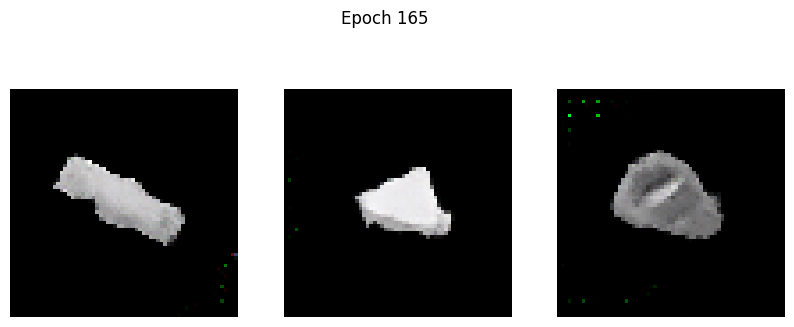

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1414 - g_loss: 3.0448
Epoch 166/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2456 - g_loss: 3.3665

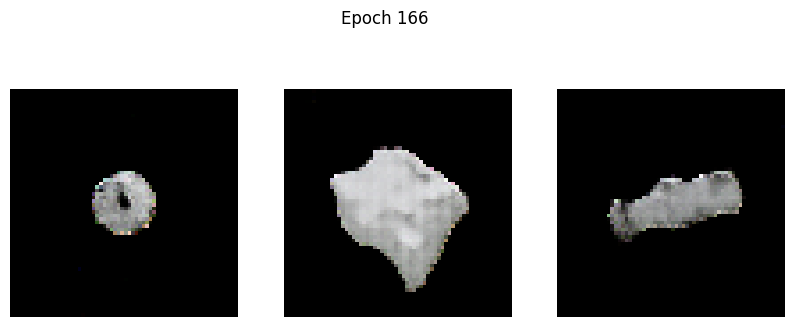

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2493 - g_loss: 3.3716
Epoch 167/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2223 - g_loss: 2.6861

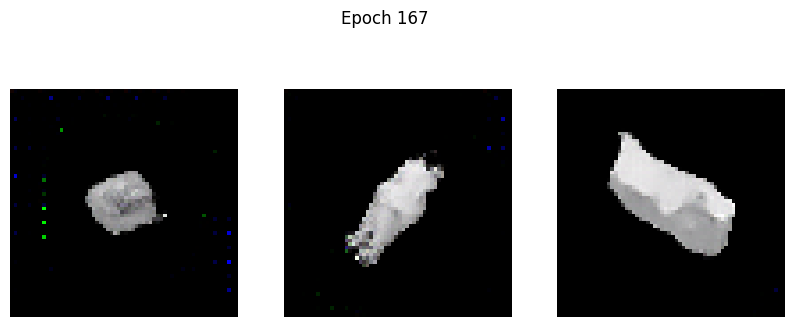

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2219 - g_loss: 2.6864
Epoch 168/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1397 - g_loss: 2.8166

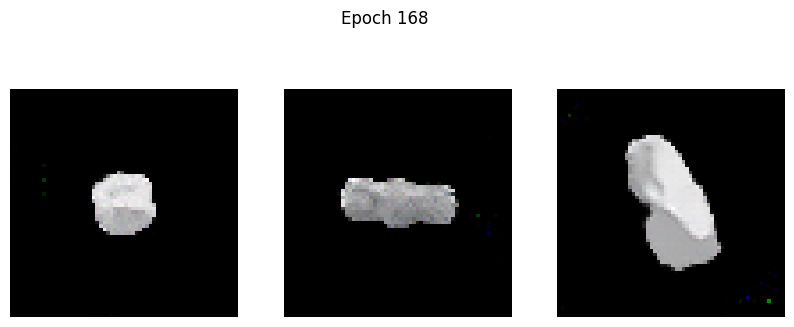

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1396 - g_loss: 2.8167
Epoch 169/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1311 - g_loss: 3.0125

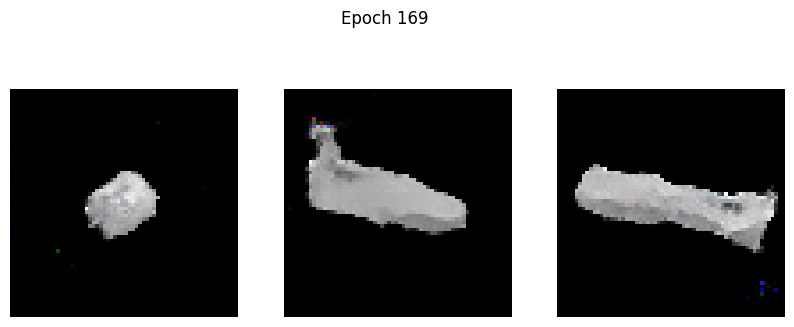

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1310 - g_loss: 3.0116
Epoch 170/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1353 - g_loss: 2.9413

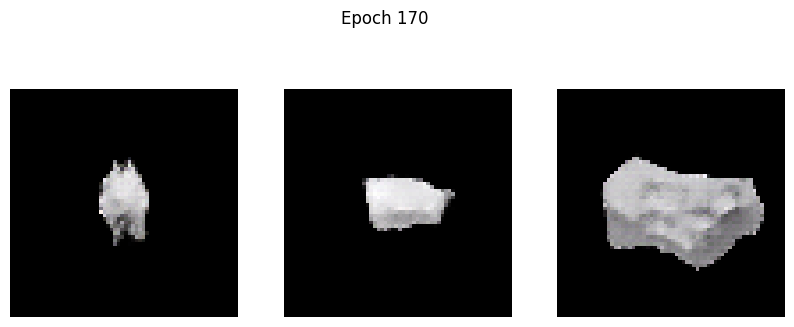

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1355 - g_loss: 2.9433
Epoch 171/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1159 - g_loss: 3.1659

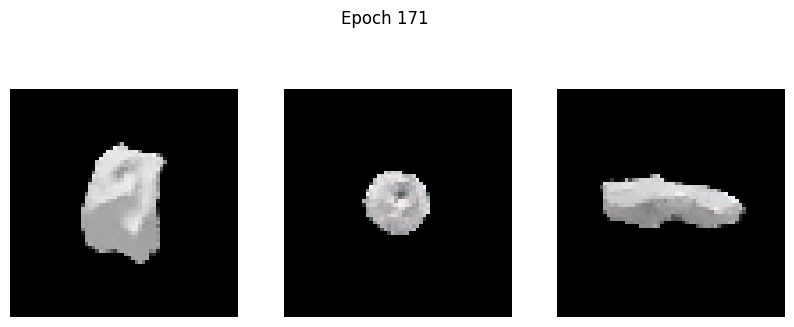

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.1159 - g_loss: 3.1654
Epoch 172/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1294 - g_loss: 3.1443

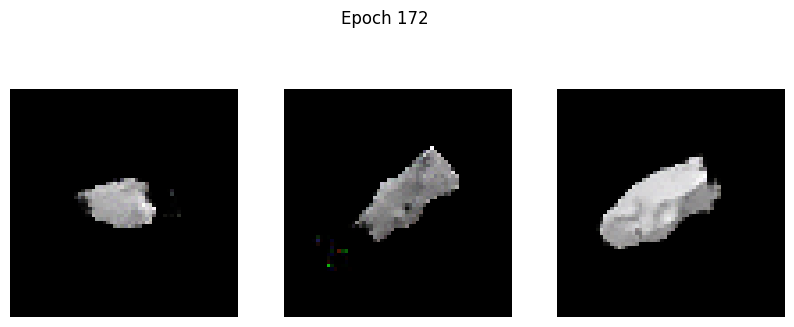

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1295 - g_loss: 3.1443
Epoch 173/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1363 - g_loss: 3.0758

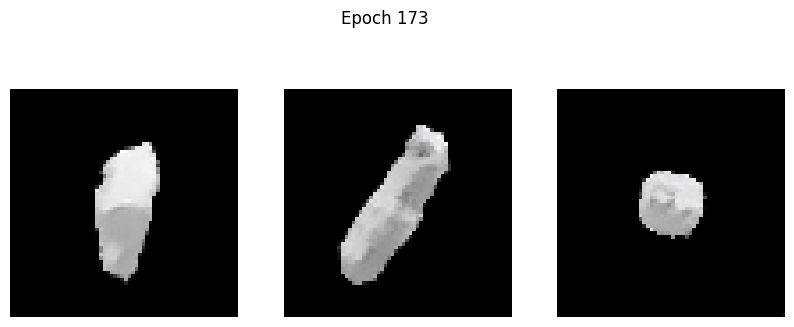

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1363 - g_loss: 3.0764
Epoch 174/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1727 - g_loss: 3.3097

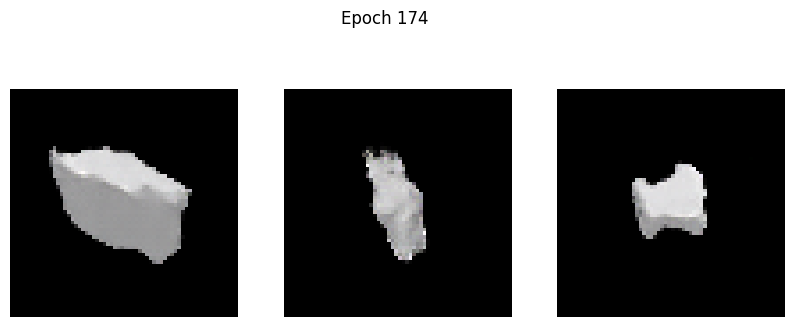

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1727 - g_loss: 3.3091
Epoch 175/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1928 - g_loss: 3.3766

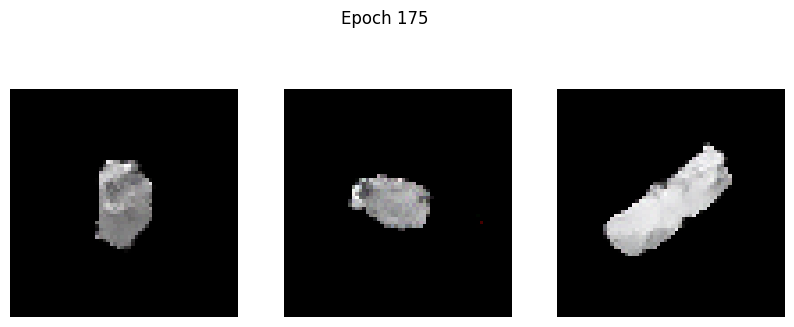

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1925 - g_loss: 3.3752
Epoch 176/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1817 - g_loss: 3.1816

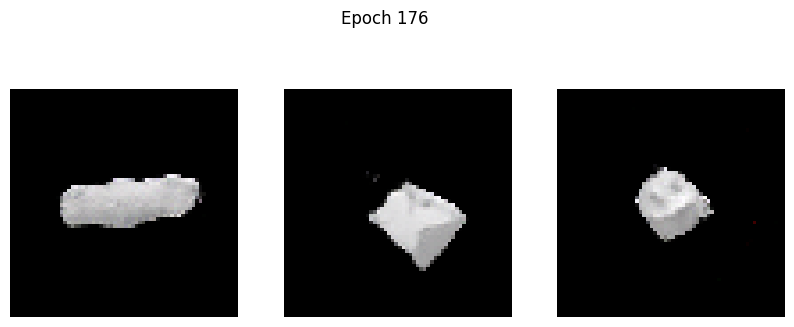

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1816 - g_loss: 3.1816
Epoch 177/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1169 - g_loss: 3.1759

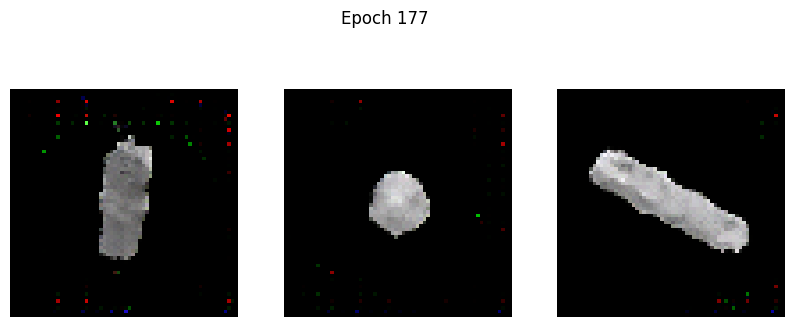

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1176 - g_loss: 3.1770
Epoch 178/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.3332 - g_loss: 3.3568

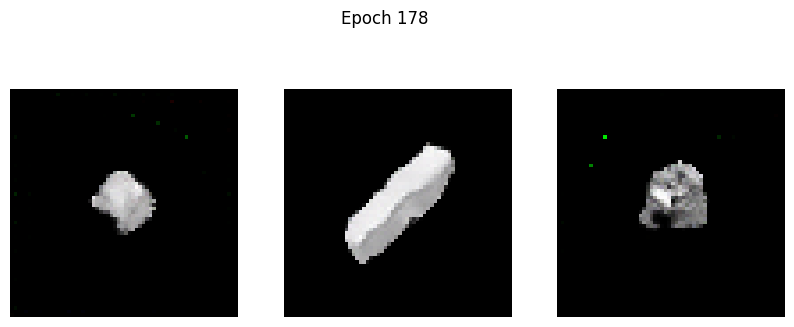

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3319 - g_loss: 3.3550
Epoch 179/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1200 - g_loss: 3.1587

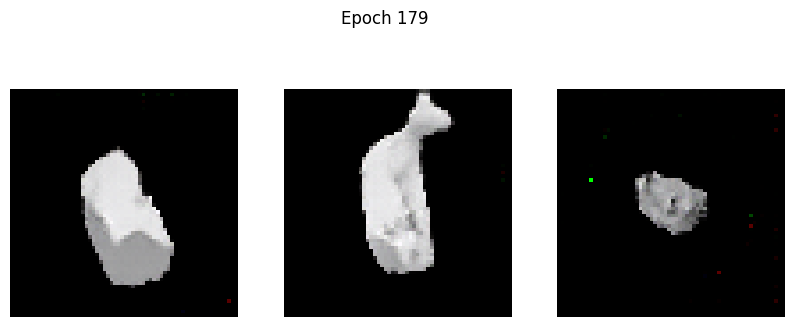

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1201 - g_loss: 3.1587
Epoch 180/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1329 - g_loss: 3.1923

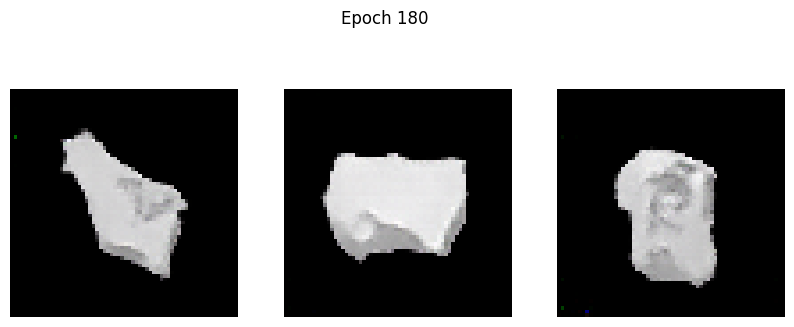

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1331 - g_loss: 3.1927
Epoch 181/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1400 - g_loss: 3.2532

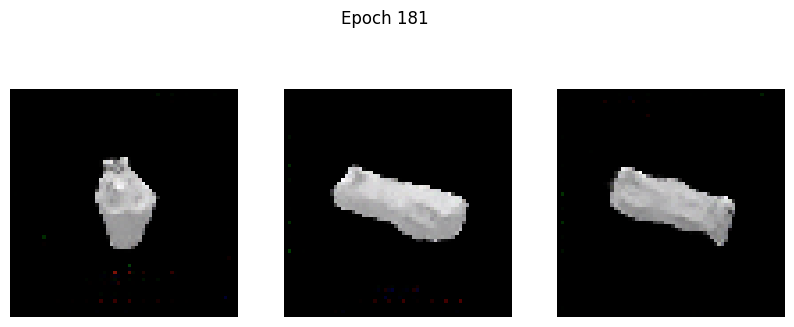

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1399 - g_loss: 3.2531
Epoch 182/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1114 - g_loss: 3.2598

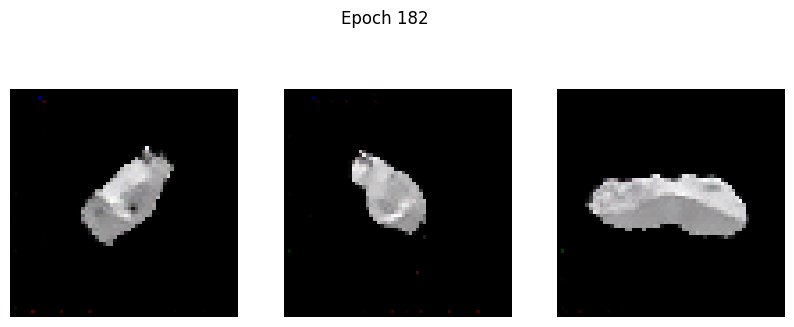

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1115 - g_loss: 3.2598
Epoch 183/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2609 - g_loss: 3.4953

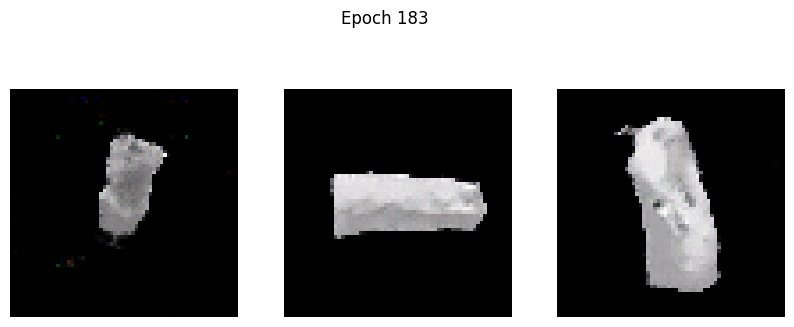

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2603 - g_loss: 3.4938
Epoch 184/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1760 - g_loss: 3.2404

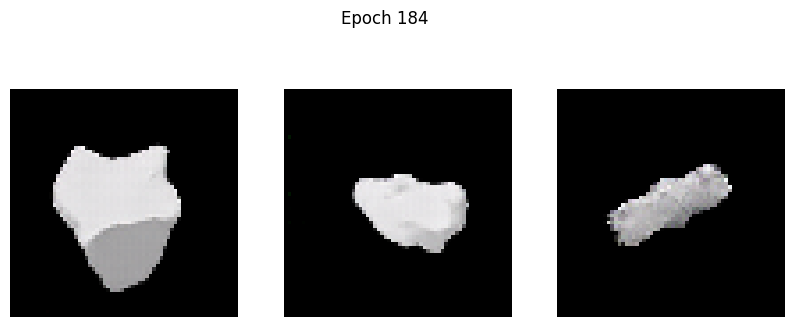

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1755 - g_loss: 3.2401
Epoch 185/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1649 - g_loss: 3.3655

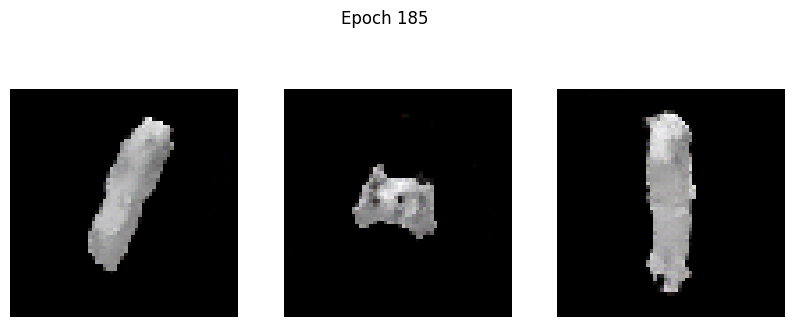

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1656 - g_loss: 3.3672
Epoch 186/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1258 - g_loss: 3.2033

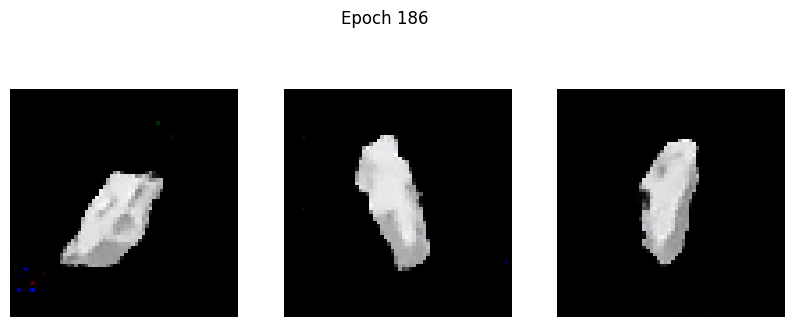

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1258 - g_loss: 3.2033
Epoch 187/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1519 - g_loss: 3.2808

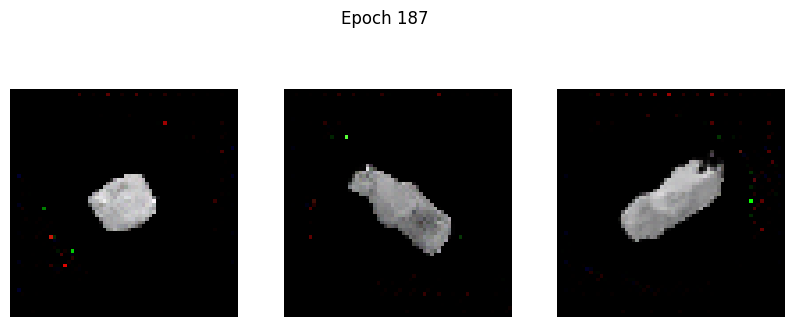

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1520 - g_loss: 3.2812
Epoch 188/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1922 - g_loss: 3.3894

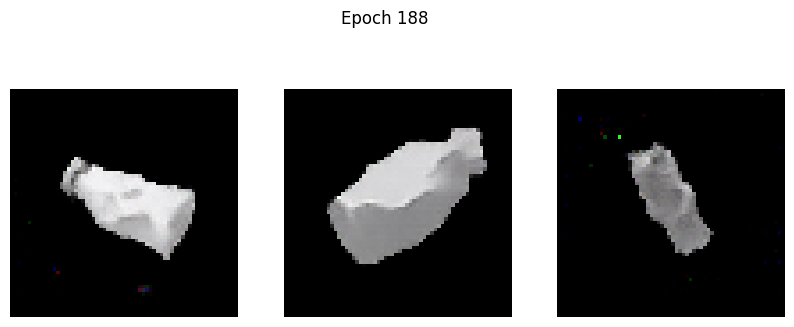

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1923 - g_loss: 3.3891
Epoch 189/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1240 - g_loss: 3.2083

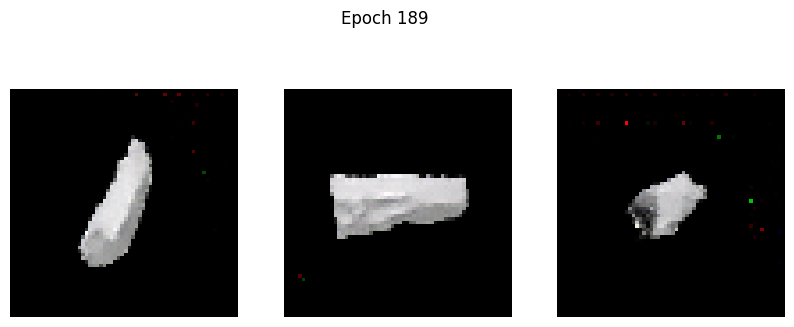

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1241 - g_loss: 3.2089
Epoch 190/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1399 - g_loss: 3.3271

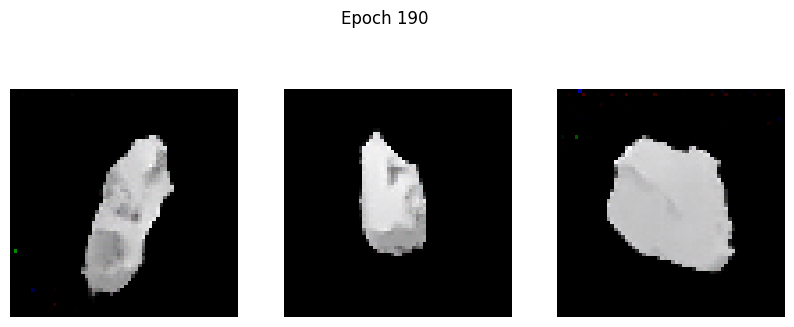

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1398 - g_loss: 3.3268
Epoch 191/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1291 - g_loss: 3.3788

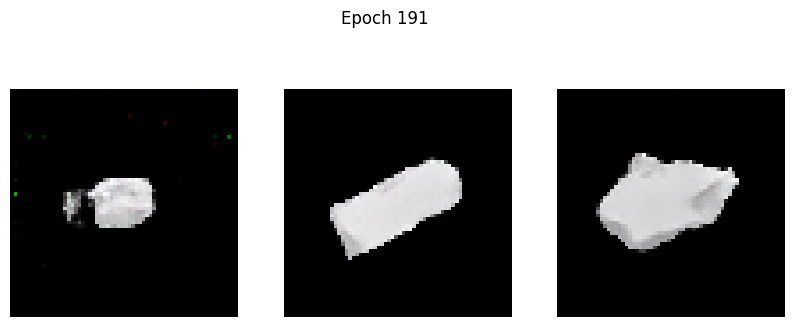

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1290 - g_loss: 3.3782
Epoch 192/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1090 - g_loss: 3.3238

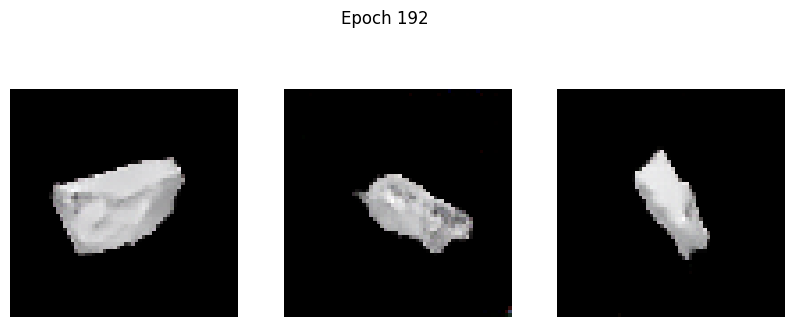

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1092 - g_loss: 3.3243
Epoch 193/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3457 - g_loss: 3.6073

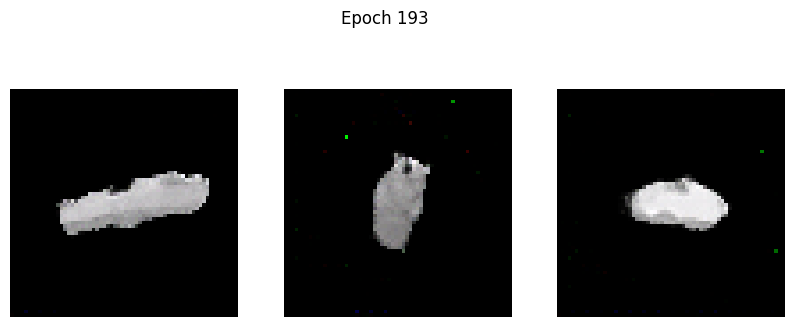

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - d_loss: 0.3455 - g_loss: 3.6061
Epoch 194/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.1017 - g_loss: 3.2136

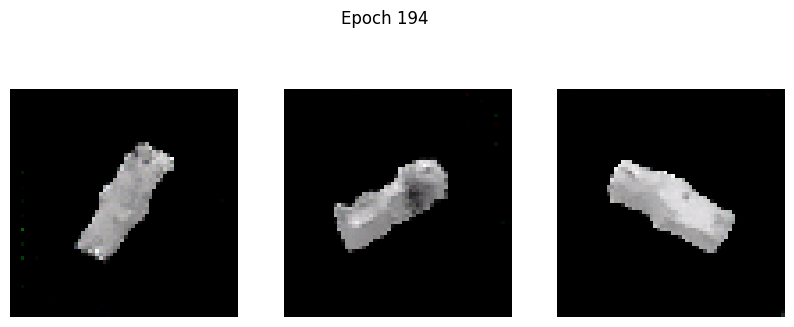

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1017 - g_loss: 3.2136
Epoch 195/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.1110 - g_loss: 3.2824

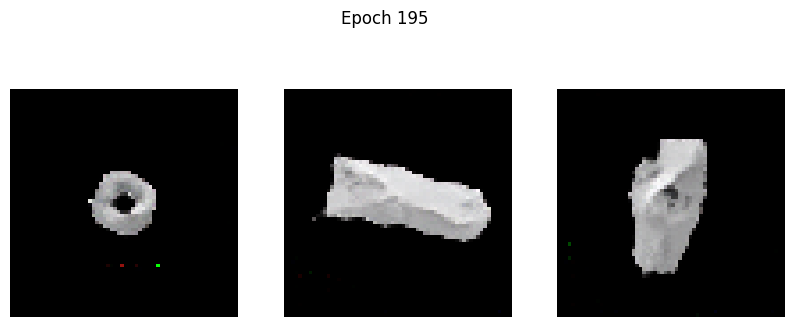

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1111 - g_loss: 3.2826
Epoch 196/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.3106 - g_loss: 3.5663

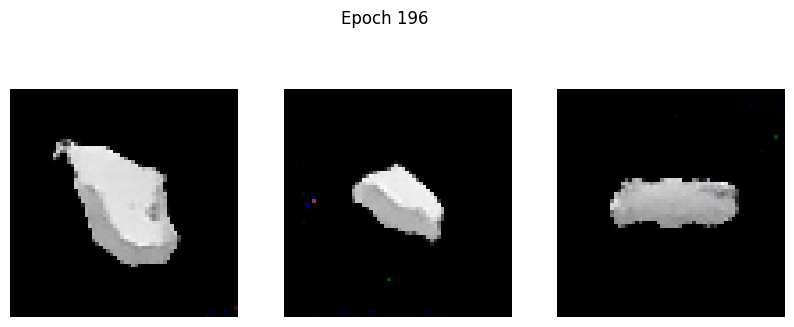

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.3095 - g_loss: 3.5642
Epoch 197/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1129 - g_loss: 3.2361

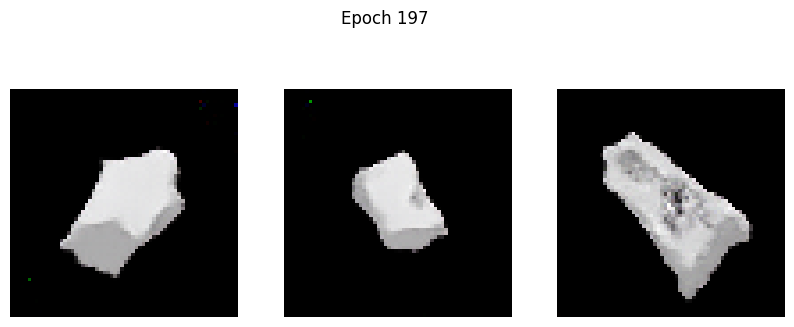

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1130 - g_loss: 3.2369
Epoch 198/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1309 - g_loss: 3.4933

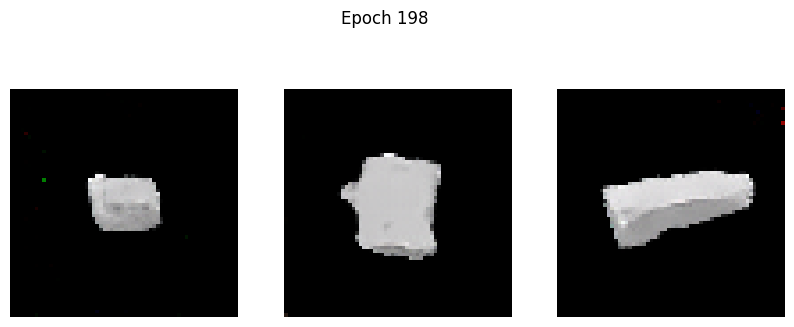

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: 0.1307 - g_loss: 3.4924
Epoch 199/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1380 - g_loss: 3.3896

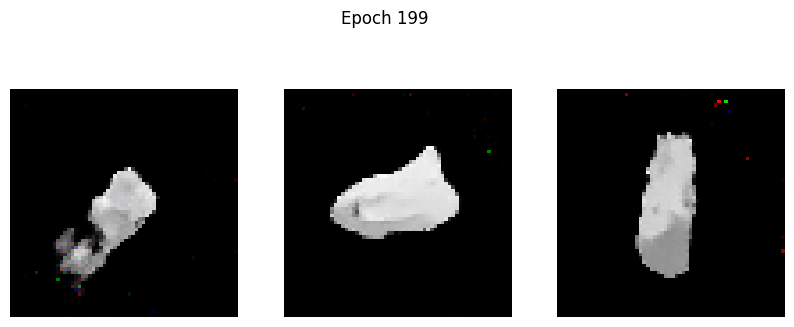

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1382 - g_loss: 3.3899
Epoch 200/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1181 - g_loss: 3.4180

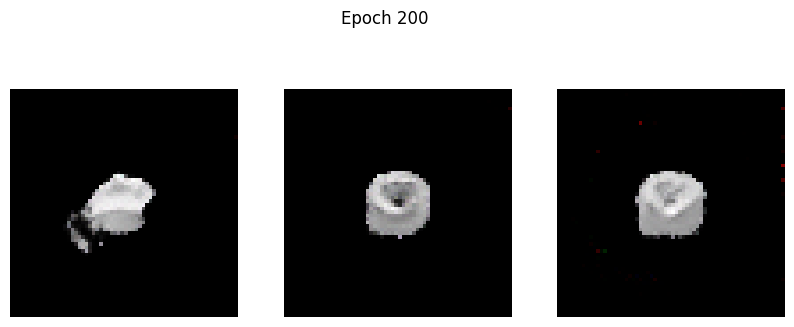

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1187 - g_loss: 3.4190
Epoch 201/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1737 - g_loss: 3.3485

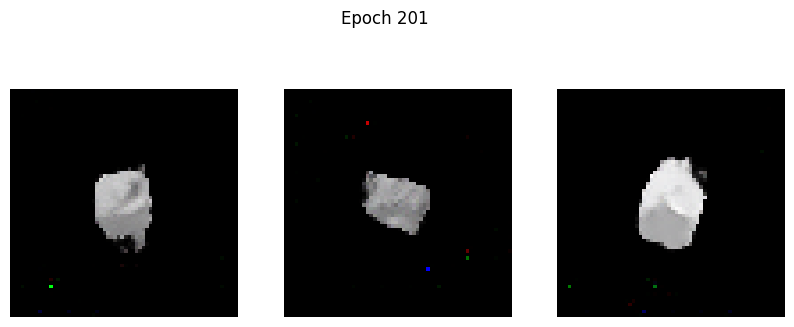

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1735 - g_loss: 3.3485
Epoch 202/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1216 - g_loss: 3.3701

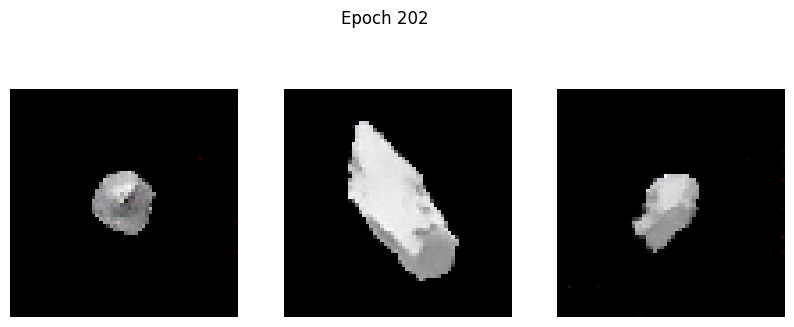

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1217 - g_loss: 3.3696
Epoch 203/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1461 - g_loss: 3.4856

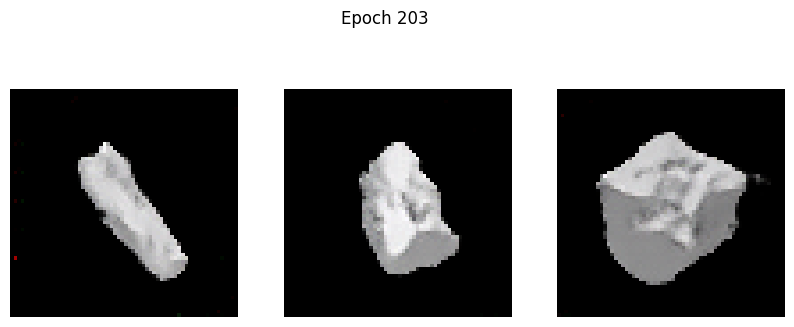

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1459 - g_loss: 3.4846
Epoch 204/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.6822 - g_loss: 3.9866

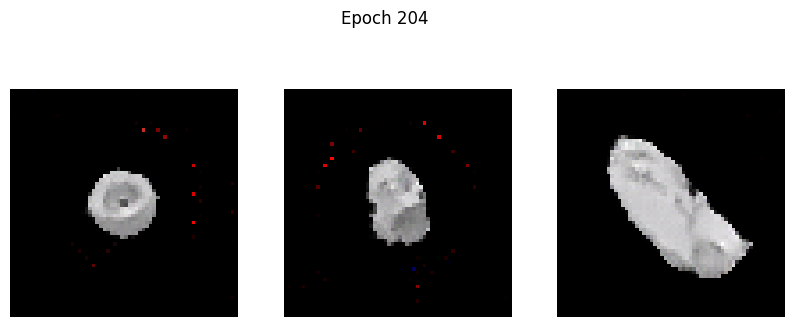

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.6824 - g_loss: 3.9844
Epoch 205/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1370 - g_loss: 2.9962

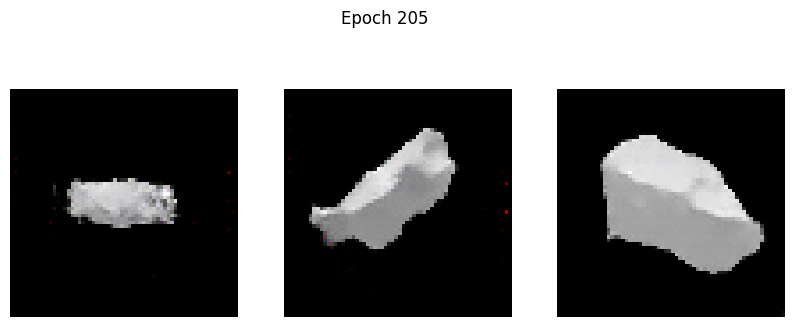

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1369 - g_loss: 2.9973
Epoch 206/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1140 - g_loss: 3.2038

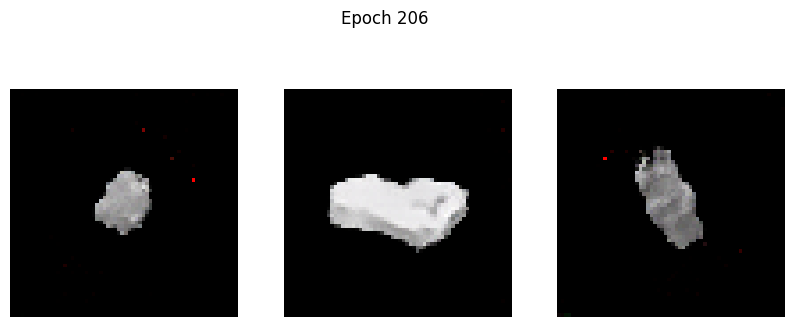

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1140 - g_loss: 3.2040
Epoch 207/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1020 - g_loss: 3.2846

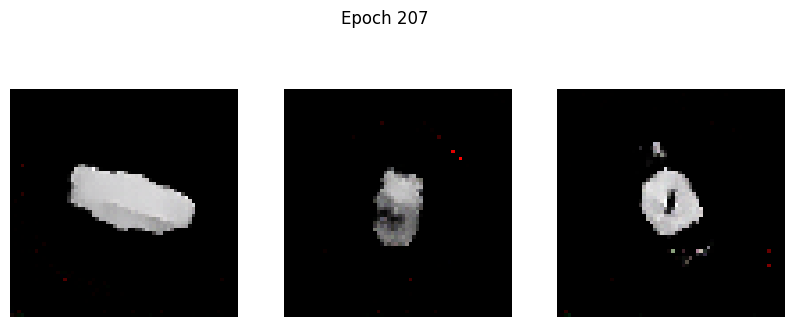

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1020 - g_loss: 3.2845
Epoch 208/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1106 - g_loss: 3.3467

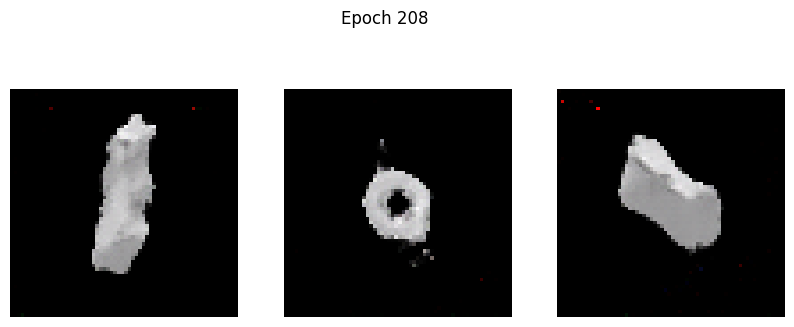

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1106 - g_loss: 3.3466
Epoch 209/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1067 - g_loss: 3.3401

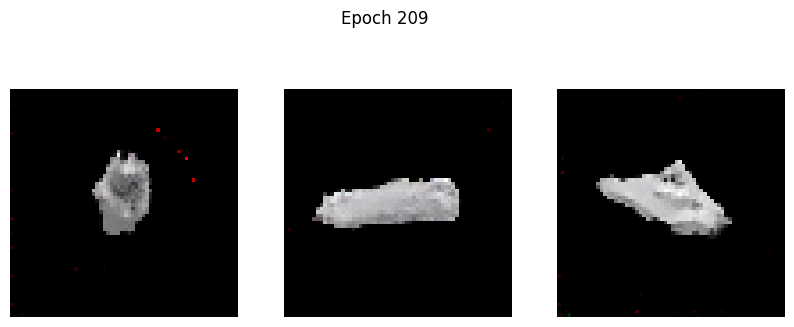

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1067 - g_loss: 3.3405
Epoch 210/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1315 - g_loss: 3.4965

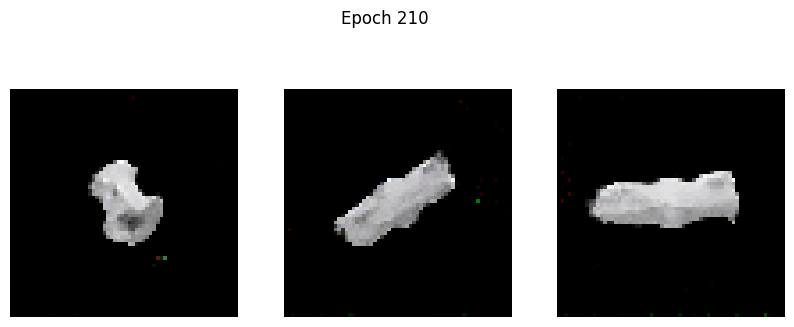

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1313 - g_loss: 3.4957
Epoch 211/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1220 - g_loss: 3.4602

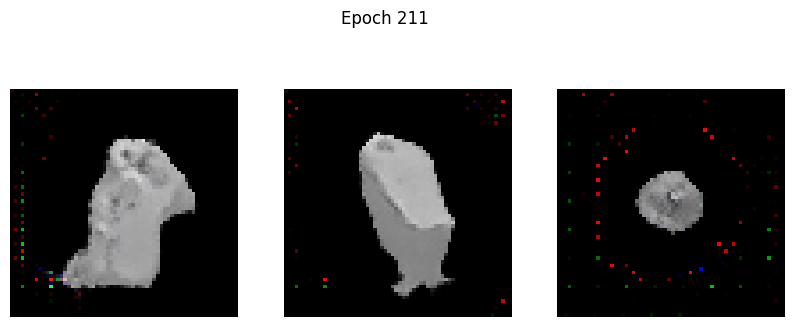

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1227 - g_loss: 3.4611
Epoch 212/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1282 - g_loss: 3.4187

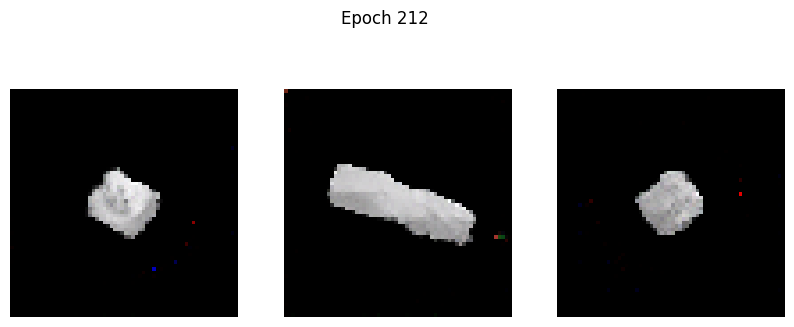

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1280 - g_loss: 3.4183
Epoch 213/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1070 - g_loss: 3.4850

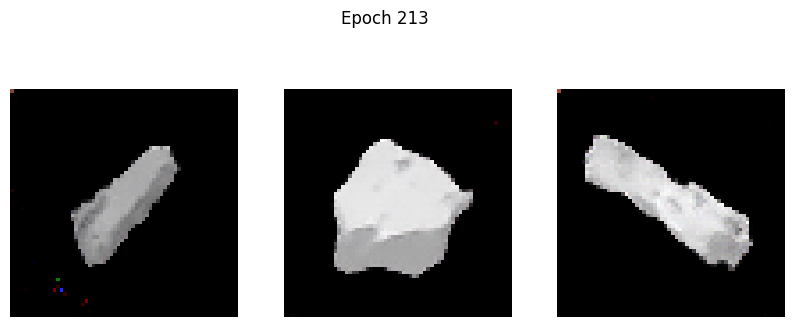

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1071 - g_loss: 3.4855
Epoch 214/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1139 - g_loss: 3.4162

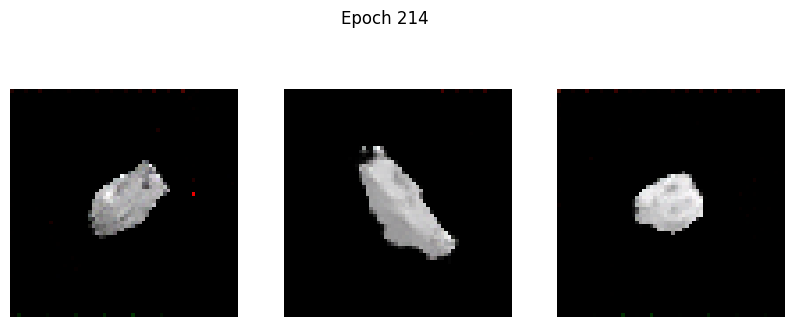

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1137 - g_loss: 3.4165
Epoch 215/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1598 - g_loss: 3.5678

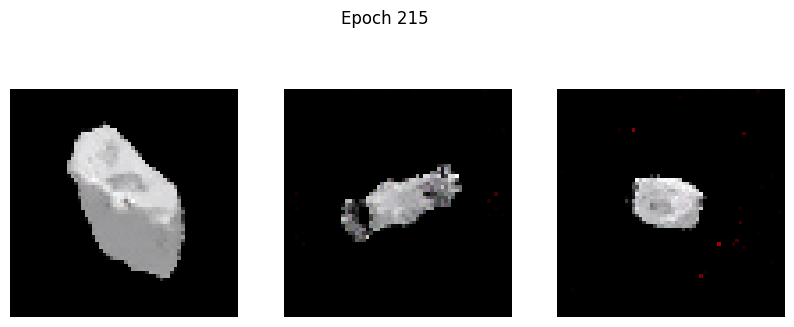

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1597 - g_loss: 3.5672
Epoch 216/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1038 - g_loss: 3.4429

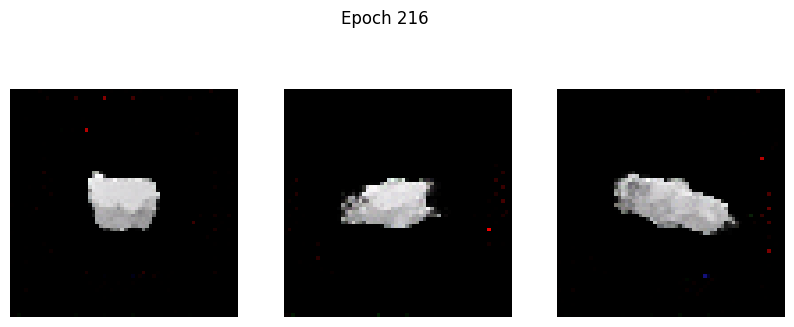

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1040 - g_loss: 3.4438
Epoch 217/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0943 - g_loss: 3.4990

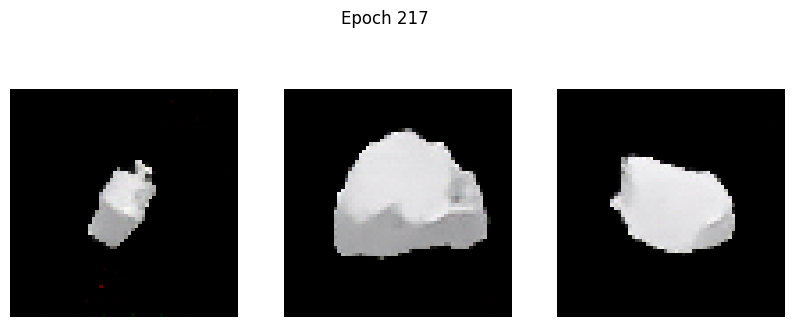

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0944 - g_loss: 3.4994
Epoch 218/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2022 - g_loss: 3.6846

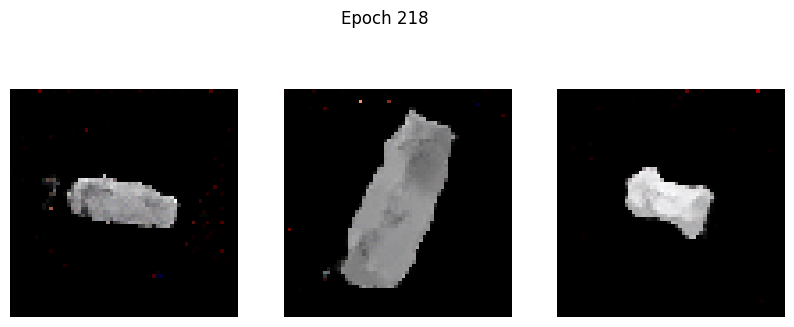

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2022 - g_loss: 3.6842
Epoch 219/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1016 - g_loss: 3.4762

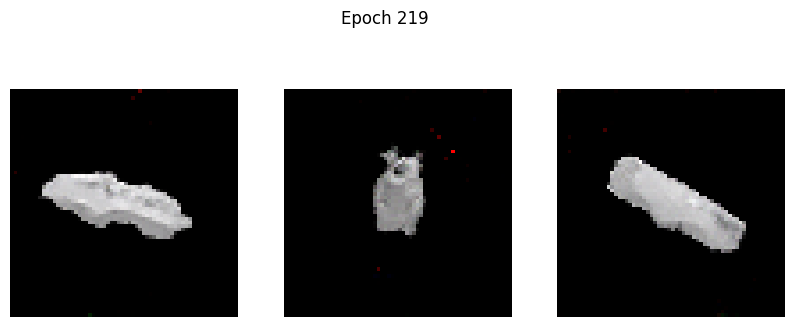

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1017 - g_loss: 3.4762
Epoch 220/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1323 - g_loss: 3.5520

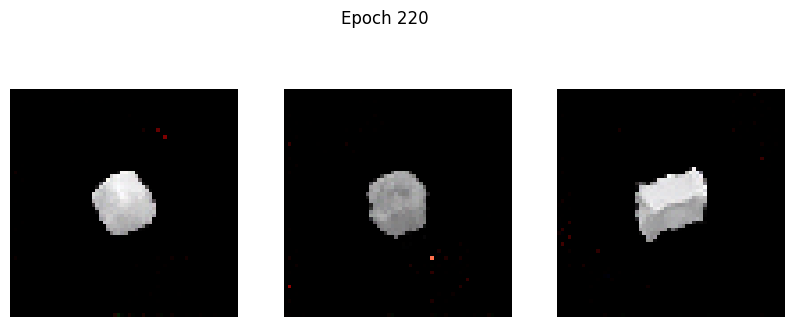

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1329 - g_loss: 3.5526
Epoch 221/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0956 - g_loss: 3.4712

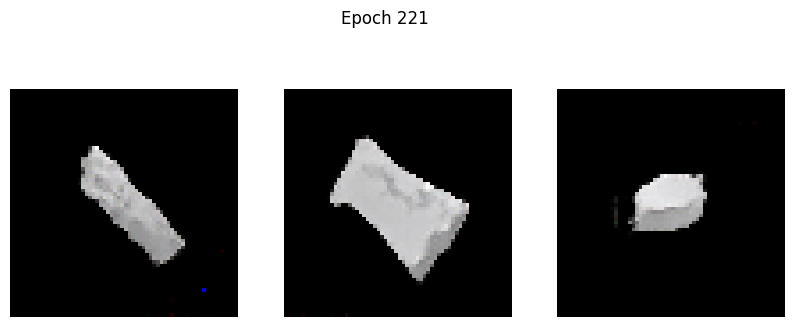

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0956 - g_loss: 3.4715
Epoch 222/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1167 - g_loss: 3.5776

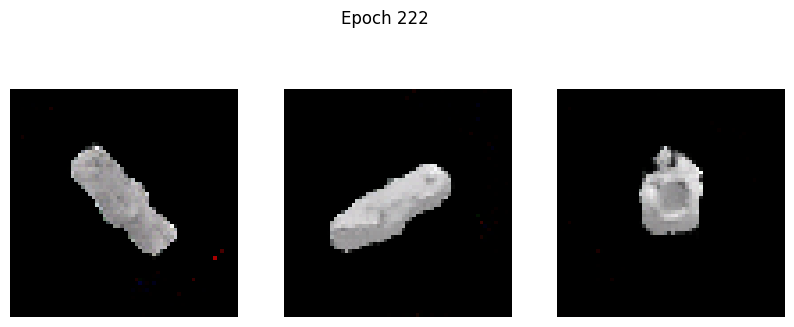

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1166 - g_loss: 3.5773
Epoch 223/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1261 - g_loss: 3.6041

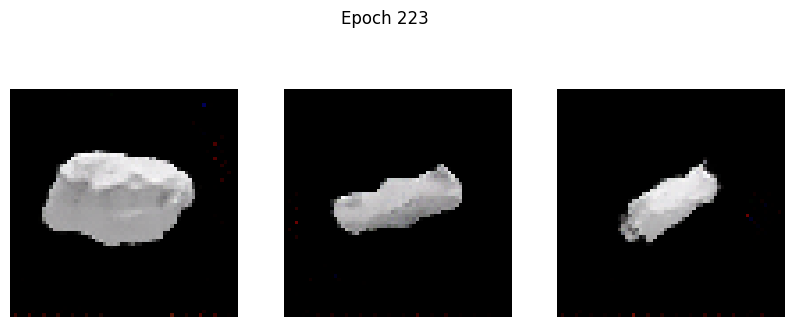

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1263 - g_loss: 3.6046
Epoch 224/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0786 - g_loss: 3.5062

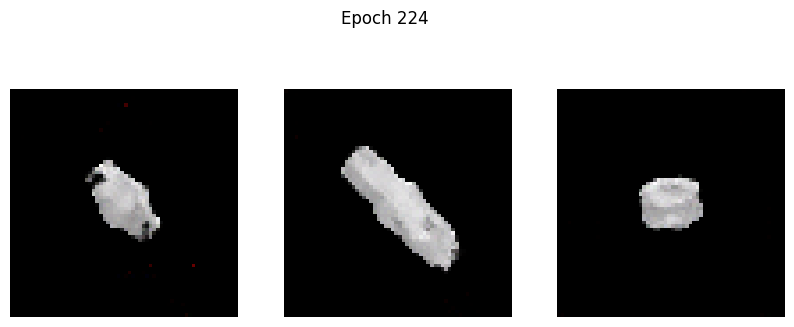

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0788 - g_loss: 3.5066
Epoch 225/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2055 - g_loss: 3.7909

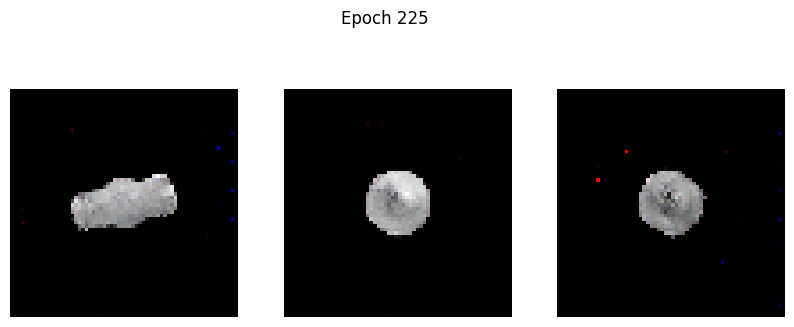

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2051 - g_loss: 3.7896
Epoch 226/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1046 - g_loss: 3.5237

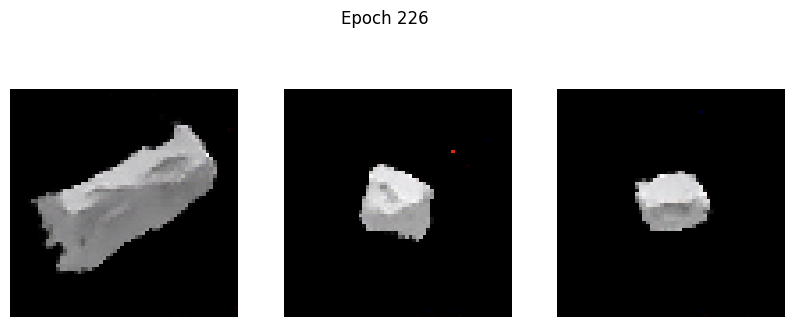

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1045 - g_loss: 3.5244
Epoch 227/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0859 - g_loss: 3.6450

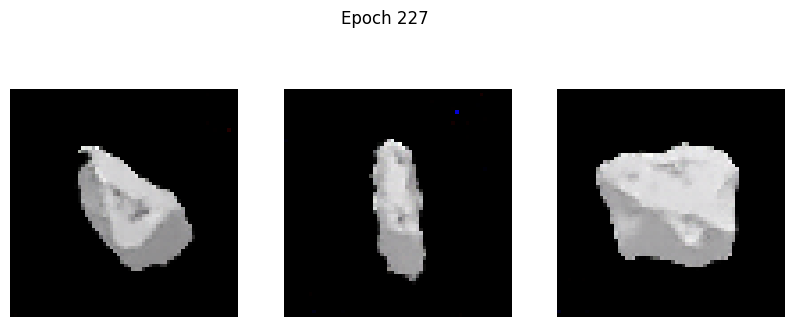

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0860 - g_loss: 3.6445
Epoch 228/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1336 - g_loss: 3.6359

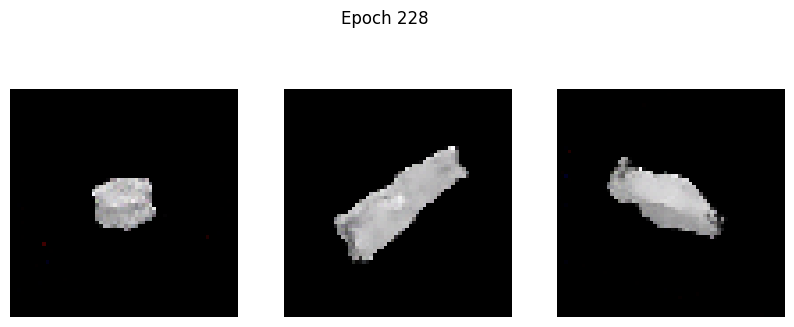

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1338 - g_loss: 3.6364
Epoch 229/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1549 - g_loss: 3.7393

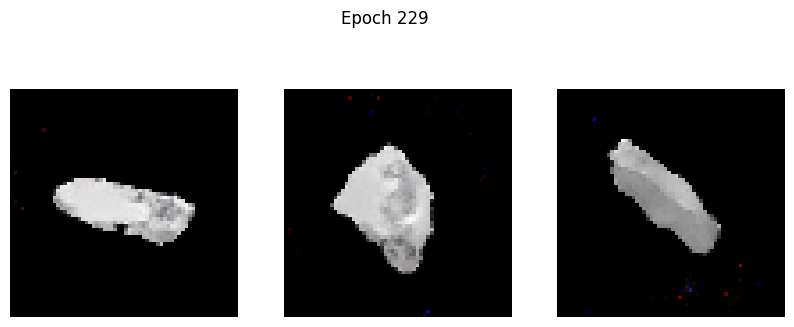

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1549 - g_loss: 3.7386
Epoch 230/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1317 - g_loss: 3.7025

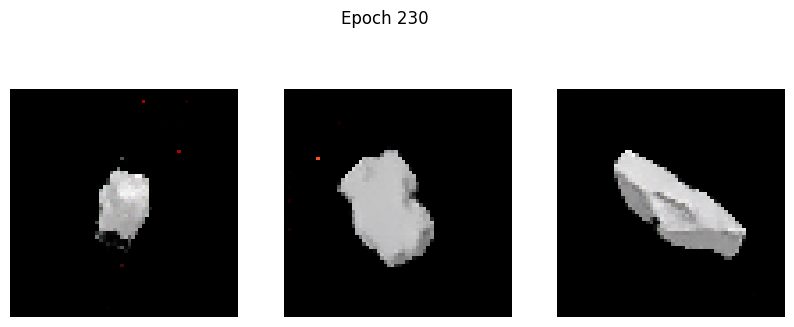

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1317 - g_loss: 3.7026
Epoch 231/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1124 - g_loss: 3.6493

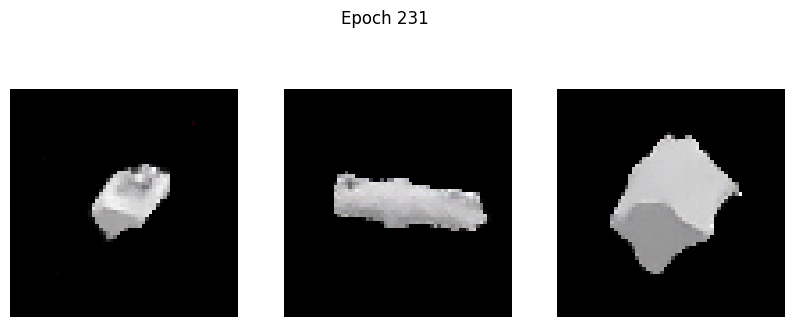

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1124 - g_loss: 3.6497
Epoch 232/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0752 - g_loss: 3.6067

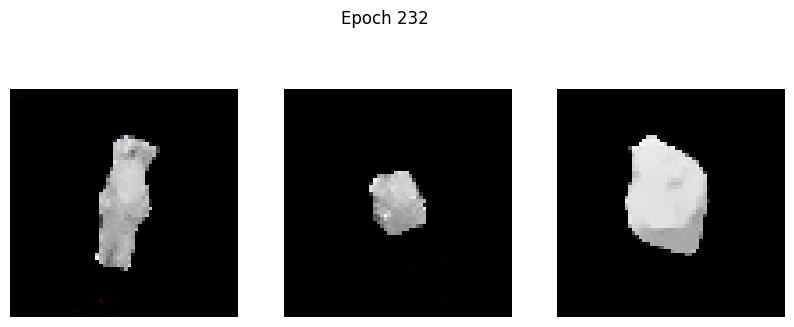

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0753 - g_loss: 3.6074
Epoch 233/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1386 - g_loss: 3.7717

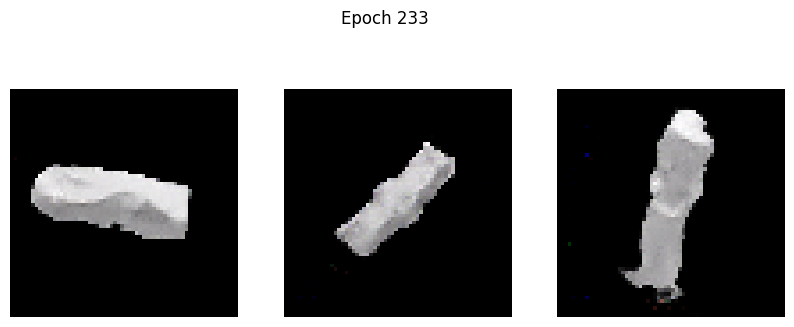

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1388 - g_loss: 3.7711
Epoch 234/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1033 - g_loss: 3.6028

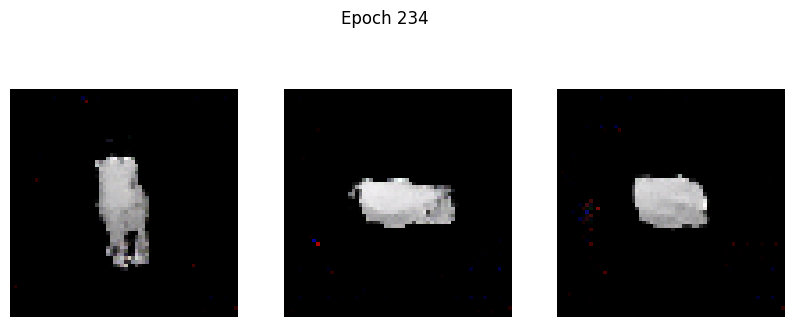

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1036 - g_loss: 3.6040
Epoch 235/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0836 - g_loss: 3.6402

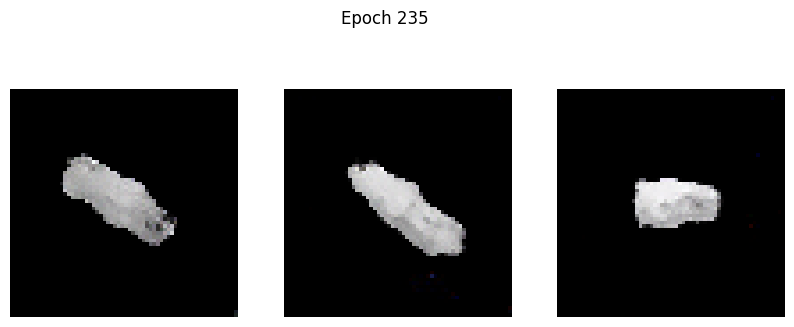

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0837 - g_loss: 3.6407
Epoch 236/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1329 - g_loss: 3.8490

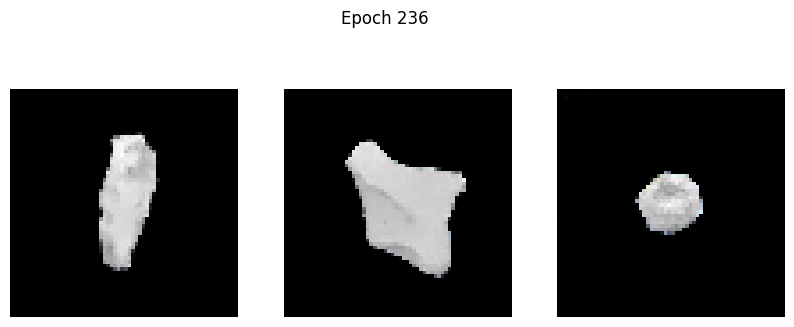

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1338 - g_loss: 3.8498
Epoch 237/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1370 - g_loss: 3.6105

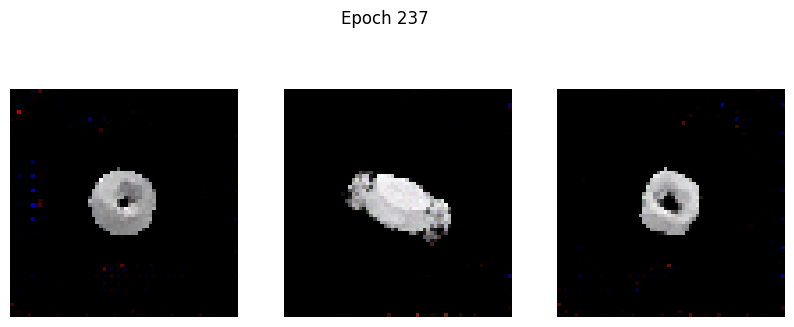

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1368 - g_loss: 3.6103
Epoch 238/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0936 - g_loss: 3.6633

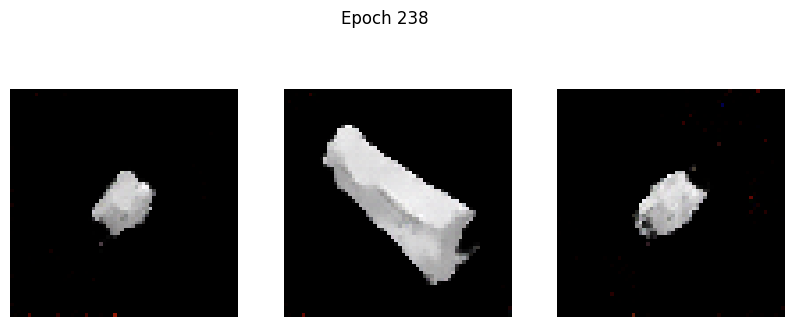

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0937 - g_loss: 3.6632
Epoch 239/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1155 - g_loss: 3.6537

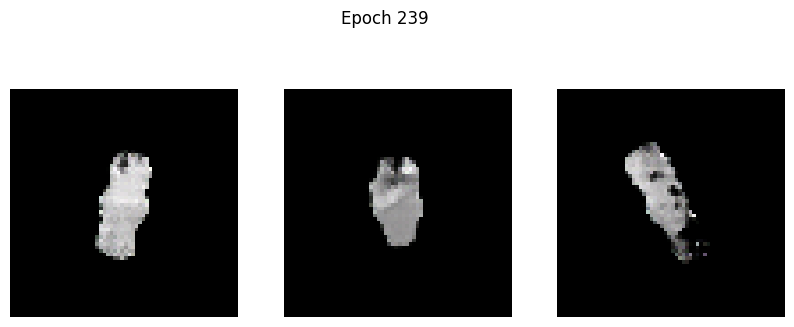

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1155 - g_loss: 3.6557
Epoch 240/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: 0.0845 - g_loss: 3.9579

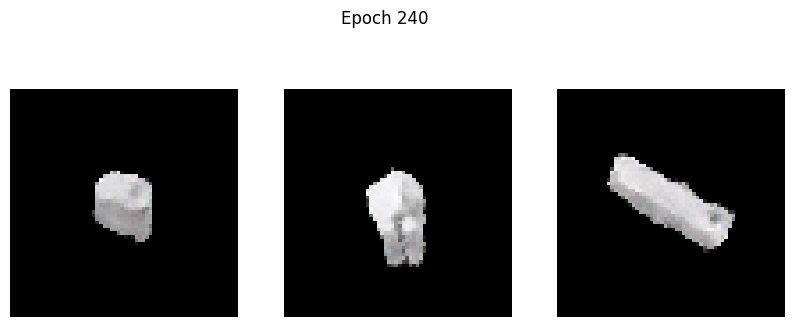

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0845 - g_loss: 3.9561
Epoch 241/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0884 - g_loss: 3.6833

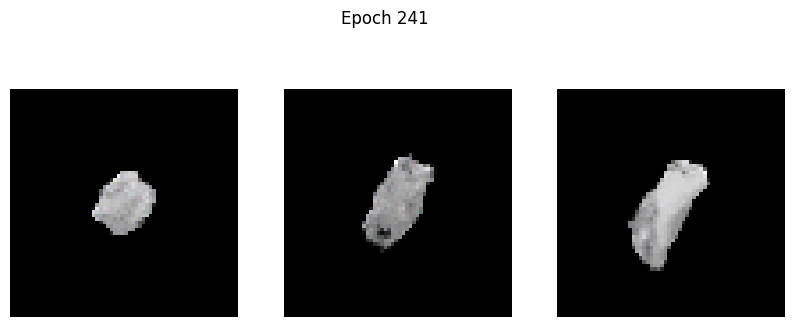

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0884 - g_loss: 3.6839
Epoch 242/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1685 - g_loss: 3.9931

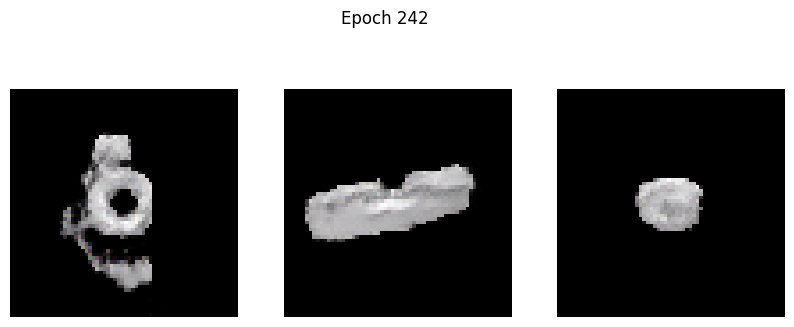

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1687 - g_loss: 3.9924
Epoch 243/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0892 - g_loss: 3.6371

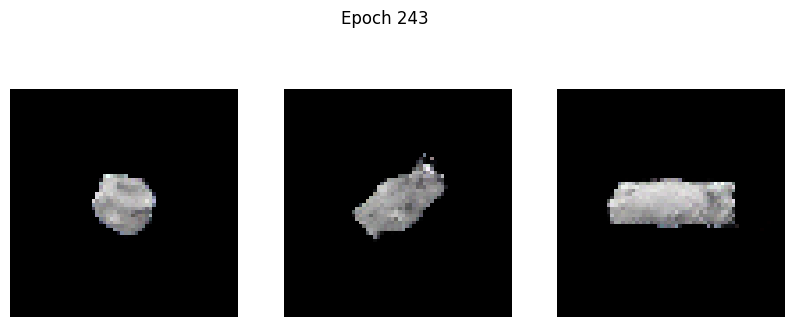

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0902 - g_loss: 3.6394
Epoch 244/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2071 - g_loss: 3.6779

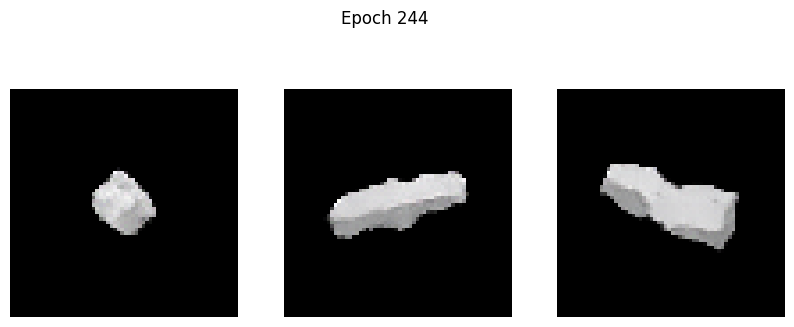

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2064 - g_loss: 3.6774
Epoch 245/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0955 - g_loss: 3.6702

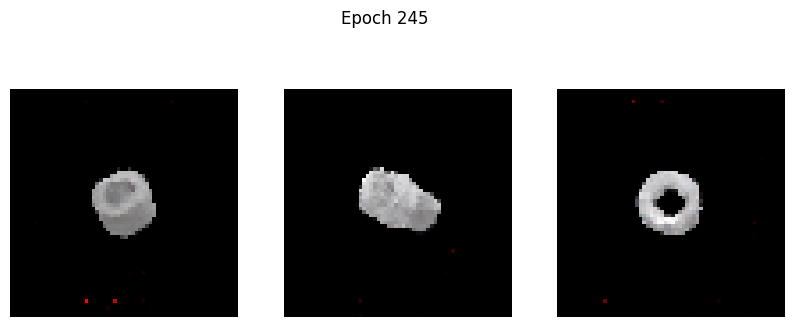

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0956 - g_loss: 3.6710
Epoch 246/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0934 - g_loss: 3.7666

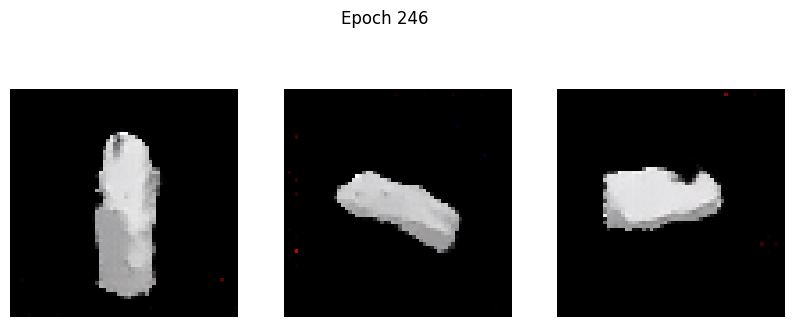

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0934 - g_loss: 3.7665
Epoch 247/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0892 - g_loss: 3.6834

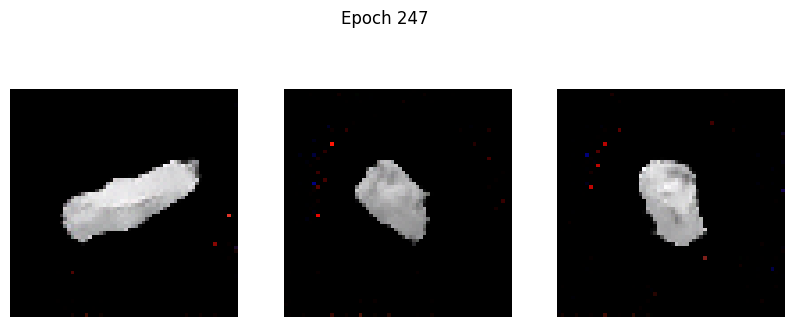

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0892 - g_loss: 3.6846
Epoch 248/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0725 - g_loss: 3.8369

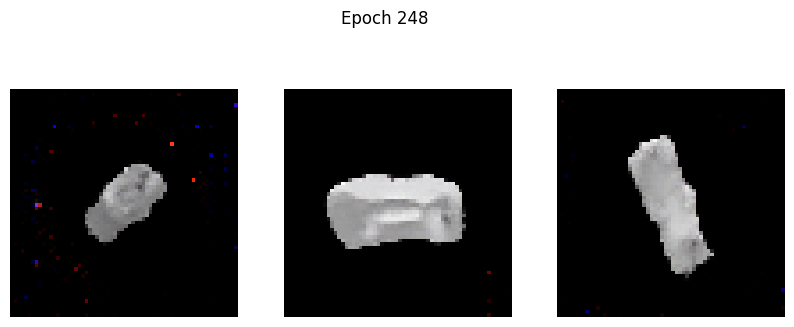

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0729 - g_loss: 3.8373
Epoch 249/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1228 - g_loss: 3.8295

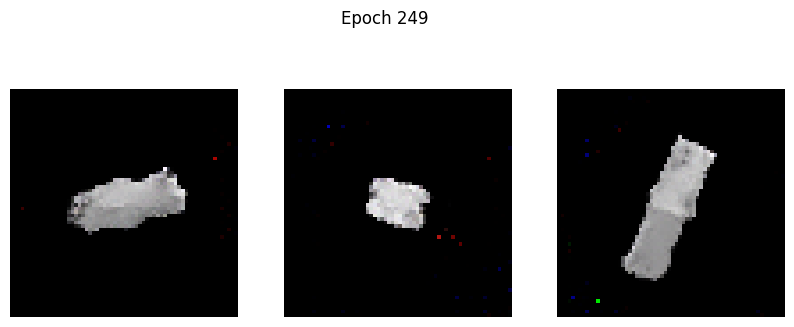

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1229 - g_loss: 3.8299
Epoch 250/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0864 - g_loss: 3.8017

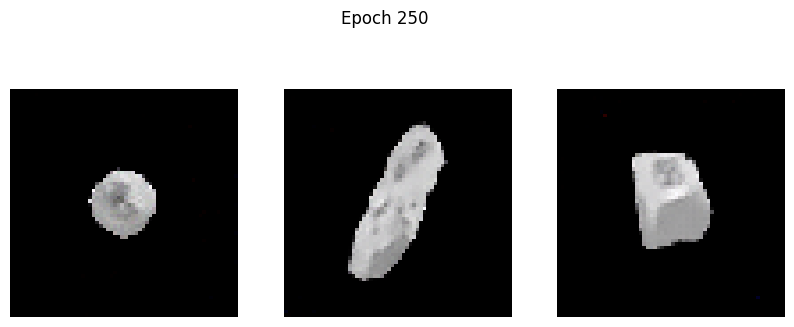

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0864 - g_loss: 3.8019
Epoch 251/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0686 - g_loss: 3.7492

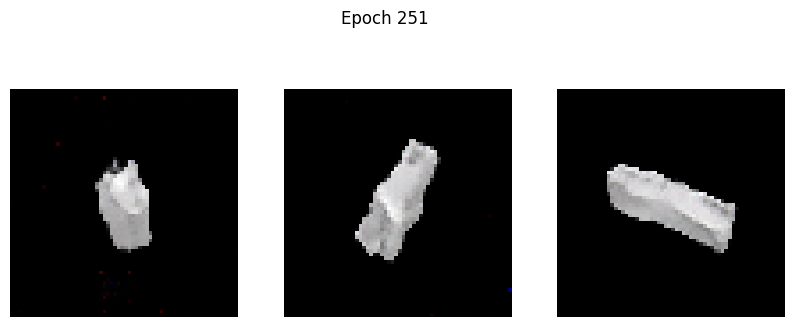

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0686 - g_loss: 3.7496
Epoch 252/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1507 - g_loss: 4.0553

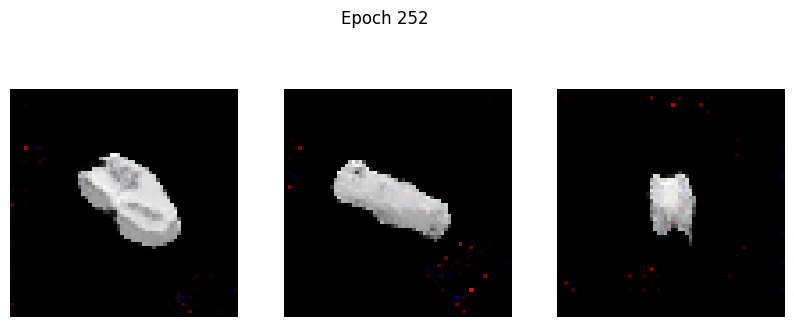

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - d_loss: 0.1505 - g_loss: 4.0539
Epoch 253/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.1090 - g_loss: 3.8527

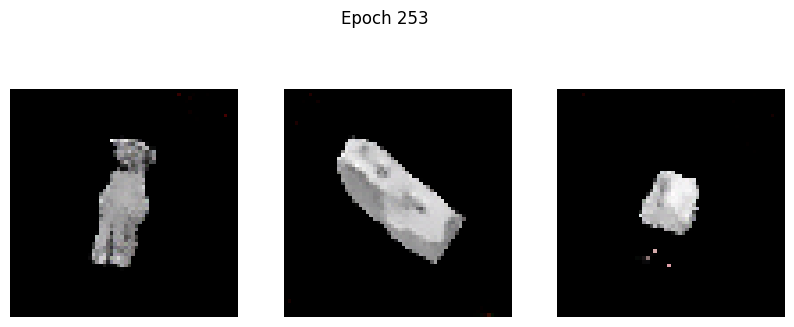

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1094 - g_loss: 3.8533
Epoch 254/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0920 - g_loss: 3.8593

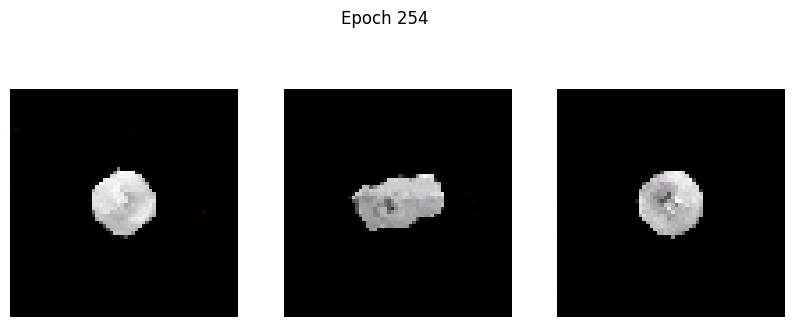

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0920 - g_loss: 3.8598
Epoch 255/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1125 - g_loss: 3.9879

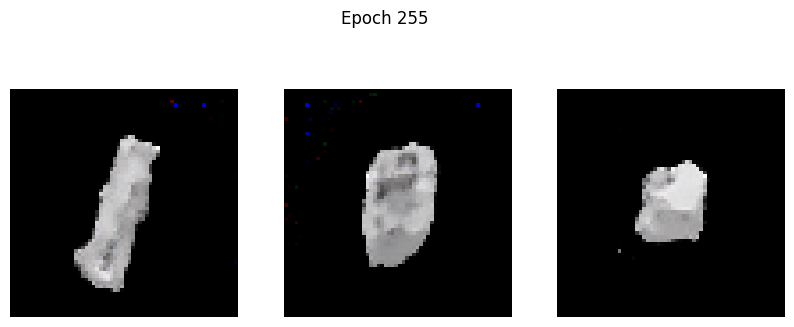

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1124 - g_loss: 3.9875
Epoch 256/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.1120 - g_loss: 3.9428

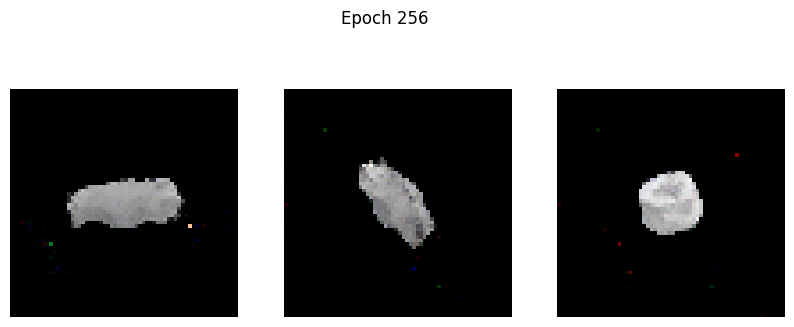

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.1127 - g_loss: 3.9443
Epoch 257/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0883 - g_loss: 3.8650

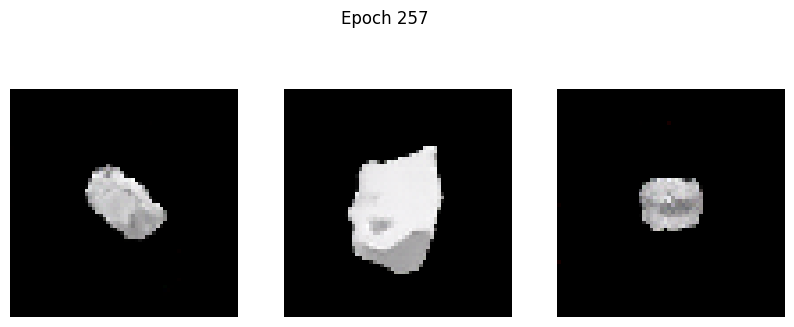

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0882 - g_loss: 3.8646
Epoch 258/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0849 - g_loss: 3.9199

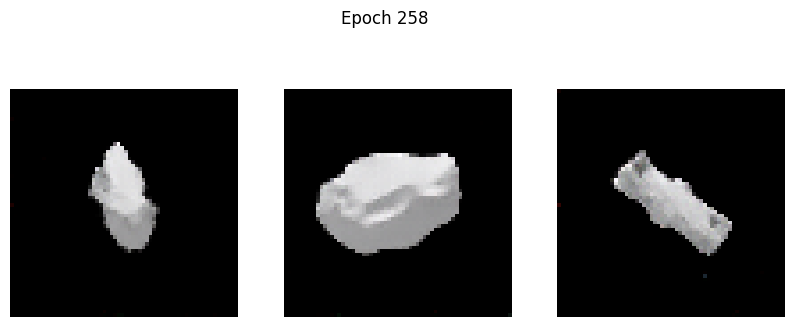

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0849 - g_loss: 3.9201
Epoch 259/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0744 - g_loss: 3.9157

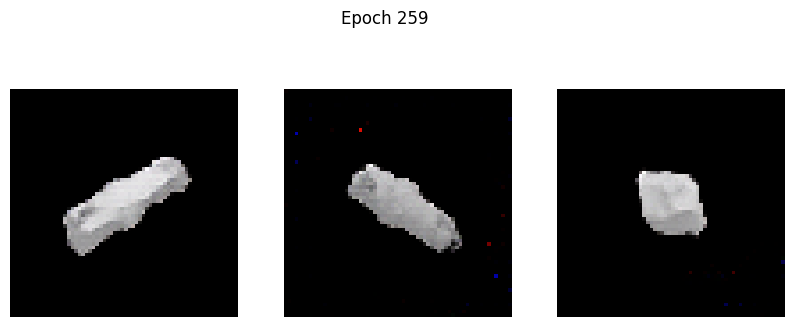

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0746 - g_loss: 3.9163
Epoch 260/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0927 - g_loss: 3.8602

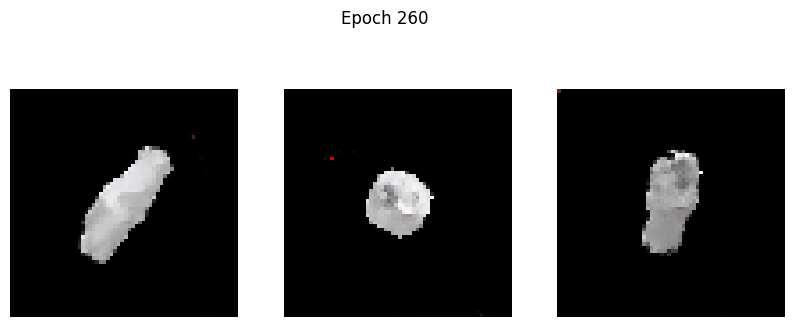

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: 0.0926 - g_loss: 3.8606
Epoch 261/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1242 - g_loss: 4.0292

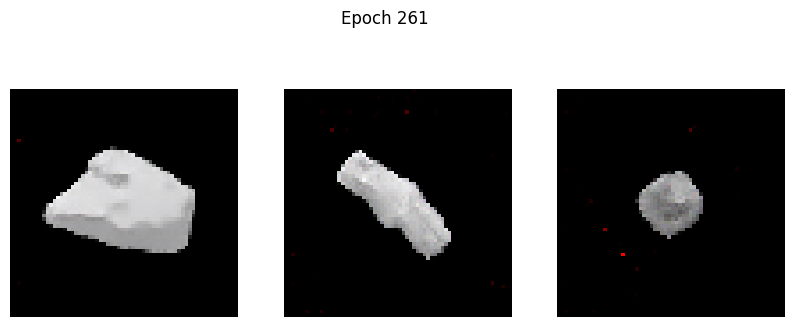

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1246 - g_loss: 4.0295
Epoch 262/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0803 - g_loss: 3.7849

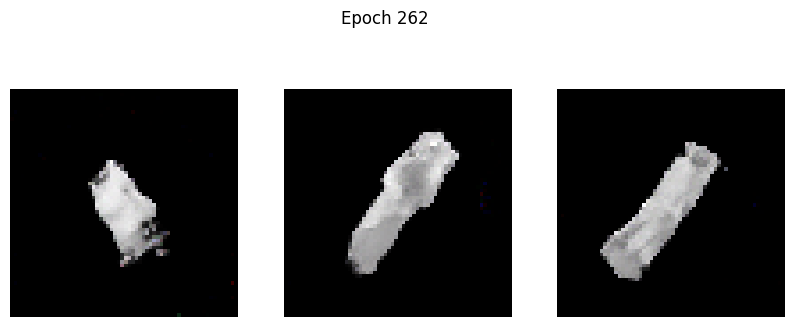

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0802 - g_loss: 3.7851
Epoch 263/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0777 - g_loss: 4.0755

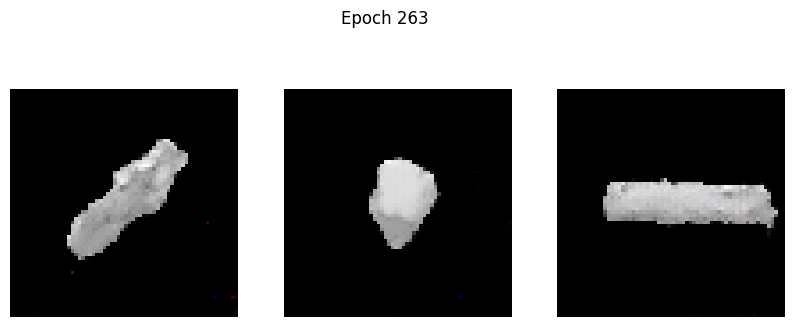

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0778 - g_loss: 4.0749
Epoch 264/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0812 - g_loss: 4.0301

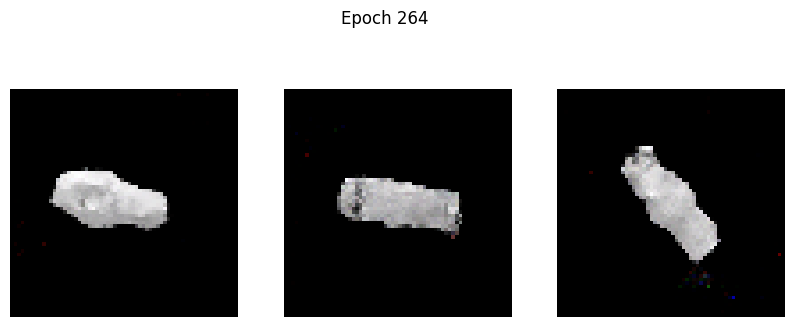

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0813 - g_loss: 4.0296
Epoch 265/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.3071 - g_loss: 4.4455

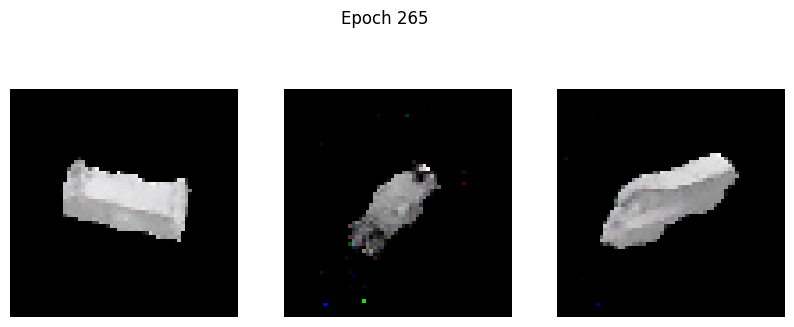

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.3068 - g_loss: 4.4431
Epoch 266/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0863 - g_loss: 3.8533

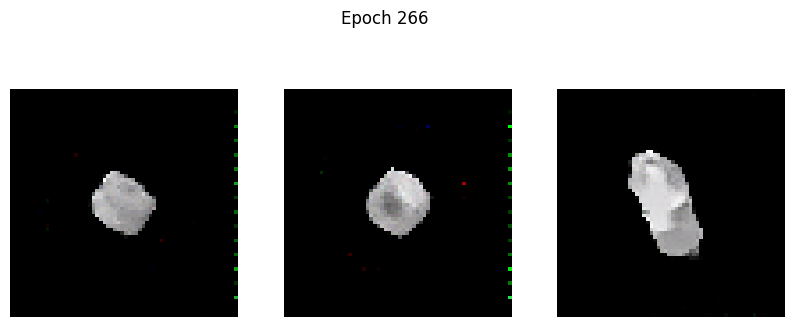

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0865 - g_loss: 3.8545
Epoch 267/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0614 - g_loss: 3.9247

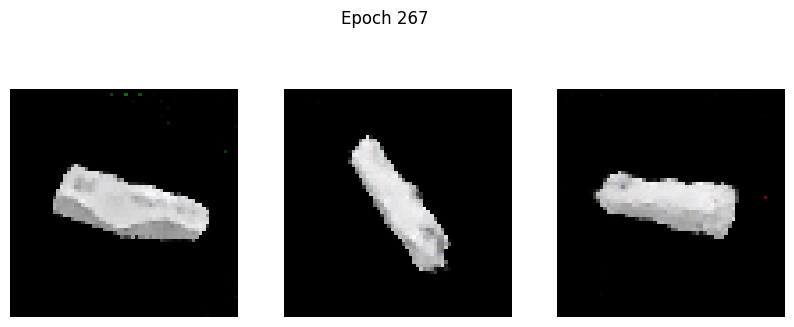

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0614 - g_loss: 3.9241
Epoch 268/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0863 - g_loss: 3.9426

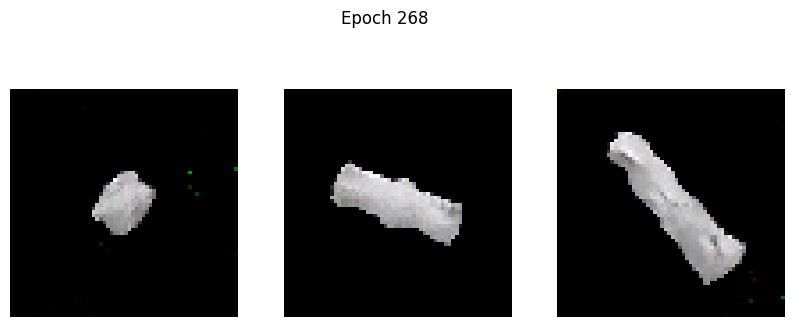

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0863 - g_loss: 3.9425
Epoch 269/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0890 - g_loss: 4.0514

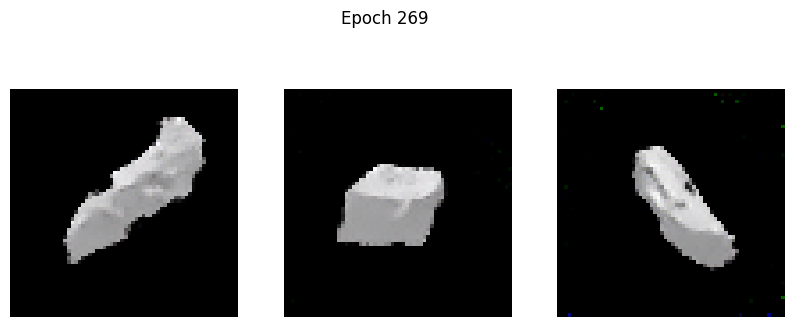

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0889 - g_loss: 4.0506
Epoch 270/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1319 - g_loss: 4.2101

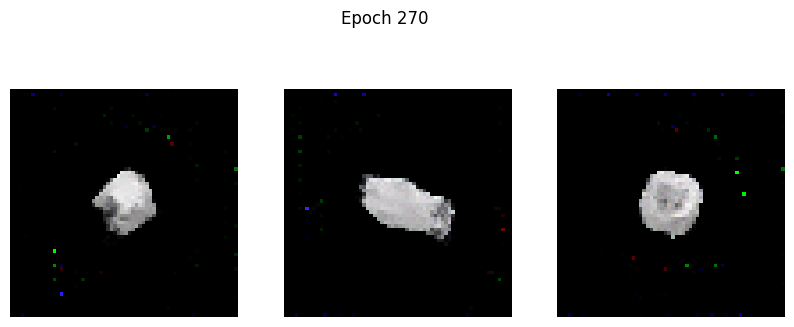

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1321 - g_loss: 4.2098
Epoch 271/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0742 - g_loss: 4.0336

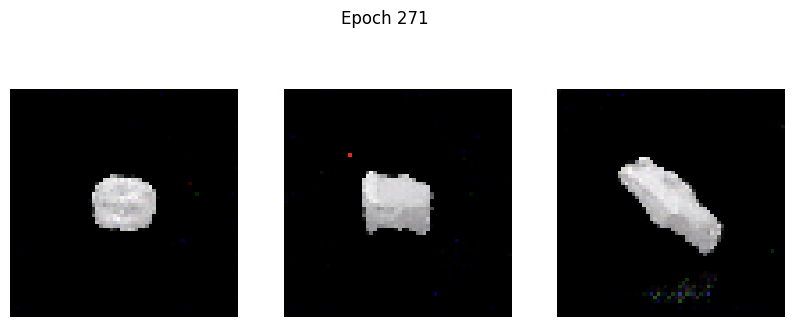

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0743 - g_loss: 4.0336
Epoch 272/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1213 - g_loss: 4.0905

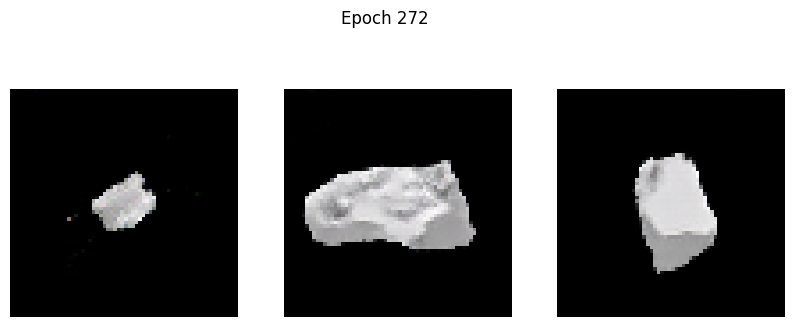

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1212 - g_loss: 4.0903
Epoch 273/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0874 - g_loss: 4.2064

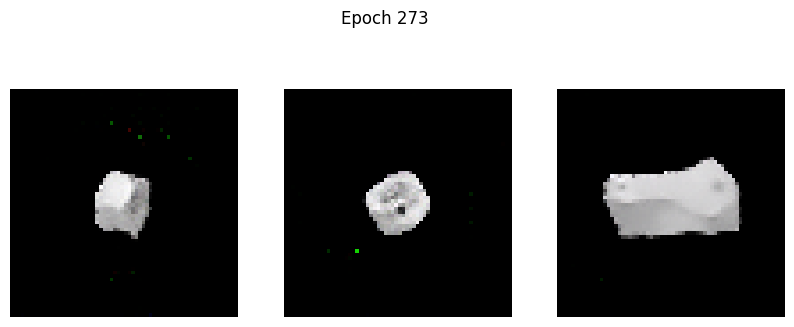

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0873 - g_loss: 4.2056
Epoch 274/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0678 - g_loss: 3.9875

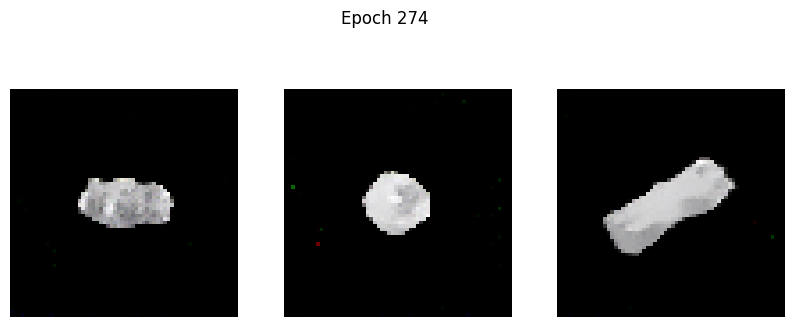

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0682 - g_loss: 3.9888
Epoch 275/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1121 - g_loss: 4.0519

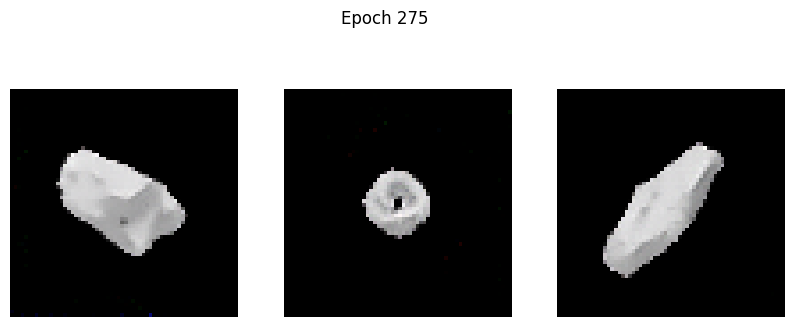

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1120 - g_loss: 4.0519
Epoch 276/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1198 - g_loss: 4.0859

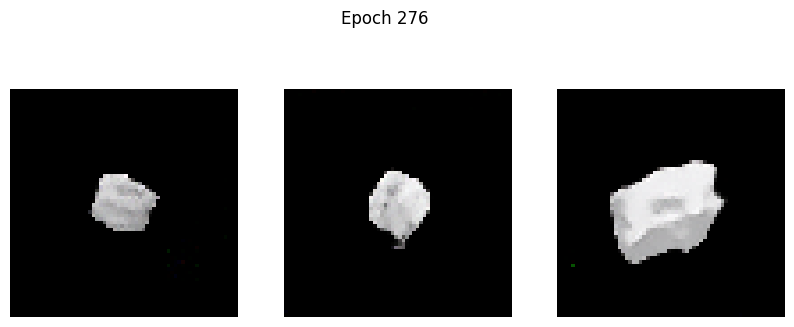

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1198 - g_loss: 4.0860
Epoch 277/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0444 - g_loss: 3.9258

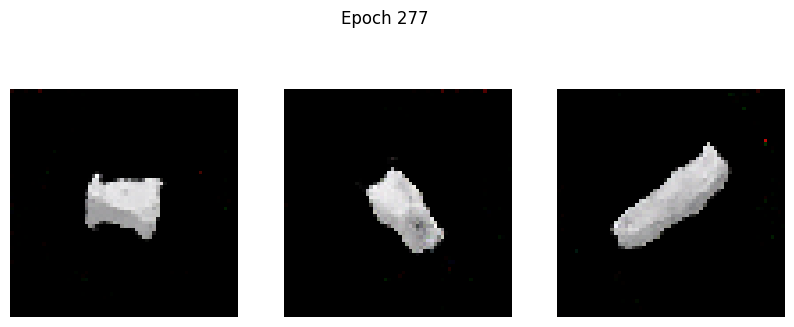

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0445 - g_loss: 3.9265
Epoch 278/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0641 - g_loss: 4.0488

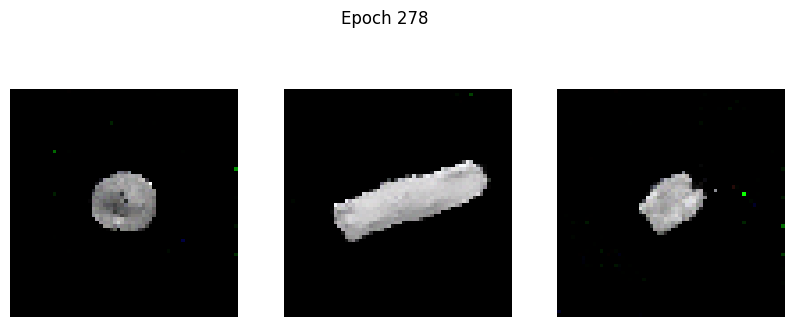

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0641 - g_loss: 4.0488
Epoch 279/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0855 - g_loss: 4.0953

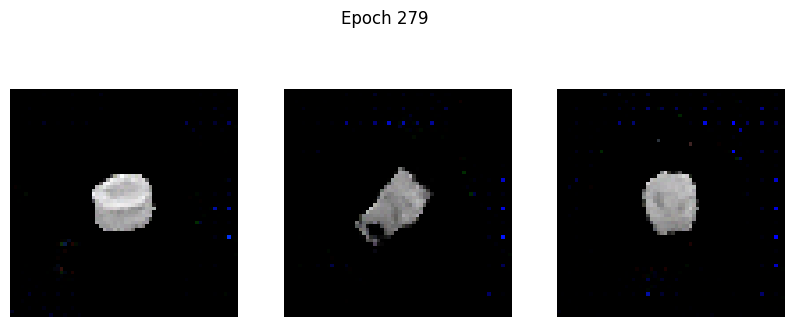

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0862 - g_loss: 4.0965
Epoch 280/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1197 - g_loss: 4.2717

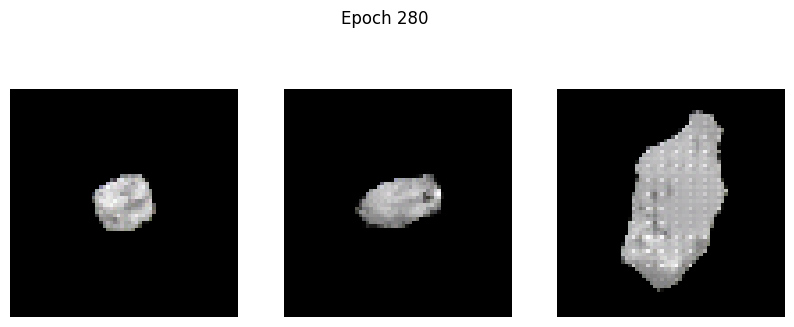

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1205 - g_loss: 4.2740
Epoch 281/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2228 - g_loss: 4.8503

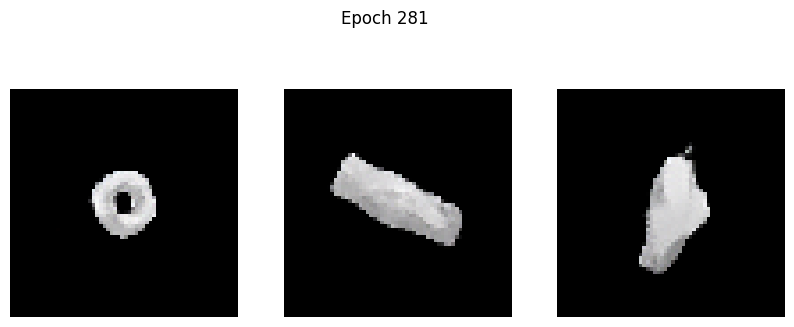

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2217 - g_loss: 4.8452
Epoch 282/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0709 - g_loss: 4.0097

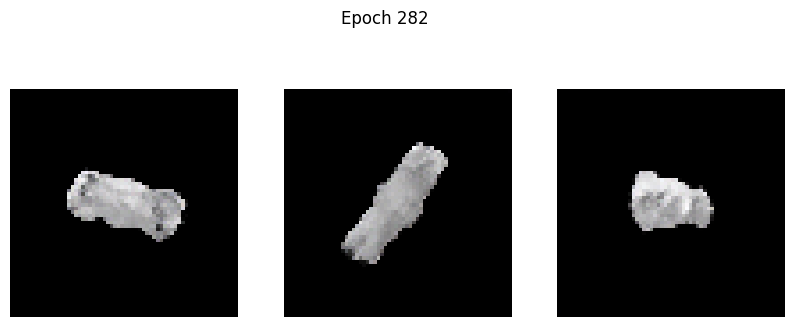

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - d_loss: 0.0709 - g_loss: 4.0090
Epoch 283/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0600 - g_loss: 4.0383

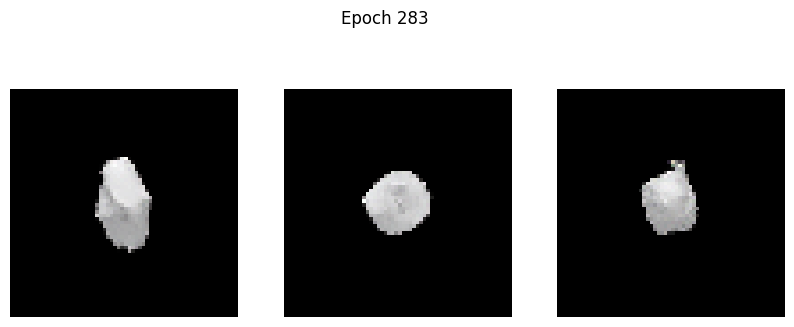

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0600 - g_loss: 4.0380
Epoch 284/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0818 - g_loss: 4.1176

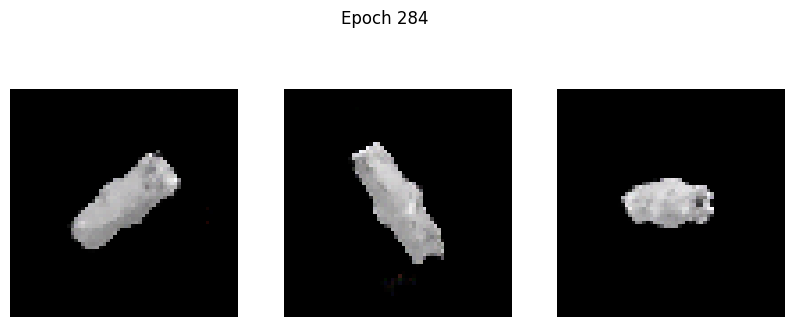

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0817 - g_loss: 4.1173
Epoch 285/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0750 - g_loss: 4.2791

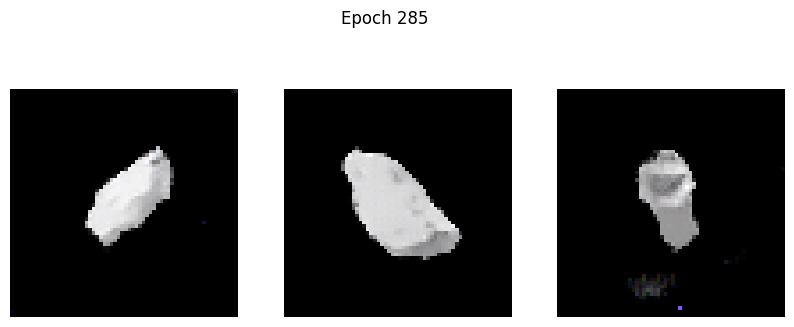

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0751 - g_loss: 4.2787
Epoch 286/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.2660 - g_loss: 4.5135

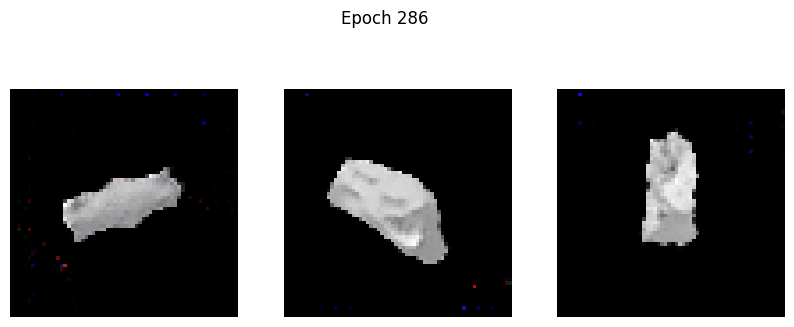

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.2646 - g_loss: 4.5104
Epoch 287/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0498 - g_loss: 4.1591

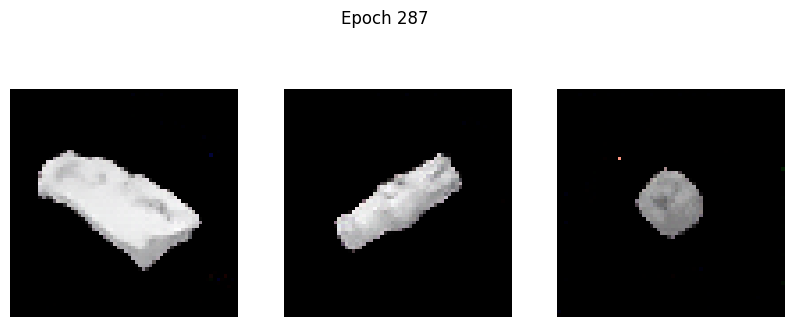

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0501 - g_loss: 4.1596
Epoch 288/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1551 - g_loss: 4.2890

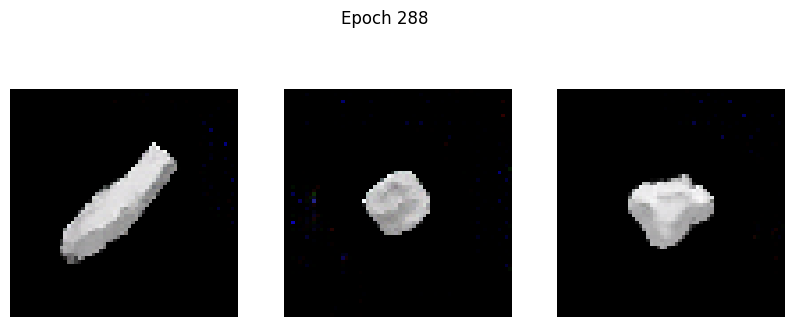

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1547 - g_loss: 4.2876
Epoch 289/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0527 - g_loss: 3.9898

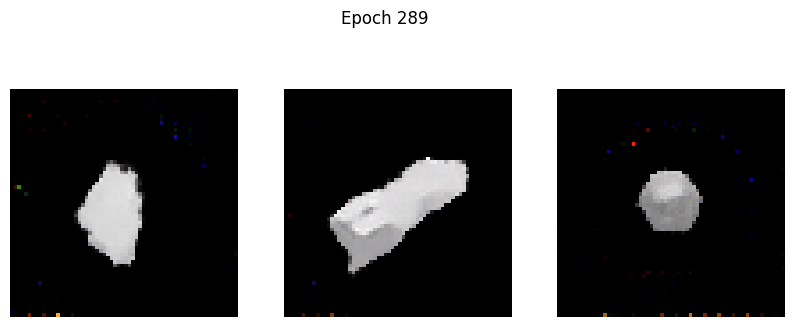

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0528 - g_loss: 3.9910
Epoch 290/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.1531 - g_loss: 4.4283

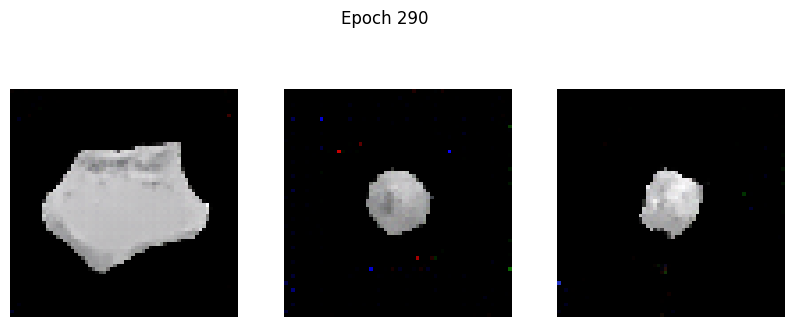

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1527 - g_loss: 4.4260
Epoch 291/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0658 - g_loss: 4.2265

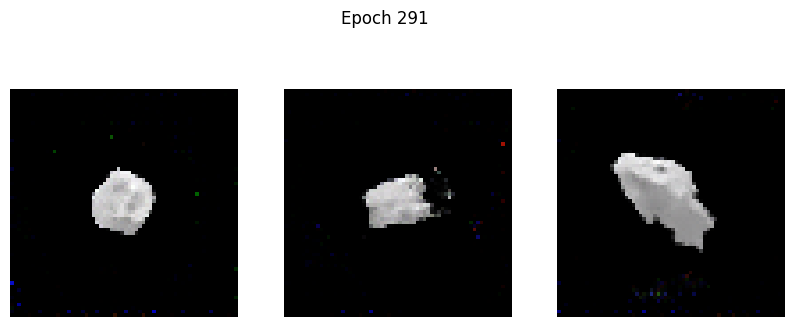

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0658 - g_loss: 4.2262
Epoch 292/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0681 - g_loss: 4.1576

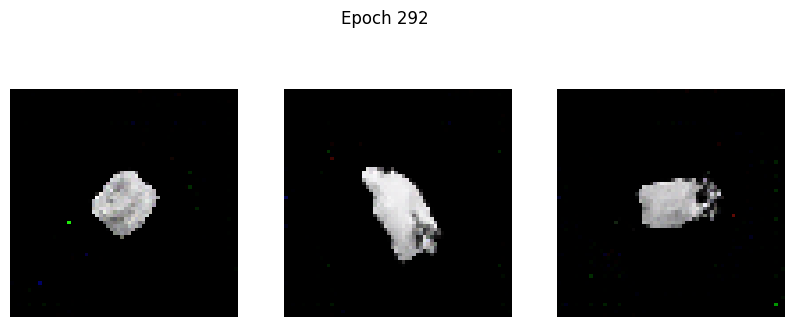

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0681 - g_loss: 4.1577
Epoch 293/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0692 - g_loss: 4.2594

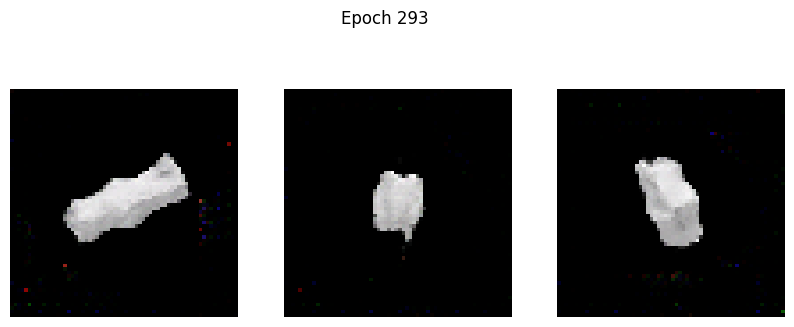

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0691 - g_loss: 4.2590
Epoch 294/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1420 - g_loss: 4.4520

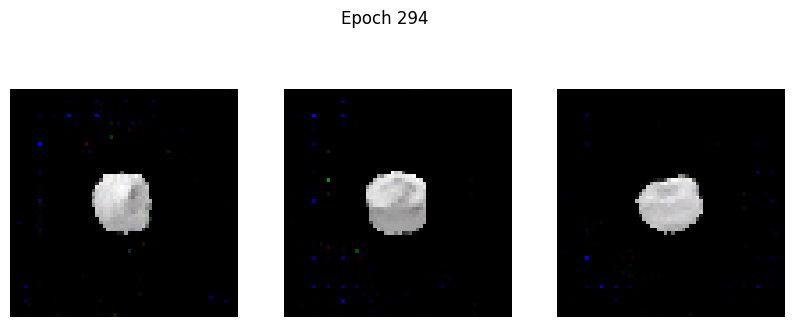

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1418 - g_loss: 4.4509
Epoch 295/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0511 - g_loss: 4.1102

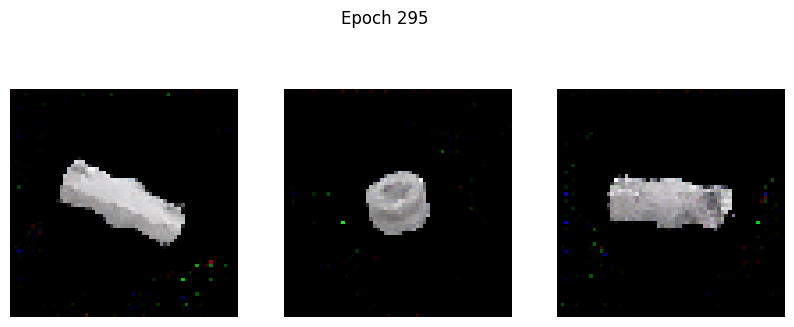

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0513 - g_loss: 4.1109
Epoch 296/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0518 - g_loss: 4.1573

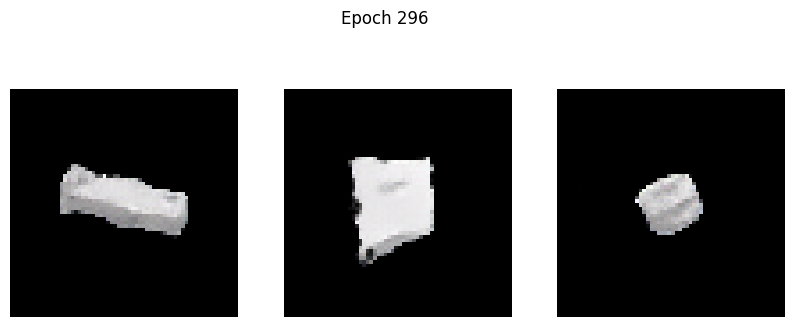

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0521 - g_loss: 4.1590
Epoch 297/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0712 - g_loss: 4.2078

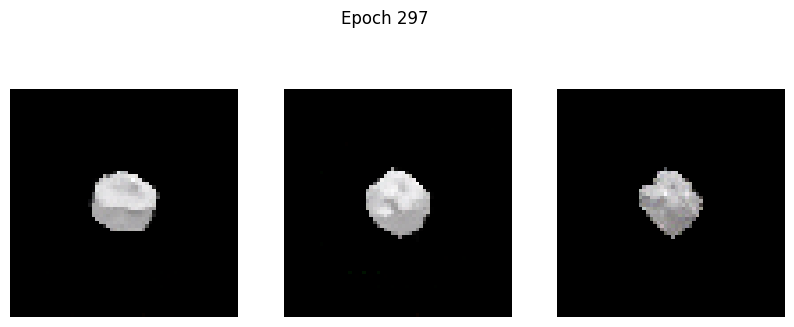

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0714 - g_loss: 4.2089
Epoch 298/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2441 - g_loss: 4.7330

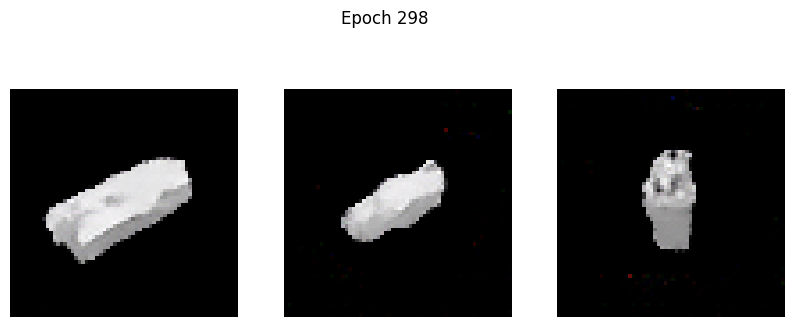

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2429 - g_loss: 4.7293
Epoch 299/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0558 - g_loss: 4.1121

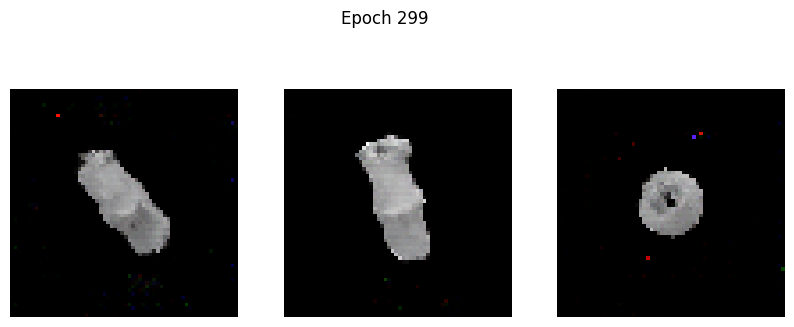

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0559 - g_loss: 4.1129
Epoch 300/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0369 - g_loss: 4.1340

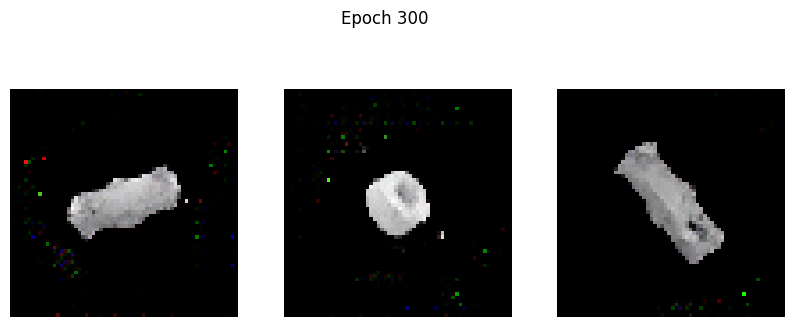

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0370 - g_loss: 4.1340
Epoch 301/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0823 - g_loss: 4.4887

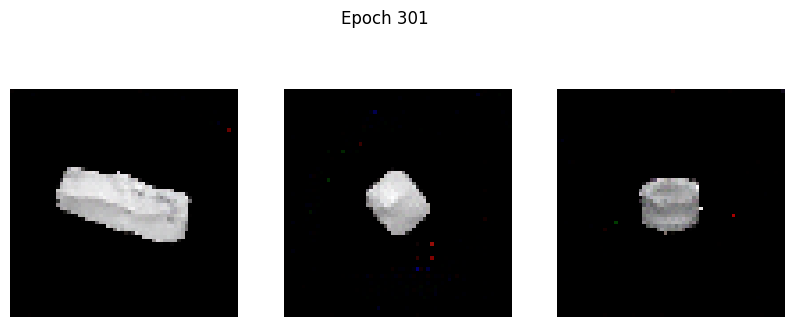

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0822 - g_loss: 4.4871
Epoch 302/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0718 - g_loss: 4.3103

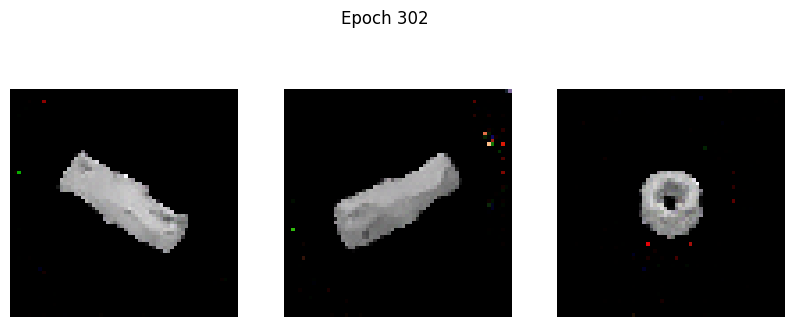

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0720 - g_loss: 4.3105
Epoch 303/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0636 - g_loss: 4.2493

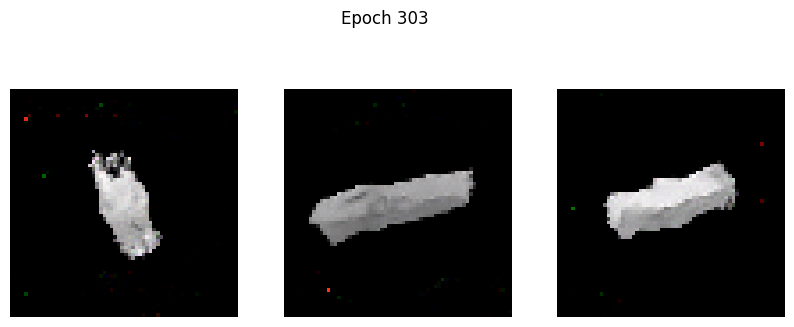

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0637 - g_loss: 4.2498
Epoch 304/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0394 - g_loss: 4.2182

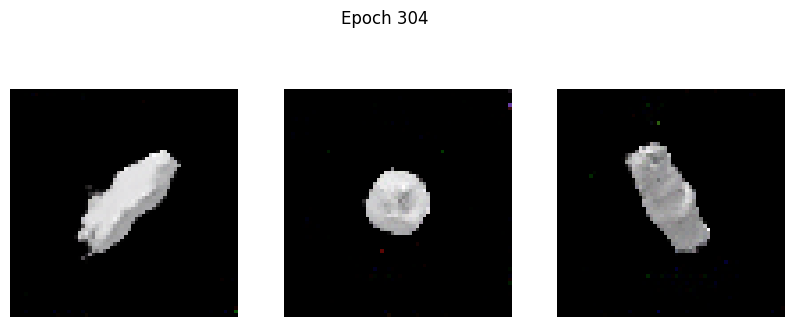

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0395 - g_loss: 4.2187
Epoch 305/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2998 - g_loss: 4.9292

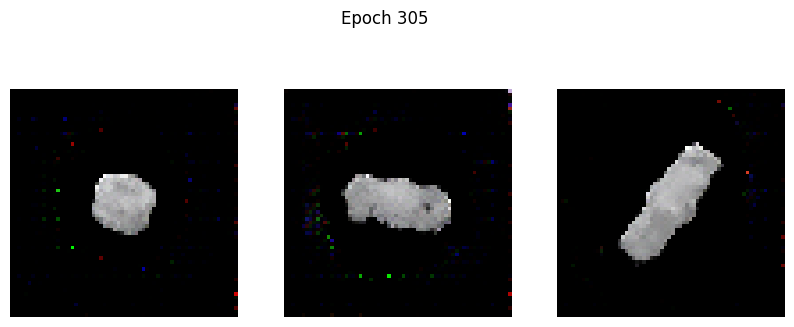

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.3022 - g_loss: 4.9342
Epoch 306/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0882 - g_loss: 3.9080

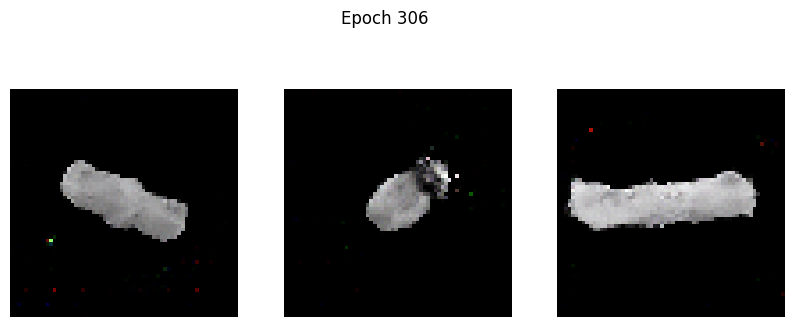

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0881 - g_loss: 3.9083
Epoch 307/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0541 - g_loss: 4.0882

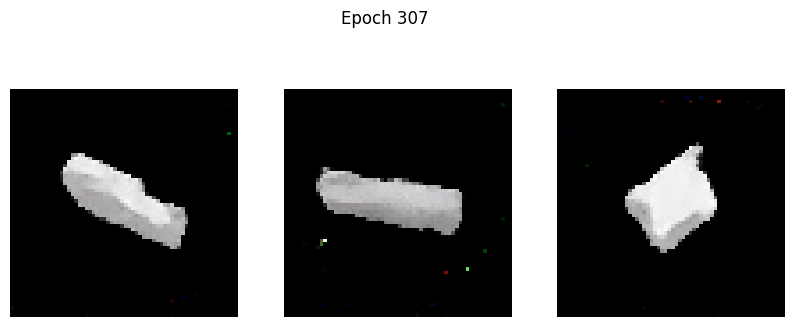

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0542 - g_loss: 4.0880
Epoch 308/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0611 - g_loss: 4.0379

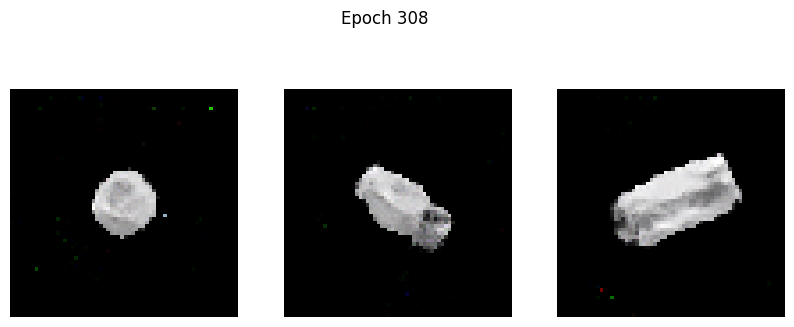

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0611 - g_loss: 4.0383
Epoch 309/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0618 - g_loss: 4.2214

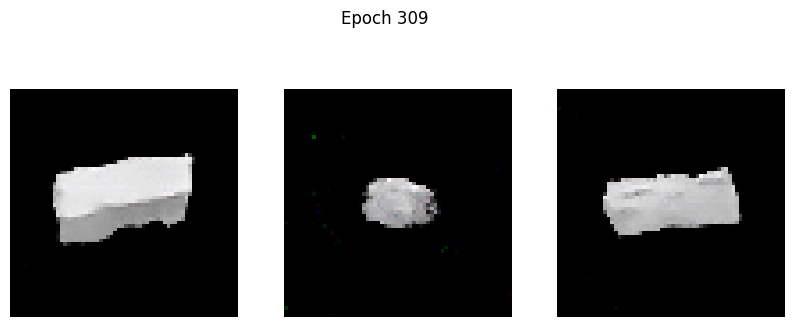

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0619 - g_loss: 4.2219
Epoch 310/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0413 - g_loss: 4.0365

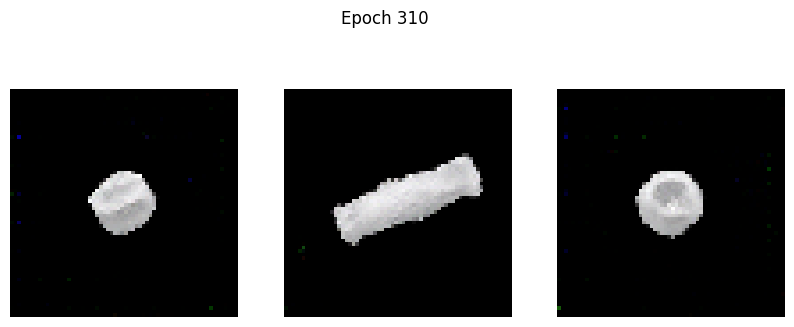

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0414 - g_loss: 4.0380
Epoch 311/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0378 - g_loss: 4.2421

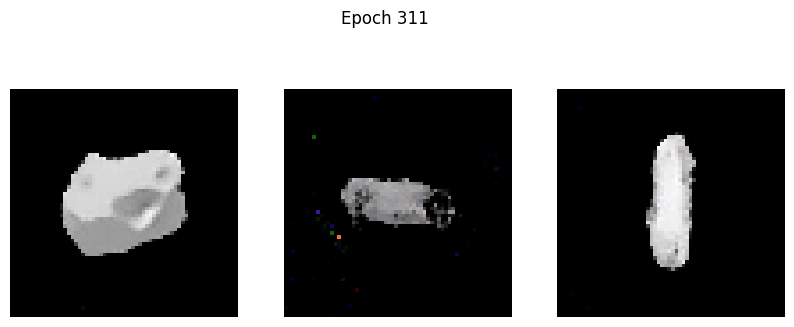

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0379 - g_loss: 4.2424
Epoch 312/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0677 - g_loss: 4.2782

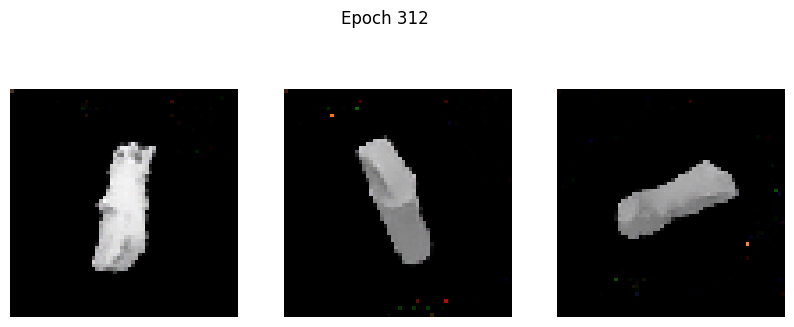

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0677 - g_loss: 4.2783
Epoch 313/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0445 - g_loss: 4.3312

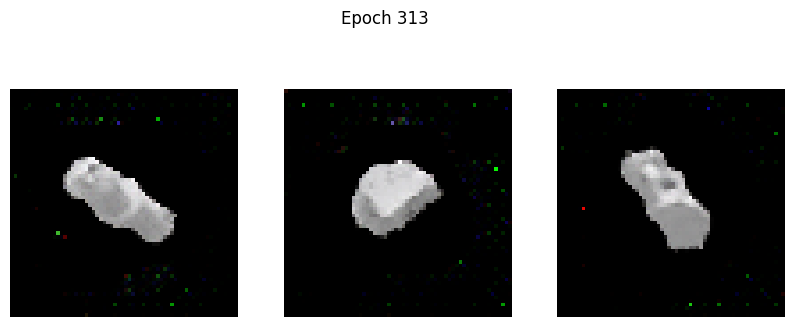

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0447 - g_loss: 4.3319
Epoch 314/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1400 - g_loss: 4.5484

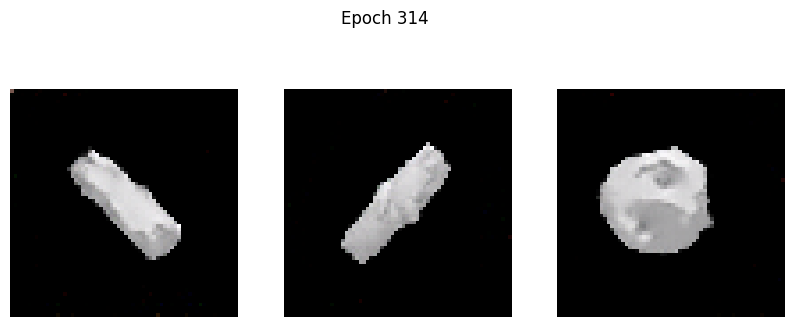

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1396 - g_loss: 4.5479
Epoch 315/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0318 - g_loss: 4.2662

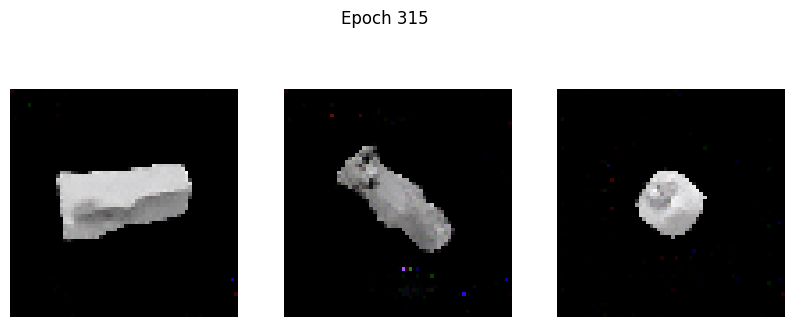

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0318 - g_loss: 4.2659
Epoch 316/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0592 - g_loss: 4.4232

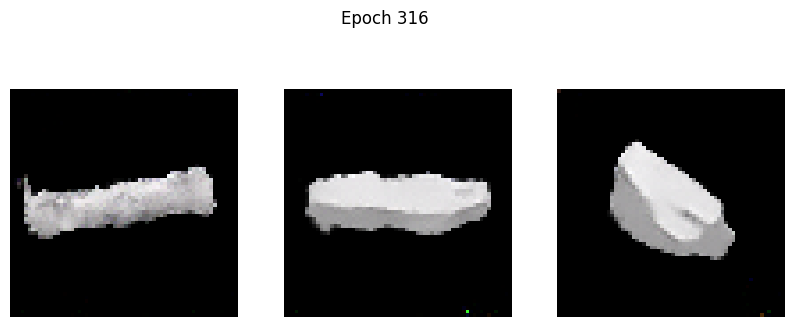

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0592 - g_loss: 4.4232
Epoch 317/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0523 - g_loss: 4.5450

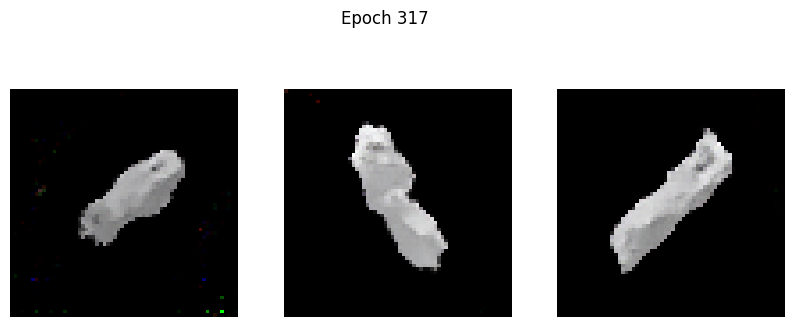

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0525 - g_loss: 4.5448
Epoch 318/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0903 - g_loss: 4.5294

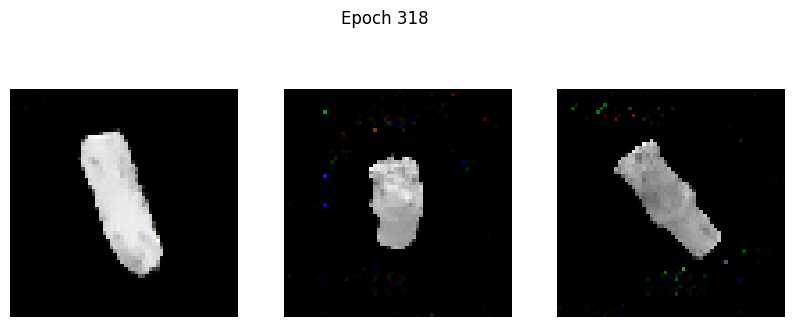

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0902 - g_loss: 4.5288
Epoch 319/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0946 - g_loss: 4.4503

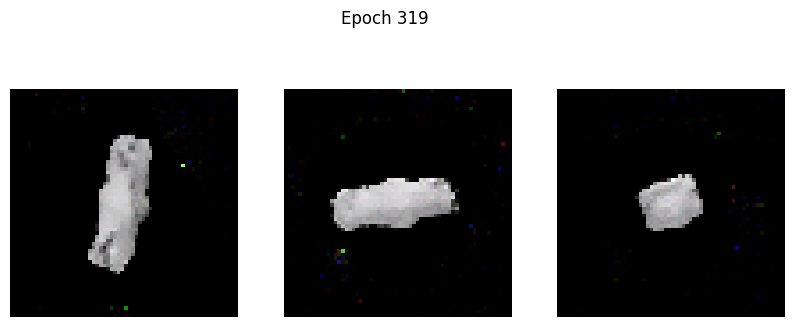

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0943 - g_loss: 4.4506
Epoch 320/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0647 - g_loss: 4.3925

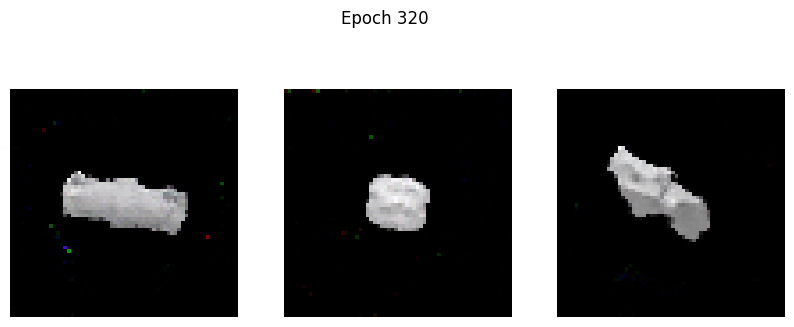

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0647 - g_loss: 4.3929
Epoch 321/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - d_loss: 0.0335 - g_loss: 4.3362

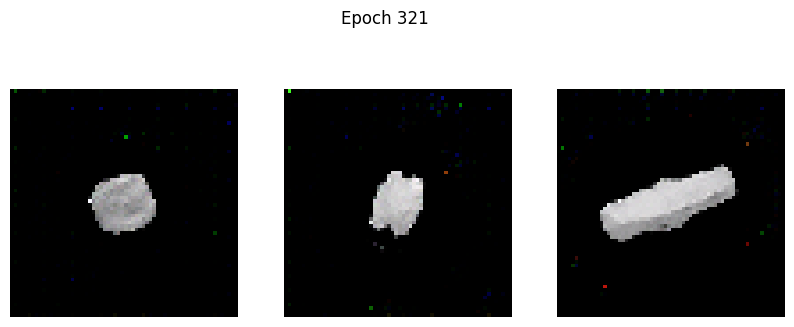

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 127ms/step - d_loss: 0.0337 - g_loss: 4.3368
Epoch 322/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.2021 - g_loss: 4.7273

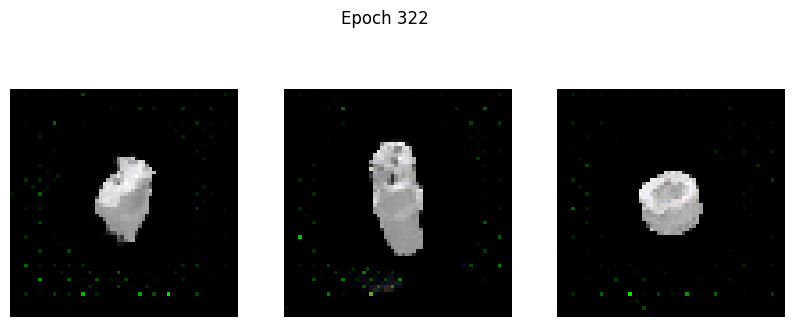

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - d_loss: 0.2028 - g_loss: 4.7278
Epoch 323/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0761 - g_loss: 4.2786

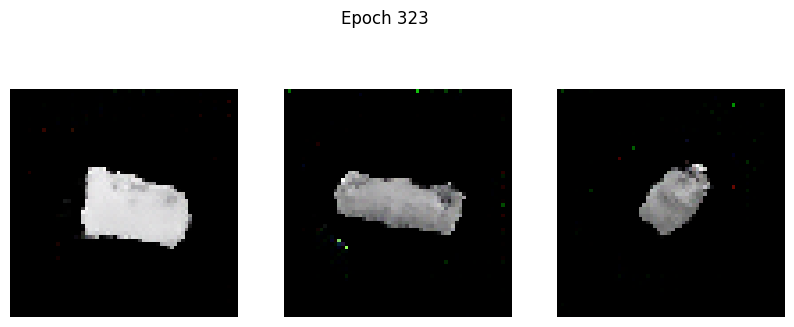

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0763 - g_loss: 4.2794
Epoch 324/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0492 - g_loss: 4.2805

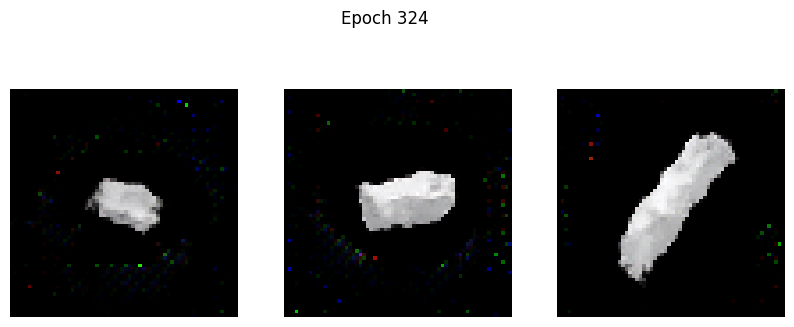

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0494 - g_loss: 4.2807
Epoch 325/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0331 - g_loss: 4.2650

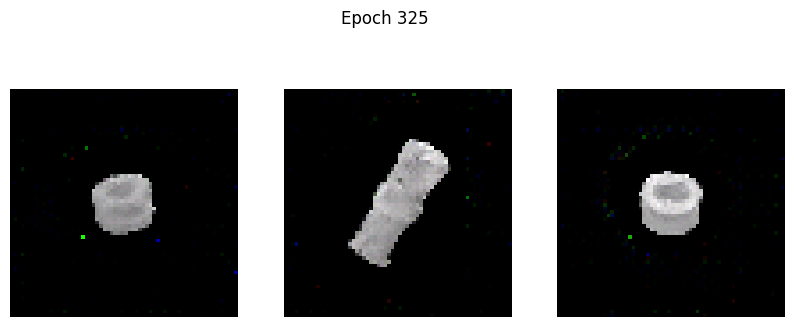

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0331 - g_loss: 4.2650
Epoch 326/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0158 - g_loss: 4.2708

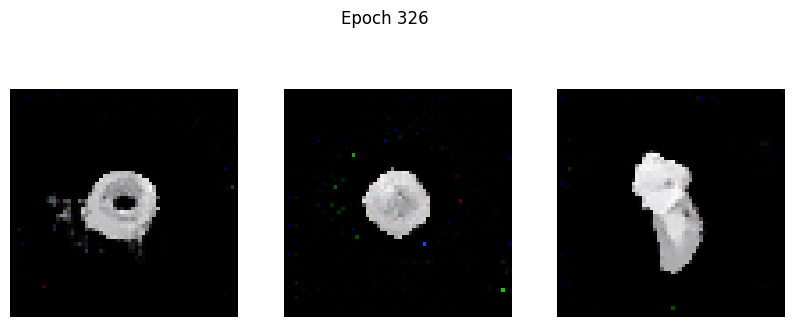

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0159 - g_loss: 4.2714
Epoch 327/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1415 - g_loss: 4.5477

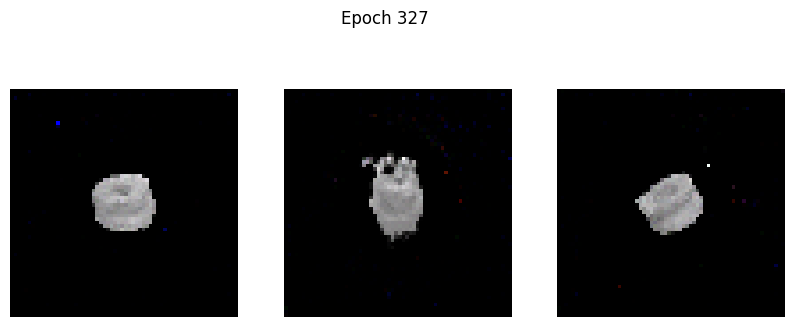

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1409 - g_loss: 4.5458
Epoch 328/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0363 - g_loss: 4.5082

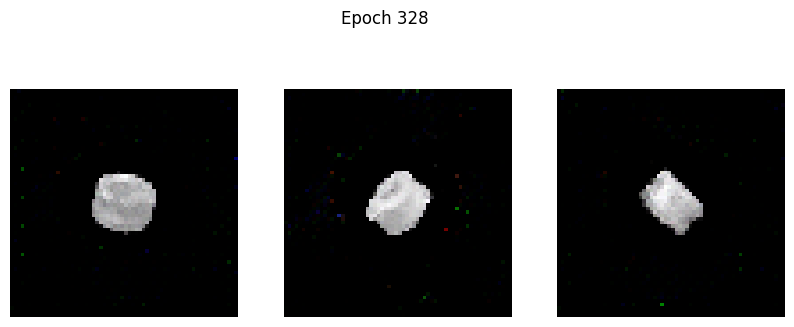

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0364 - g_loss: 4.5082
Epoch 329/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0636 - g_loss: 4.6161

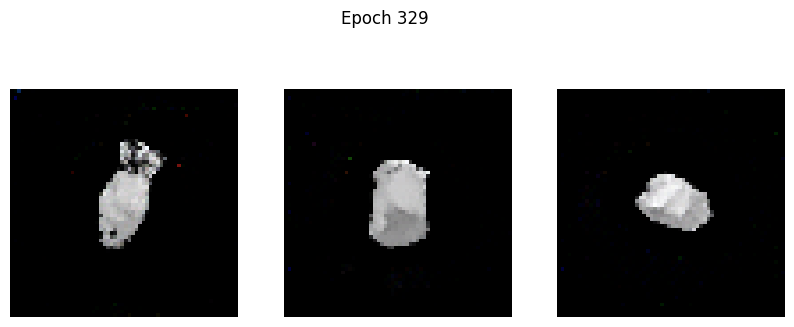

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0636 - g_loss: 4.6160
Epoch 330/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0749 - g_loss: 4.6377

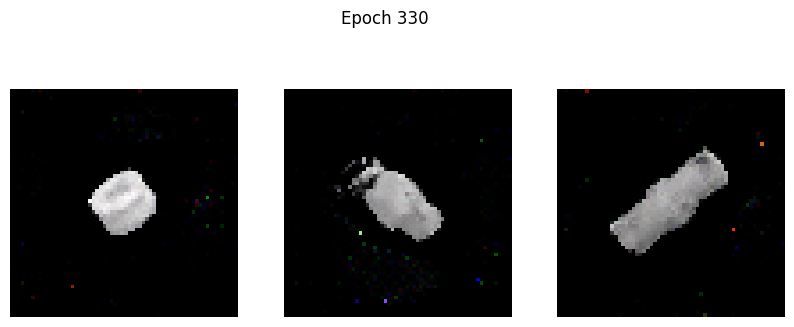

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0751 - g_loss: 4.6376
Epoch 331/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0445 - g_loss: 4.4936

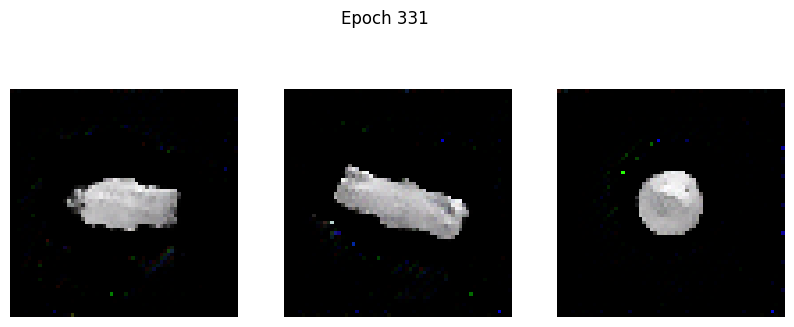

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0446 - g_loss: 4.4937
Epoch 332/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0664 - g_loss: 4.5908

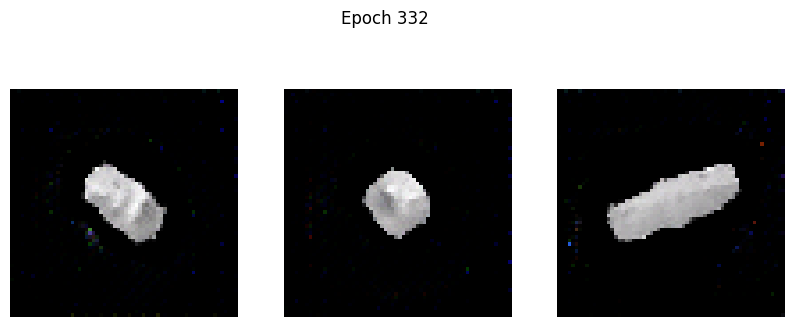

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0663 - g_loss: 4.5905
Epoch 333/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0681 - g_loss: 4.4710

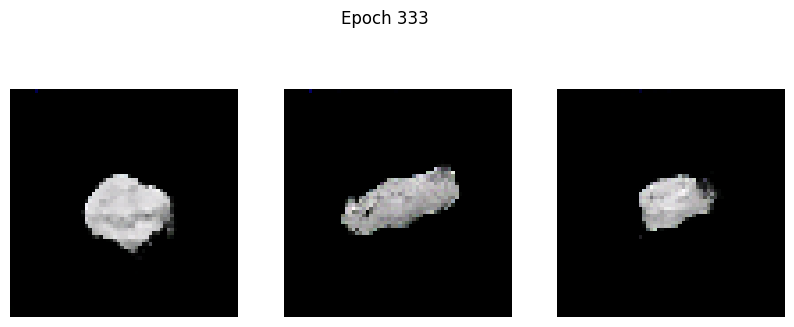

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0684 - g_loss: 4.4723
Epoch 334/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0380 - g_loss: 4.4186

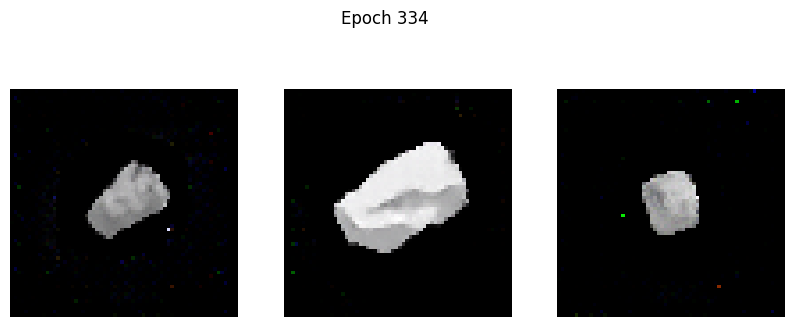

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0379 - g_loss: 4.4190
Epoch 335/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0250 - g_loss: 4.4656

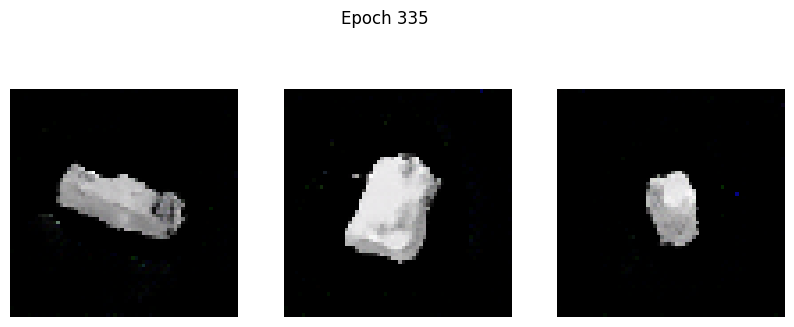

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0251 - g_loss: 4.4665
Epoch 336/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0380 - g_loss: 4.5083

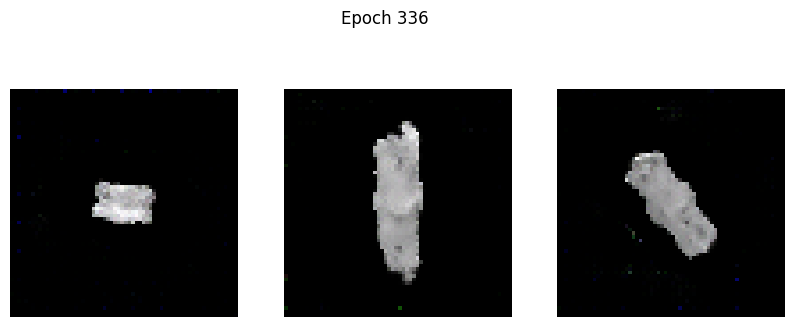

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0380 - g_loss: 4.5091
Epoch 337/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0884 - g_loss: 4.5729

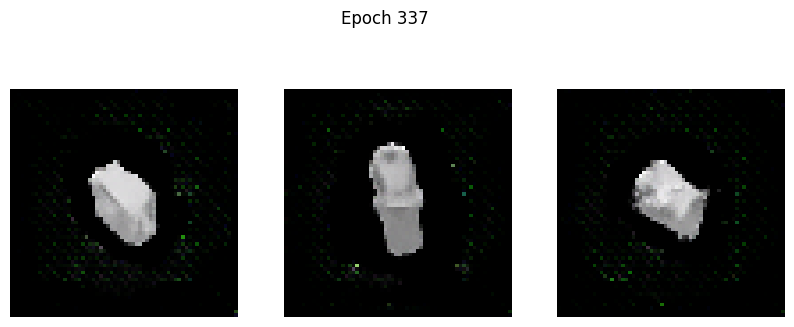

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0885 - g_loss: 4.5743
Epoch 338/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0334 - g_loss: 4.5723

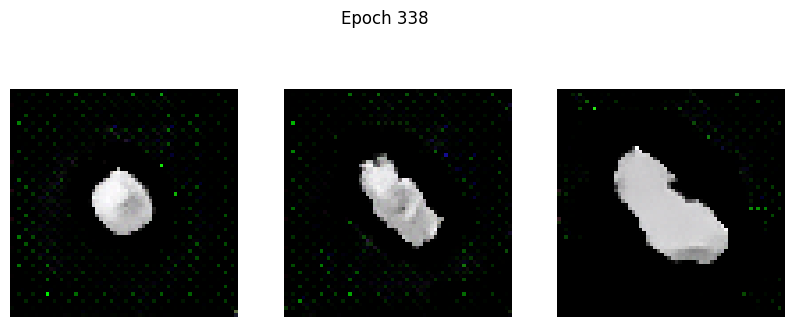

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0336 - g_loss: 4.5733
Epoch 339/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0505 - g_loss: 4.9404

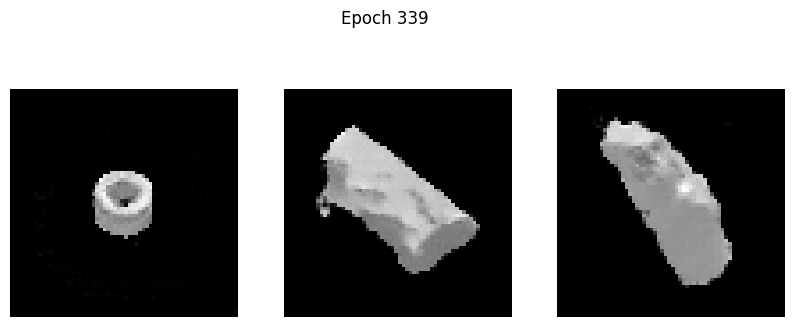

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0510 - g_loss: 4.9403
Epoch 340/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0502 - g_loss: 4.4836

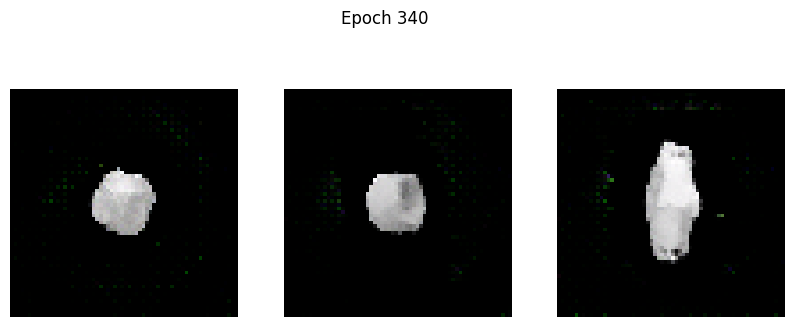

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - d_loss: 0.0503 - g_loss: 4.4846
Epoch 341/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0530 - g_loss: 4.6062

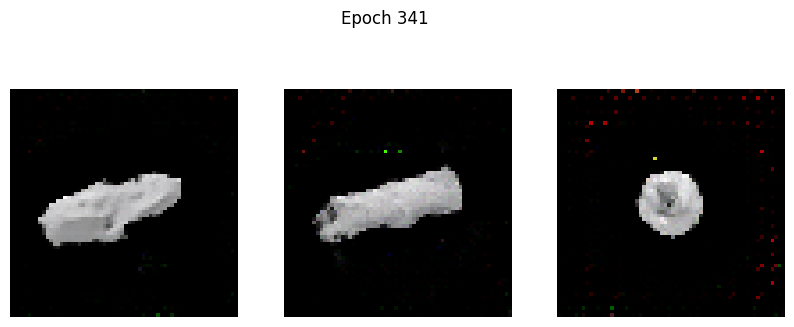

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0529 - g_loss: 4.6057
Epoch 342/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0380 - g_loss: 4.3414

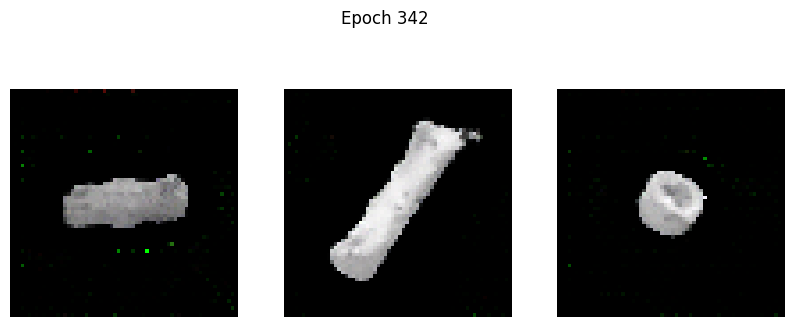

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0382 - g_loss: 4.3423
Epoch 343/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0128 - g_loss: 4.4393

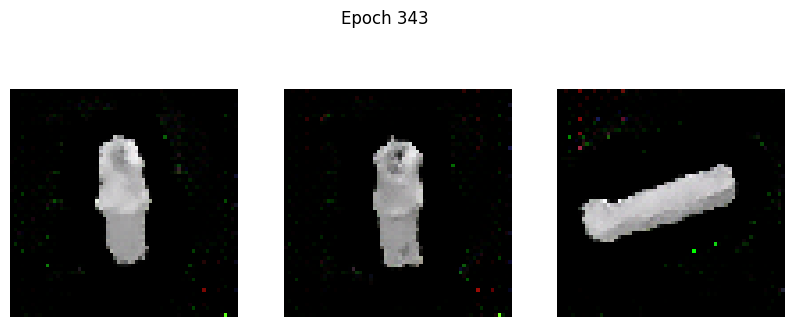

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0130 - g_loss: 4.4404
Epoch 344/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0614 - g_loss: 4.6675

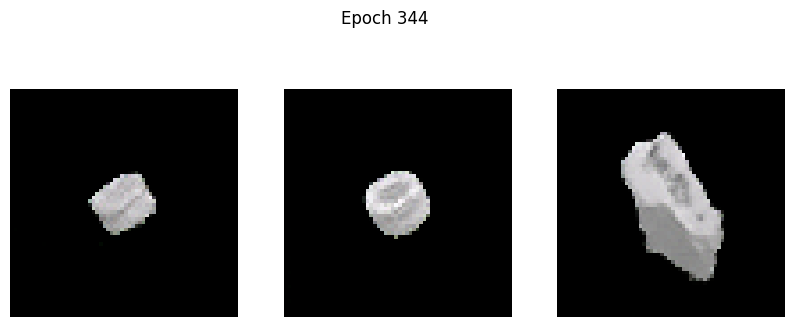

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0615 - g_loss: 4.6685
Epoch 345/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0136 - g_loss: 4.5204

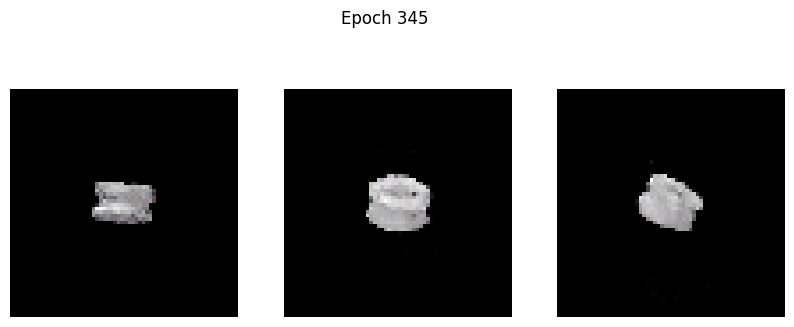

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0138 - g_loss: 4.5214
Epoch 346/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0393 - g_loss: 4.8276

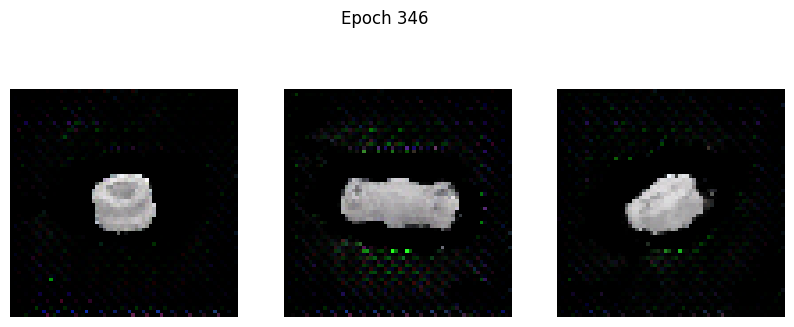

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0395 - g_loss: 4.8276
Epoch 347/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0778 - g_loss: 4.8092

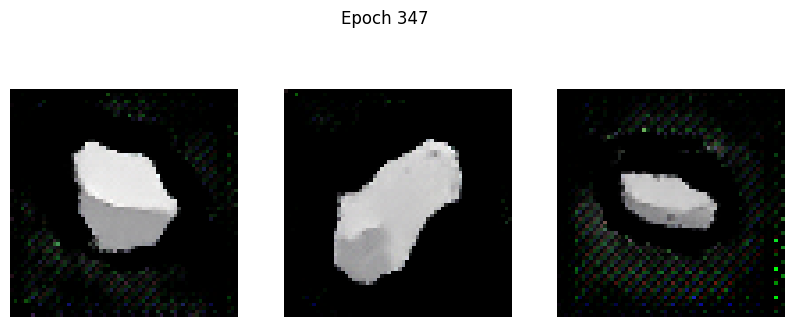

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0784 - g_loss: 4.8103
Epoch 348/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.1136 - g_loss: 5.0027

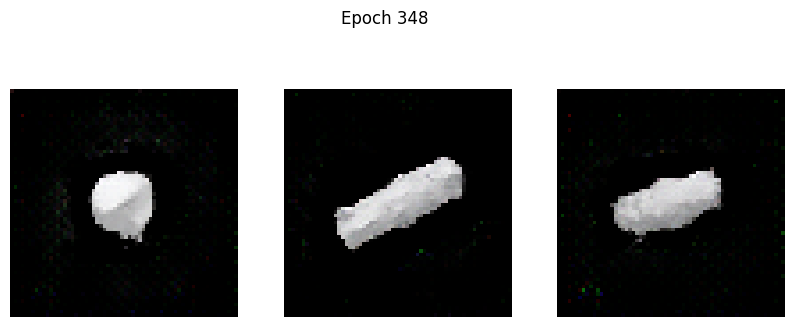

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1130 - g_loss: 4.9998
Epoch 349/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0066 - g_loss: 4.5368

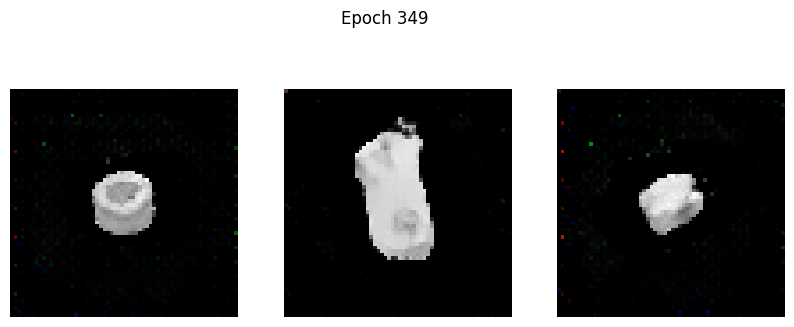

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - d_loss: 0.0068 - g_loss: 4.5383
Epoch 350/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0523 - g_loss: 4.6758

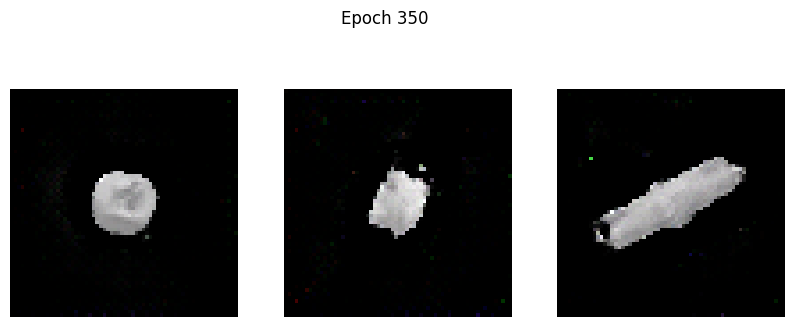

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0521 - g_loss: 4.6758
Epoch 351/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: 0.0441 - g_loss: 4.8298

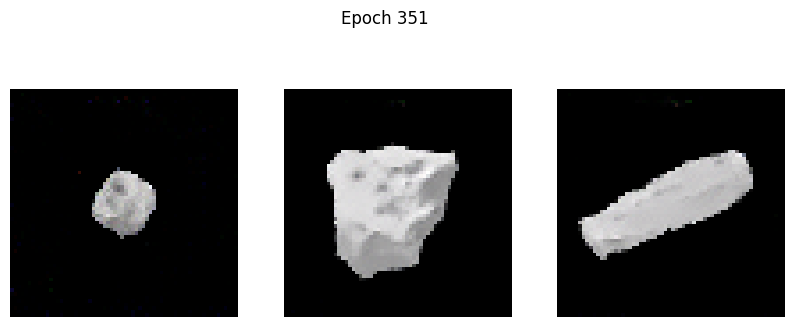

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: 0.0441 - g_loss: 4.8297
Epoch 352/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0301 - g_loss: 4.5763

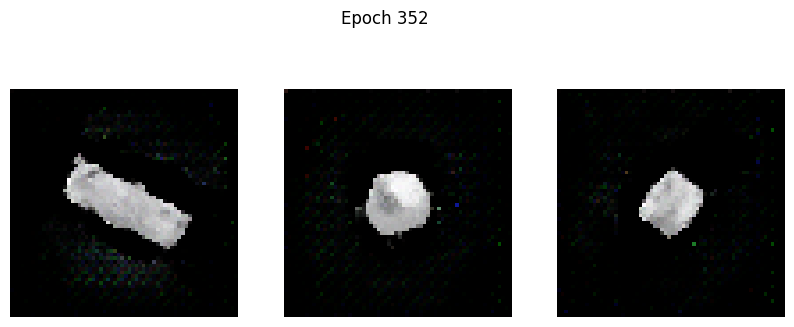

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0299 - g_loss: 4.5754
Epoch 353/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.1055 - g_loss: 5.2565

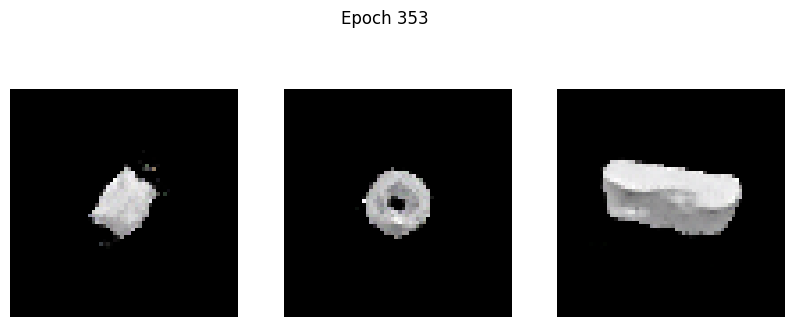

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.1051 - g_loss: 5.2552
Epoch 354/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0288 - g_loss: 4.7115

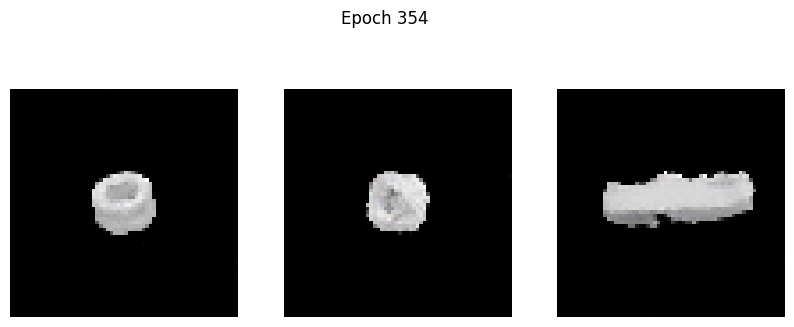

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0287 - g_loss: 4.7112
Epoch 355/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0242 - g_loss: 4.6681

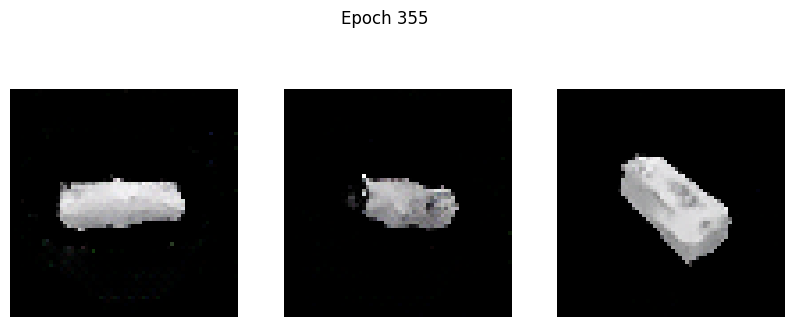

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.0241 - g_loss: 4.6680
Epoch 356/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0260 - g_loss: 4.6966

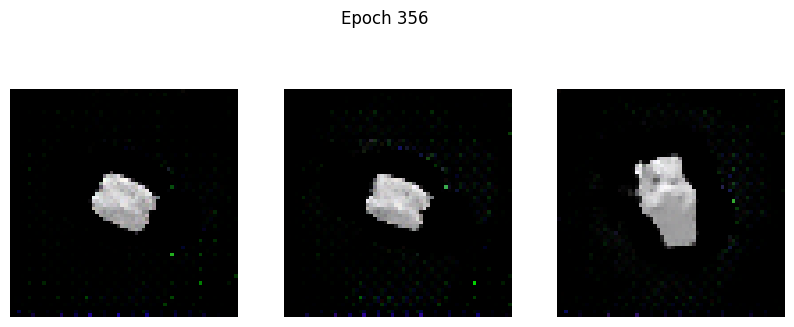

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0263 - g_loss: 4.6971
Epoch 357/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0842 - g_loss: 4.8736

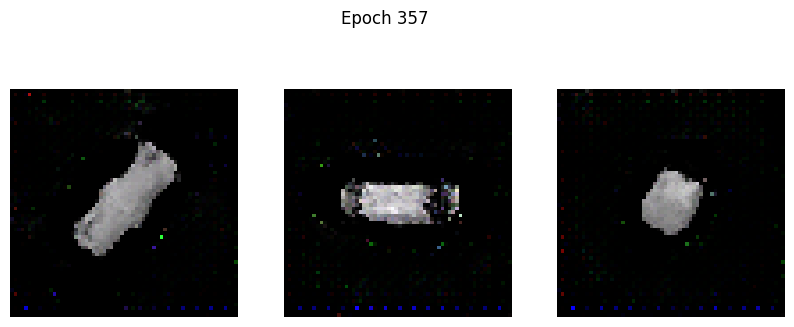

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0845 - g_loss: 4.8744
Epoch 358/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.1271 - g_loss: 4.8470

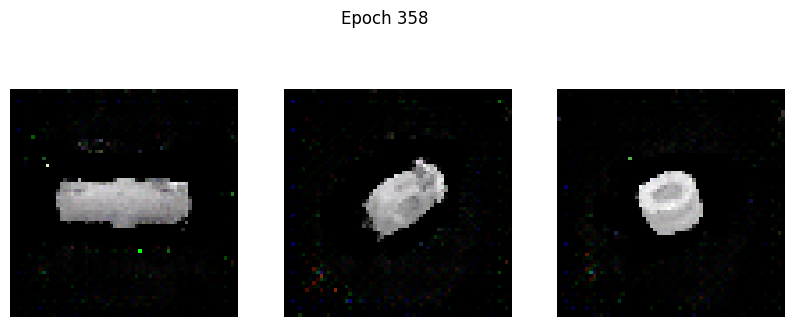

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.1263 - g_loss: 4.8457
Epoch 359/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0471 - g_loss: 4.8276

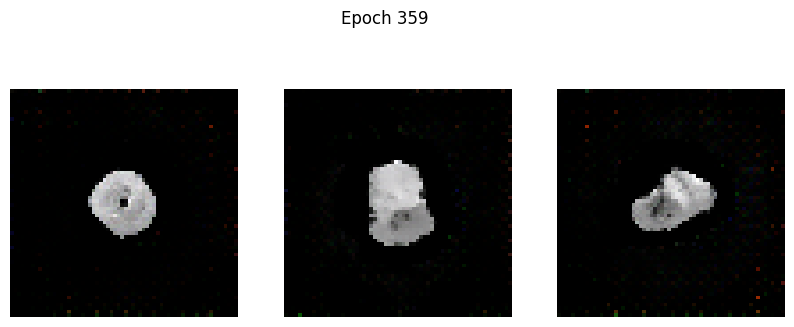

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0472 - g_loss: 4.8280
Epoch 360/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0540 - g_loss: 5.1094

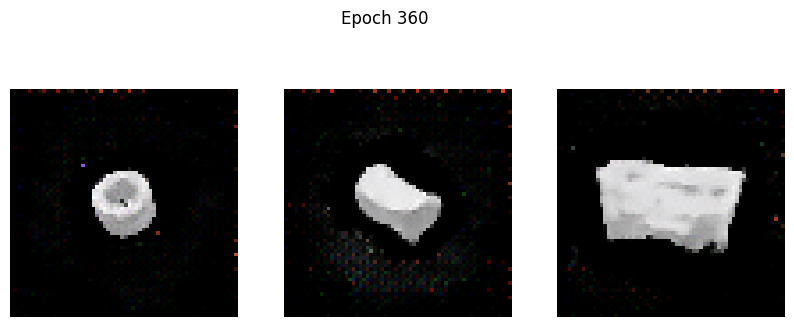

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0540 - g_loss: 5.1083
Epoch 361/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0113 - g_loss: 4.7001

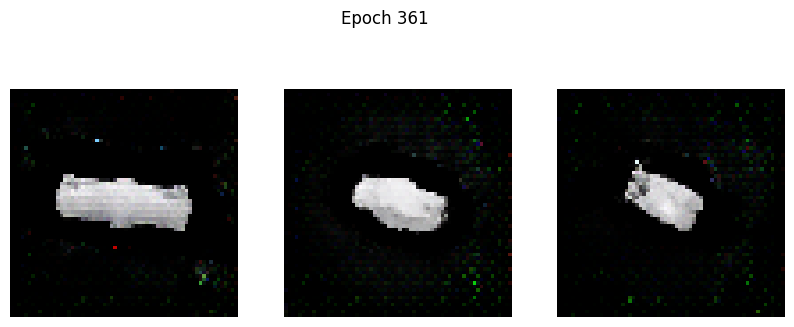

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0114 - g_loss: 4.7005
Epoch 362/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0779 - g_loss: 5.1168

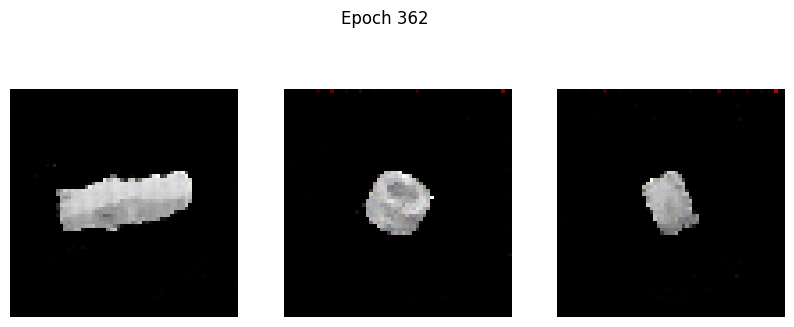

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0781 - g_loss: 5.1173
Epoch 363/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0531 - g_loss: 4.6933

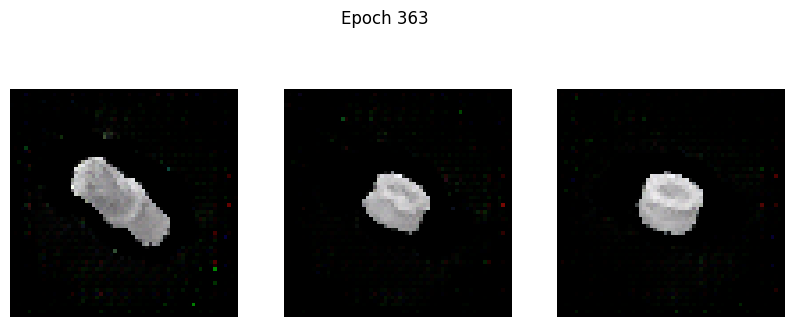

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0530 - g_loss: 4.6935
Epoch 364/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0191 - g_loss: 4.9055

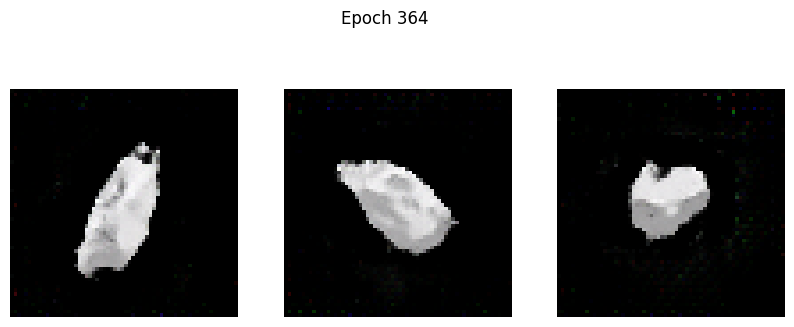

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0192 - g_loss: 4.9054
Epoch 365/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0814 - g_loss: 5.0691

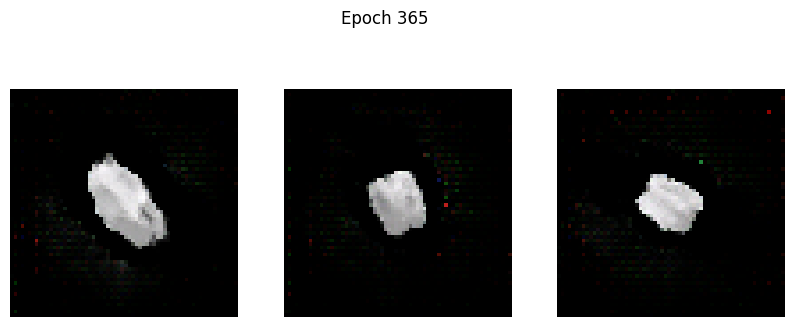

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0815 - g_loss: 5.0681
Epoch 366/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0236 - g_loss: 4.6244

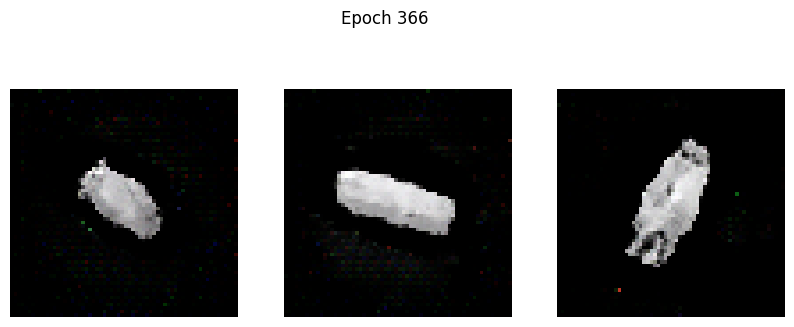

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0236 - g_loss: 4.6248
Epoch 367/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0137 - g_loss: 4.7591

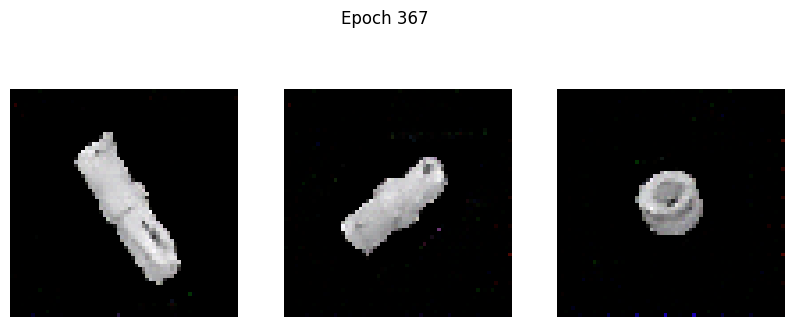

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0135 - g_loss: 4.7583
Epoch 368/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0698 - g_loss: 4.8955

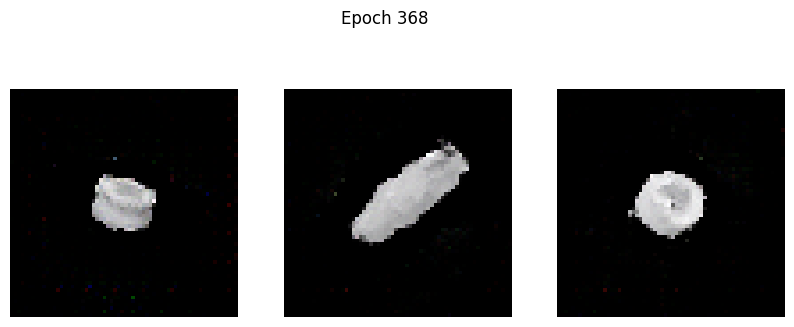

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0700 - g_loss: 4.8972
Epoch 369/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0130 - g_loss: 4.8894

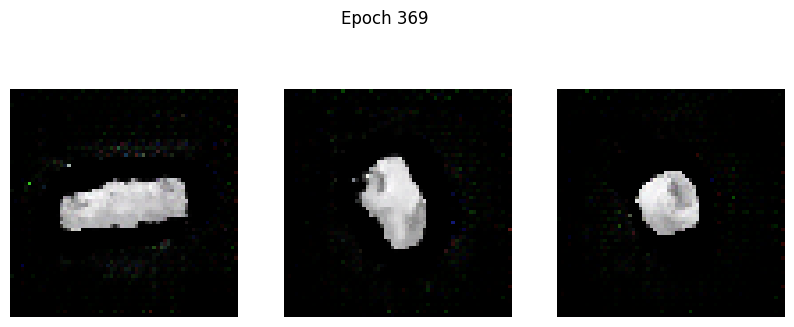

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0131 - g_loss: 4.8909
Epoch 370/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0769 - g_loss: 5.2075

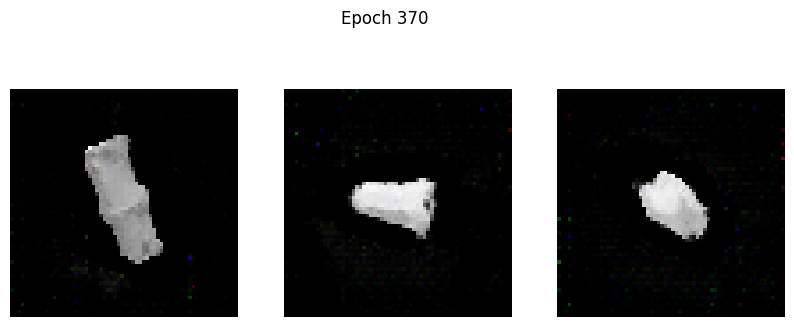

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0769 - g_loss: 5.2064
Epoch 371/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0232 - g_loss: 4.8876

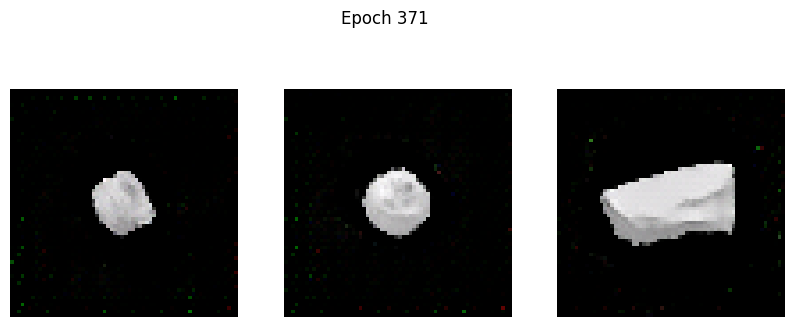

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0230 - g_loss: 4.8865
Epoch 372/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0363 - g_loss: 4.5730

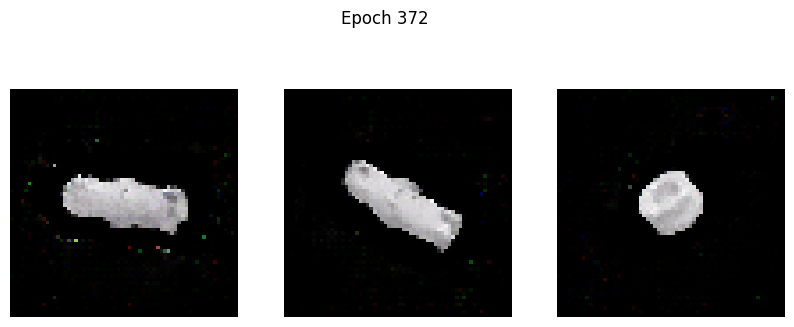

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0362 - g_loss: 4.5734
Epoch 373/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.2908 - g_loss: 6.3662

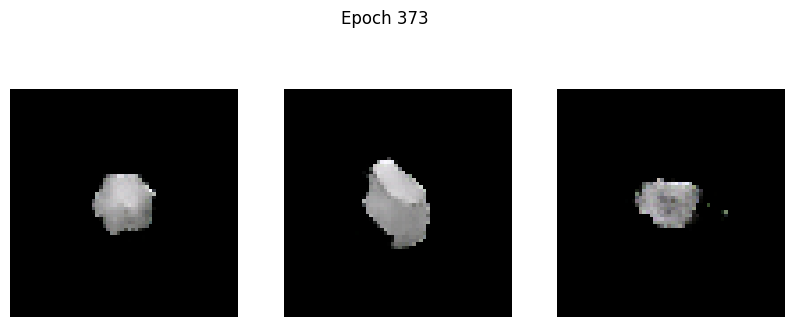

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: 0.2899 - g_loss: 6.3661
Epoch 374/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: -0.0583 - g_loss: 5.1960

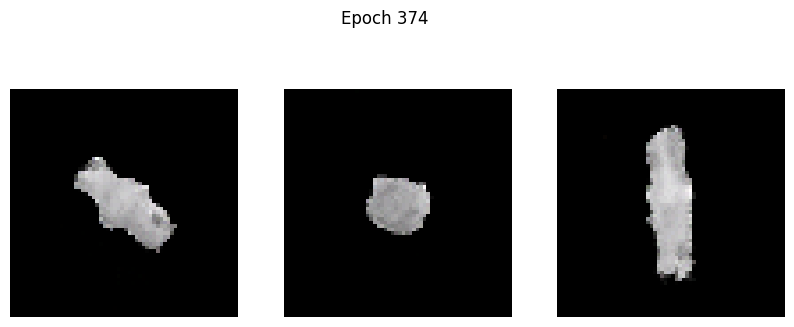

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 128ms/step - d_loss: -0.0585 - g_loss: 5.1950
Epoch 375/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0854 - g_loss: 5.1974

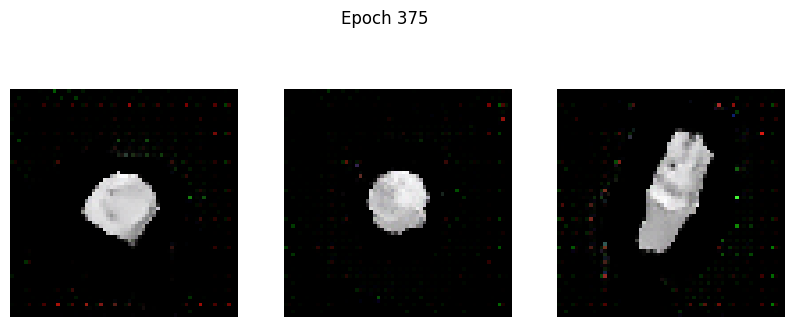

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0853 - g_loss: 5.1978
Epoch 376/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0287 - g_loss: 5.2568

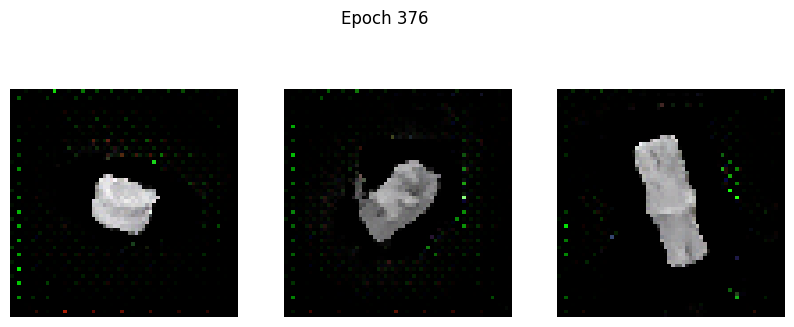

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0283 - g_loss: 5.2587
Epoch 377/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0188 - g_loss: 5.2129

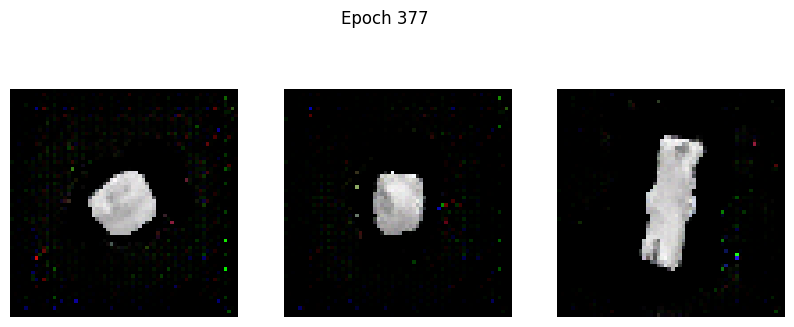

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0185 - g_loss: 5.2124
Epoch 378/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0839 - g_loss: 5.1769

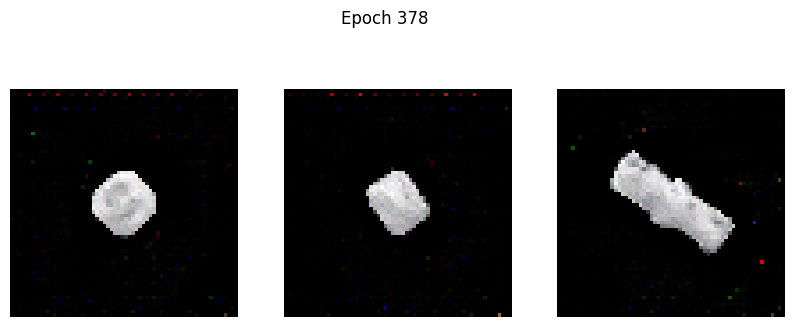

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0838 - g_loss: 5.1779
Epoch 379/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0113 - g_loss: 4.9572

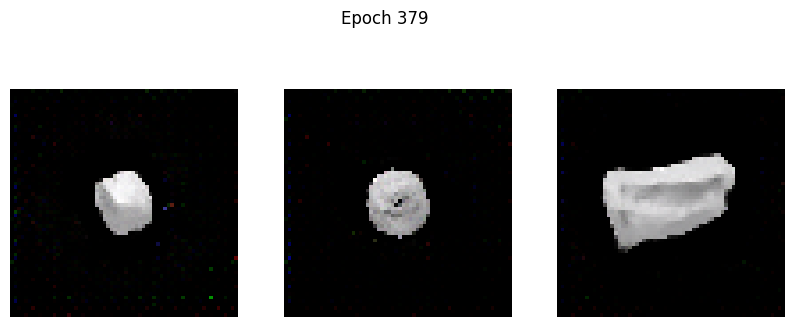

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0112 - g_loss: 4.9582
Epoch 380/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0405 - g_loss: 5.4895

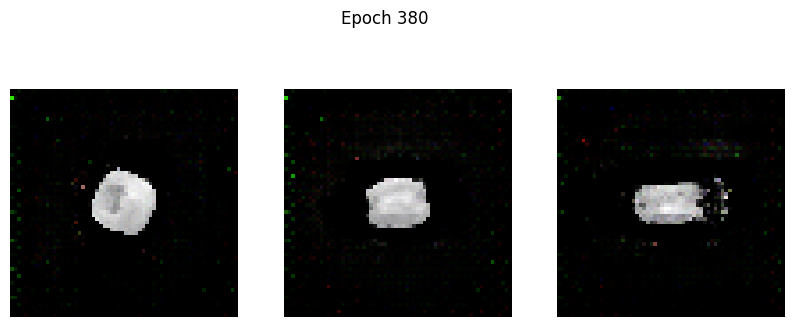

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0404 - g_loss: 5.4878
Epoch 381/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - d_loss: 0.0825 - g_loss: 5.0807

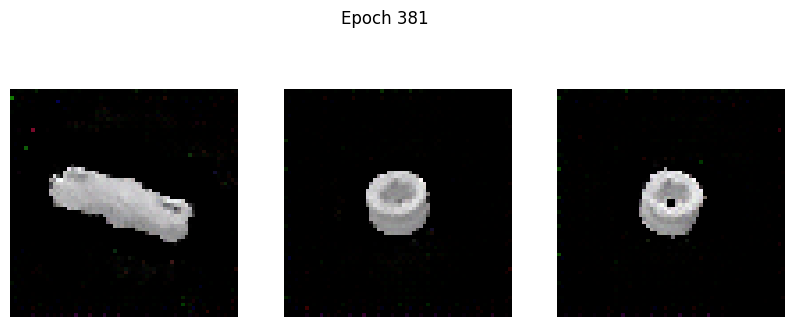

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 128ms/step - d_loss: 0.0826 - g_loss: 5.0817
Epoch 382/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: 0.0059 - g_loss: 4.8224

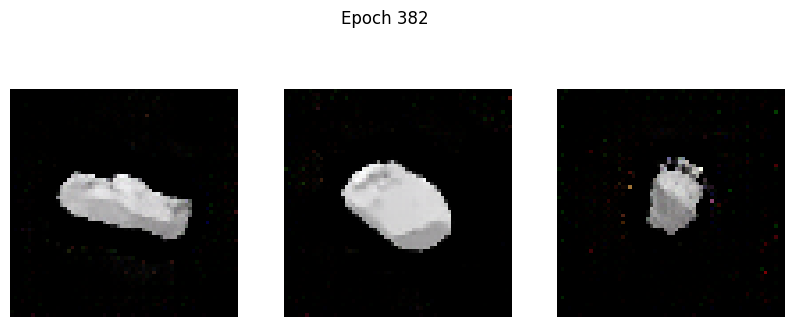

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: 0.0062 - g_loss: 4.8232
Epoch 383/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: 0.0877 - g_loss: 5.1593

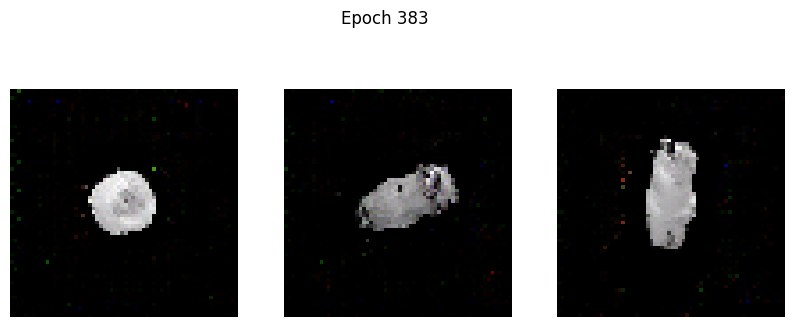

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: 0.0873 - g_loss: 5.1591
Epoch 384/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0246 - g_loss: 5.0146

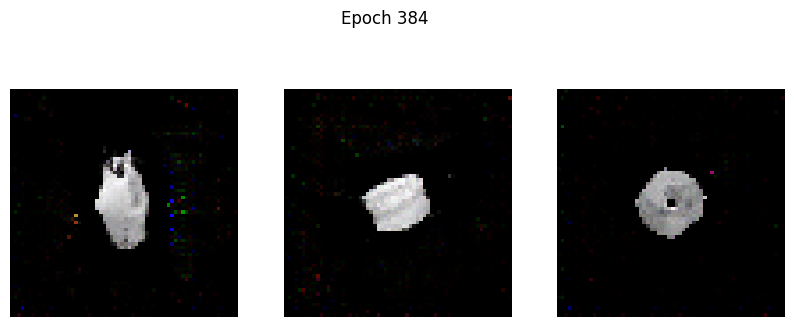

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - d_loss: 0.0248 - g_loss: 5.0156
Epoch 385/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0010 - g_loss: 4.8748    

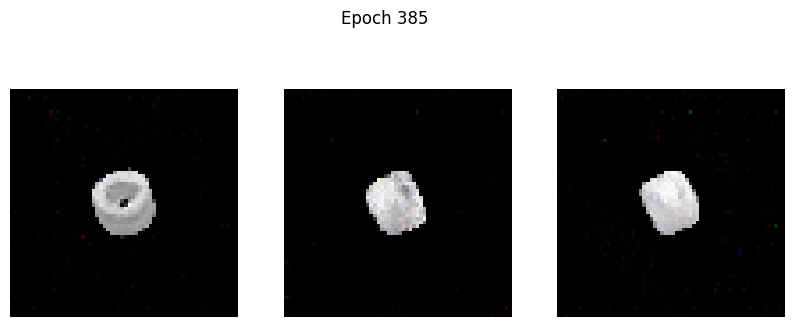

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0010 - g_loss: 4.8750
Epoch 386/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0234 - g_loss: 5.0918

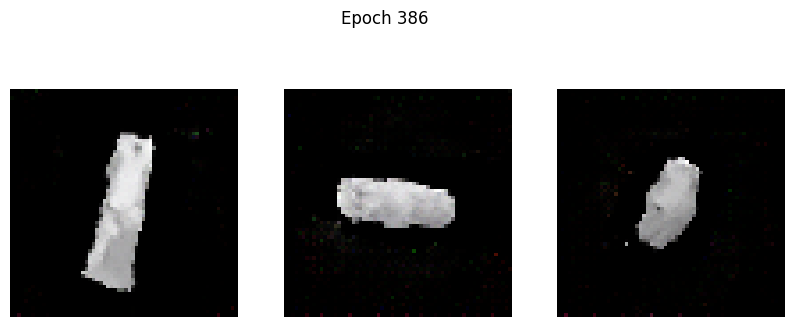

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0233 - g_loss: 5.0922
Epoch 387/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0235 - g_loss: 5.1928

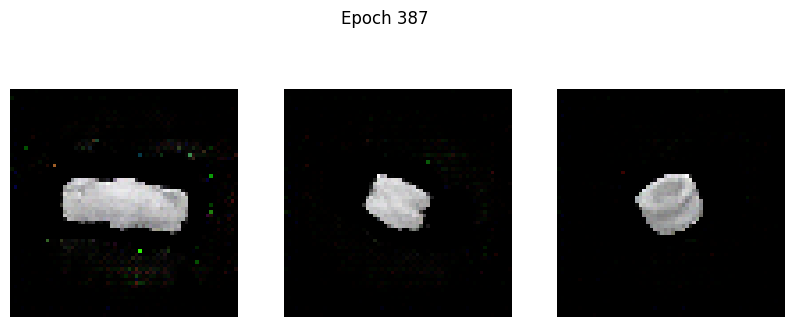

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0235 - g_loss: 5.1922
Epoch 388/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0707 - g_loss: 5.3886

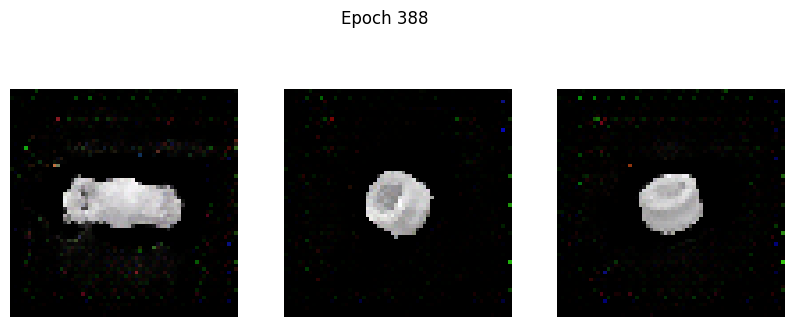

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0707 - g_loss: 5.3887
Epoch 389/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -3.5712e-04 - g_loss: 4.8528

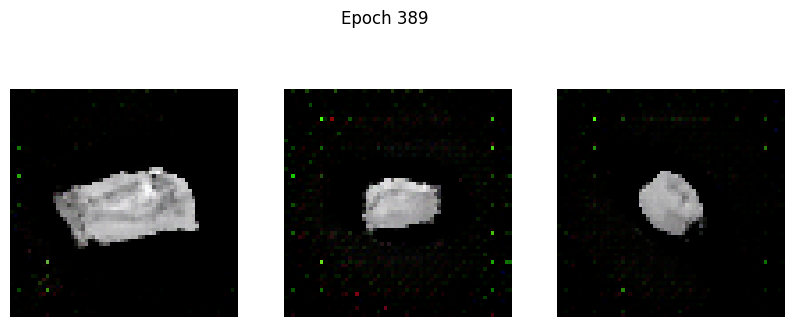

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -2.7792e-04 - g_loss: 4.8536
Epoch 390/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0141 - g_loss: 4.9788

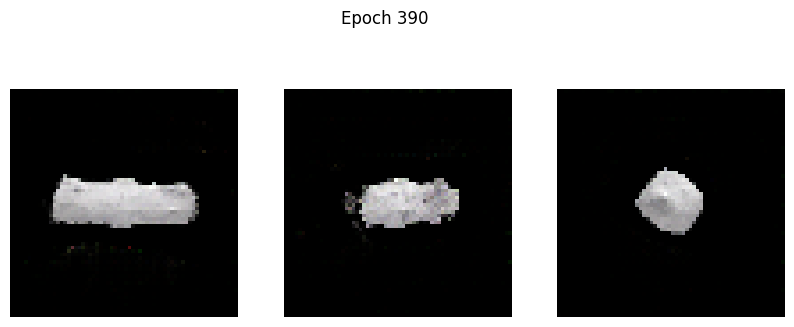

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0144 - g_loss: 4.9798
Epoch 391/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0333 - g_loss: 4.7101

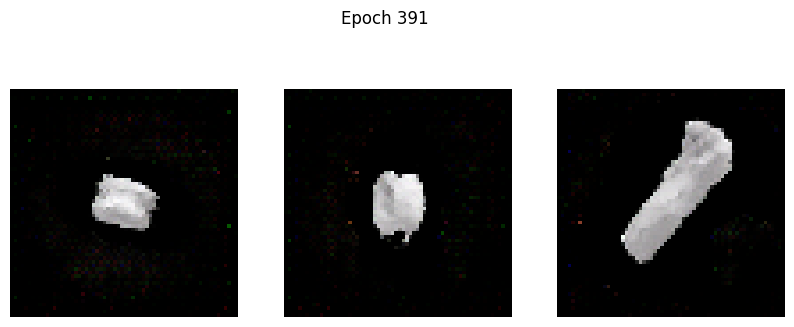

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0328 - g_loss: 4.7133
Epoch 392/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0268 - g_loss: 4.8928

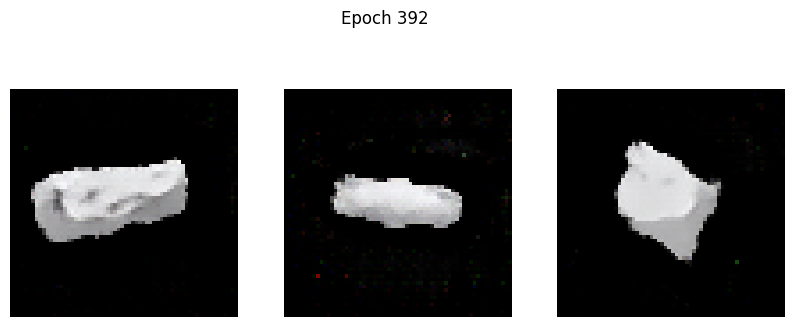

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0267 - g_loss: 4.8931
Epoch 393/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0478 - g_loss: 5.5093

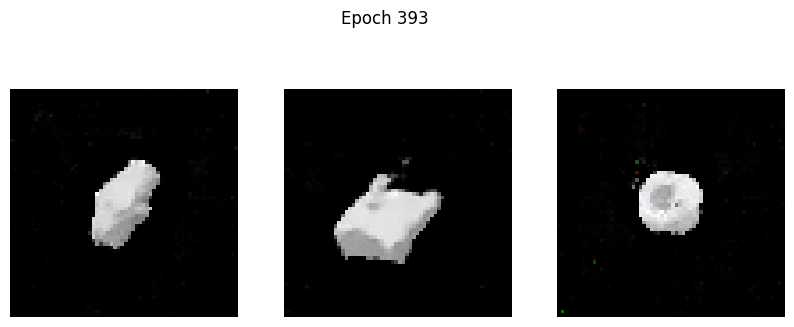

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0481 - g_loss: 5.5085
Epoch 394/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0390 - g_loss: 5.3315

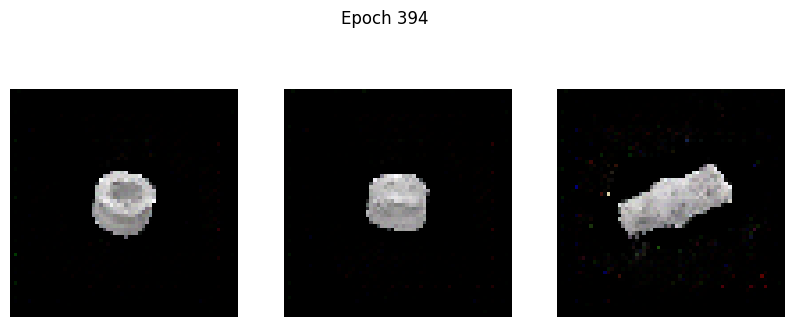

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0385 - g_loss: 5.3276
Epoch 395/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0329 - g_loss: 5.1187

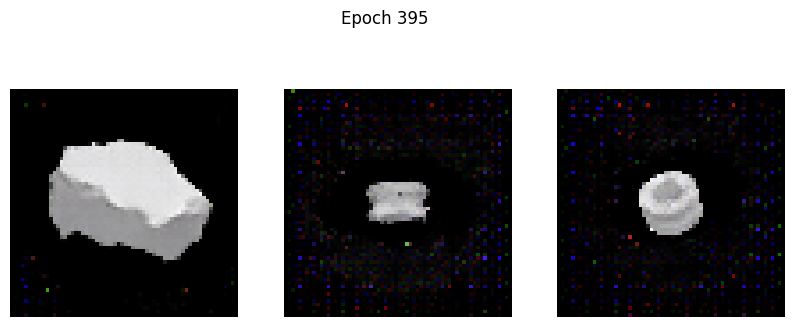

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0326 - g_loss: 5.1213
Epoch 396/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0197 - g_loss: 5.4648

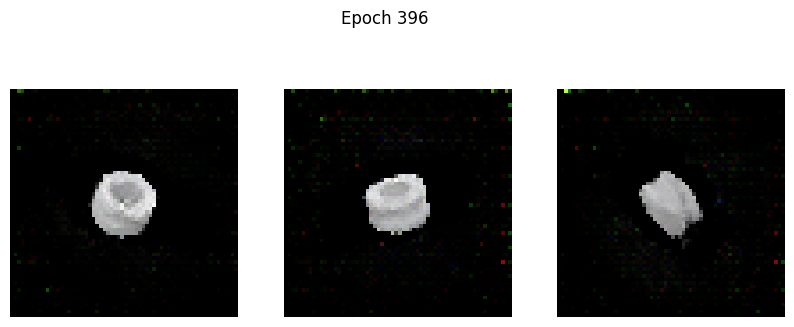

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0193 - g_loss: 5.4646
Epoch 397/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0352 - g_loss: 5.4524

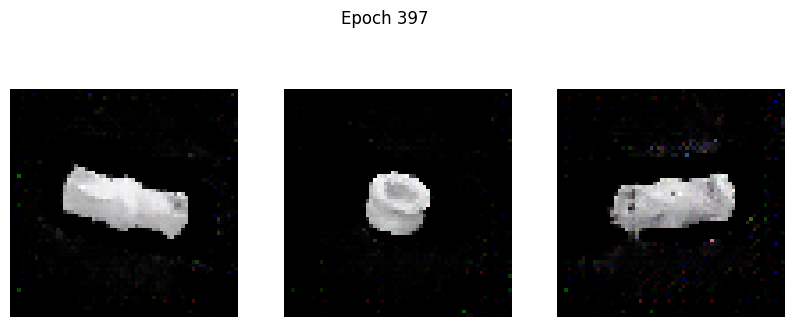

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0349 - g_loss: 5.4515
Epoch 398/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0247 - g_loss: 5.2162

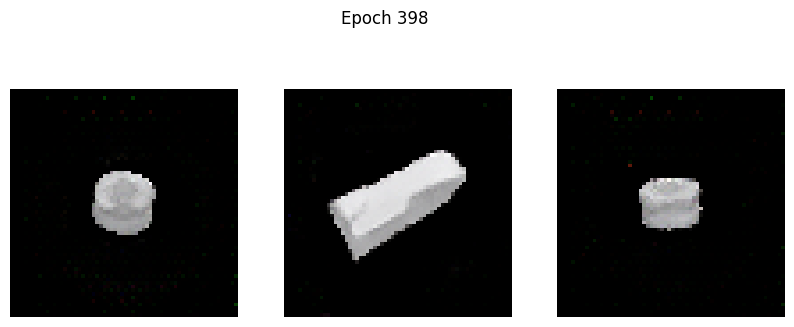

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0247 - g_loss: 5.2167
Epoch 399/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0184 - g_loss: 5.3690

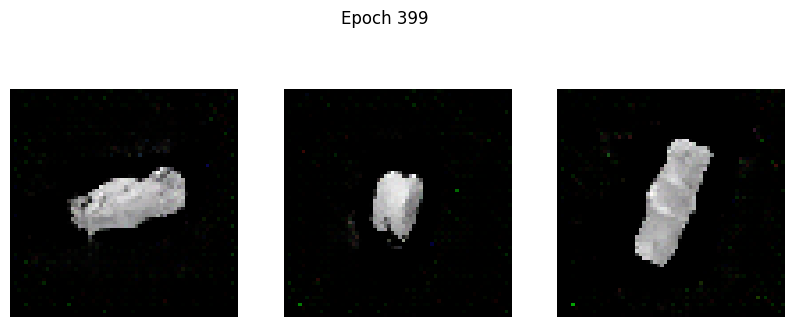

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0185 - g_loss: 5.3690
Epoch 400/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0485 - g_loss: 5.0339

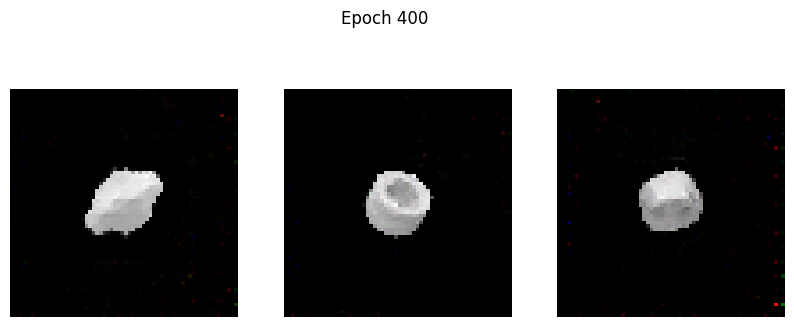

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0482 - g_loss: 5.0337
Epoch 401/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0202 - g_loss: 5.0406

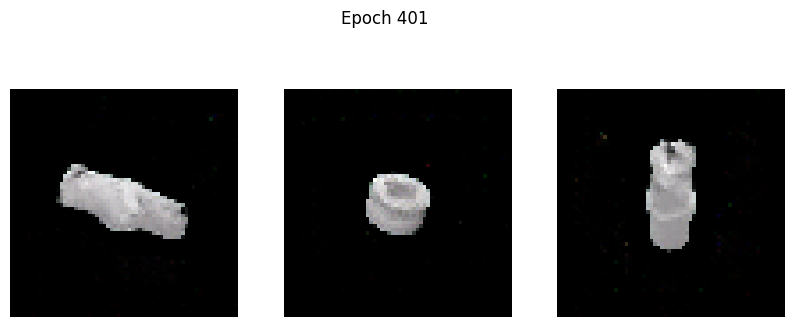

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0200 - g_loss: 5.0413
Epoch 402/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.2194 - g_loss: 6.3863

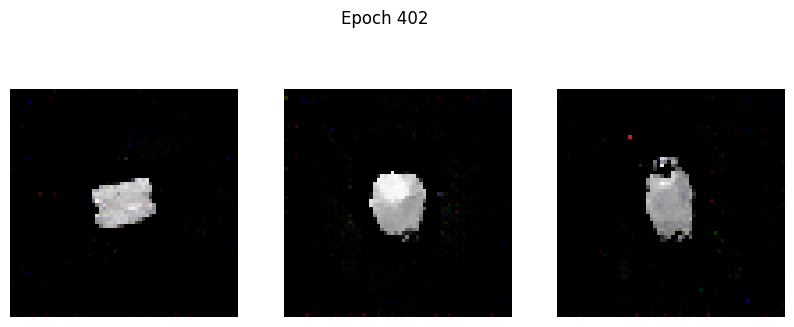

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.2178 - g_loss: 6.3775
Epoch 403/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0325 - g_loss: 4.9217

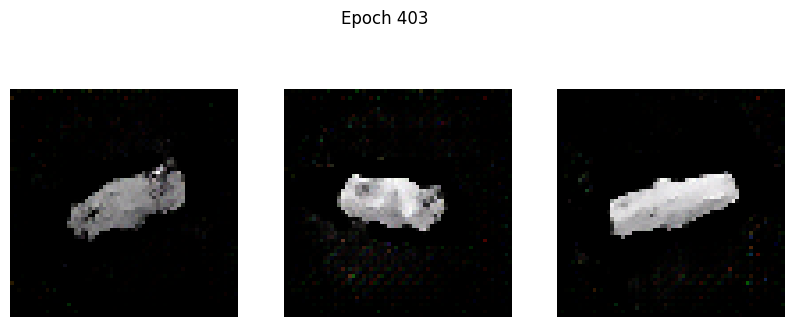

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0324 - g_loss: 4.9233
Epoch 404/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0267 - g_loss: 5.1386

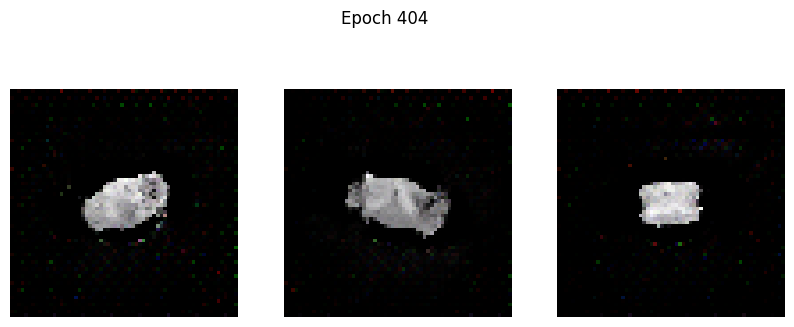

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0265 - g_loss: 5.1393
Epoch 405/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0265 - g_loss: 5.1121

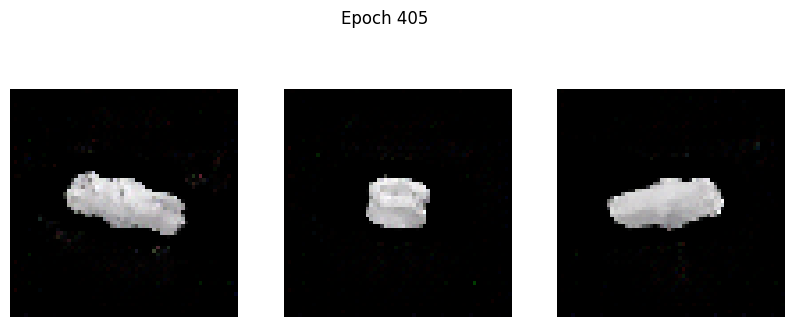

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0265 - g_loss: 5.1123
Epoch 406/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0028 - g_loss: 5.4434

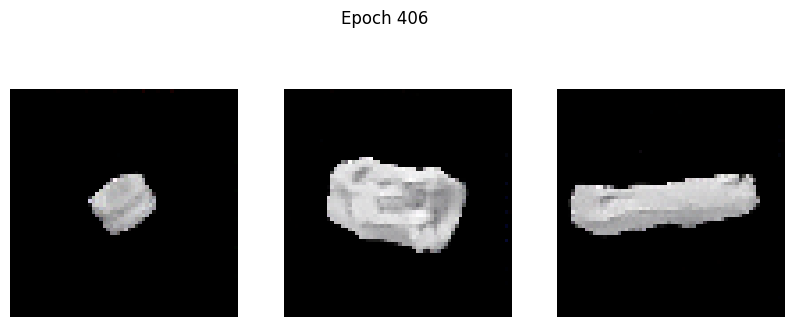

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0030 - g_loss: 5.4430
Epoch 407/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0309 - g_loss: 5.5569

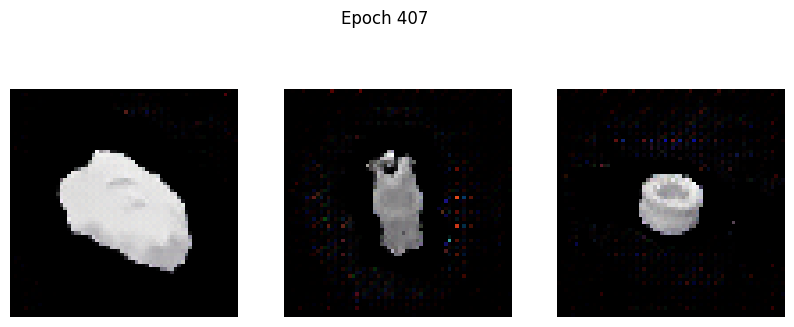

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0323 - g_loss: 5.5602
Epoch 408/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0609 - g_loss: 5.4099

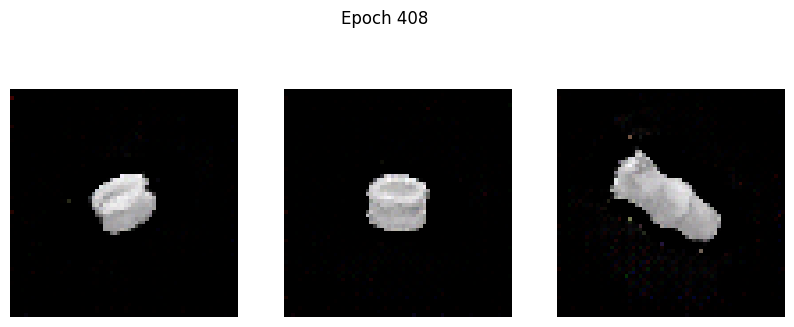

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0604 - g_loss: 5.4084
Epoch 409/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0243 - g_loss: 5.0047

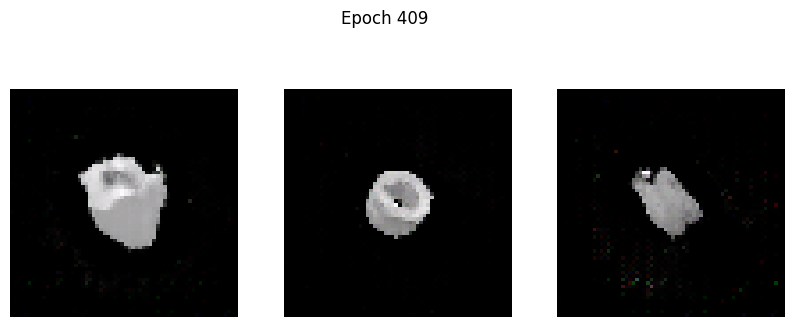

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0242 - g_loss: 5.0063
Epoch 410/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0041 - g_loss: 5.2970

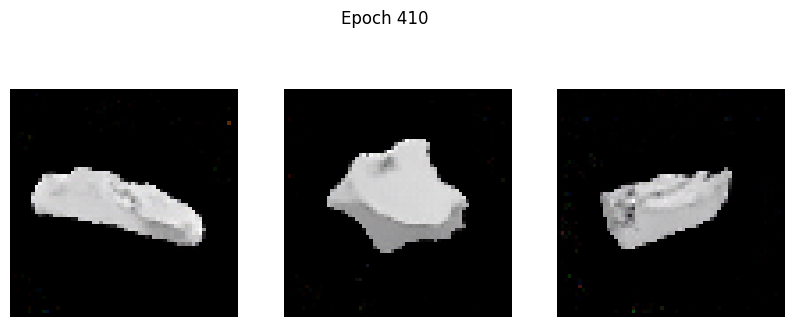

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0041 - g_loss: 5.2966
Epoch 411/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0249 - g_loss: 5.0869

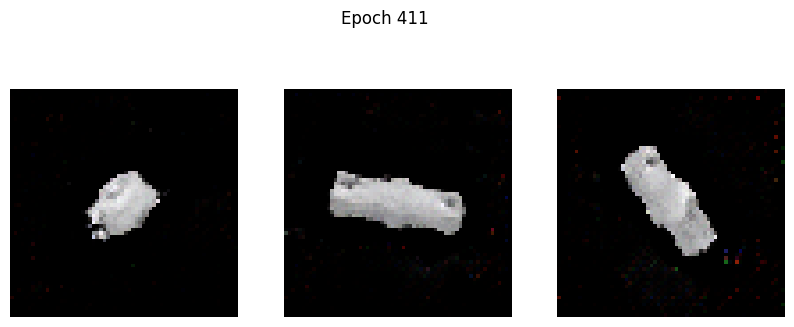

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0246 - g_loss: 5.0907
Epoch 412/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0316 - g_loss: 5.1685

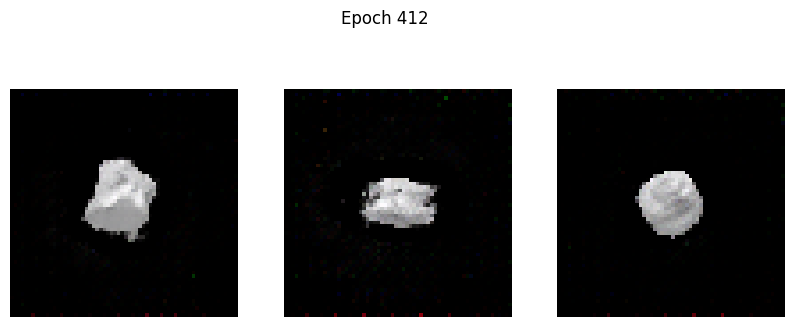

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0314 - g_loss: 5.1703
Epoch 413/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0181 - g_loss: 5.3645

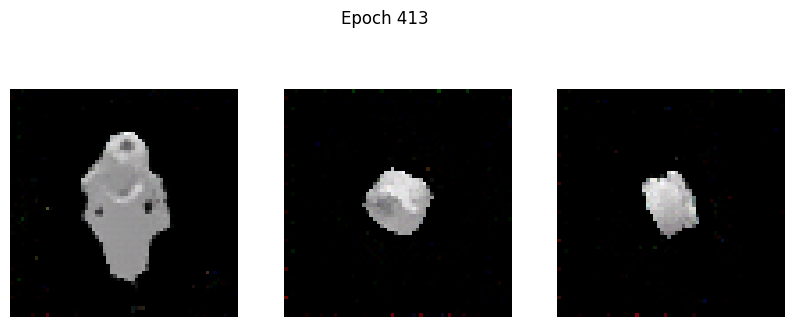

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0178 - g_loss: 5.3640
Epoch 414/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0421 - g_loss: 5.2422

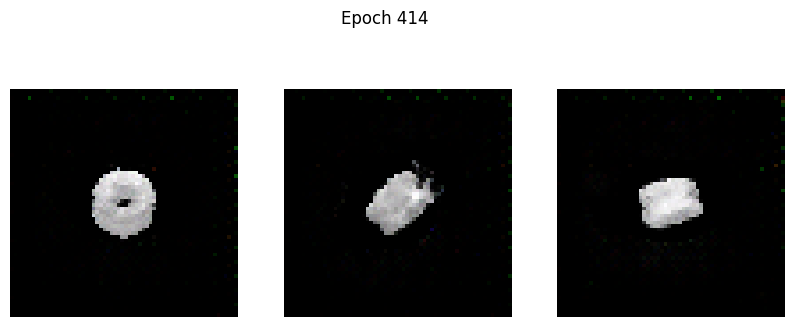

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0417 - g_loss: 5.2439
Epoch 415/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: 0.0331 - g_loss: 5.4673

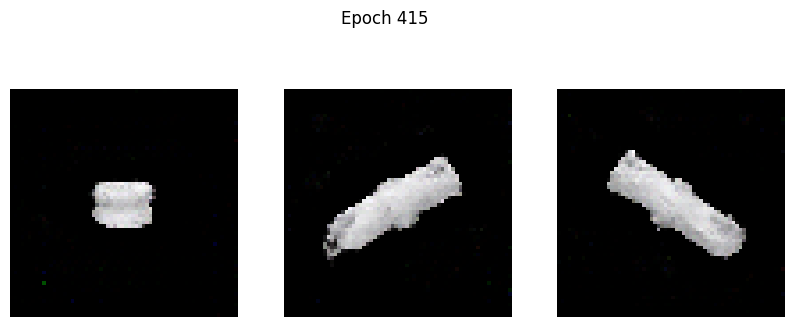

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: 0.0333 - g_loss: 5.4691
Epoch 416/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0124 - g_loss: 5.3678

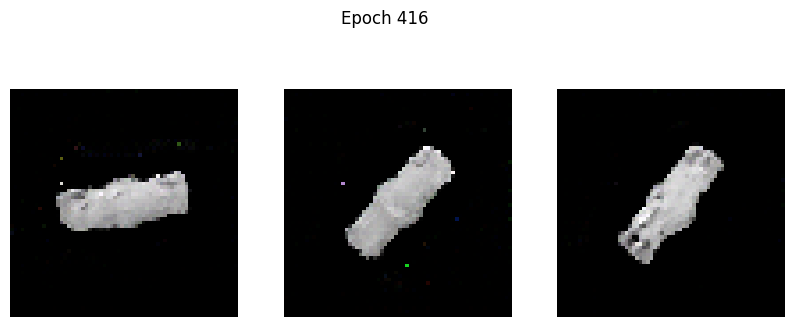

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0126 - g_loss: 5.3688
Epoch 417/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0273 - g_loss: 5.3095

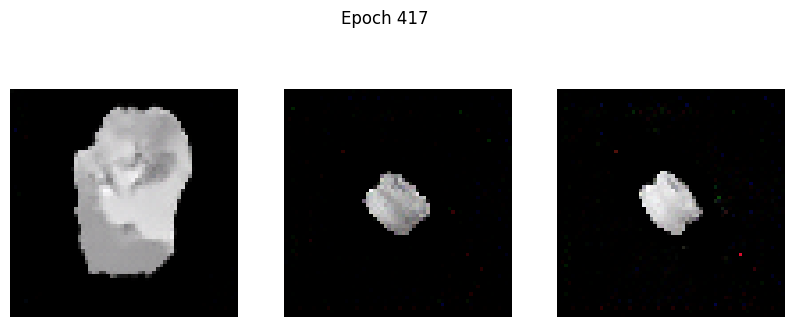

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0272 - g_loss: 5.3090
Epoch 418/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0332 - g_loss: 5.2095

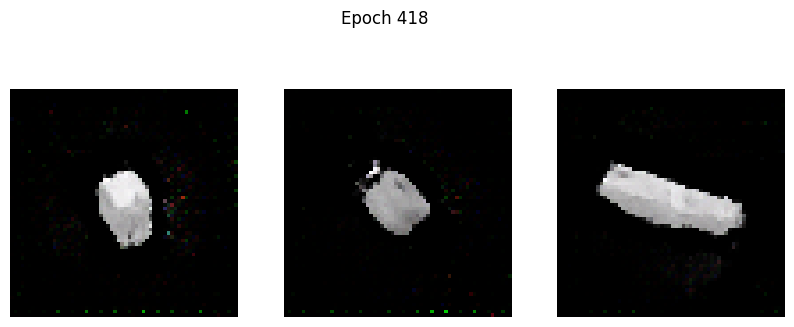

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0332 - g_loss: 5.2092
Epoch 419/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0015 - g_loss: 5.2730

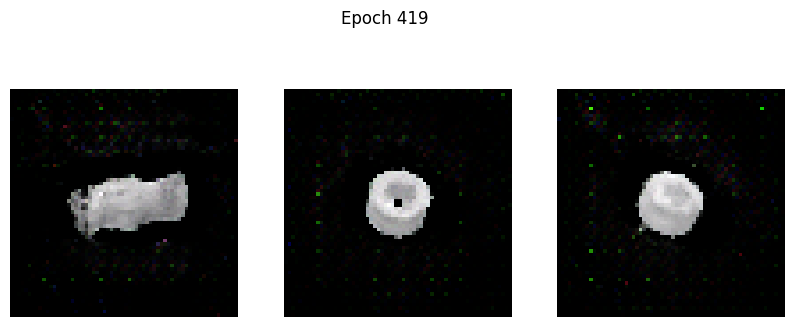

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0015 - g_loss: 5.2733
Epoch 420/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0562 - g_loss: 5.7574

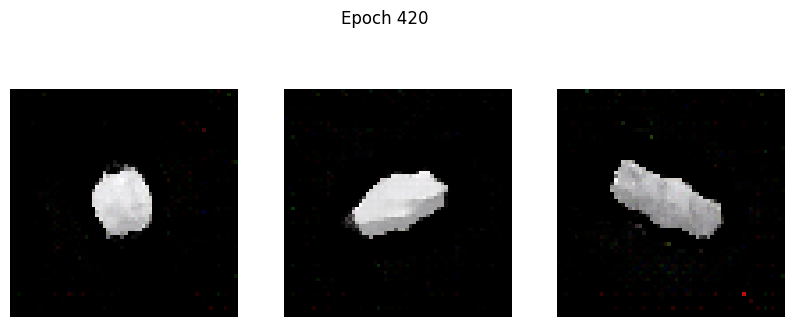

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0556 - g_loss: 5.7552
Epoch 421/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0489 - g_loss: 5.0930

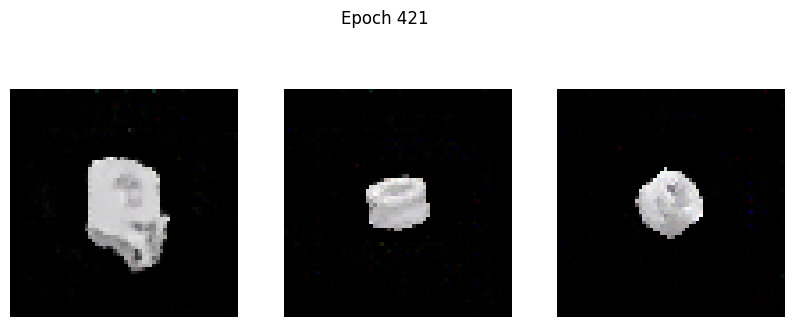

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0484 - g_loss: 5.0957
Epoch 422/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0085 - g_loss: 5.5646

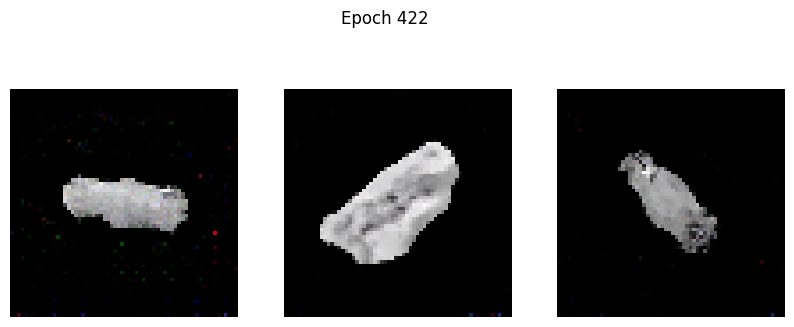

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0086 - g_loss: 5.5634
Epoch 423/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0353 - g_loss: 5.5670

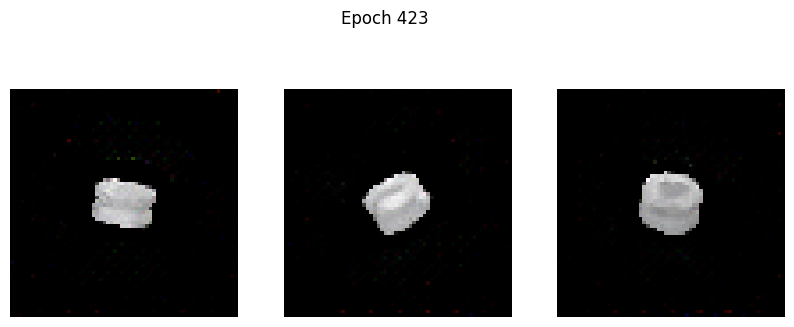

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0353 - g_loss: 5.5676
Epoch 424/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0483 - g_loss: 5.1693

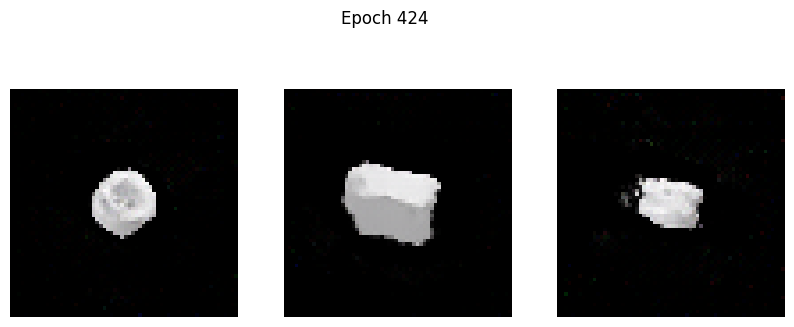

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0480 - g_loss: 5.1707
Epoch 425/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0094 - g_loss: 5.7427

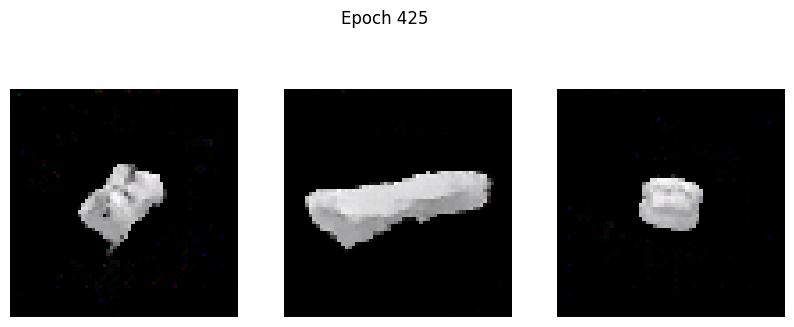

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0093 - g_loss: 5.7408
Epoch 426/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0322 - g_loss: 5.6297

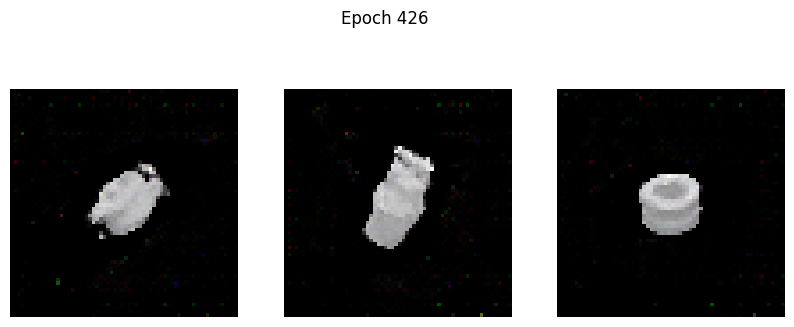

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0318 - g_loss: 5.6292
Epoch 427/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0388 - g_loss: 5.0357

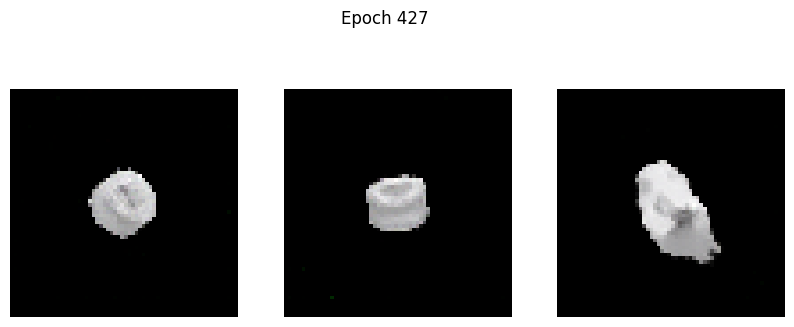

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0385 - g_loss: 5.0375
Epoch 428/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0467 - g_loss: 5.4641

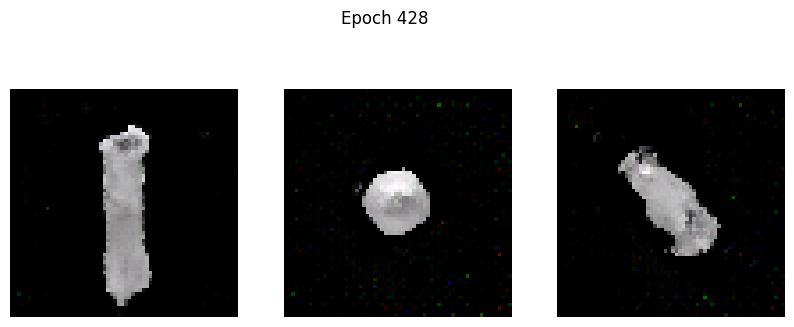

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0466 - g_loss: 5.4639
Epoch 429/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0204 - g_loss: 5.5368

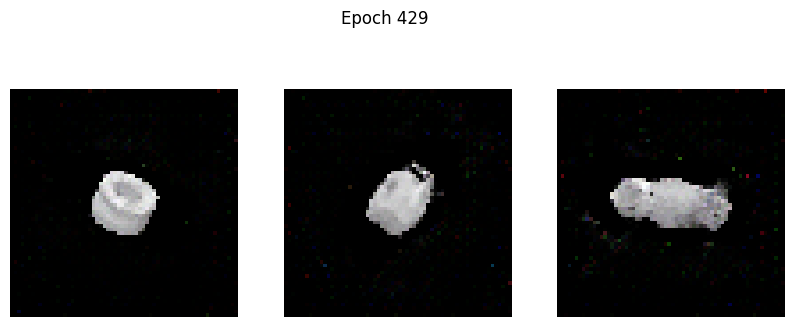

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0207 - g_loss: 5.5353
Epoch 430/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0342 - g_loss: 5.6812

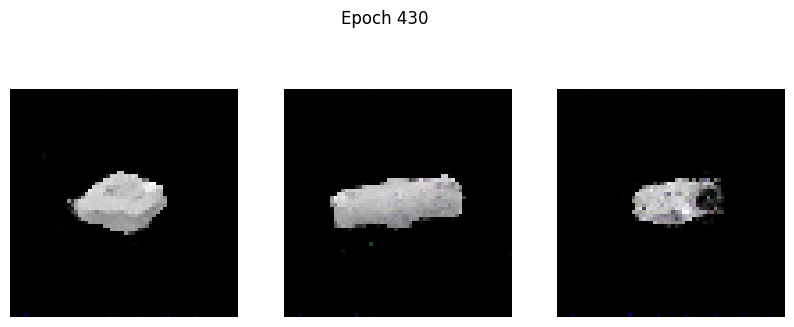

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0340 - g_loss: 5.6814
Epoch 431/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0591 - g_loss: 5.5435

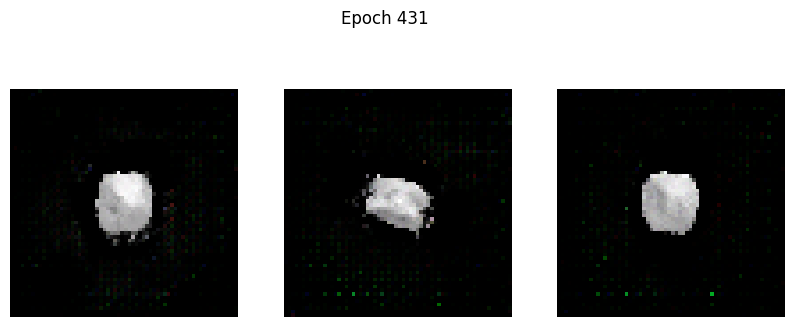

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0589 - g_loss: 5.5461
Epoch 432/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0480 - g_loss: 5.7426

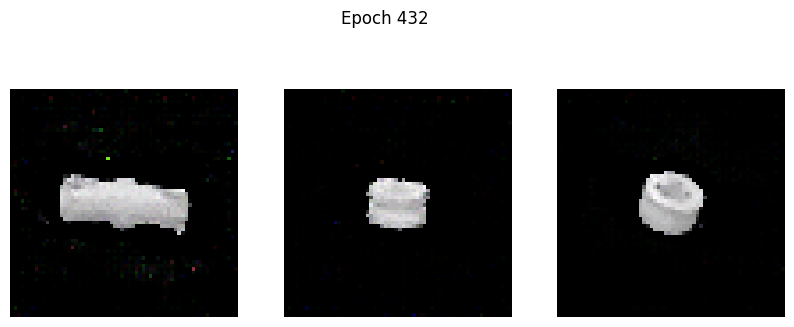

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0476 - g_loss: 5.7413
Epoch 433/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0115 - g_loss: 5.6822

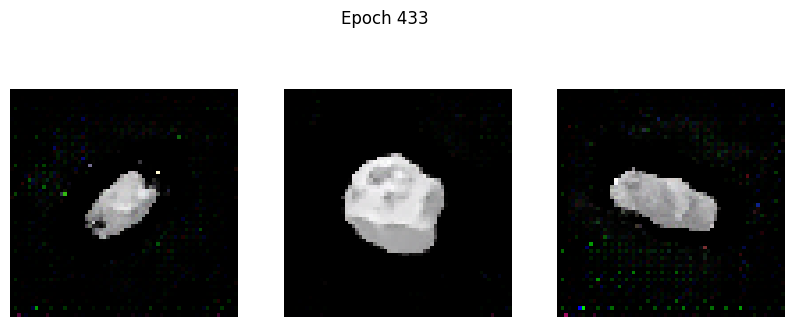

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0116 - g_loss: 5.6825
Epoch 434/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0818 - g_loss: 6.1317

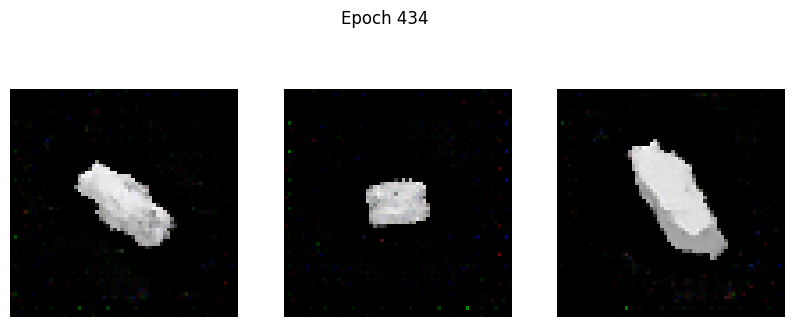

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0812 - g_loss: 6.1298
Epoch 435/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0208 - g_loss: 5.7428

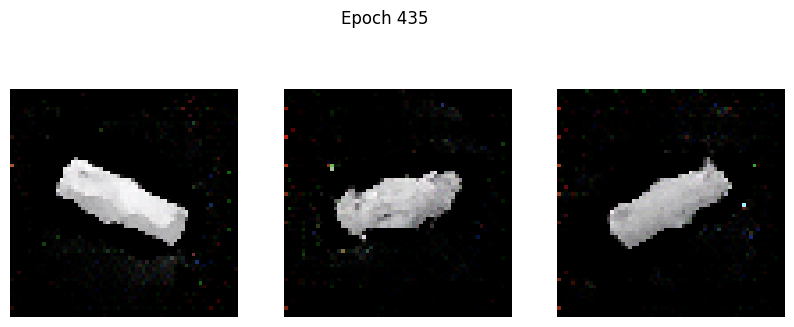

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0203 - g_loss: 5.7430
Epoch 436/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0508 - g_loss: 5.6324

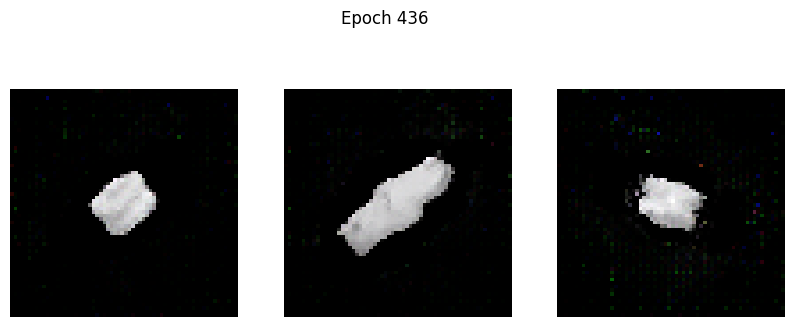

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0510 - g_loss: 5.6301
Epoch 437/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0719 - g_loss: 5.3994

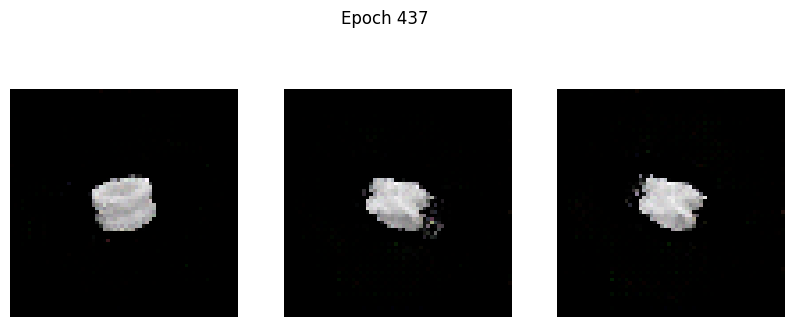

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0716 - g_loss: 5.4024
Epoch 438/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0251 - g_loss: 5.5446

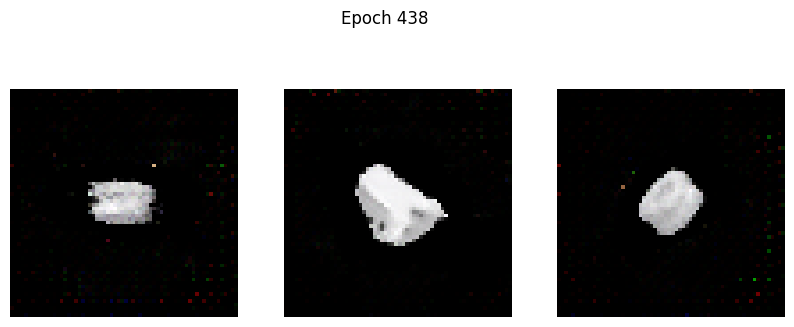

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0251 - g_loss: 5.5462
Epoch 439/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0451 - g_loss: 5.6718

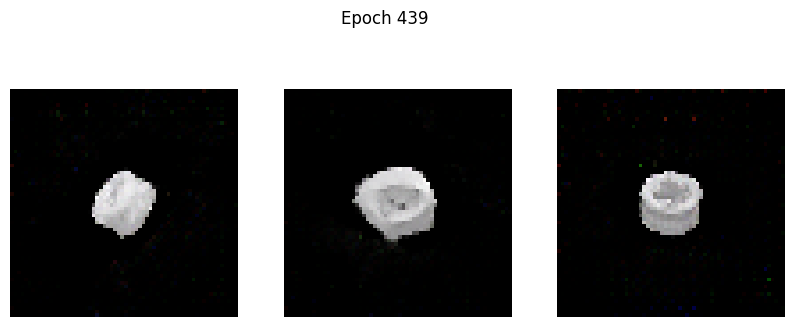

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - d_loss: -0.0451 - g_loss: 5.6722
Epoch 440/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.0870 - g_loss: 5.7201

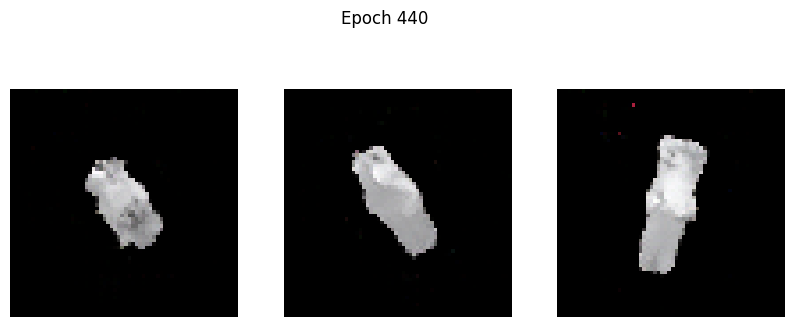

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.0866 - g_loss: 5.7213
Epoch 441/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - d_loss: -0.0415 - g_loss: 5.6430

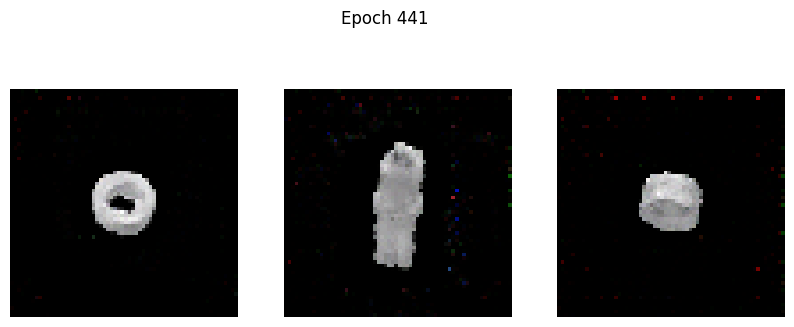

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - d_loss: -0.0414 - g_loss: 5.6437
Epoch 442/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0759 - g_loss: 5.8784

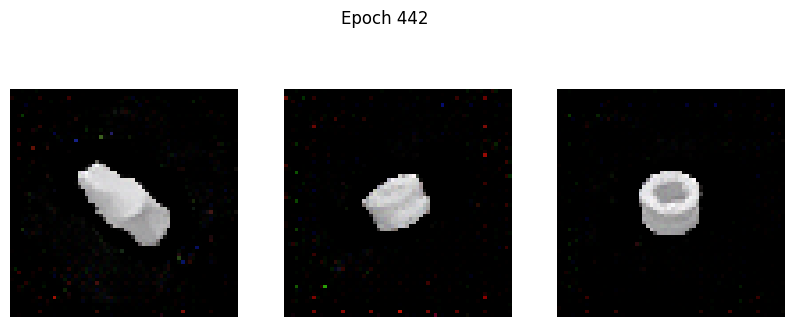

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0756 - g_loss: 5.8783
Epoch 443/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0359 - g_loss: 5.7208

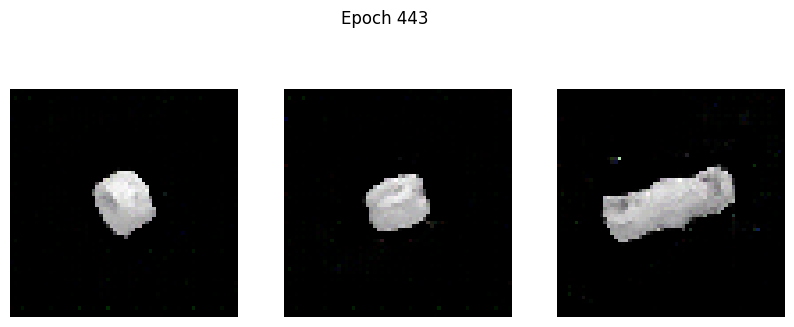

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0354 - g_loss: 5.7261
Epoch 444/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0995 - g_loss: 5.3295

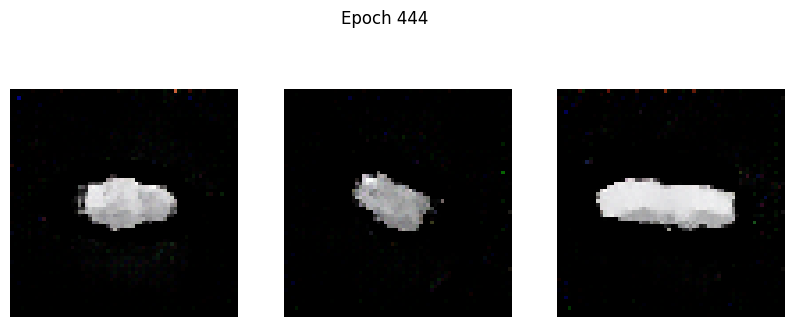

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0995 - g_loss: 5.3307
Epoch 445/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0166 - g_loss: 5.7066

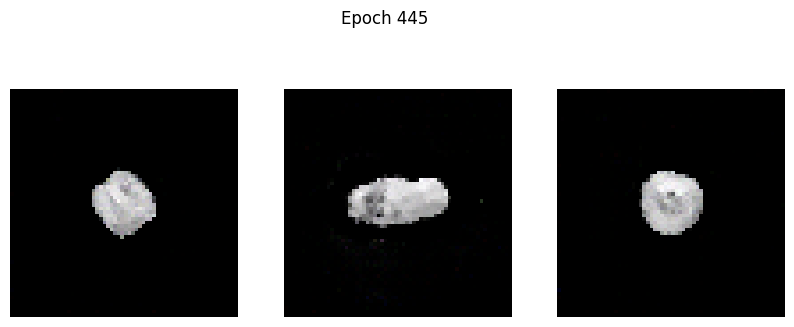

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0168 - g_loss: 5.7083
Epoch 446/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0276 - g_loss: 5.7805

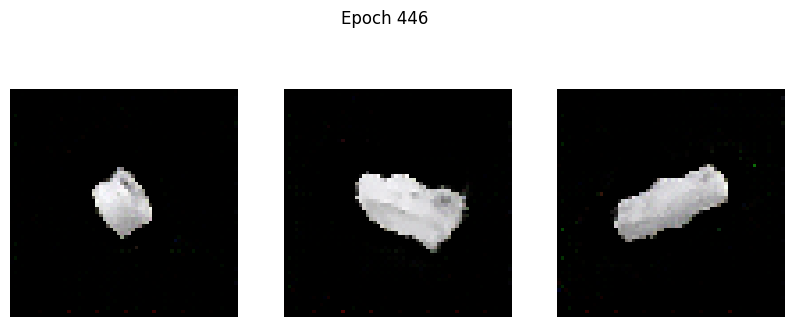

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 133ms/step - d_loss: -0.0274 - g_loss: 5.7844
Epoch 447/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0081 - g_loss: 5.7906

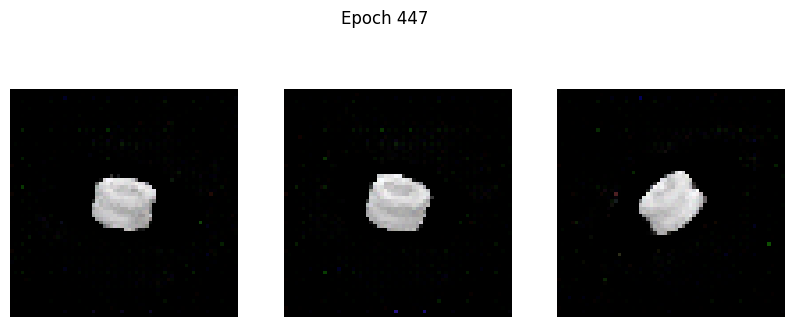

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0087 - g_loss: 5.7888
Epoch 448/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0435 - g_loss: 5.9262

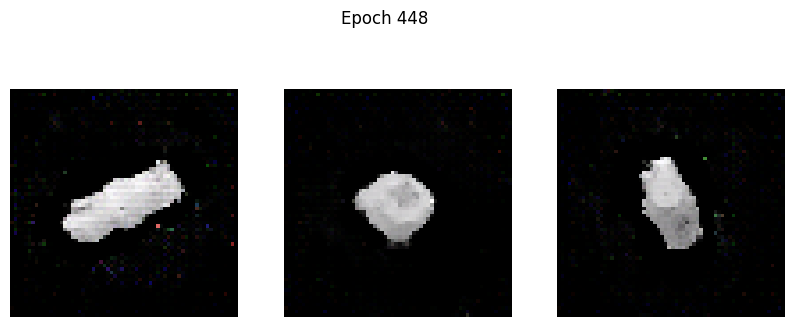

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0435 - g_loss: 5.9268
Epoch 449/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0359 - g_loss: 6.4849

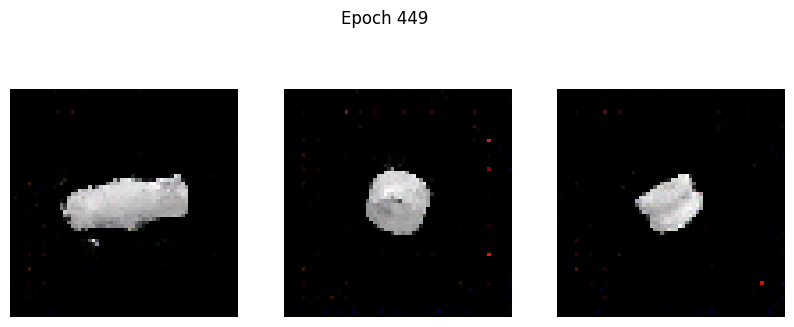

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0353 - g_loss: 6.4815
Epoch 450/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0110 - g_loss: 6.3275

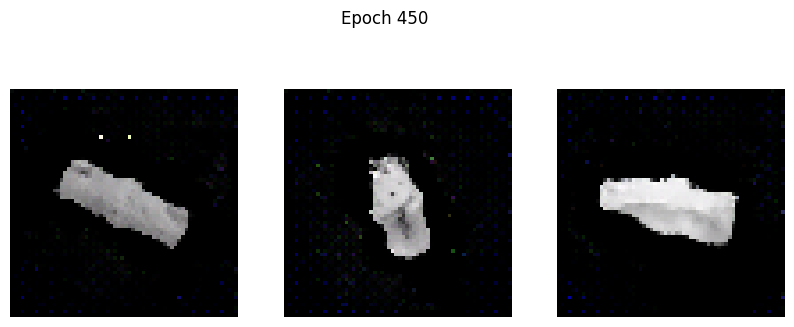

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.0108 - g_loss: 6.3275
Epoch 451/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0560 - g_loss: 5.8580

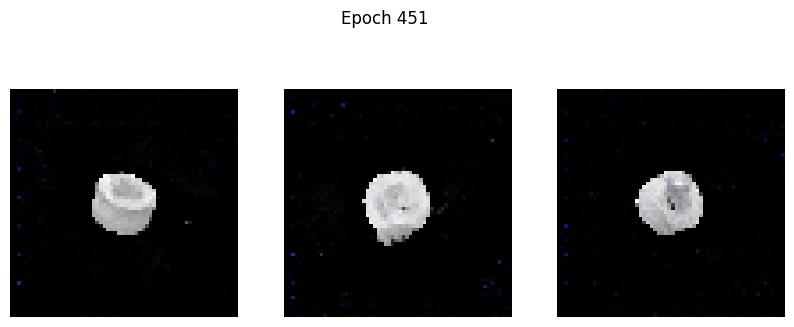

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0560 - g_loss: 5.8573
Epoch 452/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1085 - g_loss: 5.7895

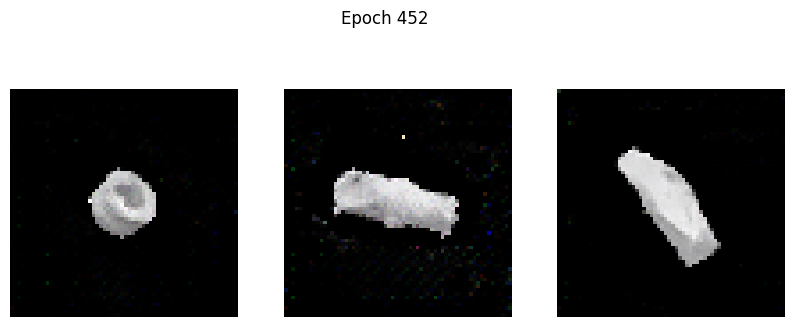

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1080 - g_loss: 5.7916
Epoch 453/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1281 - g_loss: 5.9526

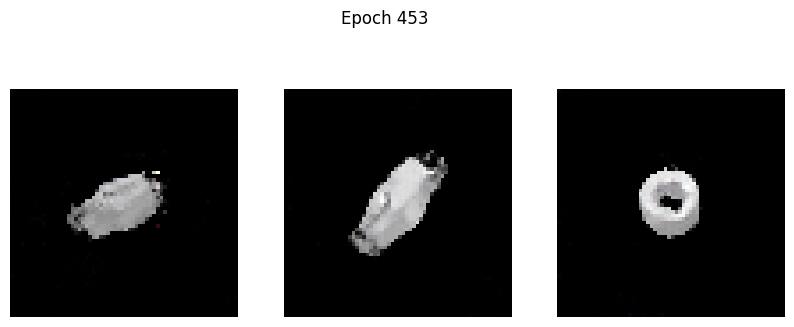

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1278 - g_loss: 5.9508
Epoch 454/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1034 - g_loss: 6.1541

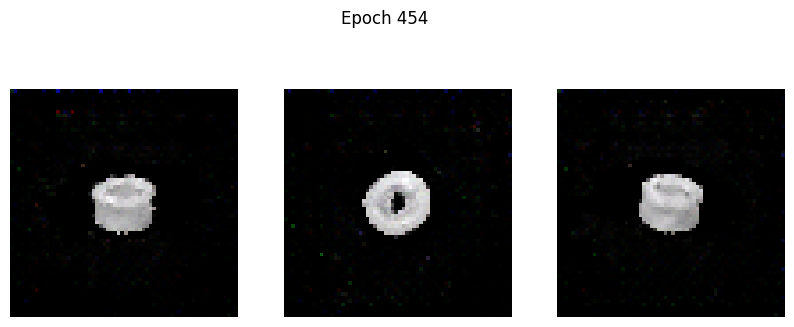

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1034 - g_loss: 6.1530
Epoch 455/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0124 - g_loss: 6.1666

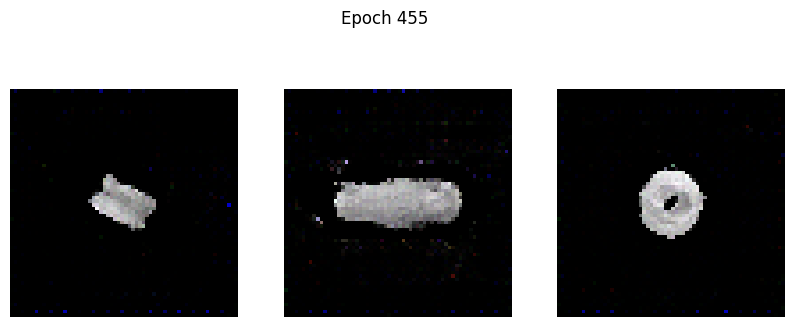

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0119 - g_loss: 6.1657
Epoch 456/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1158 - g_loss: 5.5584

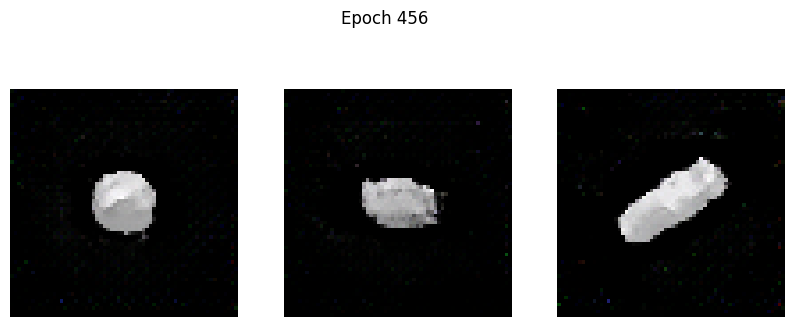

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - d_loss: -0.1157 - g_loss: 5.5603
Epoch 457/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0463 - g_loss: 6.5667

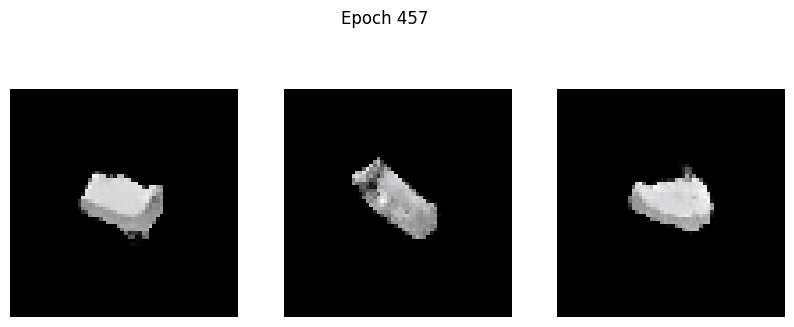

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0459 - g_loss: 6.5695
Epoch 458/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0406 - g_loss: 6.3915

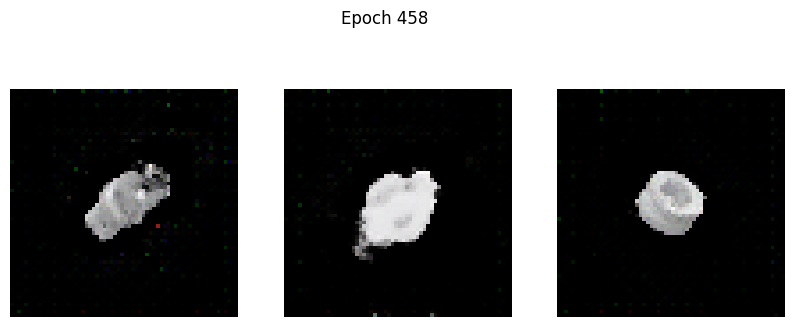

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0408 - g_loss: 6.3913
Epoch 459/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0216 - g_loss: 6.5122

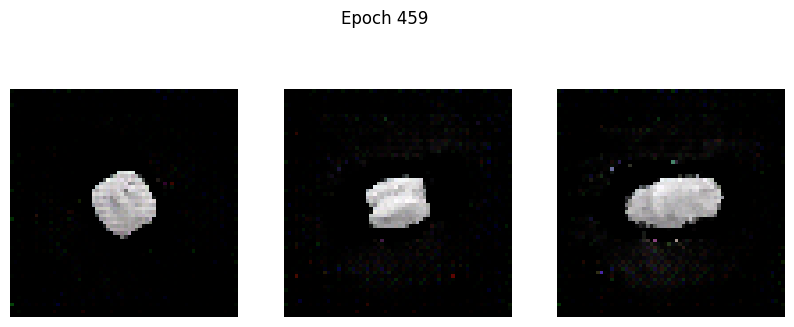

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0221 - g_loss: 6.5105
Epoch 460/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1323 - g_loss: 6.1031

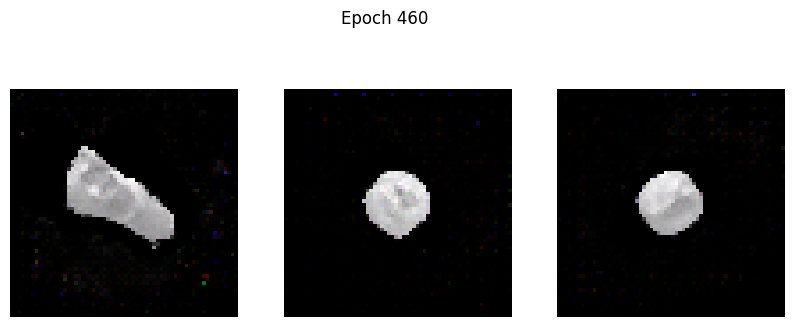

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1316 - g_loss: 6.1052
Epoch 461/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1016 - g_loss: 6.0659

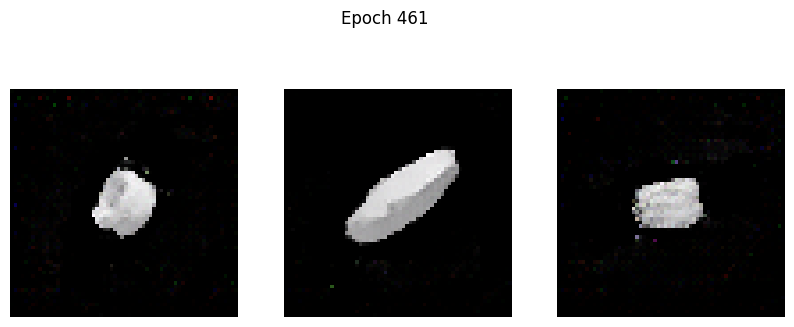

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1015 - g_loss: 6.0666
Epoch 462/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1358 - g_loss: 6.0813

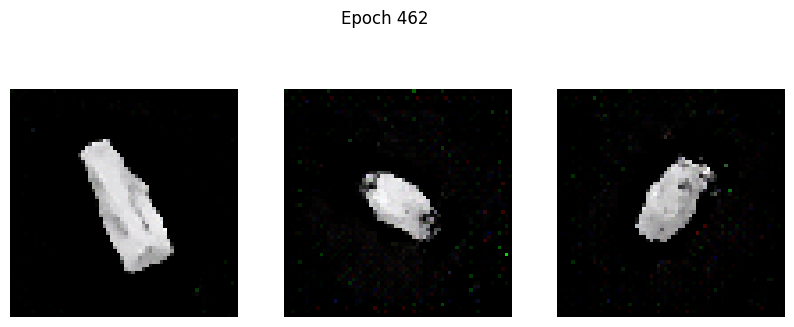

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1356 - g_loss: 6.0828
Epoch 463/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1019 - g_loss: 6.2750

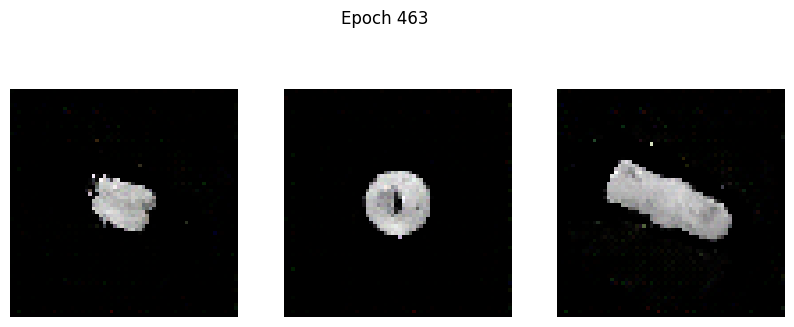

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1018 - g_loss: 6.2740
Epoch 464/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1114 - g_loss: 6.2668

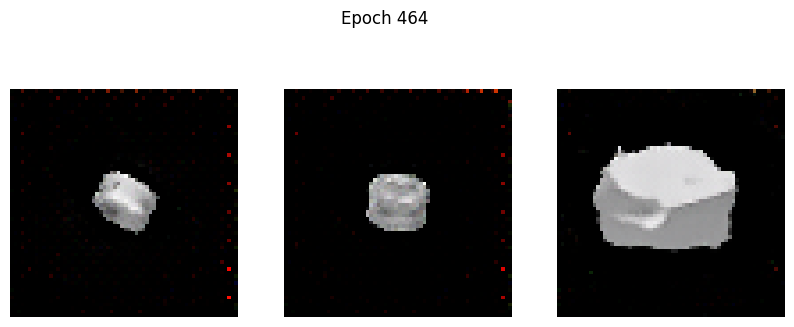

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1109 - g_loss: 6.2702
Epoch 465/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0978 - g_loss: 6.1614

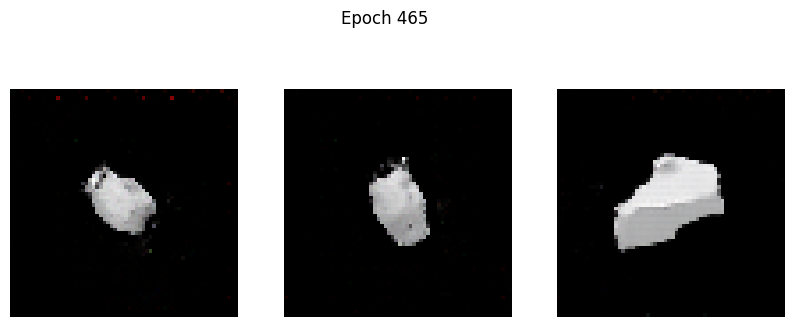

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0975 - g_loss: 6.1633
Epoch 466/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0860 - g_loss: 6.2741

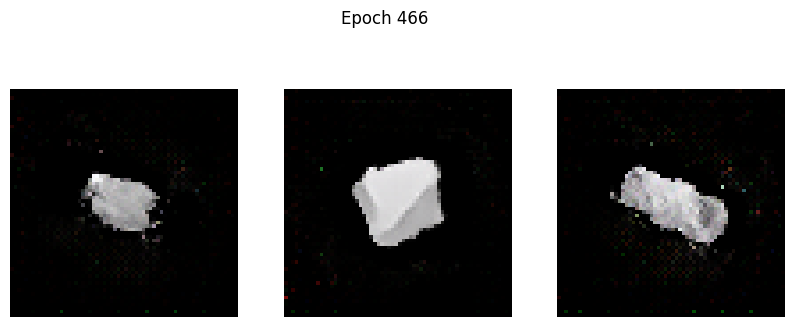

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0863 - g_loss: 6.2719
Epoch 467/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0602 - g_loss: 6.6143

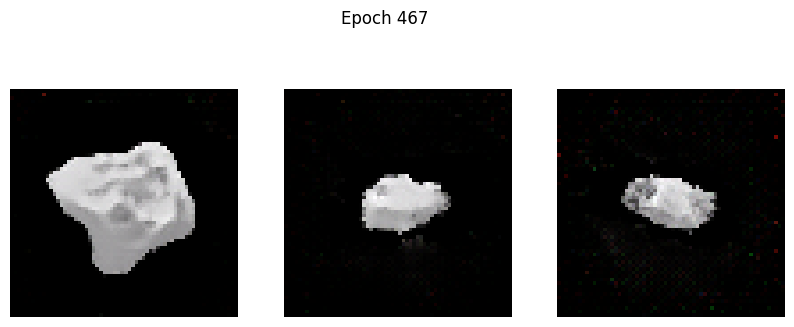

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0603 - g_loss: 6.6132
Epoch 468/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0984 - g_loss: 6.6947

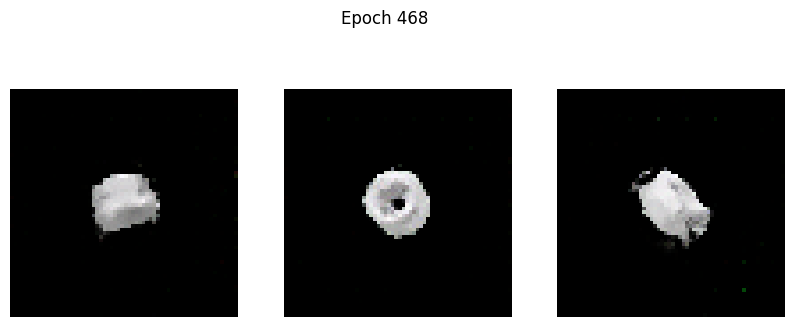

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0983 - g_loss: 6.6924
Epoch 469/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.1328 - g_loss: 6.3267

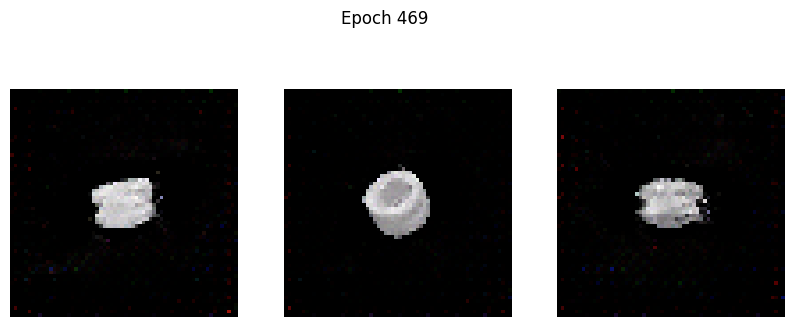

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.1325 - g_loss: 6.3277
Epoch 470/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.0520 - g_loss: 7.1185

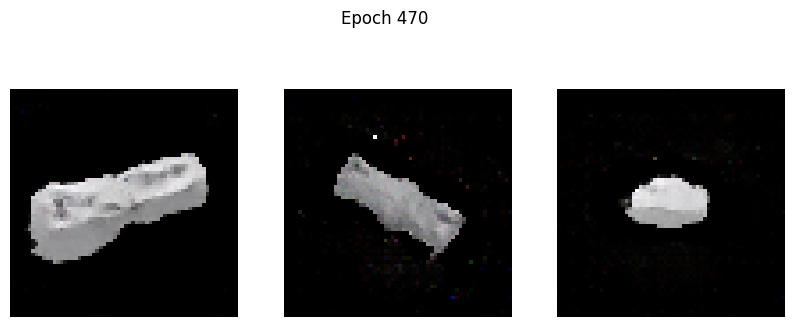

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.0527 - g_loss: 7.1118
Epoch 471/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1281 - g_loss: 6.3399

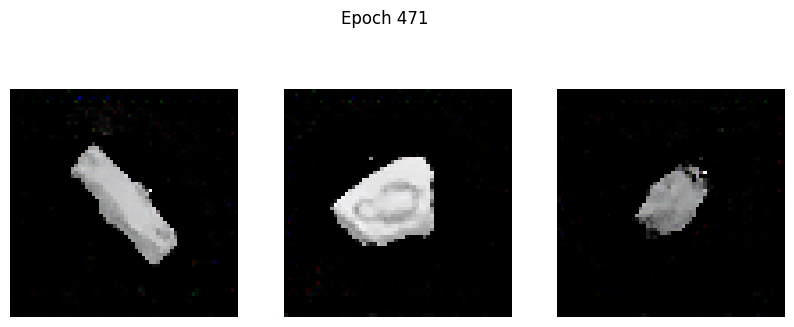

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1281 - g_loss: 6.3415
Epoch 472/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0532 - g_loss: 6.3718

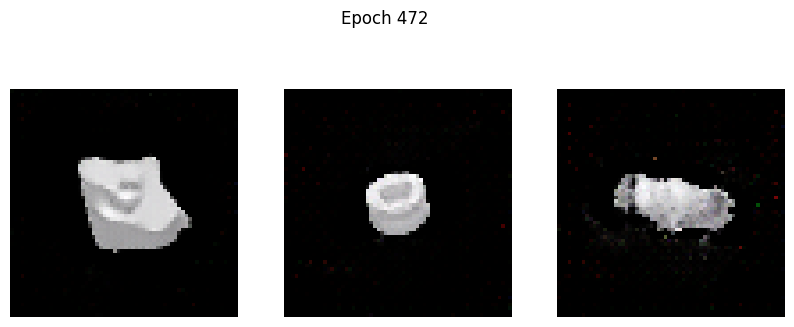

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.0533 - g_loss: 6.3720
Epoch 473/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0480 - g_loss: 6.8354

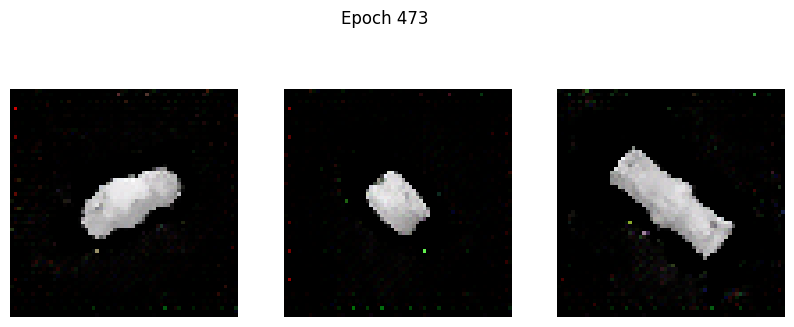

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0479 - g_loss: 6.8351
Epoch 474/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1351 - g_loss: 6.2668

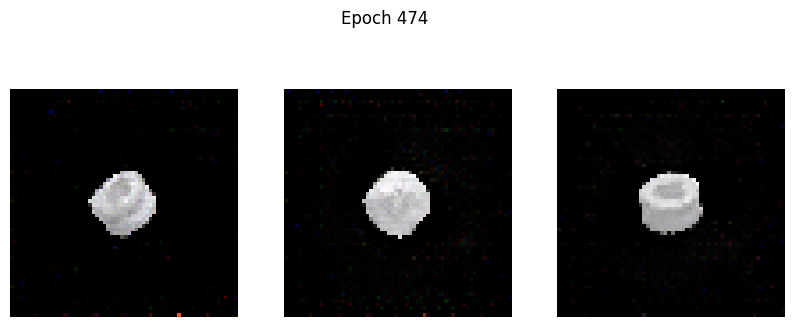

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1349 - g_loss: 6.2676
Epoch 475/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1122 - g_loss: 6.4970

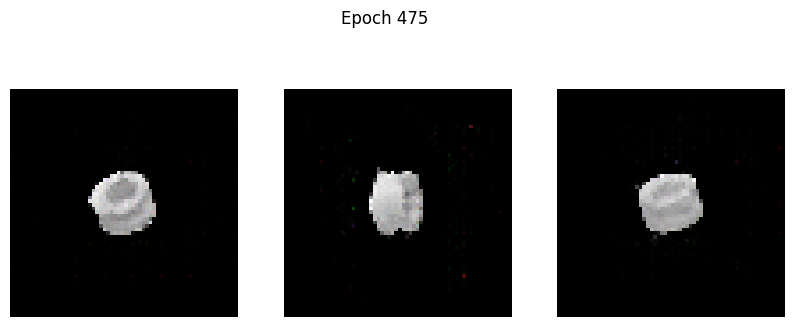

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1111 - g_loss: 6.5032
Epoch 476/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1416 - g_loss: 6.2155

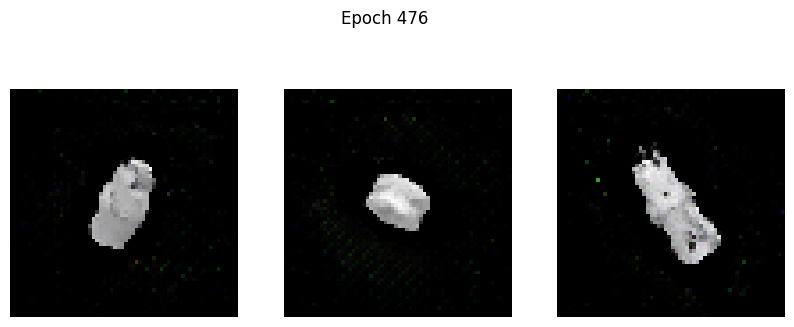

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1418 - g_loss: 6.2153
Epoch 477/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0632 - g_loss: 6.7274

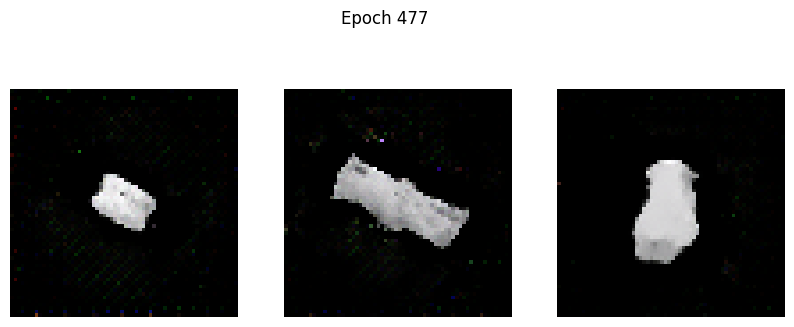

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0629 - g_loss: 6.7288
Epoch 478/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1715 - g_loss: 5.9914

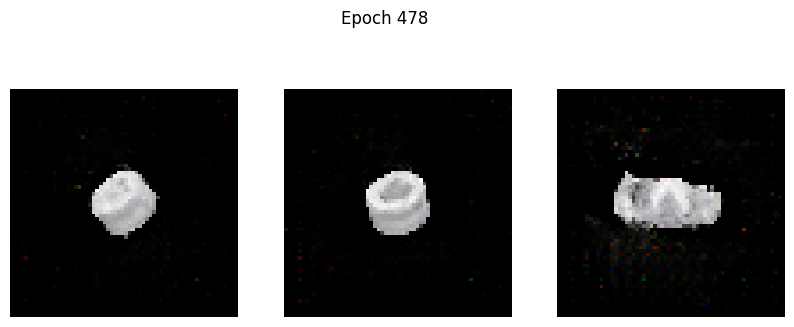

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1712 - g_loss: 5.9947
Epoch 479/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.0671 - g_loss: 6.6828

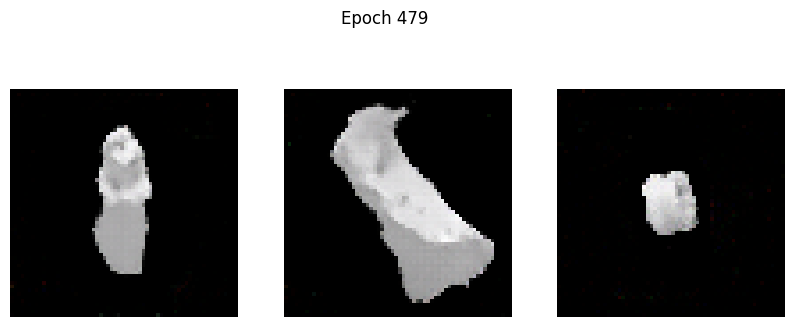

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.0673 - g_loss: 6.6802
Epoch 480/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1156 - g_loss: 6.5990

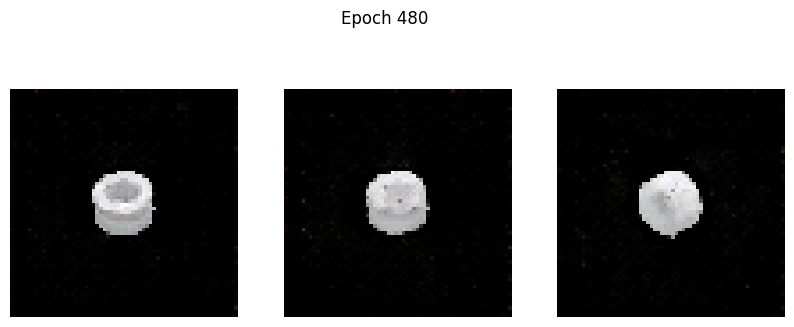

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1157 - g_loss: 6.5986
Epoch 481/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - d_loss: -0.1853 - g_loss: 6.4142

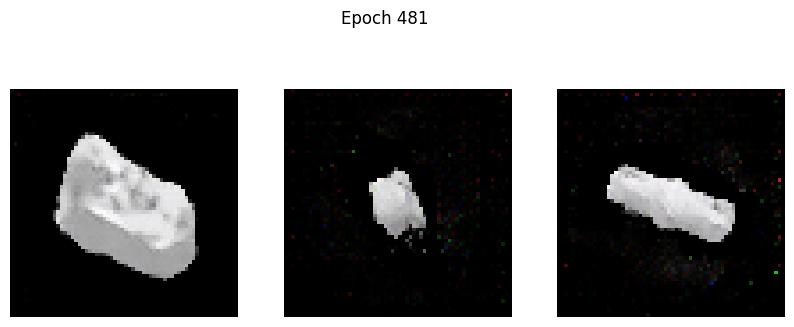

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1851 - g_loss: 6.4131
Epoch 482/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: 0.0100 - g_loss: 7.4863

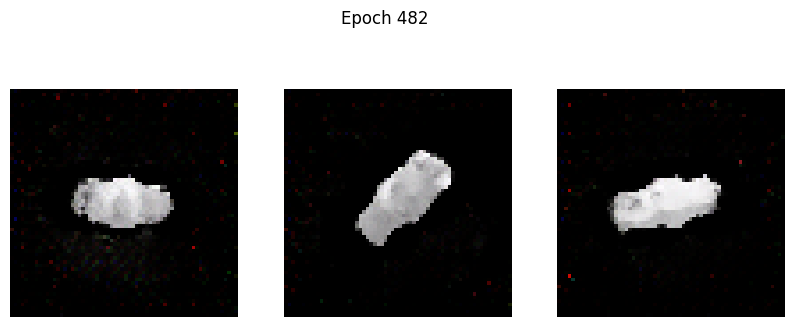

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: 0.0092 - g_loss: 7.4826
Epoch 483/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1549 - g_loss: 7.0119

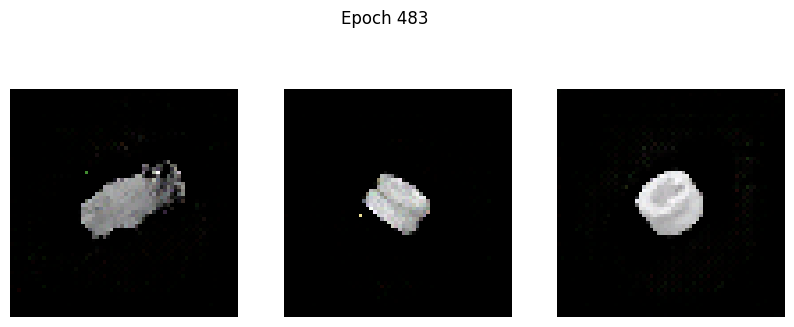

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1541 - g_loss: 7.0108
Epoch 484/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1473 - g_loss: 6.6922

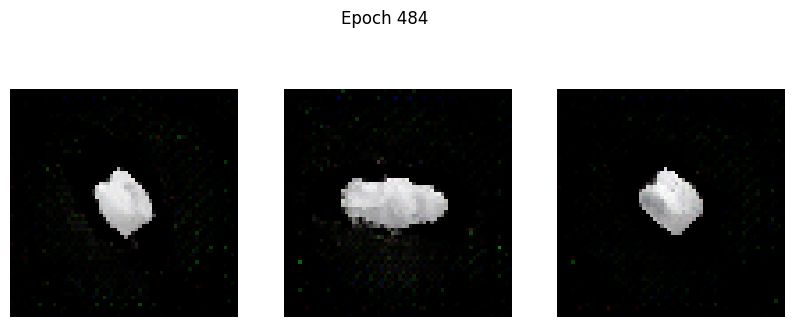

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.1467 - g_loss: 6.6953
Epoch 485/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1198 - g_loss: 6.8186

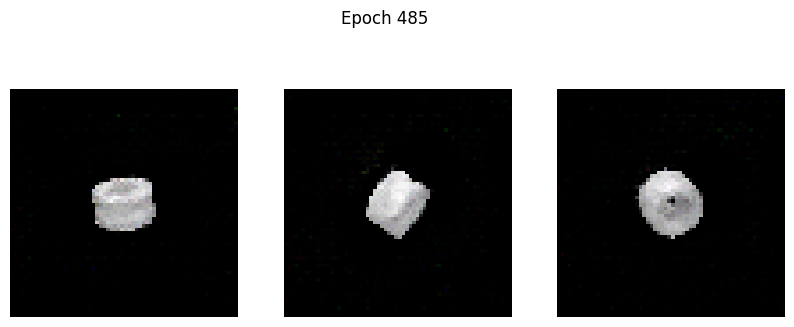

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.1201 - g_loss: 6.8176
Epoch 486/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.1531 - g_loss: 6.3985

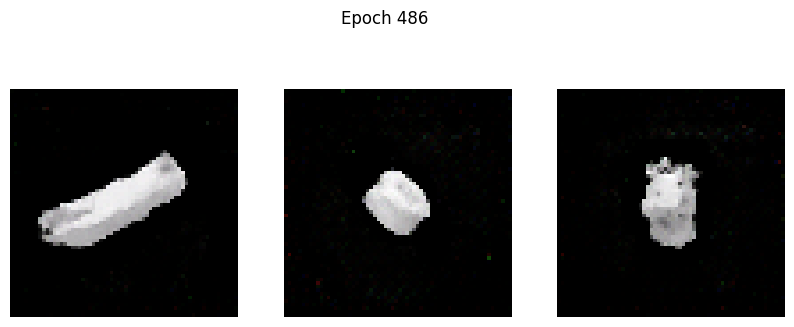

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.1532 - g_loss: 6.4006
Epoch 487/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1778 - g_loss: 6.9033

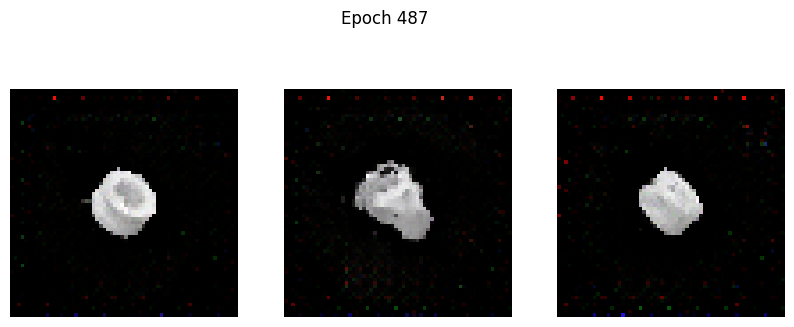

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.1775 - g_loss: 6.9035
Epoch 488/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.2511 - g_loss: 6.5309

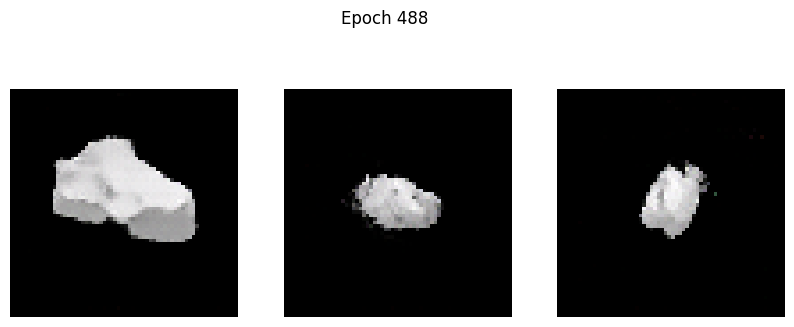

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.2503 - g_loss: 6.5355
Epoch 489/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.0250 - g_loss: 8.3667

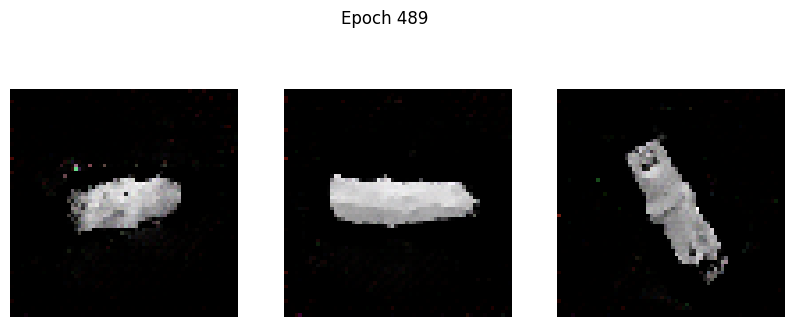

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.0251 - g_loss: 8.3628
Epoch 490/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1777 - g_loss: 6.3531

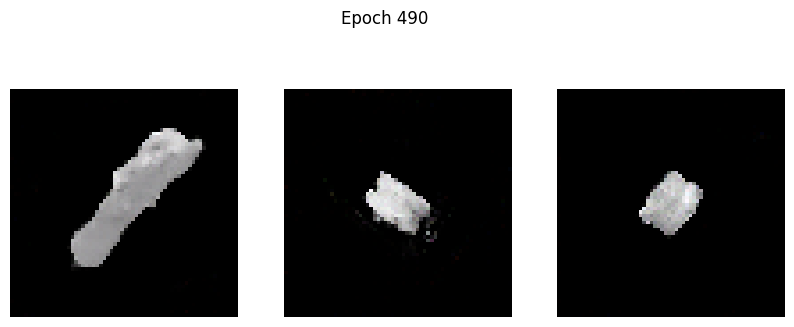

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.1779 - g_loss: 6.3541
Epoch 491/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.1892 - g_loss: 6.6082

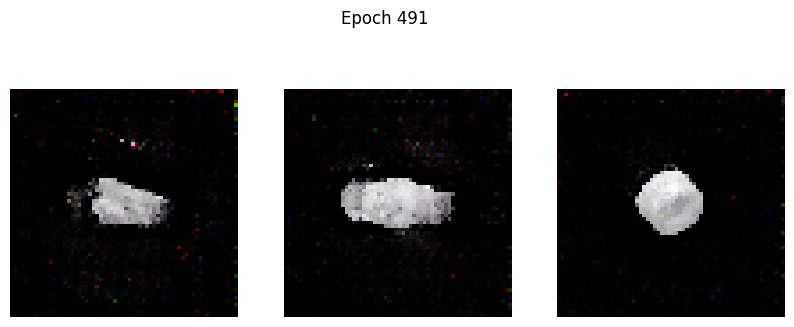

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.1890 - g_loss: 6.6115
Epoch 492/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.1611 - g_loss: 7.2519

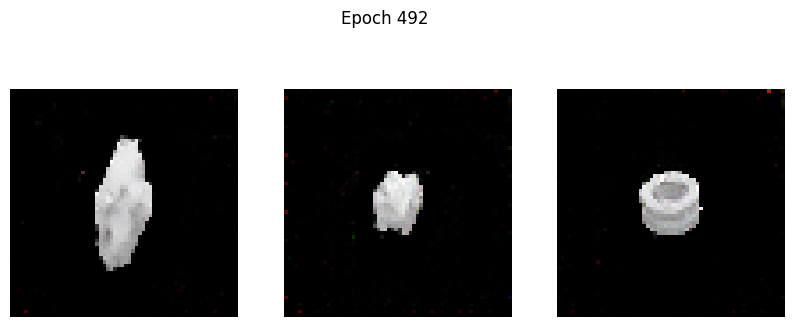

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.1611 - g_loss: 7.2493
Epoch 493/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.1580 - g_loss: 7.0354

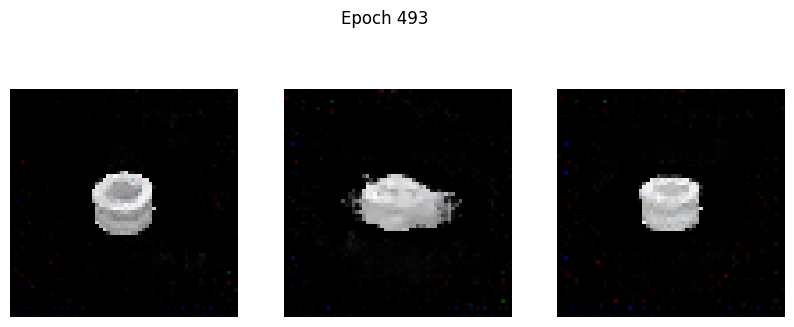

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.1581 - g_loss: 7.0352
Epoch 494/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.2245 - g_loss: 6.6859

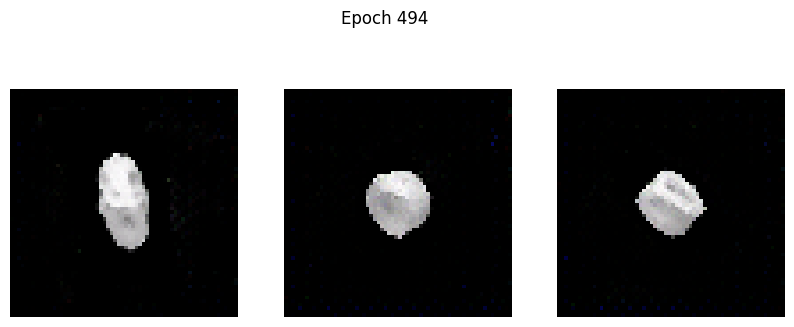

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.2243 - g_loss: 6.6854
Epoch 495/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.1372 - g_loss: 7.5541

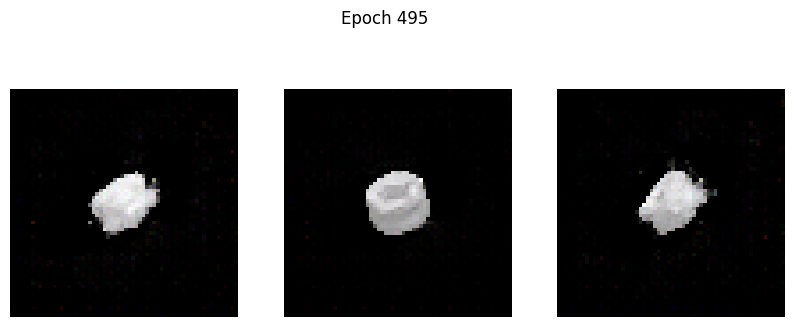

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.1364 - g_loss: 7.5581
Epoch 496/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.0771 - g_loss: 6.9941

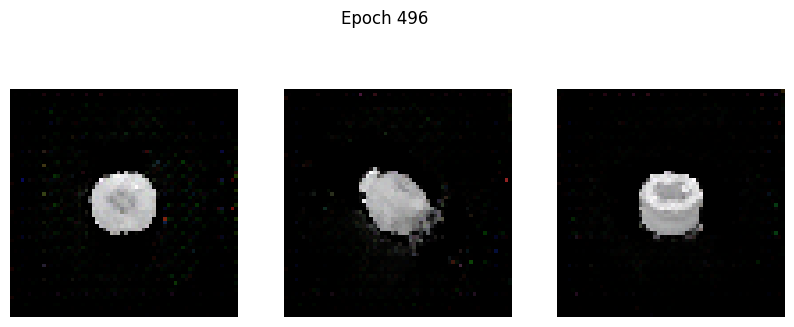

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.0778 - g_loss: 6.9935
Epoch 497/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.1038 - g_loss: 7.2723

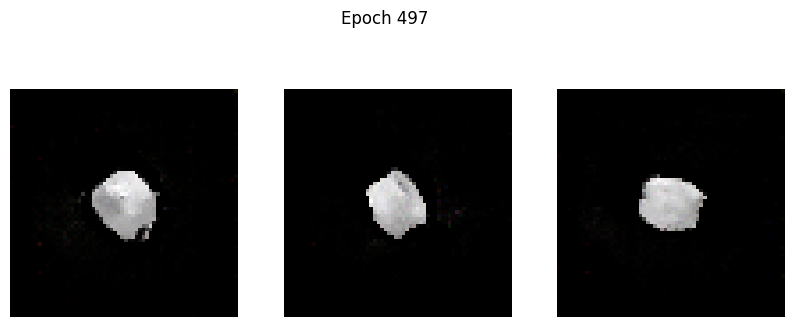

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.1041 - g_loss: 7.2725
Epoch 498/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - d_loss: -0.2659 - g_loss: 6.9286

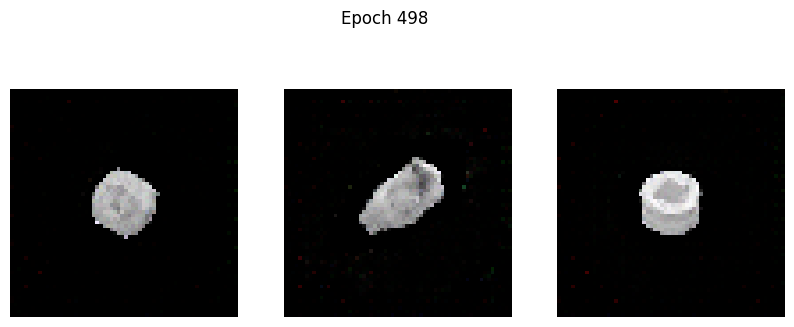

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.2654 - g_loss: 6.9307
Epoch 499/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.1996 - g_loss: 7.2196

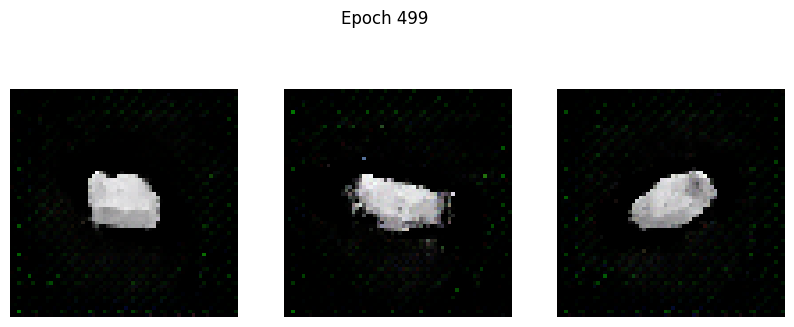

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - d_loss: -0.1994 - g_loss: 7.2185
Epoch 500/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - d_loss: -0.2105 - g_loss: 7.2186

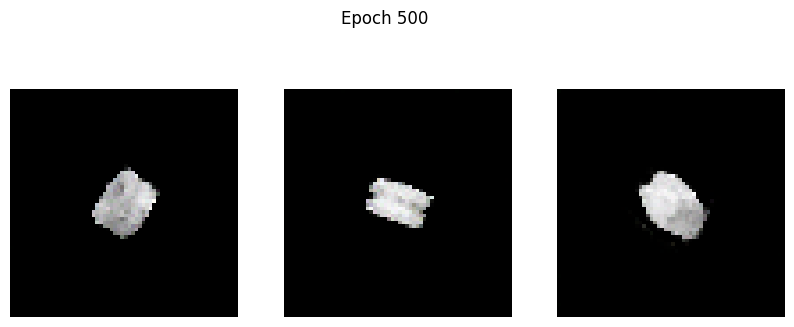

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - d_loss: -0.2098 - g_loss: 7.2222


In [8]:
# Hyperparameters
EPOCHS = 500  # Tambahkan jumlah epoch untuk hasil lebih baik (misal: 100-200)
lr_generator = 0.0002
lr_discriminator = 0.0002

# Inisialisasi DCGAN
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Compile
dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=lr_discriminator, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=lr_generator, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

# Jalankan Training
print("Mulai Training...")
dcgan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=3, latent_dim=latent_dim)]
)

In [9]:
generator.save('generator_model.keras')
print("Generator model saved as 'generator_model.keras'")

Generator model saved as 'generator_model.keras'


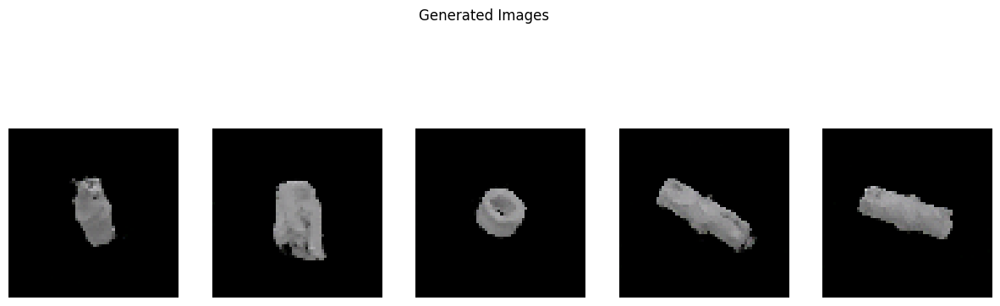

In [10]:
num_generated_images = 5
random_latent_vectors = tf.random.normal(shape=(num_generated_images, latent_dim))

generated_images = generator(random_latent_vectors)
generated_images = (generated_images * 127.5) + 127.5 # Denormalize to [0, 255]
generated_images = tf.cast(generated_images, tf.uint8)

plt.figure(figsize=(15, 5))
for i in range(num_generated_images):
    plt.subplot(1, num_generated_images, i + 1)
    plt.imshow(generated_images[i].numpy())
    plt.axis('off')
plt.suptitle("Generated Images")
plt.show()

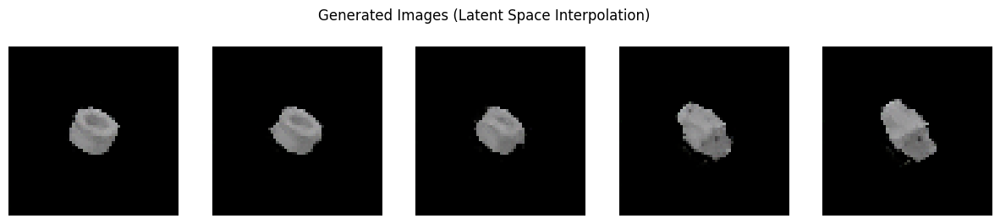

In [11]:
num_interpolation_steps = 5

# Generate two random latent vectors
start_latent_vector = tf.random.normal(shape=(1, latent_dim))
end_latent_vector = tf.random.normal(shape=(1, latent_dim))

# Perform linear interpolation in latent space
interpolated_latent_vectors = []
for i in range(num_interpolation_steps):
    alpha = i / (num_interpolation_steps - 1)
    interpolated_vector = (1 - alpha) * start_latent_vector + alpha * end_latent_vector
    interpolated_latent_vectors.append(interpolated_vector)

interpolated_latent_vectors = tf.concat(interpolated_latent_vectors, axis=0)

# Generate images from the interpolated latent vectors
generated_images_interp = generator(interpolated_latent_vectors)
generated_images_interp = (generated_images_interp * 127.5) + 127.5 # Denormalize to [0, 255]
generated_images_interp = tf.cast(generated_images_interp, tf.uint8)

# Display the interpolated images
plt.figure(figsize=(15, 3))
for i in range(num_interpolation_steps):
    plt.subplot(1, num_interpolation_steps, i + 1)
    plt.imshow(generated_images_interp[i].numpy())
    plt.axis('off')
plt.suptitle("Generated Images (Latent Space Interpolation)")
plt.show()